## ⚙️ Import Libraries

In [30]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.16.1
Keras version: 3.3.3
GPU devices: 2


In [31]:
!pip install segmentation-models-pytorch


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


## ⏳ Load the Data (no outlier)

In [32]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp
from skimage.util import random_noise
from scipy.ndimage import rotate

# Set seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)


# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
# Load dataset
data = np.load("/kaggle/input/cleean-data/cleaned_data.npz")
X_train = data["training_set_filtered"]
y_train = data["masks_filtered"]
X_test = data["test_set"]




Using device: cuda


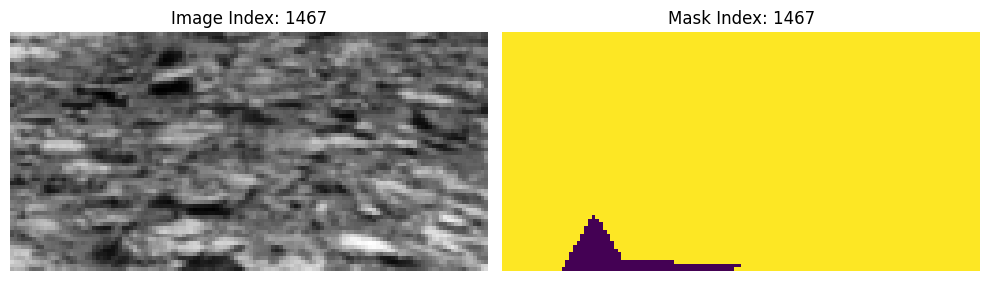

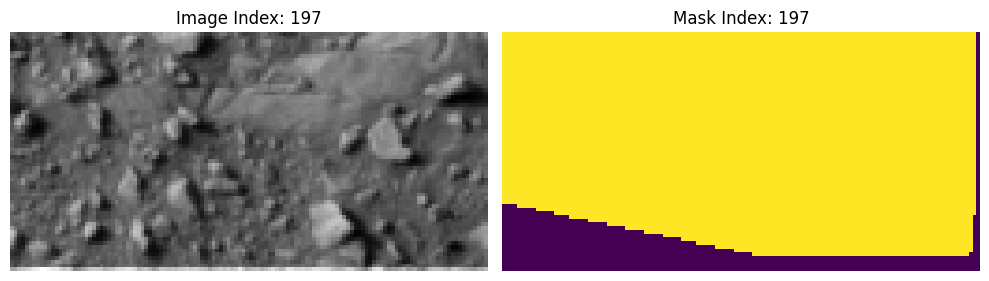

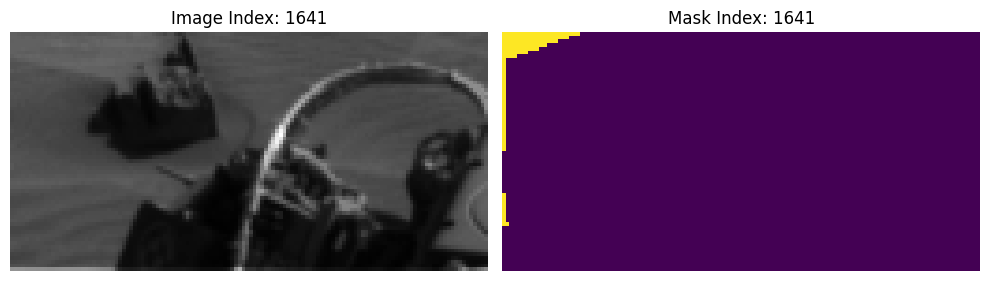

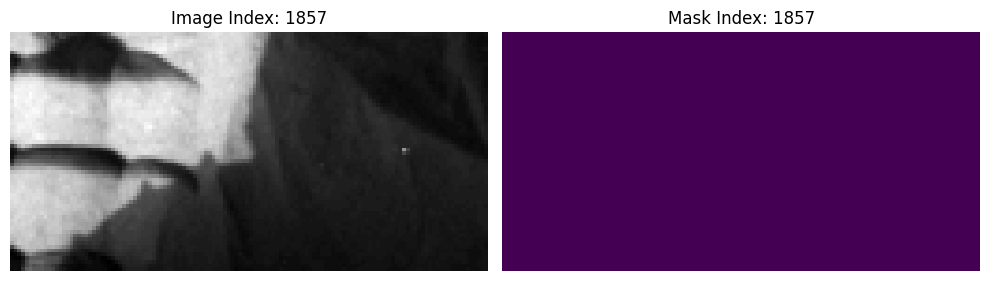

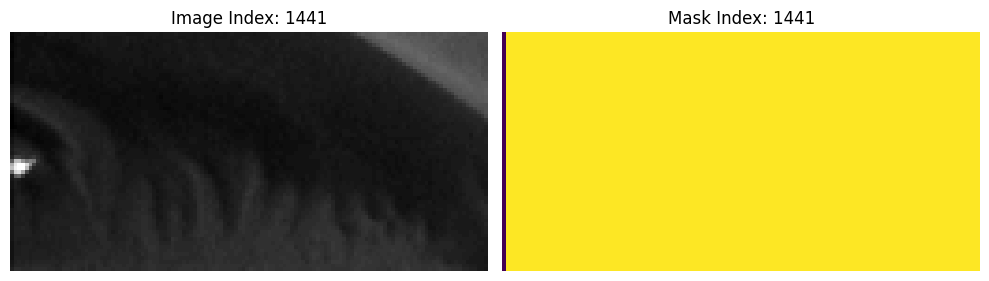

In [33]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis")
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## PYTORCH

In [34]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp
from skimage.util import random_noise
from scipy.ndimage import rotate
from sklearn.metrics import jaccard_score
import torch
import torch.nn as nn

# Set seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)

In [35]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from scipy.ndimage import rotate
import matplotlib.pyplot as plt
from skimage.util import random_noise

# Define hyperparameters
hyperparams = {
    "model": {
        "architecture": "Unet",
        "encoder_name": "mobilenet_v2",
        "encoder_weights": None,
        "input_channels": 1,
        "num_classes": 5,
    },
    "training": {
        "batch_size": 32,
        "learning_rate": 1e-4,
        "num_epochs": 50,
    },
    "loss_function": {
        "type": "WeightedCrossEntropy",
    },
    "data": {
        "augmentation": {
            "rotation_angle": 20,
            "noise_amount": 0.03,
        },
    },
}



In [36]:
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load dataset
data = np.load("/kaggle/input/cleean-data/cleaned_data.npz")
X_train = data["training_set_filtered"]
y_train = data["masks_filtered"]
X_test = data["test_set"]

# Train-validation split
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

"""X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=200, random_state=42
)"""

# Add channel dimension and normalize
X_train = X_train[..., np.newaxis] / 255.0
X_val = X_val[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0



Using device: cuda


In [37]:
# Dataset class
class SegmentationDataset(Dataset):
    def __init__(self, images, masks=None, augmentations=None):
        self.images = images
        self.masks = masks
        self.augmentations = augmentations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx] if self.masks is not None else None

        if self.augmentations:
            image, mask = self.augmentations(image, mask)

        image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)  # (C, H, W)
        mask = torch.tensor(mask, dtype=torch.long) if mask is not None else None
        return (image, mask) if mask is not None else image



In [38]:
from skimage.util import random_noise
from scipy.ndimage import rotate
import numpy as np

# Define individual augmentation functions
def rotate_image_and_mask(image, mask, angle):
    image = rotate(image, angle, reshape=False, mode="constant", order=1)
    mask = rotate(mask, angle, reshape=False, mode="constant", order=0)
    return image, mask

def add_noise_to_image(image, mask, noise_amount):
    image = random_noise(image, mode="s&p", amount=noise_amount)
    return np.clip(image, 0, 1), mask

def invert_image_and_mask(image, mask):
    image = 1.0 - image
    return image, mask

def flip_horizontal(image, mask):
    image = np.fliplr(image)
    mask = np.fliplr(mask)
    return image, mask

def flip_vertical(image, mask):
    image = np.flipud(image)
    mask = np.flipud(mask)
    return image, mask

# Apply augmentations and update X_train and y_train
def apply_augmentations_and_update(X_train, y_train):
    augmented_images = []
    augmented_masks = []

    augmentations = {
        "rotation": lambda img, msk: rotate_image_and_mask(img, msk, angle=np.random.uniform(-20, 20)),
        "noise": lambda img, msk: add_noise_to_image(img, msk, noise_amount=0.03),
        "invert": invert_image_and_mask,
        "horizontal_flip": flip_horizontal,
        "vertical_flip": flip_vertical,
    }

    # Apply each augmentation and collect augmented data
    for aug_name, aug_function in augmentations.items():
        print(f"Applying {aug_name} augmentation...")
        for image, mask in zip(X_train, y_train):
            aug_image, aug_mask = aug_function(image, mask)
            augmented_images.append(aug_image)
            augmented_masks.append(aug_mask)

    # Convert lists to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_masks = np.array(augmented_masks)

    # Update X_train and y_train by concatenating augmented data
    X_train = np.concatenate([X_train, augmented_images], axis=0)
    y_train = np.concatenate([y_train, augmented_masks], axis=0)

    print(f"Updated X_train shape: {X_train.shape}")
    print(f"Updated y_train shape: {y_train.shape}")
    return X_train, y_train

# Apply augmentations and update datasets
X_train, y_train = apply_augmentations_and_update(X_train, y_train)

# DataLoaders
train_dataset = SegmentationDataset(X_train, y_train)
val_dataset = SegmentationDataset(X_val, y_val)
train_loader = DataLoader(train_dataset, batch_size=hyperparams["training"]["batch_size"], shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)


Applying rotation augmentation...
Applying noise augmentation...
Applying invert augmentation...
Applying horizontal_flip augmentation...
Applying vertical_flip augmentation...
Updated X_train shape: (12024, 64, 128, 1)
Updated y_train shape: (12024, 64, 128)


In [39]:
import numpy as np

def compute_class_weights(masks, num_classes):
    masks_flat = masks.astype(np.int64).reshape(-1)  # Ensure integer type for bincount
    pixel_counts = np.bincount(masks_flat, minlength=num_classes)
    total_pixels = pixel_counts.sum()
    weights = total_pixels / (pixel_counts + 1e-6)  # Avoid division by zero
    return weights / weights.sum()

# Example usage
class_weights = compute_class_weights(y_train, hyperparams["model"]["num_classes"])
print("Computed class weights:", class_weights)


Computed class weights: [0.0048763  0.00375431 0.00528551 0.00701482 0.97906907]


In [40]:
import torch
import numpy as np

def calculate_mean_iou(y_true, y_pred, num_classes, ignore_class=0):
    """
    Calculate mean IoU and per-class IoU.

    Args:
        y_true (torch.Tensor): Ground truth masks of shape (N, H, W).
        y_pred (torch.Tensor): Predicted masks of shape (N, H, W).
        num_classes (int): Total number of classes.
        ignore_class (int): Class to ignore in IoU calculations.

    Returns:
        float: Mean IoU.
        dict: Per-class IoU.
    """
    ious = []
    class_ious = {}

    for c in range(num_classes):
        if c == ignore_class:
            continue

        y_true_c = (y_true == c).int()
        y_pred_c = (y_pred == c).int()

        intersection = (y_true_c & y_pred_c).sum().item()
        union = (y_true_c | y_pred_c).sum().item()

        iou = intersection / union if union > 0 else 0.0
        ious.append(iou)
        class_ious[c] = iou

    mean_iou = np.mean(ious) if ious else 0.0
    return mean_iou, class_ious


Epoch 1/50, Train Loss: 565.9871, Val Loss: 10.2205, Mean IoU: 0.2244
Class 0 IoU: 0.1866
Class 1 IoU: 0.2868
Class 2 IoU: 0.4054
Class 3 IoU: 0.0188


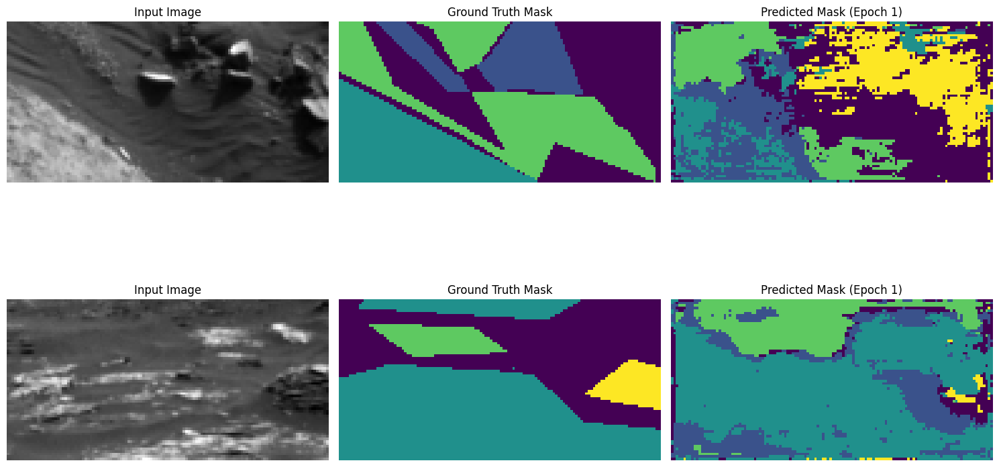

Model saved with new best Mean IoU: 0.2244
Epoch 2/50, Train Loss: 516.4236, Val Loss: 9.6026, Mean IoU: 0.2601
Class 0 IoU: 0.2675
Class 1 IoU: 0.2904
Class 2 IoU: 0.4687
Class 3 IoU: 0.0139


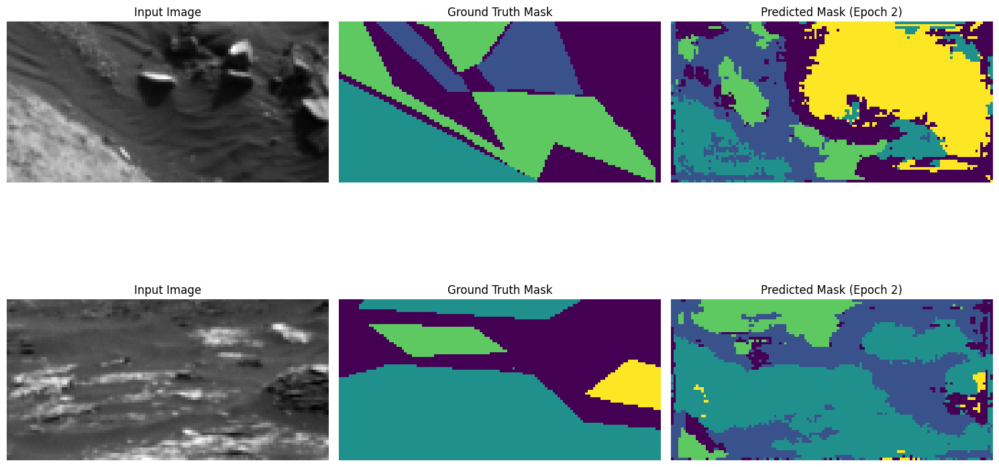

Model saved with new best Mean IoU: 0.2601
Epoch 3/50, Train Loss: 496.8691, Val Loss: 9.2639, Mean IoU: 0.2653
Class 0 IoU: 0.2691
Class 1 IoU: 0.2904
Class 2 IoU: 0.4828
Class 3 IoU: 0.0189


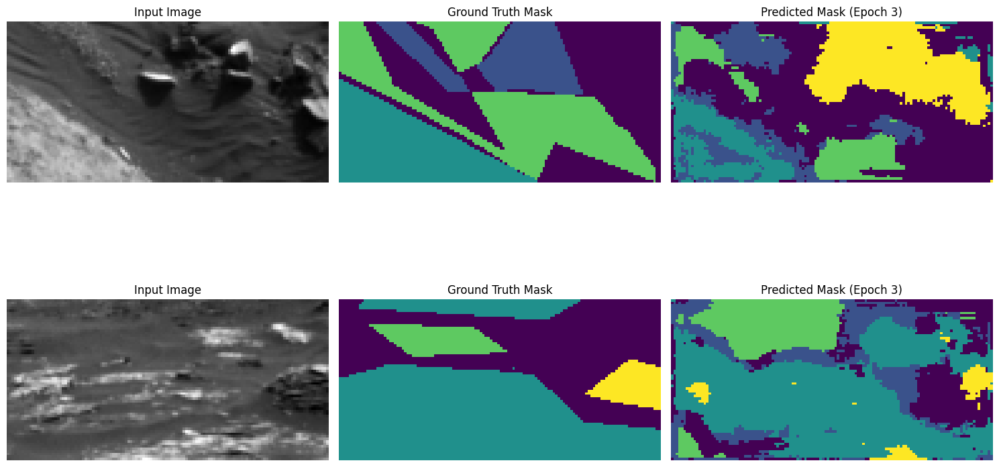

Model saved with new best Mean IoU: 0.2653
Epoch 4/50, Train Loss: 484.1457, Val Loss: 9.0775, Mean IoU: 0.2628
Class 0 IoU: 0.2524
Class 1 IoU: 0.3016
Class 2 IoU: 0.4787
Class 3 IoU: 0.0183


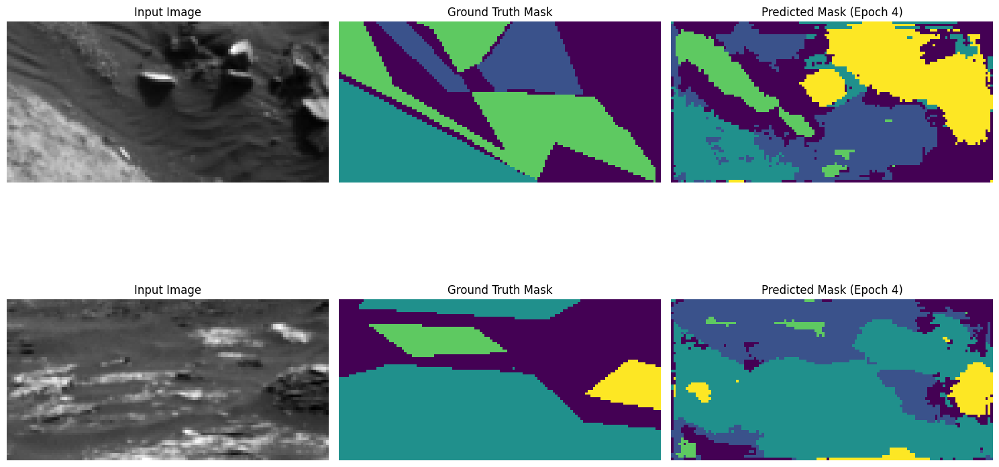

Epoch 5/50, Train Loss: 478.0835, Val Loss: 8.9683, Mean IoU: 0.2610
Class 0 IoU: 0.2399
Class 1 IoU: 0.2946
Class 2 IoU: 0.4933
Class 3 IoU: 0.0160


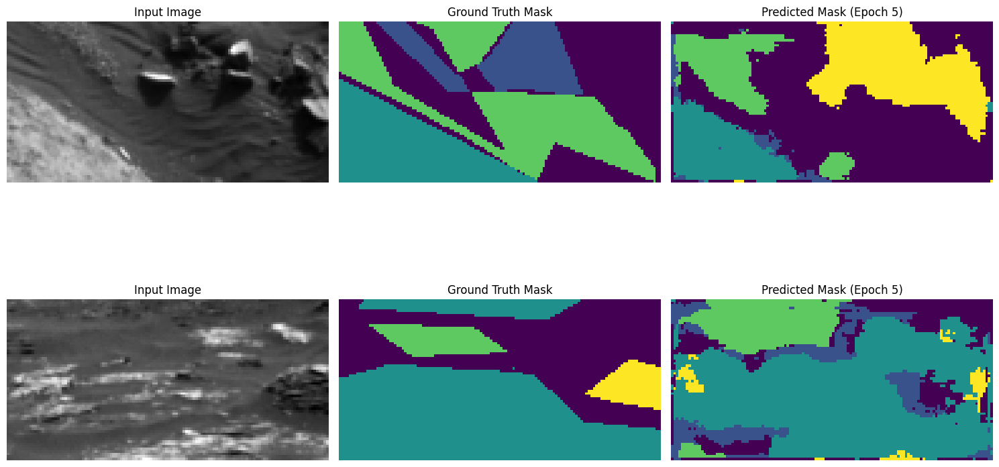

Epoch 6/50, Train Loss: 468.2633, Val Loss: 8.9200, Mean IoU: 0.2829
Class 0 IoU: 0.2971
Class 1 IoU: 0.2988
Class 2 IoU: 0.5176
Class 3 IoU: 0.0179


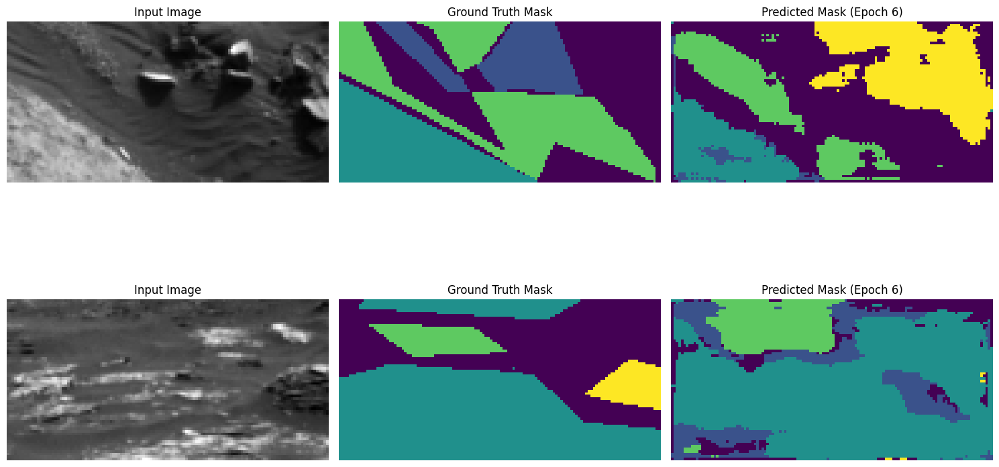

Model saved with new best Mean IoU: 0.2829
Epoch 7/50, Train Loss: 454.4106, Val Loss: 8.6250, Mean IoU: 0.2776
Class 0 IoU: 0.3043
Class 1 IoU: 0.2873
Class 2 IoU: 0.5052
Class 3 IoU: 0.0137


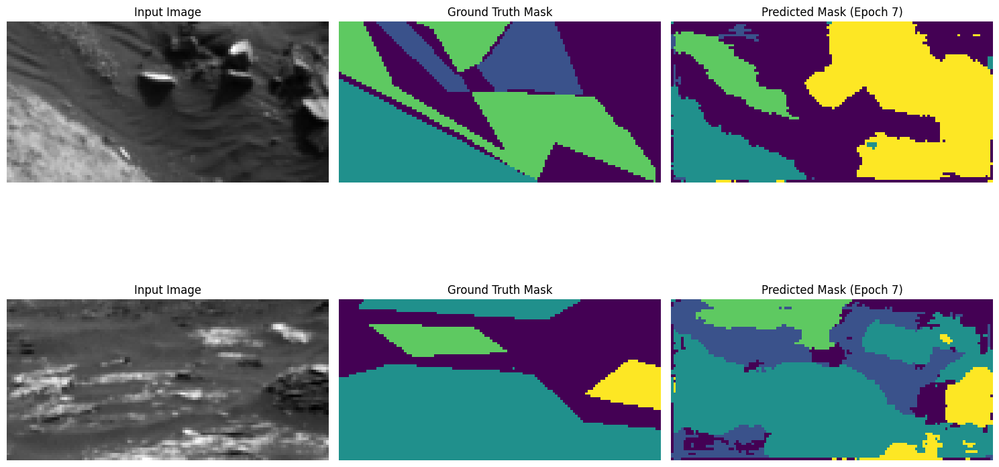

Epoch 8/50, Train Loss: 451.3814, Val Loss: 8.4566, Mean IoU: 0.2859
Class 0 IoU: 0.3330
Class 1 IoU: 0.2683
Class 2 IoU: 0.5305
Class 3 IoU: 0.0120


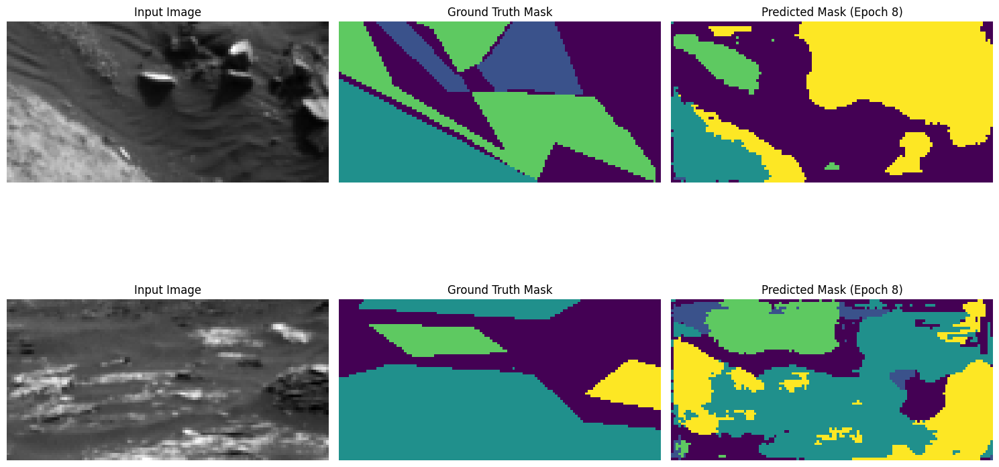

Model saved with new best Mean IoU: 0.2859
Epoch 9/50, Train Loss: 440.3198, Val Loss: 8.2576, Mean IoU: 0.2904
Class 0 IoU: 0.3772
Class 1 IoU: 0.2658
Class 2 IoU: 0.5041
Class 3 IoU: 0.0144


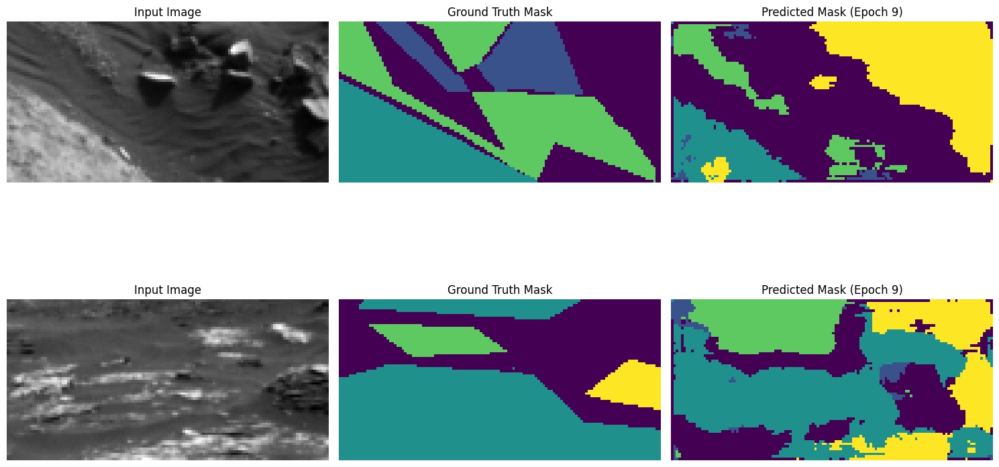

Model saved with new best Mean IoU: 0.2904
Epoch 10/50, Train Loss: 432.9579, Val Loss: 8.0698, Mean IoU: 0.3141
Class 0 IoU: 0.4203
Class 1 IoU: 0.2882
Class 2 IoU: 0.5280
Class 3 IoU: 0.0200


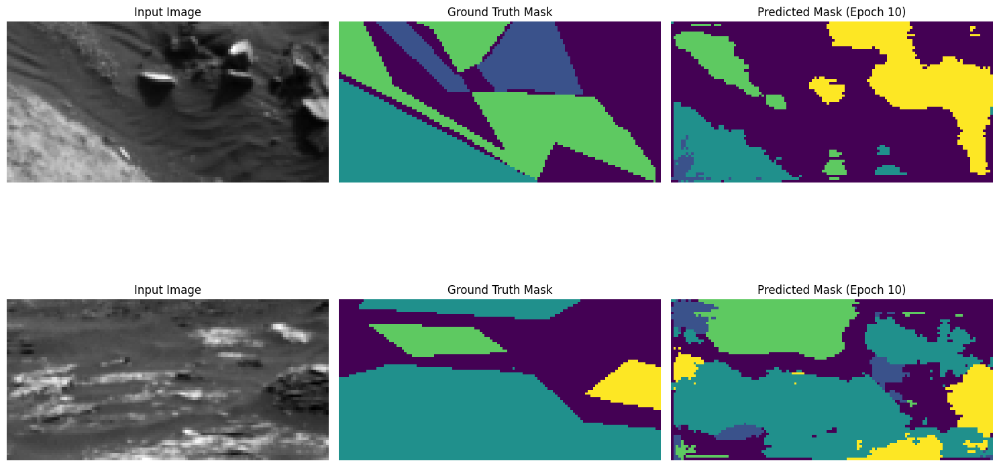

Model saved with new best Mean IoU: 0.3141
Epoch 11/50, Train Loss: 421.4824, Val Loss: 7.9683, Mean IoU: 0.3058
Class 0 IoU: 0.4018
Class 1 IoU: 0.2925
Class 2 IoU: 0.5040
Class 3 IoU: 0.0249


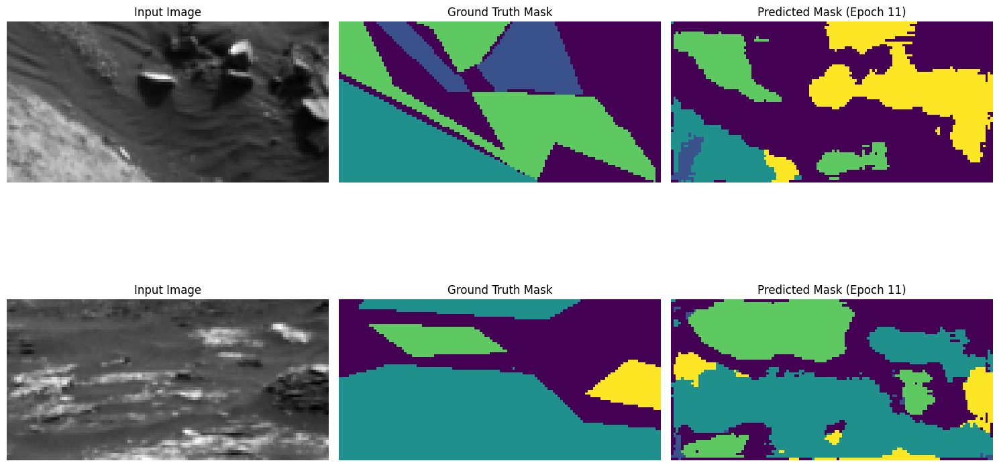

Epoch 12/50, Train Loss: 417.4104, Val Loss: 7.9553, Mean IoU: 0.3175
Class 0 IoU: 0.4091
Class 1 IoU: 0.2879
Class 2 IoU: 0.5523
Class 3 IoU: 0.0206


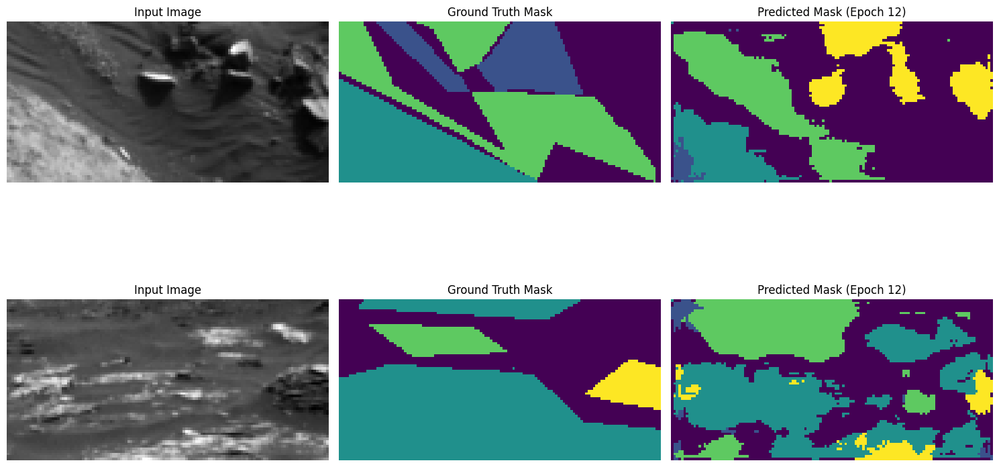

Model saved with new best Mean IoU: 0.3175
Epoch 13/50, Train Loss: 407.5697, Val Loss: 8.0131, Mean IoU: 0.3224
Class 0 IoU: 0.4398
Class 1 IoU: 0.2901
Class 2 IoU: 0.5387
Class 3 IoU: 0.0208


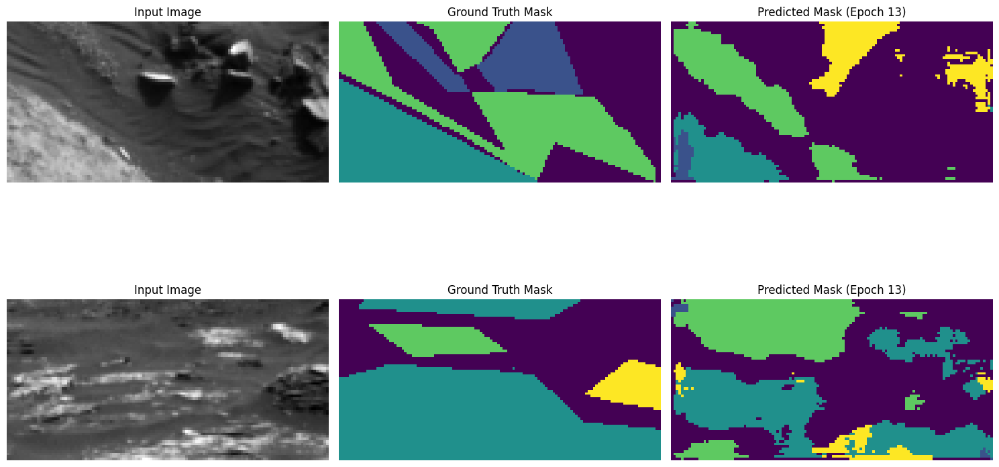

Model saved with new best Mean IoU: 0.3224
Epoch 14/50, Train Loss: 401.3581, Val Loss: 7.8352, Mean IoU: 0.3325
Class 0 IoU: 0.4331
Class 1 IoU: 0.3204
Class 2 IoU: 0.5509
Class 3 IoU: 0.0254


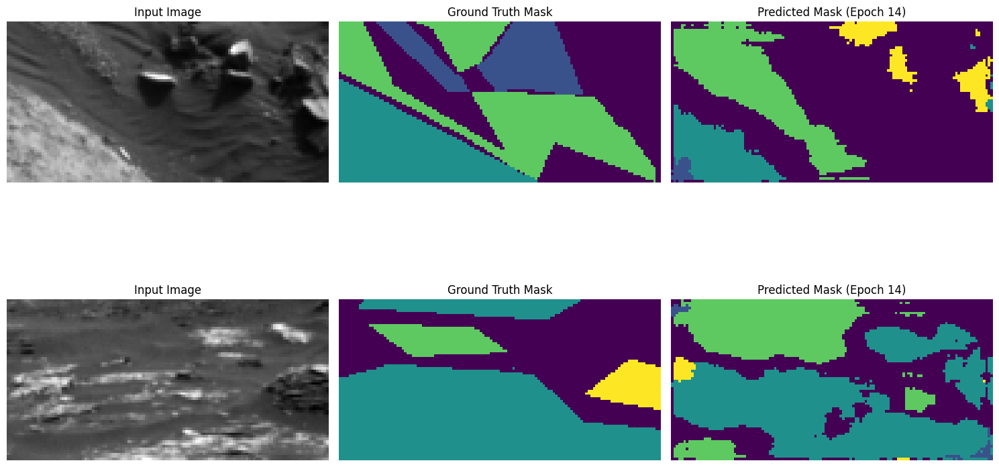

Model saved with new best Mean IoU: 0.3325
Epoch 15/50, Train Loss: 403.3480, Val Loss: 7.7526, Mean IoU: 0.3440
Class 0 IoU: 0.4646
Class 1 IoU: 0.3351
Class 2 IoU: 0.5474
Class 3 IoU: 0.0287


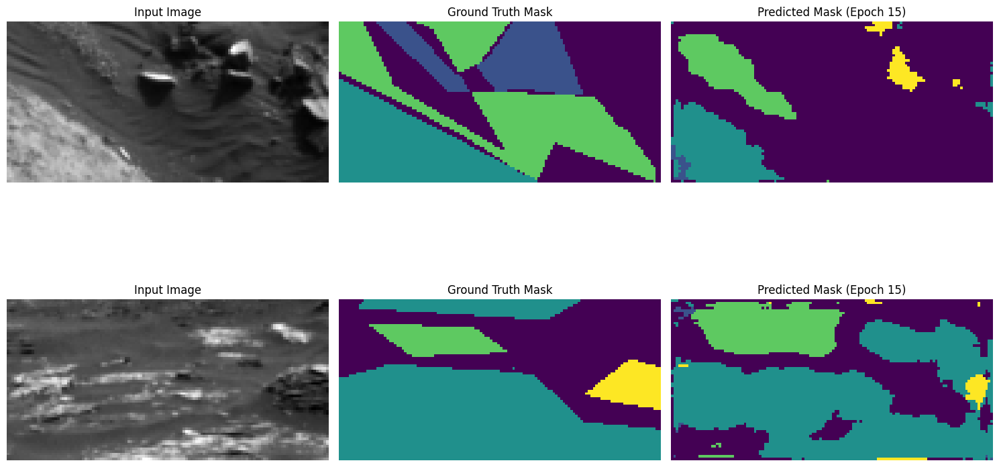

Model saved with new best Mean IoU: 0.3440
Epoch 16/50, Train Loss: 389.3282, Val Loss: 7.7745, Mean IoU: 0.3430
Class 0 IoU: 0.4677
Class 1 IoU: 0.3176
Class 2 IoU: 0.5584
Class 3 IoU: 0.0283


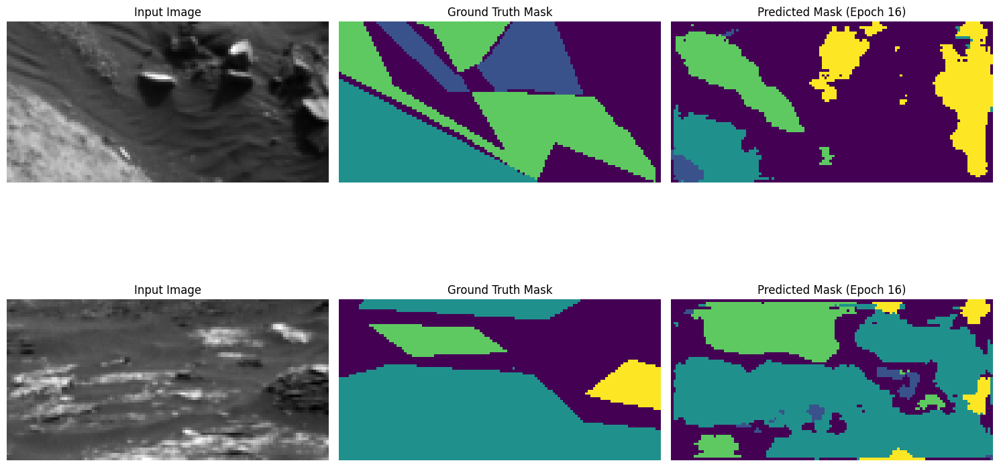

Epoch 17/50, Train Loss: 387.6123, Val Loss: 7.6837, Mean IoU: 0.3519
Class 0 IoU: 0.4746
Class 1 IoU: 0.3325
Class 2 IoU: 0.5551
Class 3 IoU: 0.0455


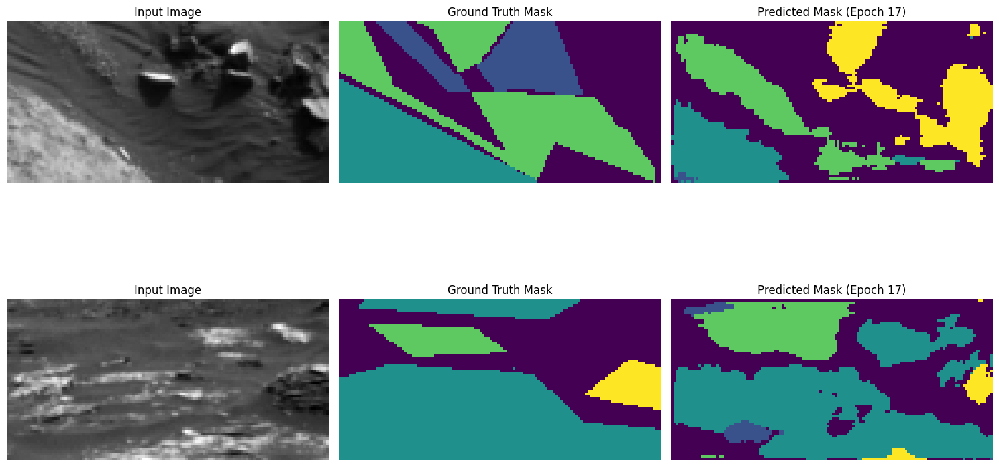

Model saved with new best Mean IoU: 0.3519
Epoch 18/50, Train Loss: 381.2675, Val Loss: 7.5821, Mean IoU: 0.3453
Class 0 IoU: 0.4567
Class 1 IoU: 0.3348
Class 2 IoU: 0.5541
Class 3 IoU: 0.0356


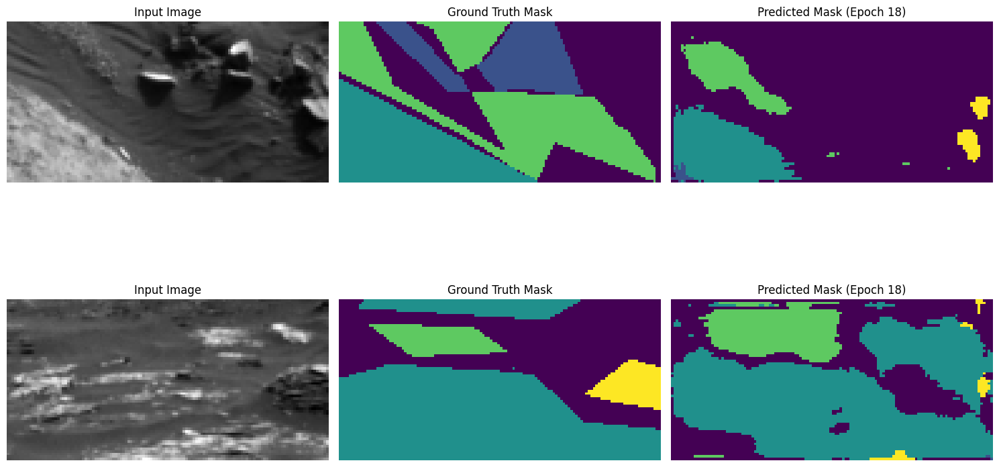

Epoch 19/50, Train Loss: 375.7074, Val Loss: 7.5181, Mean IoU: 0.3491
Class 0 IoU: 0.4829
Class 1 IoU: 0.3343
Class 2 IoU: 0.5492
Class 3 IoU: 0.0298


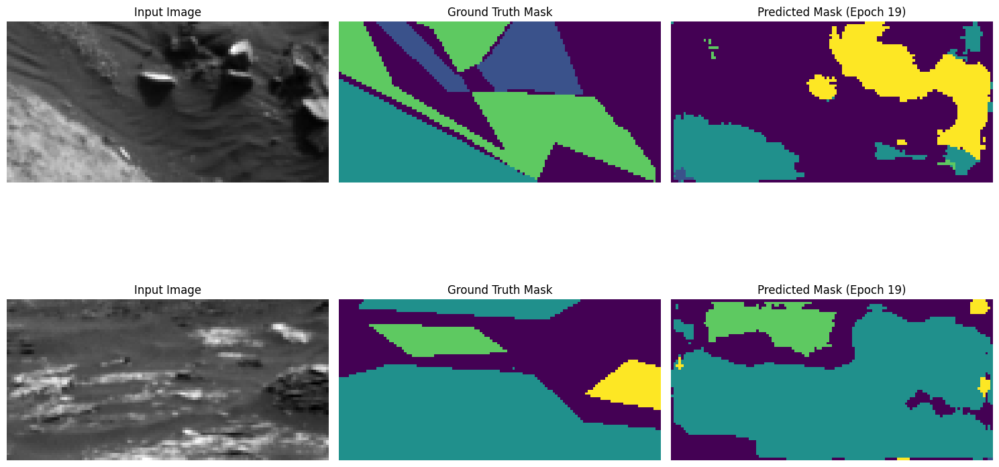

Epoch 20/50, Train Loss: 371.0904, Val Loss: 8.6224, Mean IoU: 0.3358
Class 0 IoU: 0.4625
Class 1 IoU: 0.3280
Class 2 IoU: 0.5318
Class 3 IoU: 0.0209


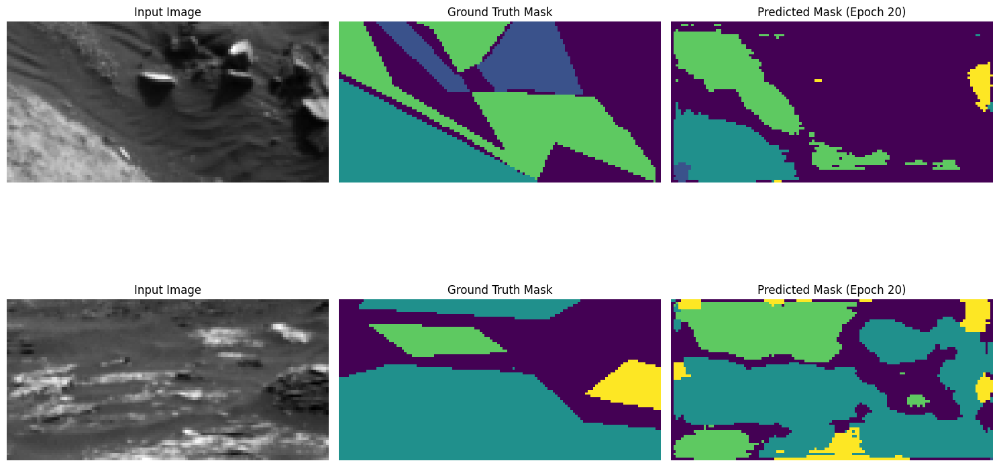

Epoch 21/50, Train Loss: 368.4233, Val Loss: 9.0131, Mean IoU: 0.3639
Class 0 IoU: 0.5236
Class 1 IoU: 0.3436
Class 2 IoU: 0.5625
Class 3 IoU: 0.0259


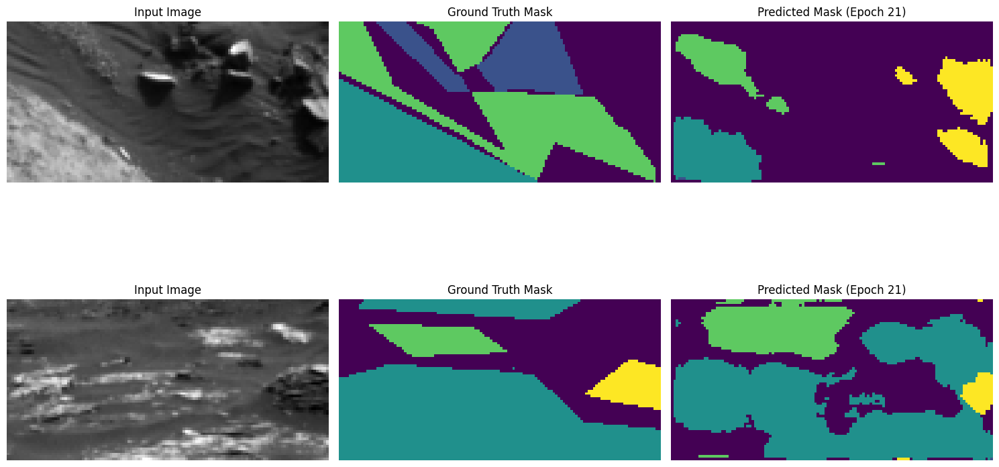

Model saved with new best Mean IoU: 0.3639
Epoch 22/50, Train Loss: 357.4235, Val Loss: 8.8750, Mean IoU: 0.3597
Class 0 IoU: 0.5001
Class 1 IoU: 0.3671
Class 2 IoU: 0.5509
Class 3 IoU: 0.0208


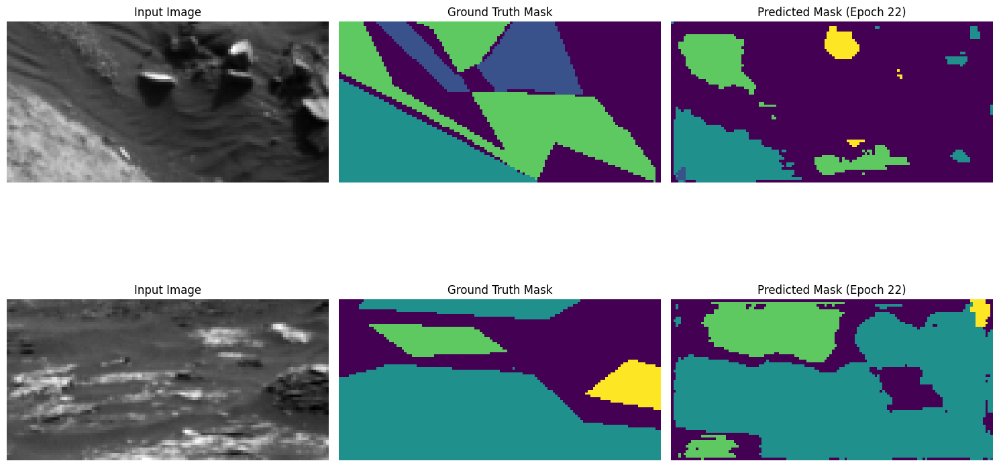

Epoch 23/50, Train Loss: 358.4063, Val Loss: 8.2560, Mean IoU: 0.3617
Class 0 IoU: 0.4978
Class 1 IoU: 0.3634
Class 2 IoU: 0.5497
Class 3 IoU: 0.0358


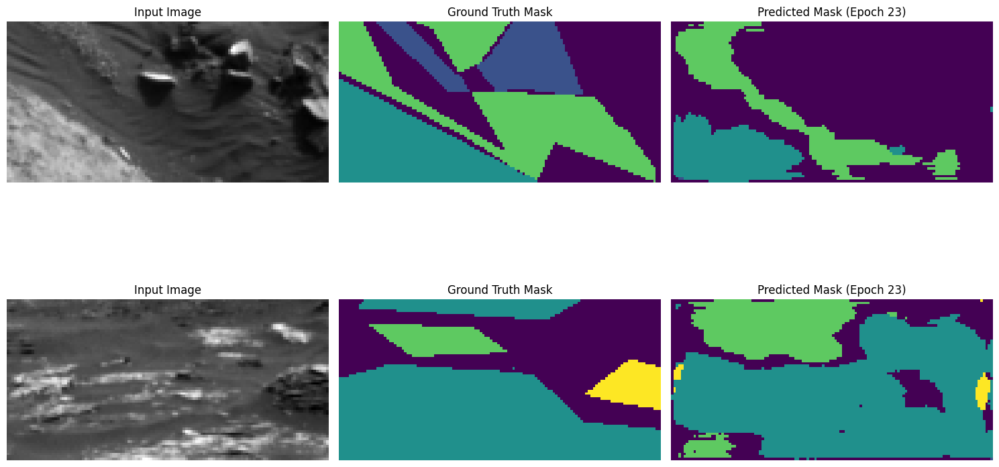

Epoch 24/50, Train Loss: 352.1689, Val Loss: 9.3532, Mean IoU: 0.3667
Class 0 IoU: 0.5271
Class 1 IoU: 0.3719
Class 2 IoU: 0.5434
Class 3 IoU: 0.0246


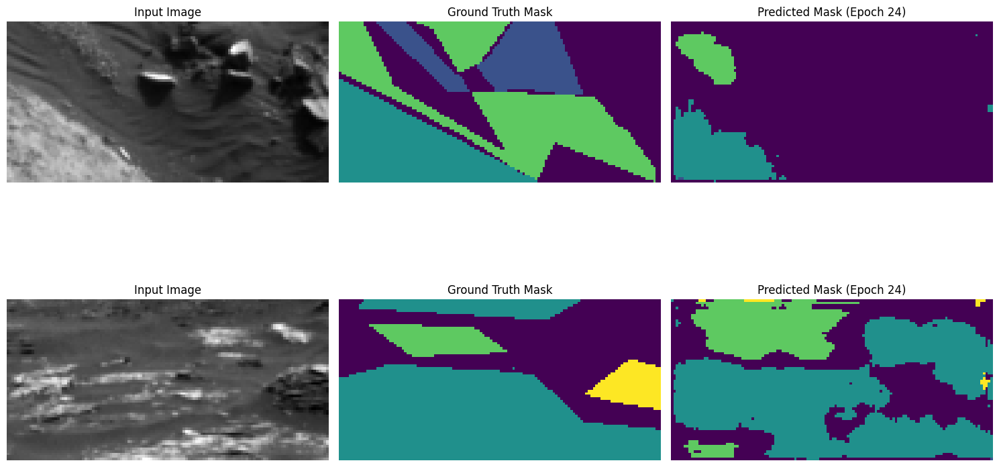

Model saved with new best Mean IoU: 0.3667
Epoch 25/50, Train Loss: 368.1817, Val Loss: 7.2962, Mean IoU: 0.3686
Class 0 IoU: 0.5309
Class 1 IoU: 0.3622
Class 2 IoU: 0.5573
Class 3 IoU: 0.0240


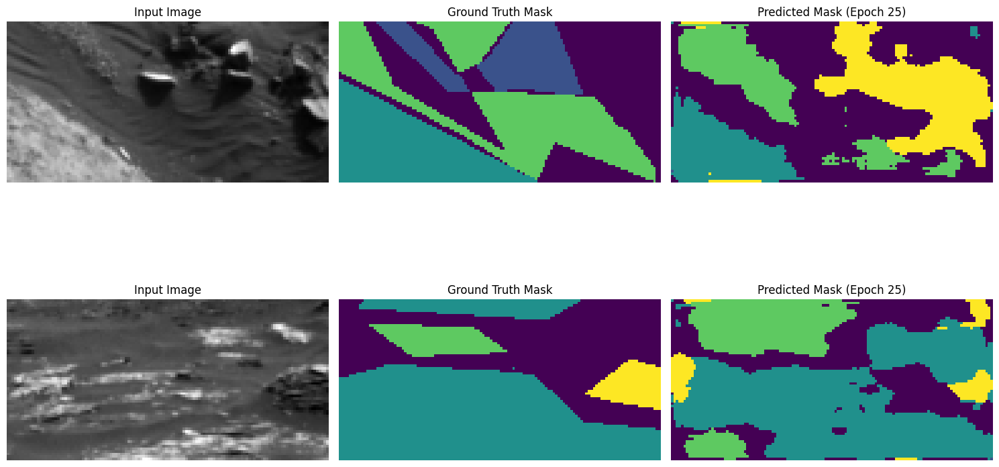

Model saved with new best Mean IoU: 0.3686
Epoch 26/50, Train Loss: 349.8667, Val Loss: 9.1513, Mean IoU: 0.3745
Class 0 IoU: 0.5415
Class 1 IoU: 0.3824
Class 2 IoU: 0.5560
Class 3 IoU: 0.0182


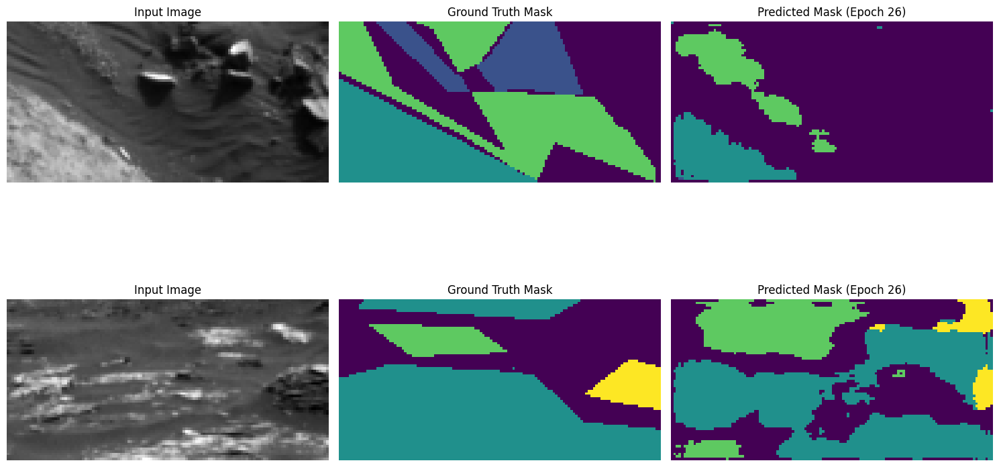

Model saved with new best Mean IoU: 0.3745
Epoch 27/50, Train Loss: 348.3331, Val Loss: 8.5812, Mean IoU: 0.3719
Class 0 IoU: 0.5137
Class 1 IoU: 0.3847
Class 2 IoU: 0.5624
Class 3 IoU: 0.0267


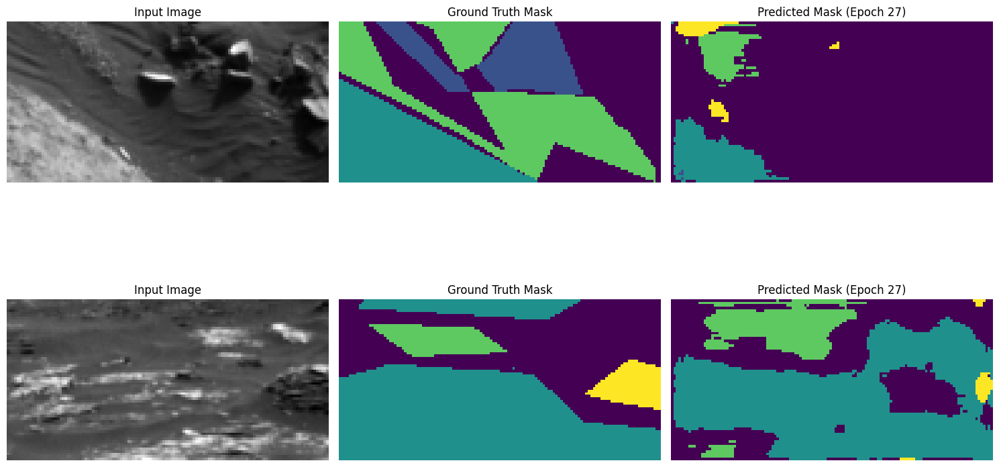

Epoch 28/50, Train Loss: 351.1644, Val Loss: 9.5213, Mean IoU: 0.3801
Class 0 IoU: 0.5530
Class 1 IoU: 0.3868
Class 2 IoU: 0.5683
Class 3 IoU: 0.0124


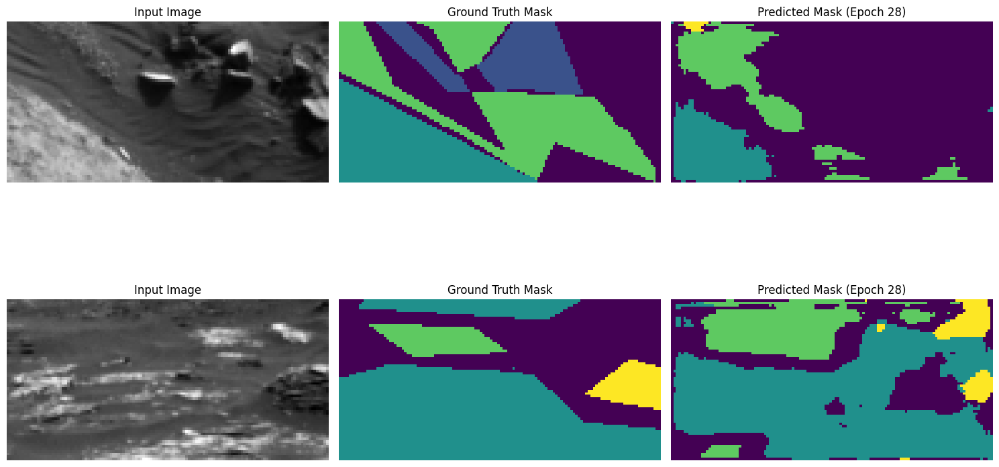

Model saved with new best Mean IoU: 0.3801
Epoch 29/50, Train Loss: 340.5829, Val Loss: 9.4498, Mean IoU: 0.3901
Class 0 IoU: 0.5649
Class 1 IoU: 0.3976
Class 2 IoU: 0.5807
Class 3 IoU: 0.0172


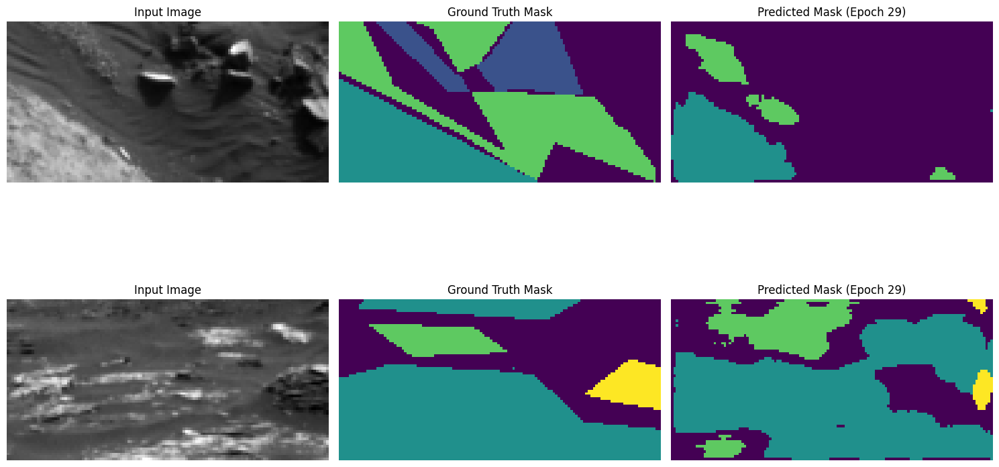

Model saved with new best Mean IoU: 0.3901
Epoch 30/50, Train Loss: 338.2016, Val Loss: 10.0043, Mean IoU: 0.3719
Class 0 IoU: 0.5316
Class 1 IoU: 0.3924
Class 2 IoU: 0.5475
Class 3 IoU: 0.0161


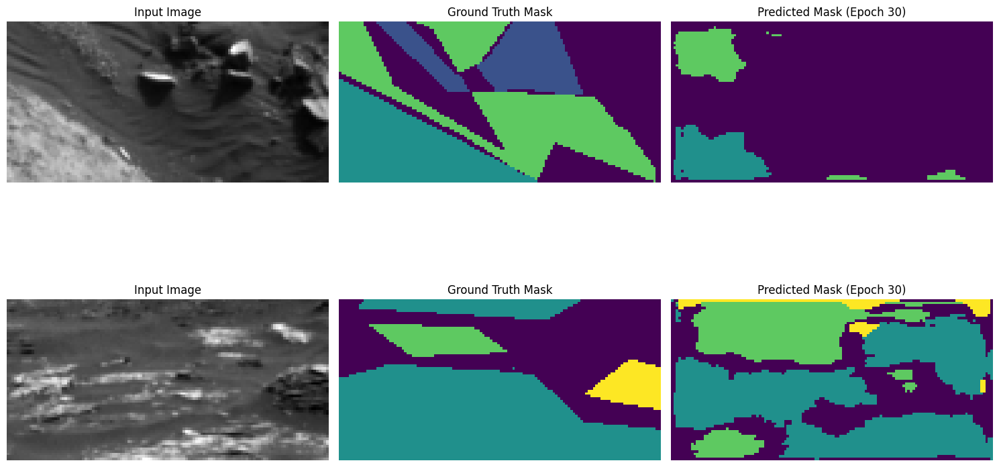

Epoch 31/50, Train Loss: 331.5658, Val Loss: 9.6070, Mean IoU: 0.3914
Class 0 IoU: 0.5714
Class 1 IoU: 0.4008
Class 2 IoU: 0.5737
Class 3 IoU: 0.0200


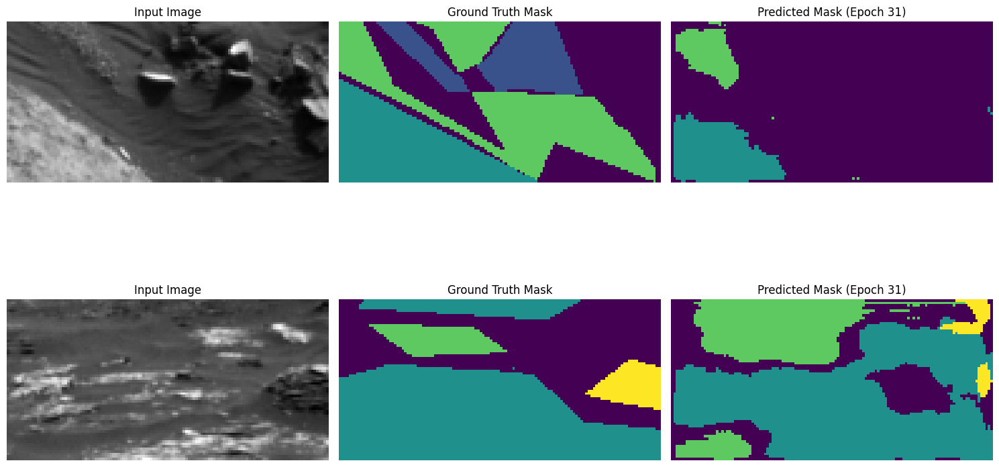

Model saved with new best Mean IoU: 0.3914
Epoch 32/50, Train Loss: 336.5297, Val Loss: 9.2126, Mean IoU: 0.4030
Class 0 IoU: 0.5782
Class 1 IoU: 0.4141
Class 2 IoU: 0.5820
Class 3 IoU: 0.0378


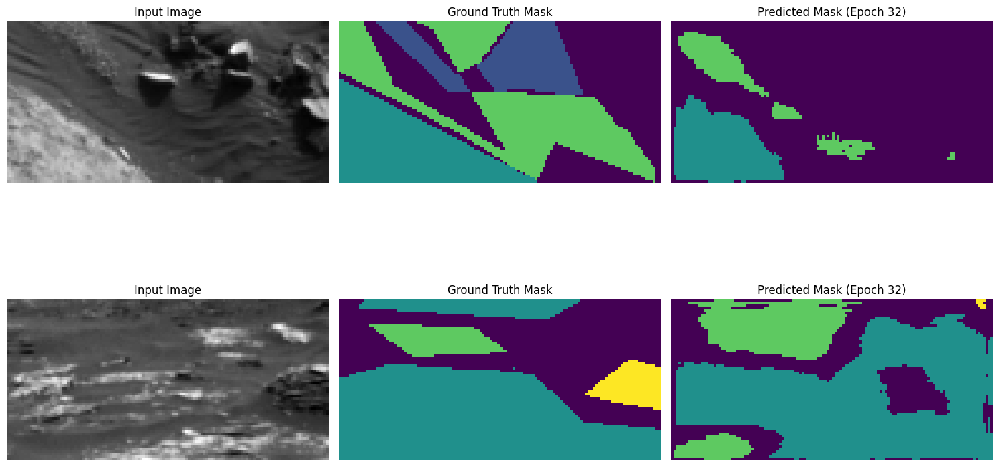

Model saved with new best Mean IoU: 0.4030
Epoch 33/50, Train Loss: 331.9770, Val Loss: 8.4681, Mean IoU: 0.4056
Class 0 IoU: 0.5874
Class 1 IoU: 0.4243
Class 2 IoU: 0.5772
Class 3 IoU: 0.0335


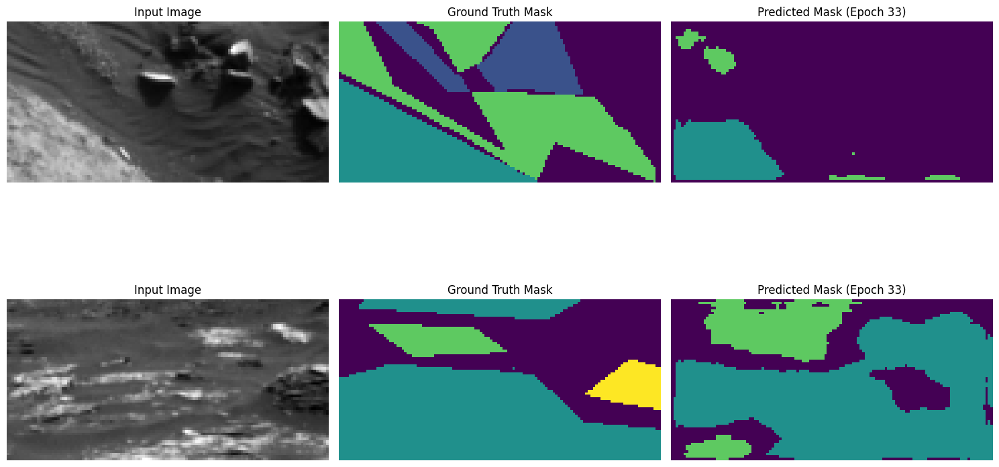

Model saved with new best Mean IoU: 0.4056
Epoch 34/50, Train Loss: 329.2285, Val Loss: 7.9428, Mean IoU: 0.3888
Class 0 IoU: 0.5631
Class 1 IoU: 0.4021
Class 2 IoU: 0.5738
Class 3 IoU: 0.0161


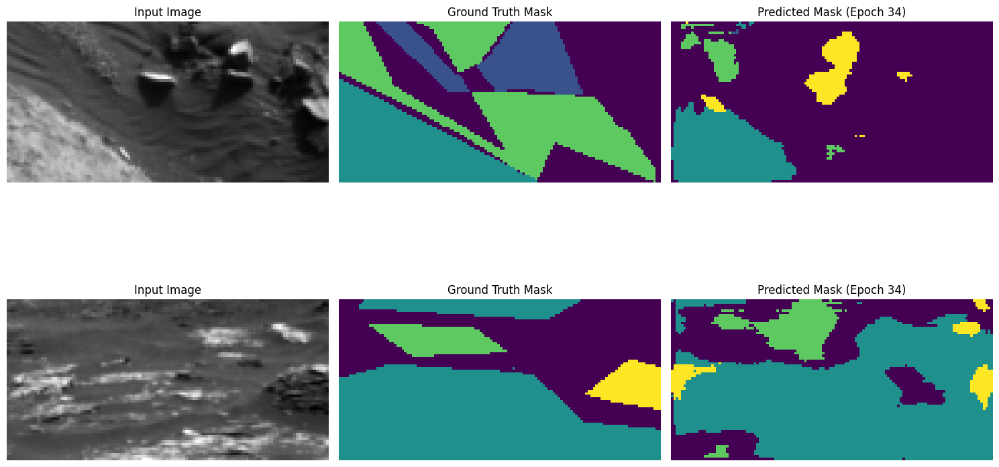

Epoch 35/50, Train Loss: 317.7191, Val Loss: 10.1432, Mean IoU: 0.3965
Class 0 IoU: 0.5797
Class 1 IoU: 0.4231
Class 2 IoU: 0.5618
Class 3 IoU: 0.0214


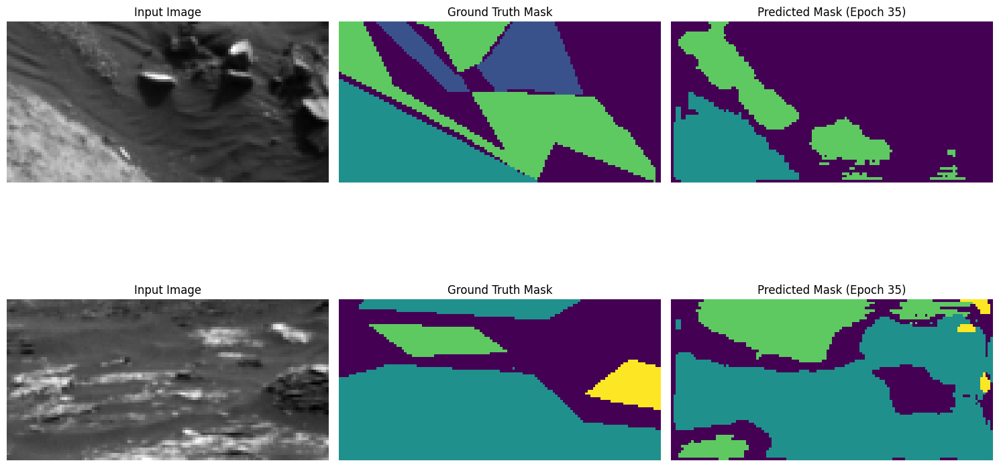

Epoch 36/50, Train Loss: 309.1876, Val Loss: 10.4039, Mean IoU: 0.4057
Class 0 IoU: 0.5893
Class 1 IoU: 0.4411
Class 2 IoU: 0.5768
Class 3 IoU: 0.0157


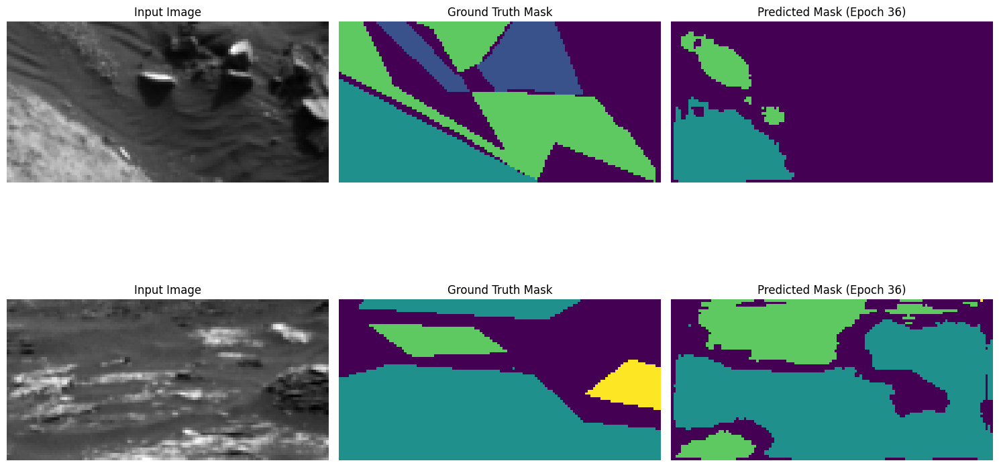

Model saved with new best Mean IoU: 0.4057
Epoch 37/50, Train Loss: 310.6183, Val Loss: 8.3627, Mean IoU: 0.4152
Class 0 IoU: 0.5907
Class 1 IoU: 0.4445
Class 2 IoU: 0.5842
Class 3 IoU: 0.0415


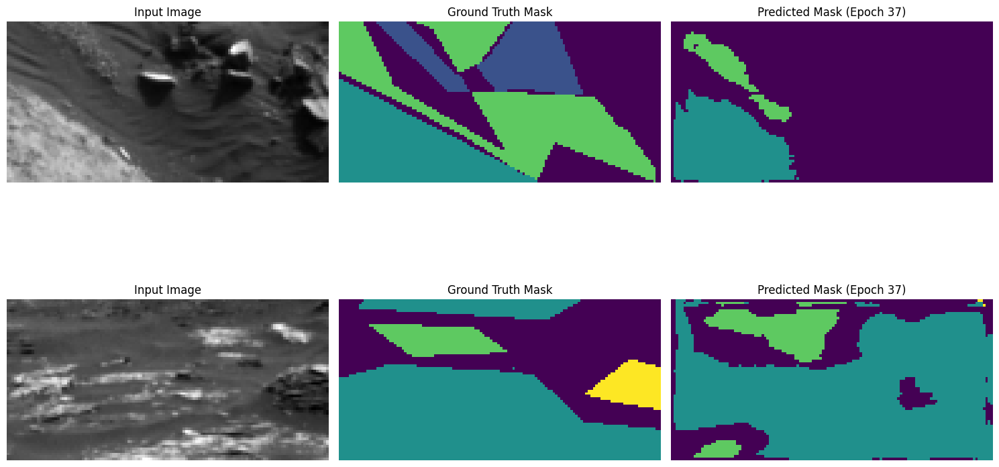

Model saved with new best Mean IoU: 0.4152
Epoch 38/50, Train Loss: 316.1480, Val Loss: 9.3387, Mean IoU: 0.3893
Class 0 IoU: 0.5591
Class 1 IoU: 0.4015
Class 2 IoU: 0.5756
Class 3 IoU: 0.0208


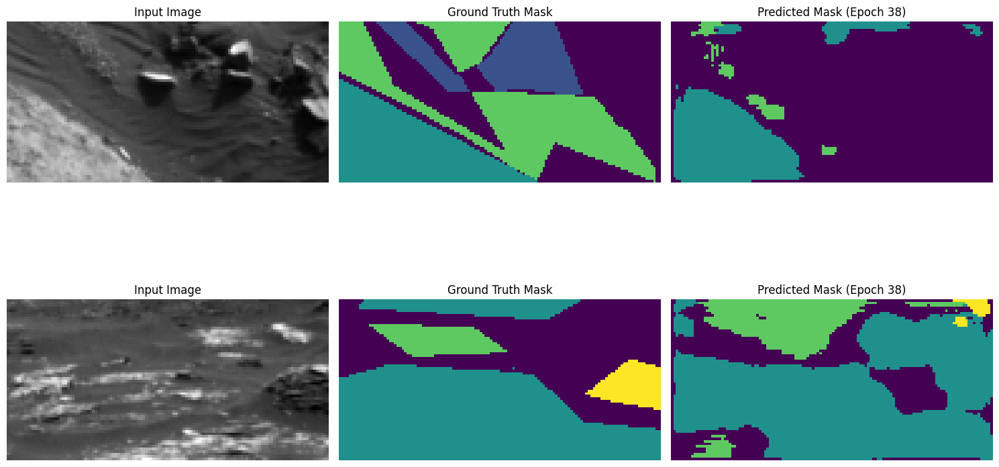

Epoch 39/50, Train Loss: 320.0538, Val Loss: 8.4953, Mean IoU: 0.4091
Class 0 IoU: 0.6006
Class 1 IoU: 0.4368
Class 2 IoU: 0.5775
Class 3 IoU: 0.0216


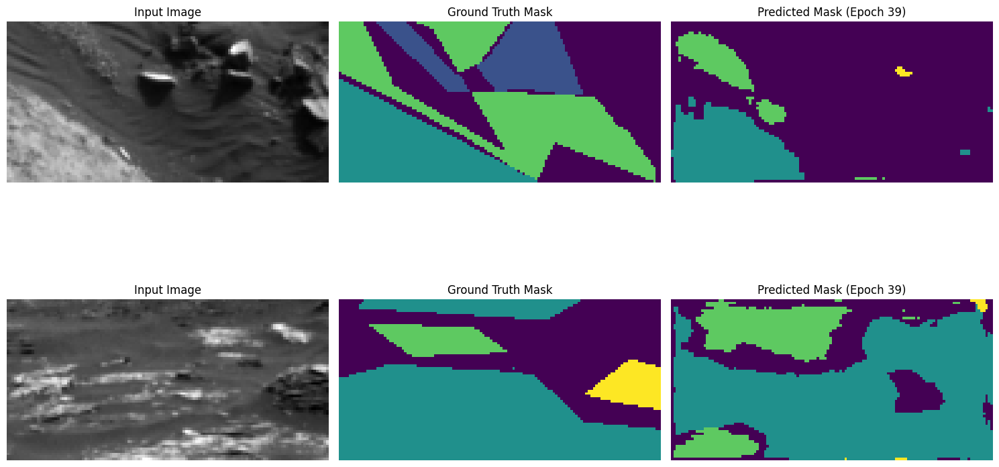

Epoch 40/50, Train Loss: 309.2271, Val Loss: 10.6467, Mean IoU: 0.4183
Class 0 IoU: 0.6086
Class 1 IoU: 0.4376
Class 2 IoU: 0.5926
Class 3 IoU: 0.0345


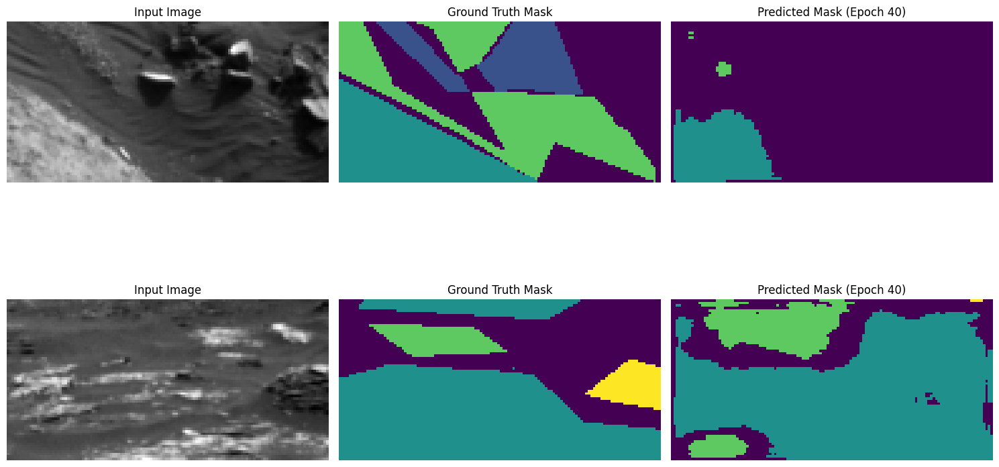

Model saved with new best Mean IoU: 0.4183
Epoch 41/50, Train Loss: 310.9438, Val Loss: 7.9596, Mean IoU: 0.4002
Class 0 IoU: 0.5818
Class 1 IoU: 0.4192
Class 2 IoU: 0.5750
Class 3 IoU: 0.0247


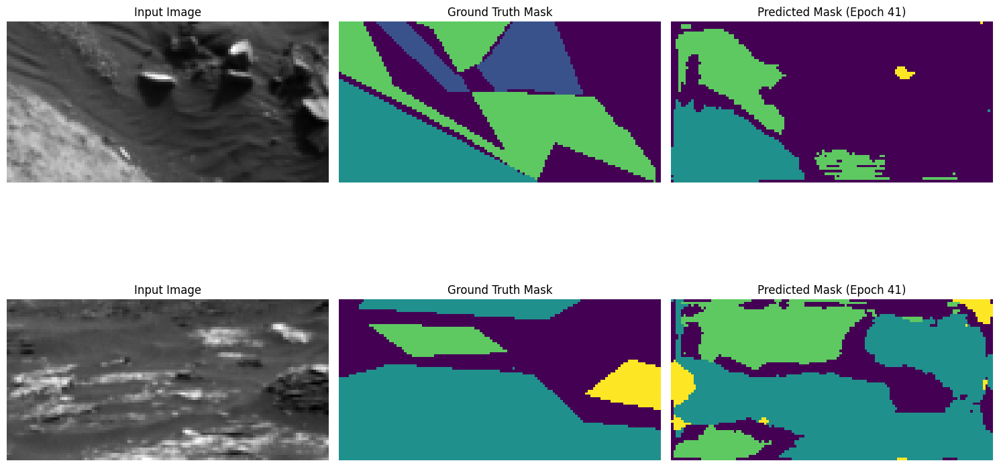

Epoch 42/50, Train Loss: 301.7352, Val Loss: 9.4121, Mean IoU: 0.4022
Class 0 IoU: 0.5781
Class 1 IoU: 0.4323
Class 2 IoU: 0.5783
Class 3 IoU: 0.0200


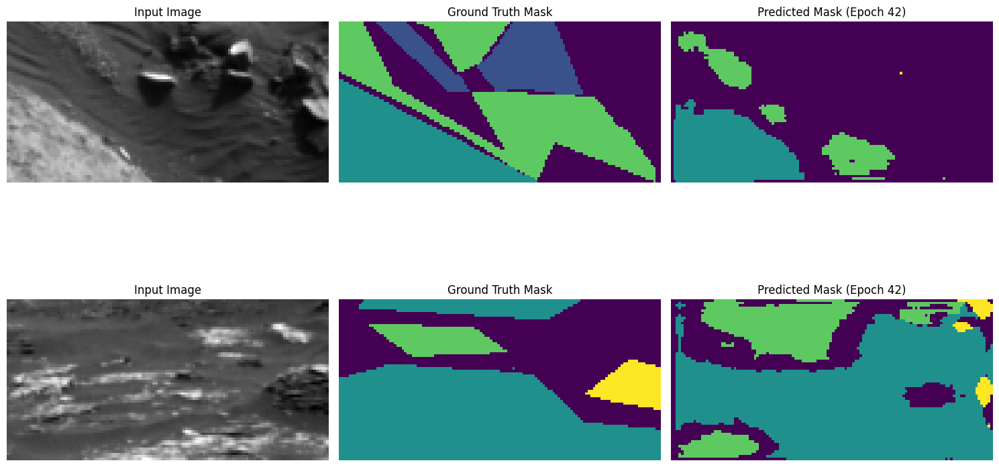

Epoch 43/50, Train Loss: 293.3726, Val Loss: 8.8648, Mean IoU: 0.4311
Class 0 IoU: 0.6293
Class 1 IoU: 0.4599
Class 2 IoU: 0.5999
Class 3 IoU: 0.0353


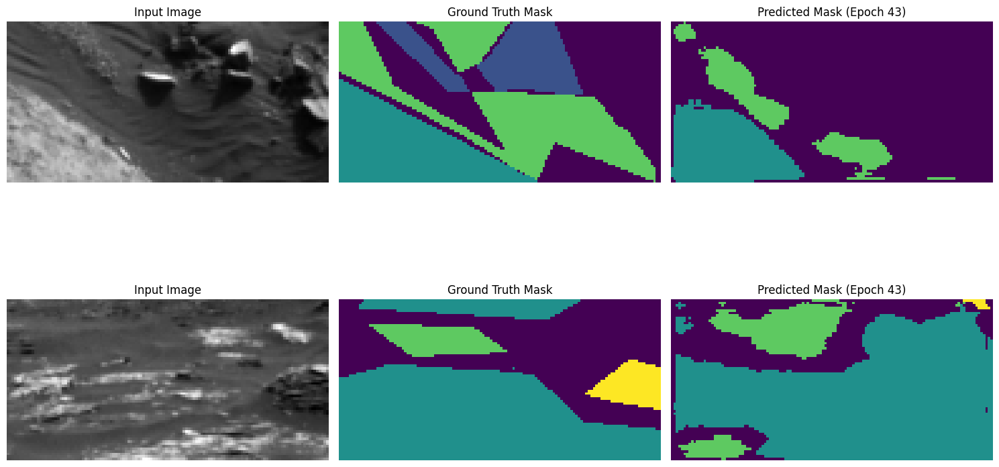

Model saved with new best Mean IoU: 0.4311
Epoch 44/50, Train Loss: 294.4263, Val Loss: 10.2995, Mean IoU: 0.4191
Class 0 IoU: 0.6194
Class 1 IoU: 0.4615
Class 2 IoU: 0.5826
Class 3 IoU: 0.0129


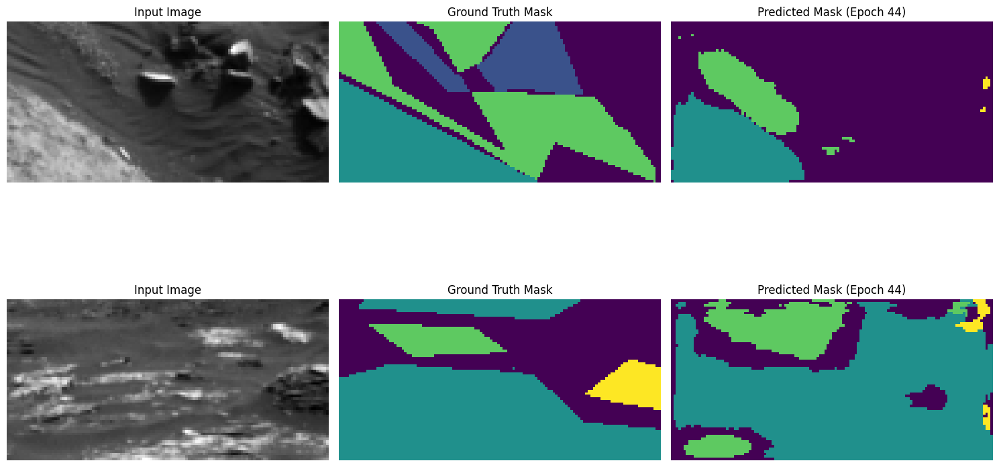

Epoch 45/50, Train Loss: 289.2134, Val Loss: 12.0528, Mean IoU: 0.4104
Class 0 IoU: 0.6062
Class 1 IoU: 0.4570
Class 2 IoU: 0.5745
Class 3 IoU: 0.0040


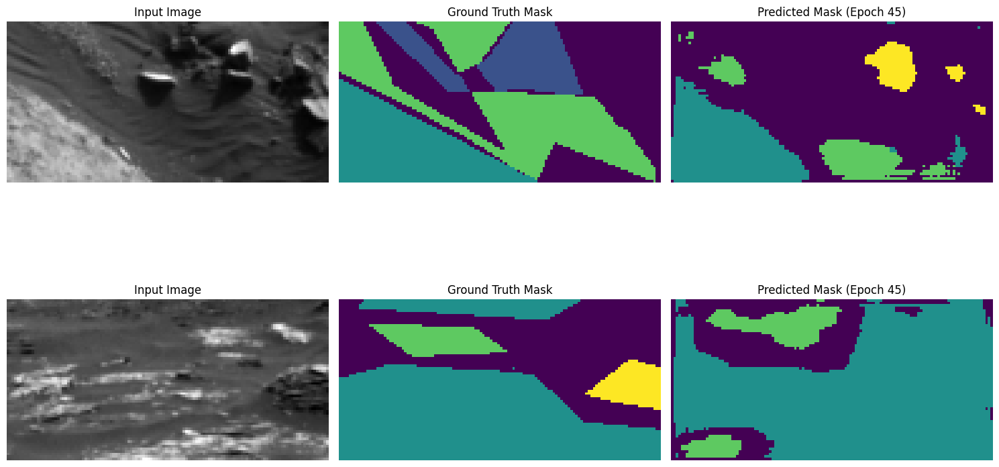

Epoch 46/50, Train Loss: 288.4110, Val Loss: 11.5146, Mean IoU: 0.4274
Class 0 IoU: 0.6339
Class 1 IoU: 0.4581
Class 2 IoU: 0.6026
Class 3 IoU: 0.0148


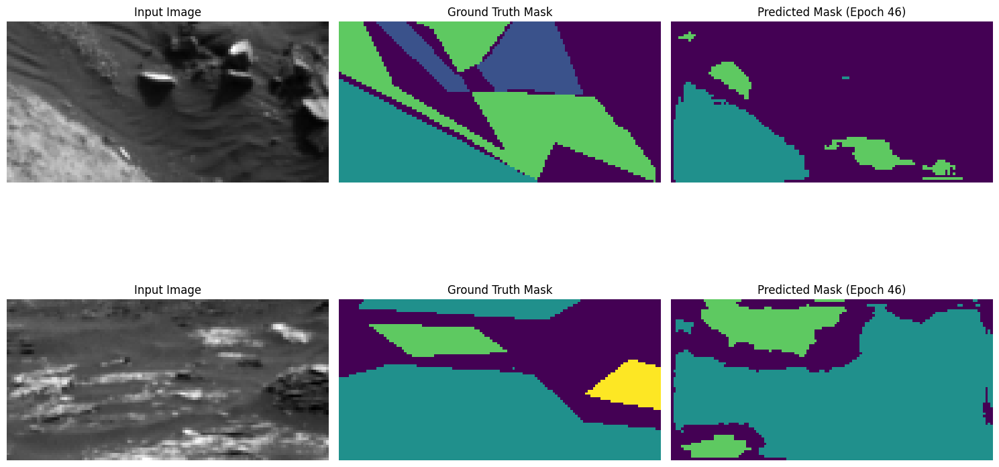

Epoch 47/50, Train Loss: 284.7570, Val Loss: 10.8229, Mean IoU: 0.4220
Class 0 IoU: 0.6083
Class 1 IoU: 0.4500
Class 2 IoU: 0.6138
Class 3 IoU: 0.0159


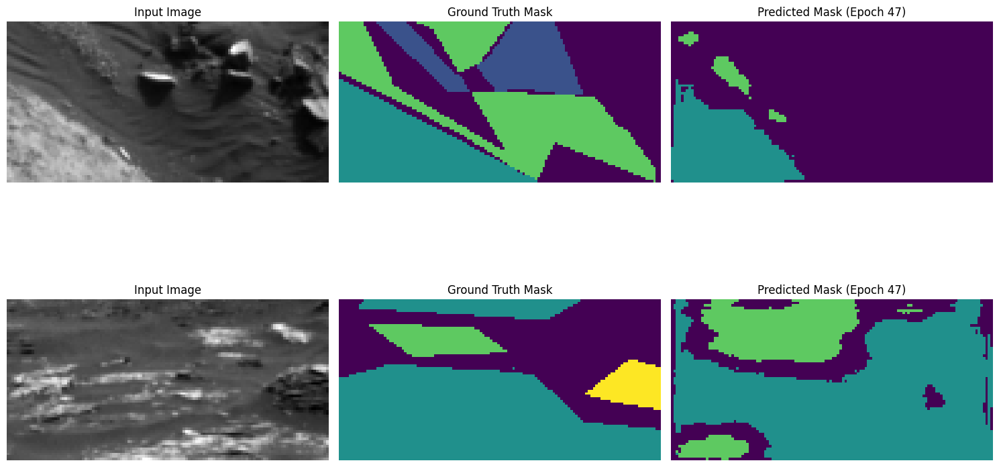

Epoch 48/50, Train Loss: 285.8552, Val Loss: 8.3130, Mean IoU: 0.4015
Class 0 IoU: 0.5771
Class 1 IoU: 0.4373
Class 2 IoU: 0.5579
Class 3 IoU: 0.0335


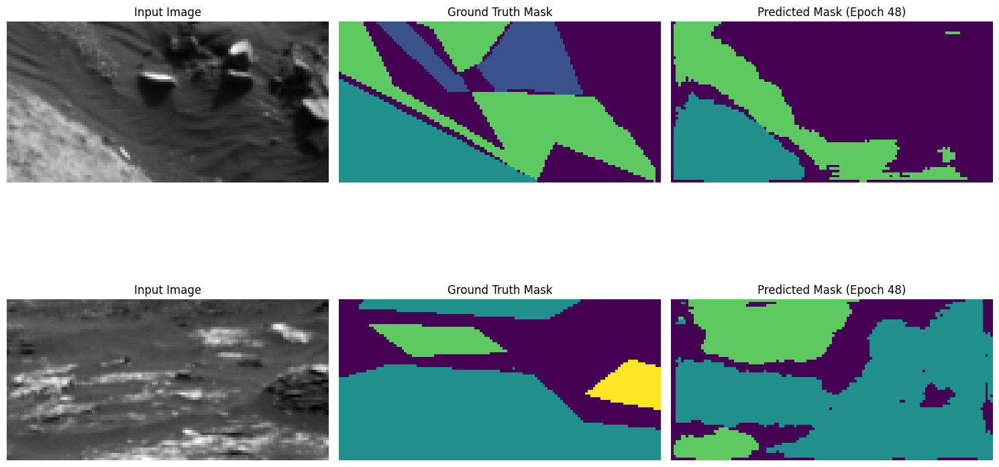

Epoch 49/50, Train Loss: 292.0476, Val Loss: 8.9937, Mean IoU: 0.4357
Class 0 IoU: 0.6330
Class 1 IoU: 0.4837
Class 2 IoU: 0.6025
Class 3 IoU: 0.0236


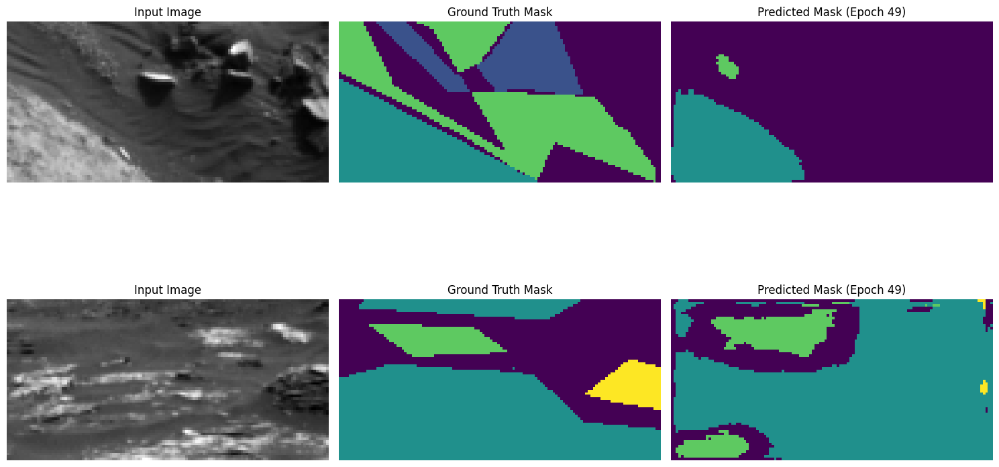

Model saved with new best Mean IoU: 0.4357
Epoch 50/50, Train Loss: 276.7822, Val Loss: 9.8758, Mean IoU: 0.4219
Class 0 IoU: 0.5848
Class 1 IoU: 0.4733
Class 2 IoU: 0.5851
Class 3 IoU: 0.0445


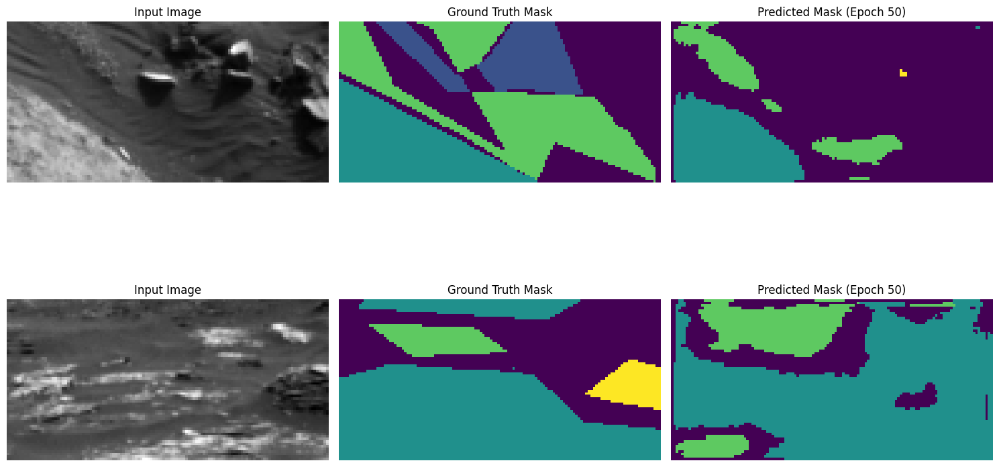

Epoch 51/50, Train Loss: 279.2400, Val Loss: 9.5803, Mean IoU: 0.4457
Class 0 IoU: 0.6354
Class 1 IoU: 0.4975
Class 2 IoU: 0.6019
Class 3 IoU: 0.0479


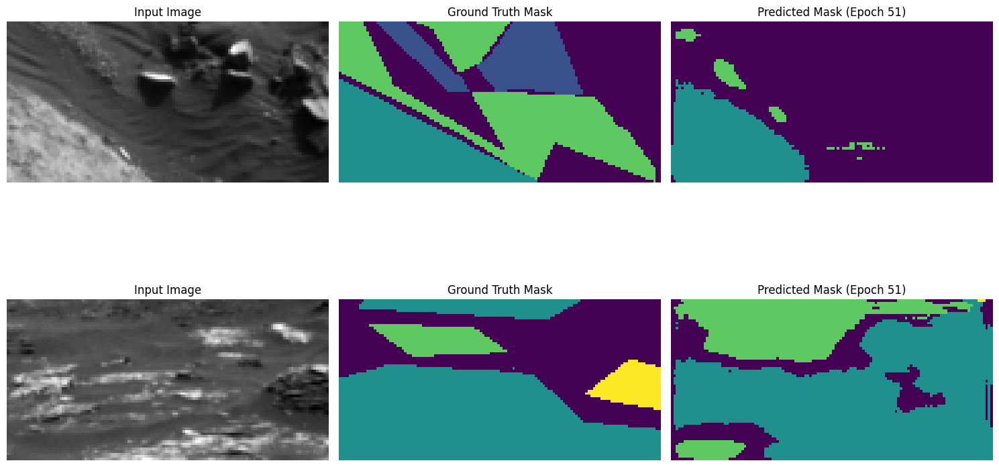

Model saved with new best Mean IoU: 0.4457
Epoch 52/50, Train Loss: 283.2819, Val Loss: 10.0501, Mean IoU: 0.4374
Class 0 IoU: 0.6371
Class 1 IoU: 0.4878
Class 2 IoU: 0.5988
Class 3 IoU: 0.0259


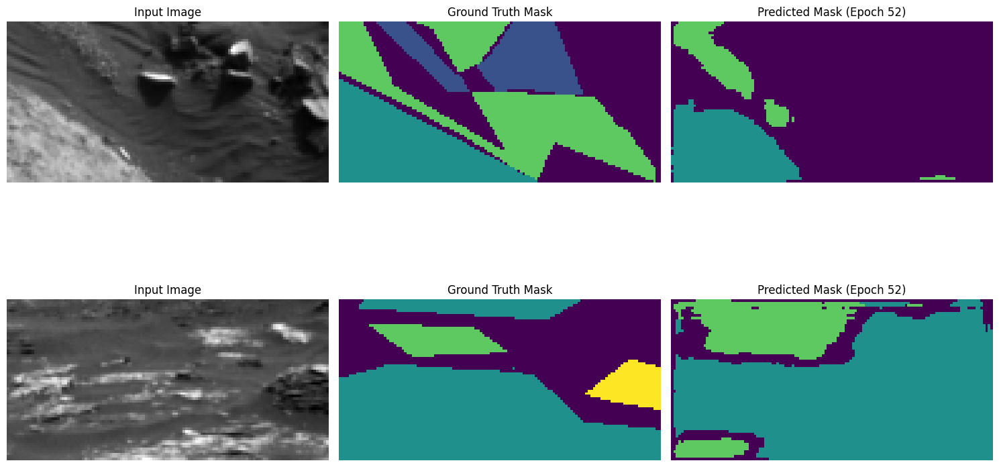

Epoch 53/50, Train Loss: 271.9266, Val Loss: 9.5088, Mean IoU: 0.4249
Class 0 IoU: 0.5941
Class 1 IoU: 0.4625
Class 2 IoU: 0.6038
Class 3 IoU: 0.0391


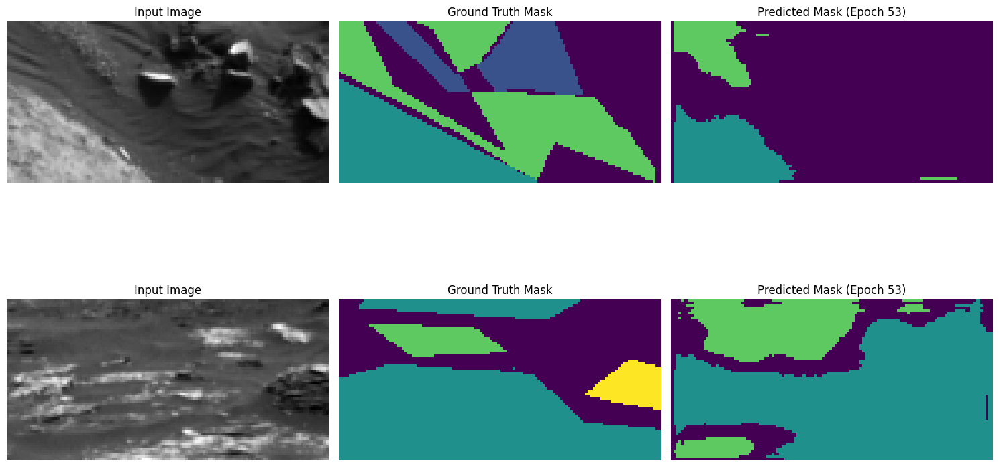

Epoch 54/50, Train Loss: 268.1400, Val Loss: 10.4583, Mean IoU: 0.4474
Class 0 IoU: 0.6542
Class 1 IoU: 0.5039
Class 2 IoU: 0.6021
Class 3 IoU: 0.0294


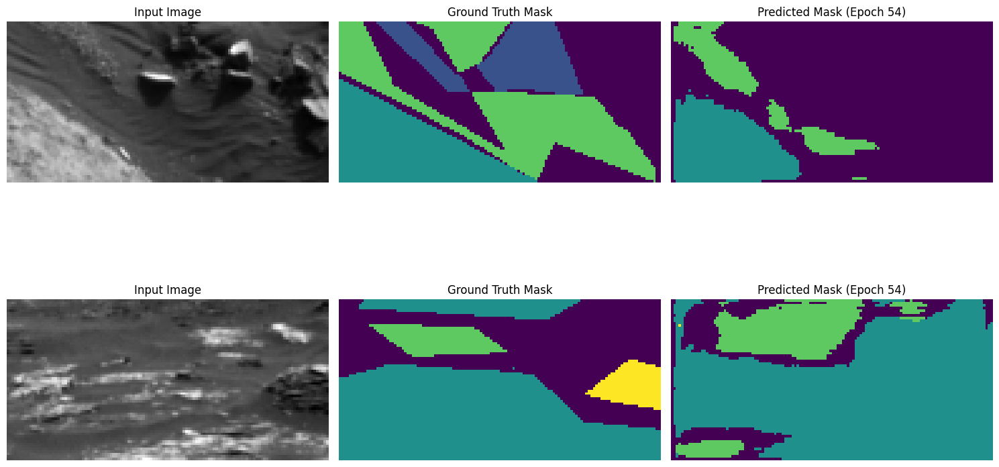

Model saved with new best Mean IoU: 0.4474
Epoch 55/50, Train Loss: 268.4241, Val Loss: 10.9588, Mean IoU: 0.4177
Class 0 IoU: 0.5970
Class 1 IoU: 0.4831
Class 2 IoU: 0.5868
Class 3 IoU: 0.0037


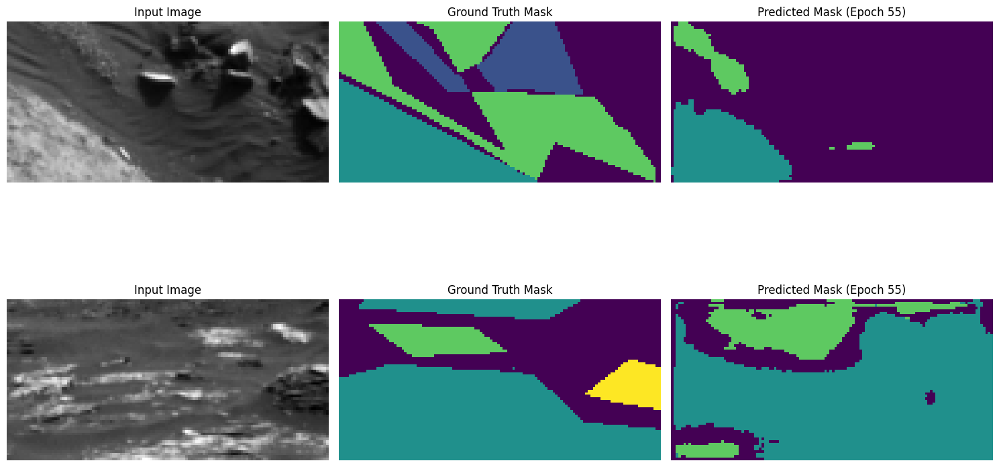

Epoch 56/50, Train Loss: 267.6080, Val Loss: 9.6953, Mean IoU: 0.4281
Class 0 IoU: 0.6202
Class 1 IoU: 0.4689
Class 2 IoU: 0.6052
Class 3 IoU: 0.0182


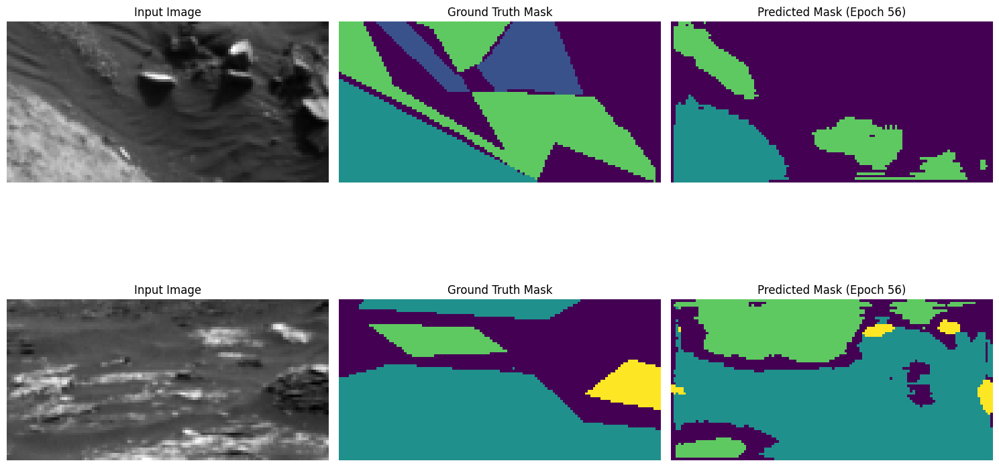

Epoch 57/50, Train Loss: 258.7666, Val Loss: 10.2507, Mean IoU: 0.4324
Class 0 IoU: 0.6266
Class 1 IoU: 0.4957
Class 2 IoU: 0.5854
Class 3 IoU: 0.0218


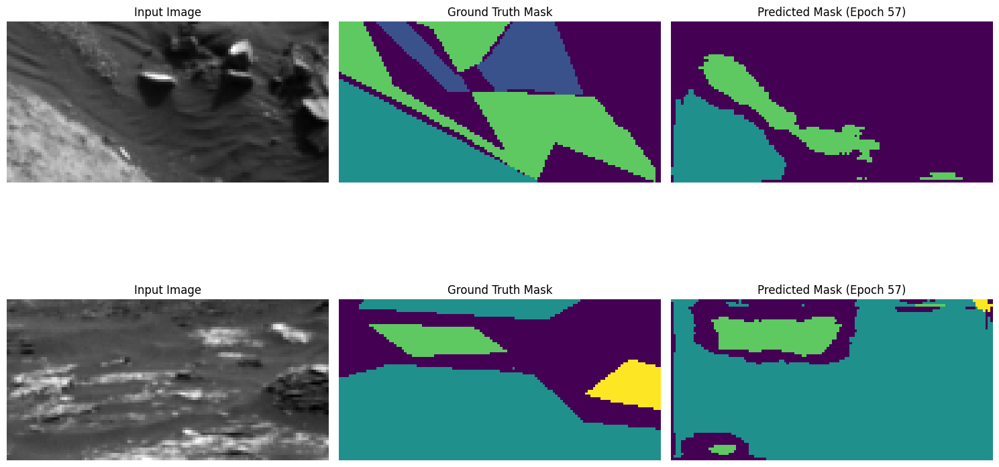

Epoch 58/50, Train Loss: 256.4771, Val Loss: 9.6640, Mean IoU: 0.4461
Class 0 IoU: 0.6296
Class 1 IoU: 0.5056
Class 2 IoU: 0.5831
Class 3 IoU: 0.0661


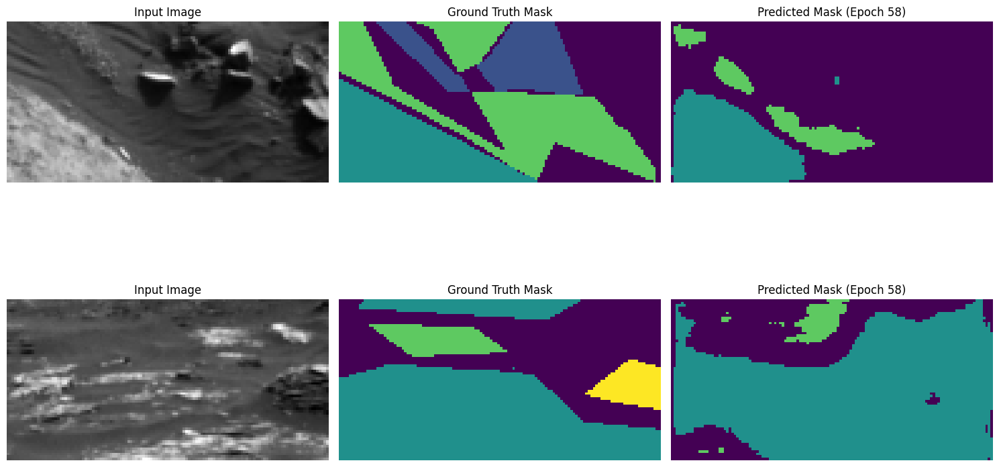

Epoch 59/50, Train Loss: 267.5204, Val Loss: 9.4611, Mean IoU: 0.4426
Class 0 IoU: 0.6295
Class 1 IoU: 0.4990
Class 2 IoU: 0.6056
Class 3 IoU: 0.0362


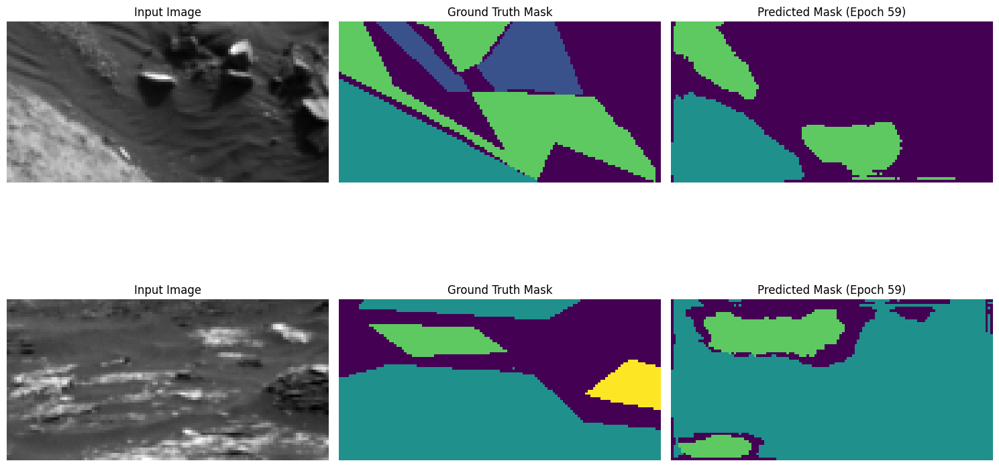

Epoch 60/50, Train Loss: 259.0078, Val Loss: 9.6480, Mean IoU: 0.4357
Class 0 IoU: 0.6253
Class 1 IoU: 0.4975
Class 2 IoU: 0.5893
Class 3 IoU: 0.0305


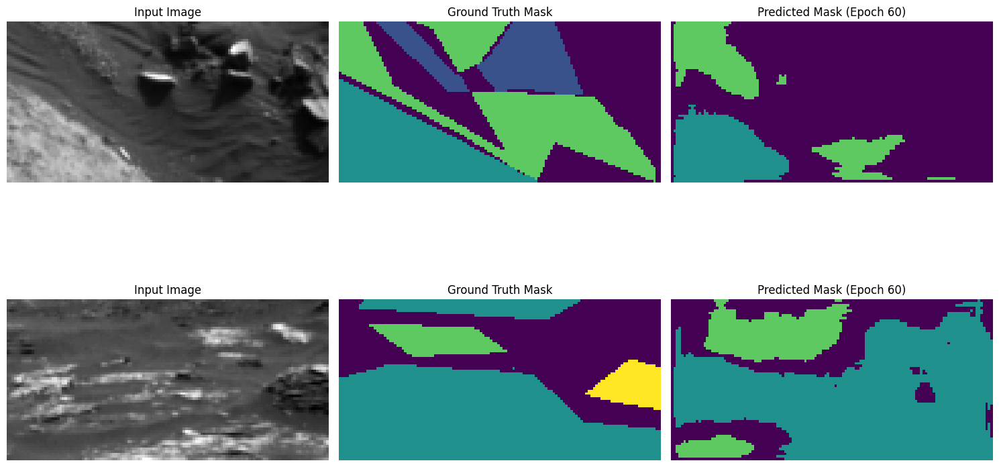

Epoch 61/50, Train Loss: 247.0965, Val Loss: 10.2241, Mean IoU: 0.4331
Class 0 IoU: 0.5998
Class 1 IoU: 0.4869
Class 2 IoU: 0.6107
Class 3 IoU: 0.0350


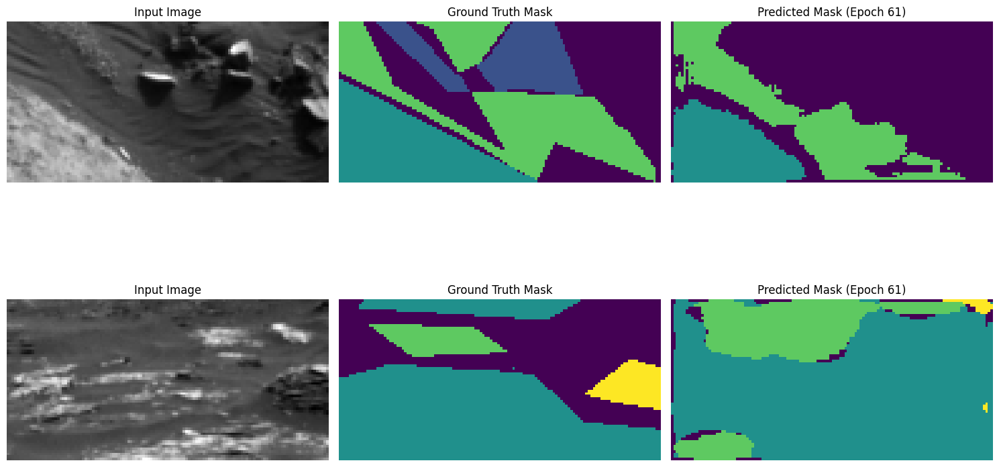

Epoch 62/50, Train Loss: 248.7578, Val Loss: 9.5882, Mean IoU: 0.4281
Class 0 IoU: 0.6108
Class 1 IoU: 0.4920
Class 2 IoU: 0.6015
Class 3 IoU: 0.0081


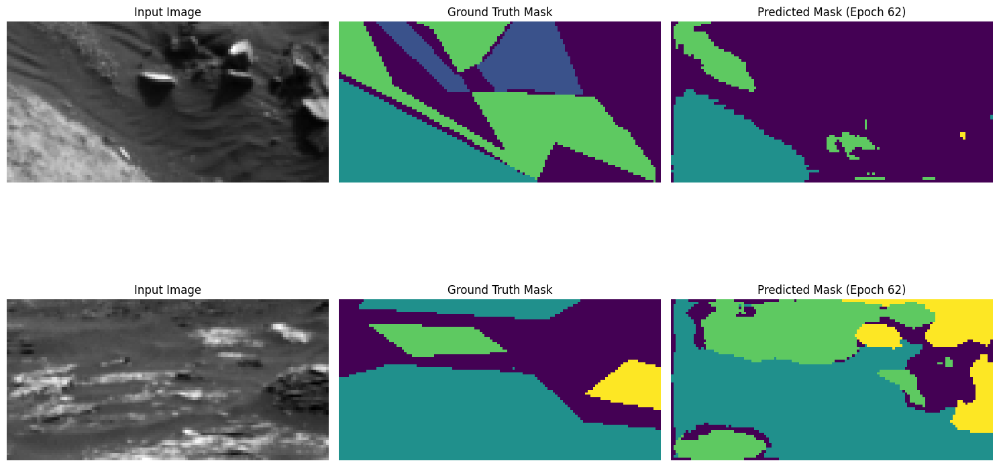

Epoch 63/50, Train Loss: 246.0840, Val Loss: 10.1036, Mean IoU: 0.4365
Class 0 IoU: 0.6299
Class 1 IoU: 0.4974
Class 2 IoU: 0.5958
Class 3 IoU: 0.0231


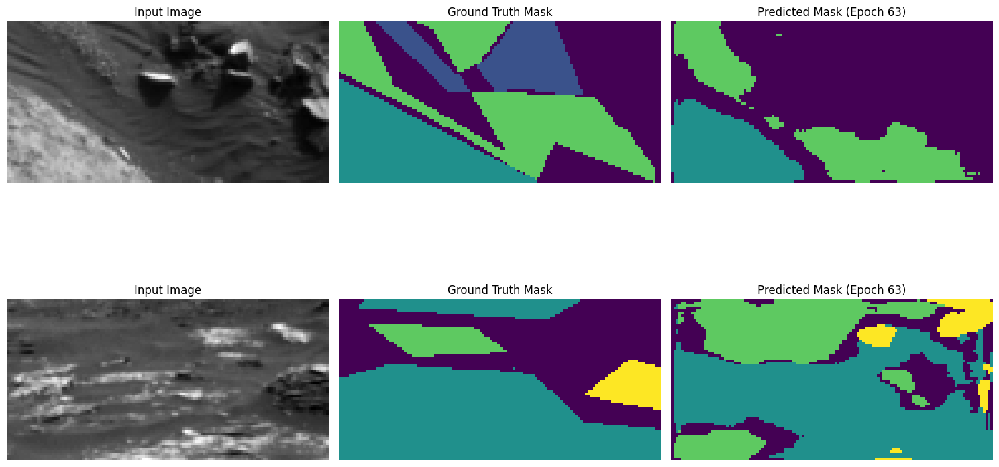

Epoch 64/50, Train Loss: 238.3341, Val Loss: 9.3757, Mean IoU: 0.4302
Class 0 IoU: 0.6178
Class 1 IoU: 0.4933
Class 2 IoU: 0.5865
Class 3 IoU: 0.0233


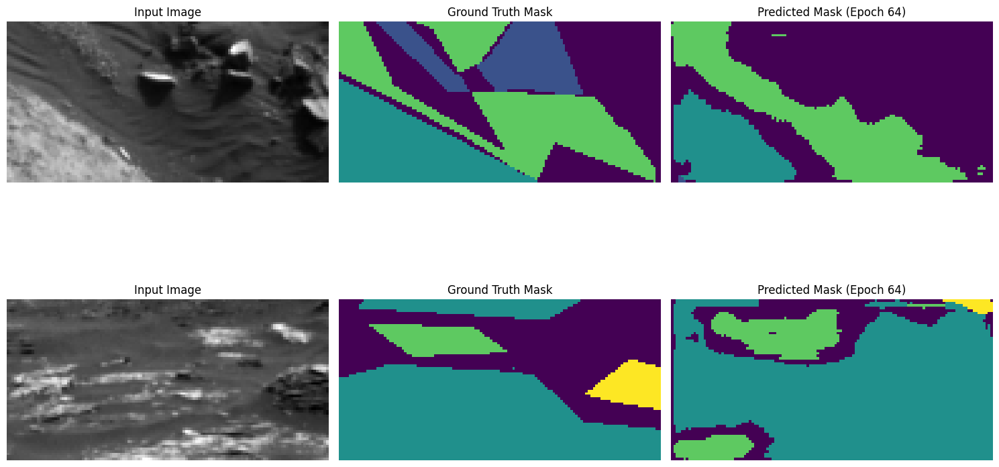

Epoch 65/50, Train Loss: 233.5518, Val Loss: 10.6255, Mean IoU: 0.4246
Class 0 IoU: 0.5983
Class 1 IoU: 0.4907
Class 2 IoU: 0.5826
Class 3 IoU: 0.0269


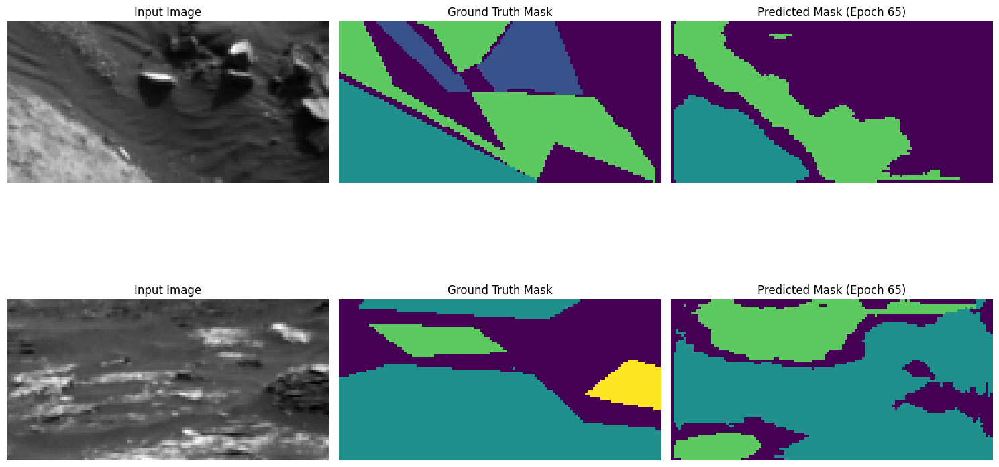

Epoch 66/50, Train Loss: 233.6897, Val Loss: 10.0022, Mean IoU: 0.4423
Class 0 IoU: 0.6364
Class 1 IoU: 0.4977
Class 2 IoU: 0.6006
Class 3 IoU: 0.0344


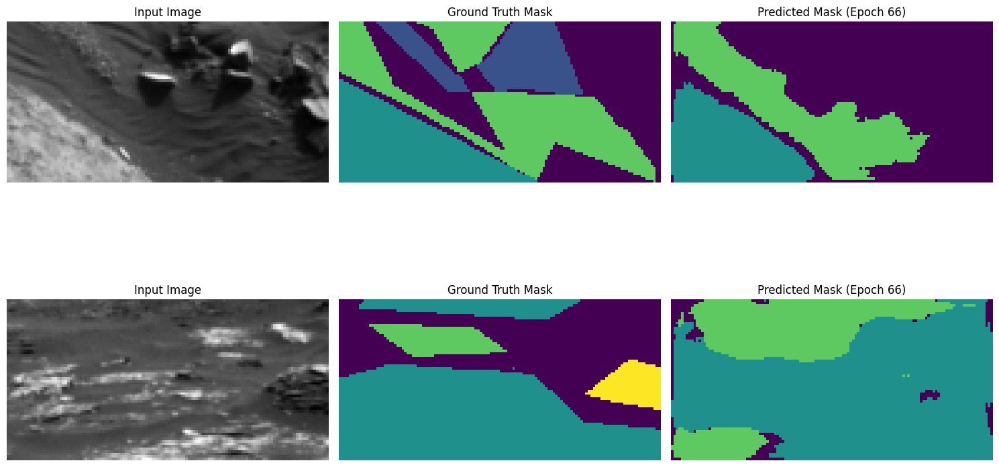

Epoch 67/50, Train Loss: 229.7817, Val Loss: 10.6447, Mean IoU: 0.4311
Class 0 IoU: 0.6230
Class 1 IoU: 0.4962
Class 2 IoU: 0.5895
Class 3 IoU: 0.0157


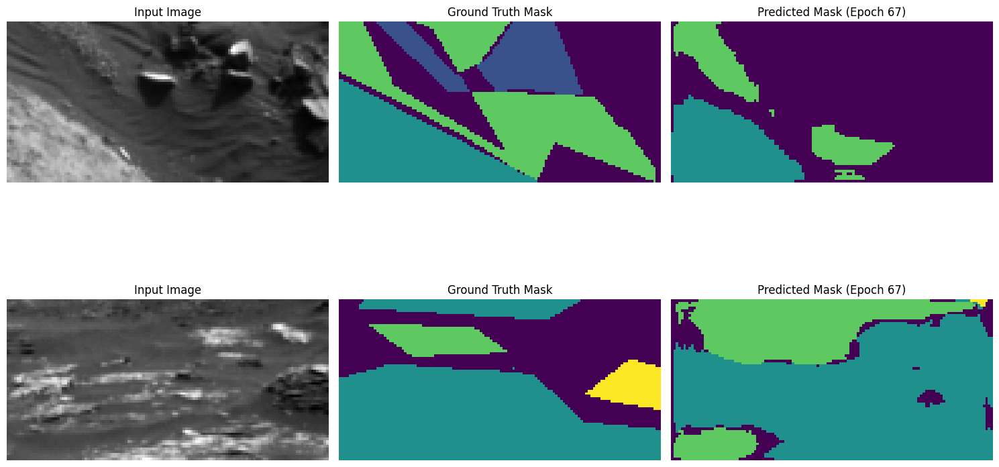

Epoch 68/50, Train Loss: 223.3564, Val Loss: 10.9346, Mean IoU: 0.4400
Class 0 IoU: 0.6372
Class 1 IoU: 0.5151
Class 2 IoU: 0.5946
Class 3 IoU: 0.0132


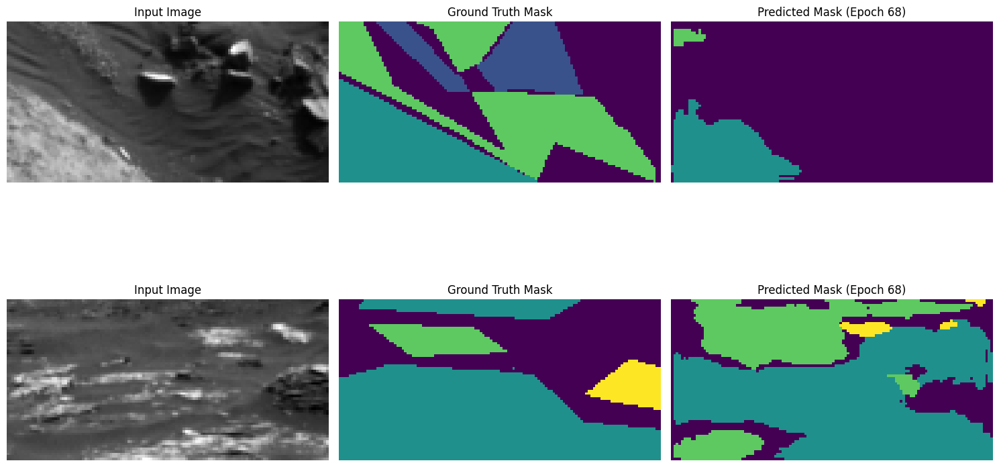

Epoch 69/50, Train Loss: 229.3879, Val Loss: 10.4541, Mean IoU: 0.4232
Class 0 IoU: 0.6009
Class 1 IoU: 0.4748
Class 2 IoU: 0.5883
Class 3 IoU: 0.0287


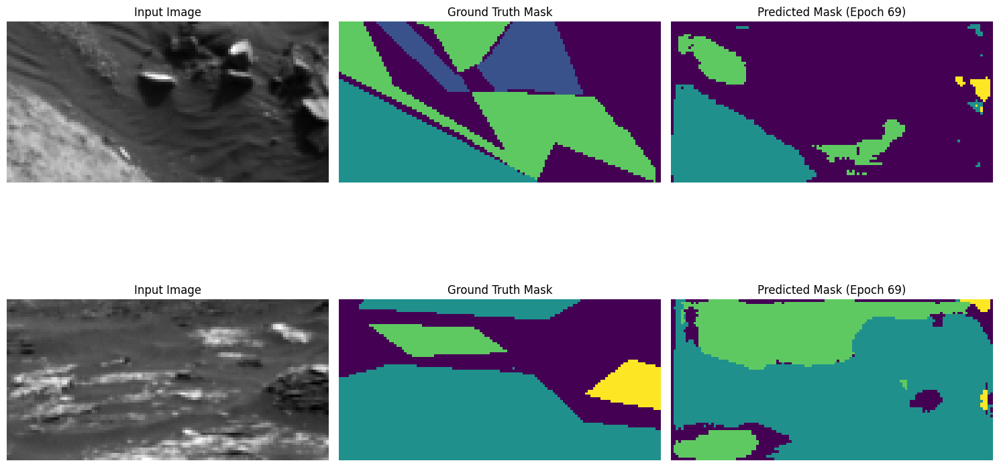

Epoch 70/50, Train Loss: 222.9914, Val Loss: 11.5547, Mean IoU: 0.4308
Class 0 IoU: 0.6294
Class 1 IoU: 0.4730
Class 2 IoU: 0.5982
Class 3 IoU: 0.0225


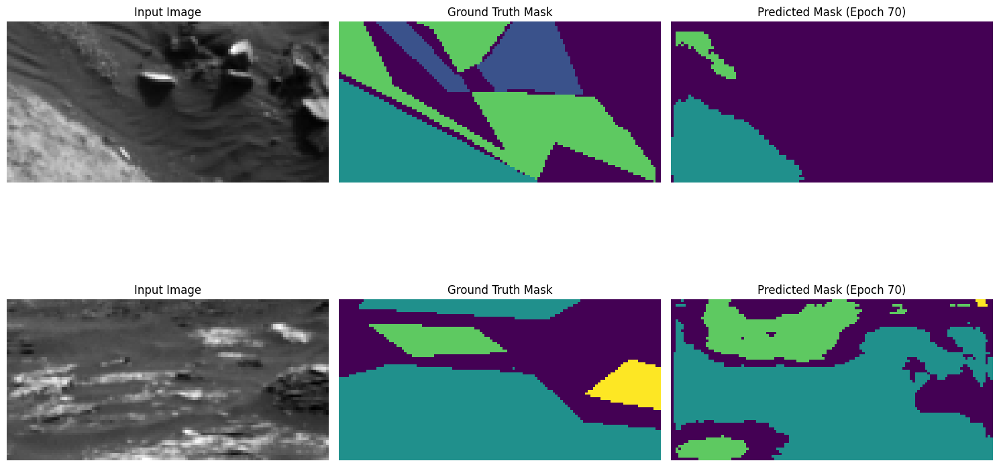

Epoch 71/50, Train Loss: 215.9985, Val Loss: 10.8043, Mean IoU: 0.4294
Class 0 IoU: 0.6138
Class 1 IoU: 0.4709
Class 2 IoU: 0.6055
Class 3 IoU: 0.0273


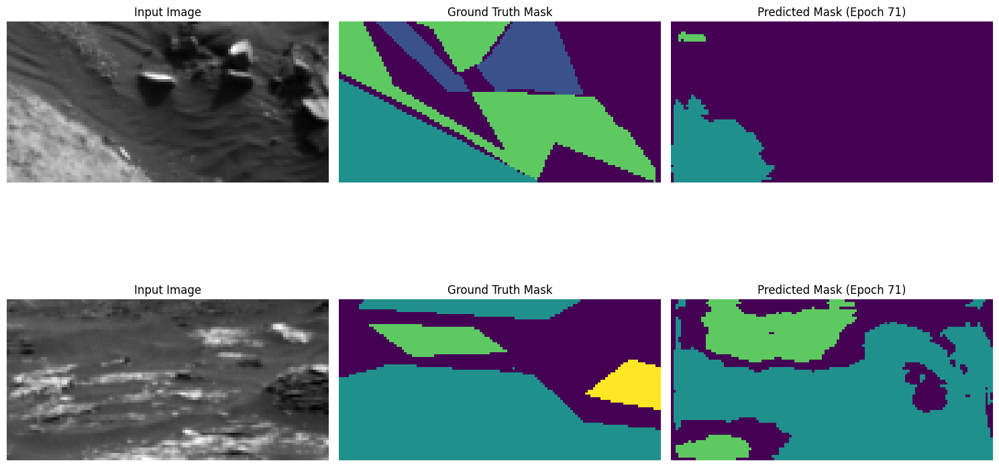

Epoch 72/50, Train Loss: 213.4641, Val Loss: 9.0965, Mean IoU: 0.4309
Class 0 IoU: 0.6162
Class 1 IoU: 0.4915
Class 2 IoU: 0.5806
Class 3 IoU: 0.0353


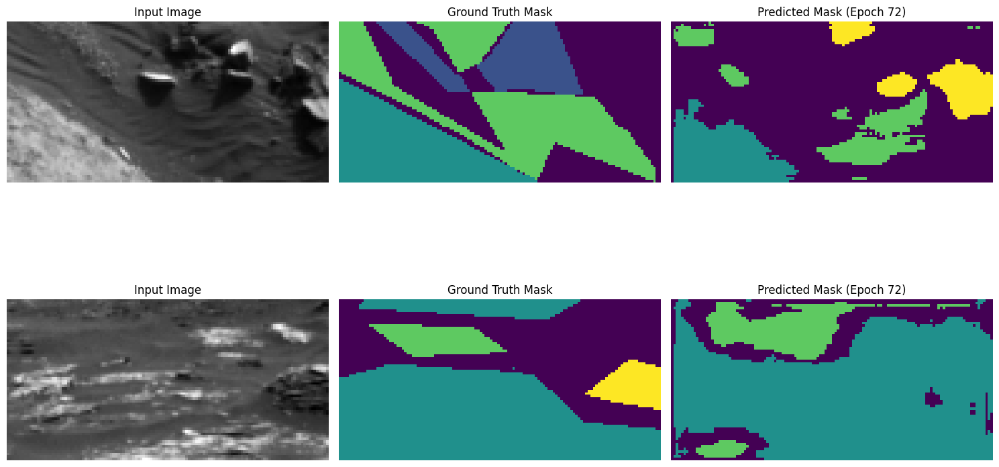

Epoch 73/50, Train Loss: 215.0342, Val Loss: 8.6197, Mean IoU: 0.4240
Class 0 IoU: 0.6138
Class 1 IoU: 0.4688
Class 2 IoU: 0.5720
Class 3 IoU: 0.0415


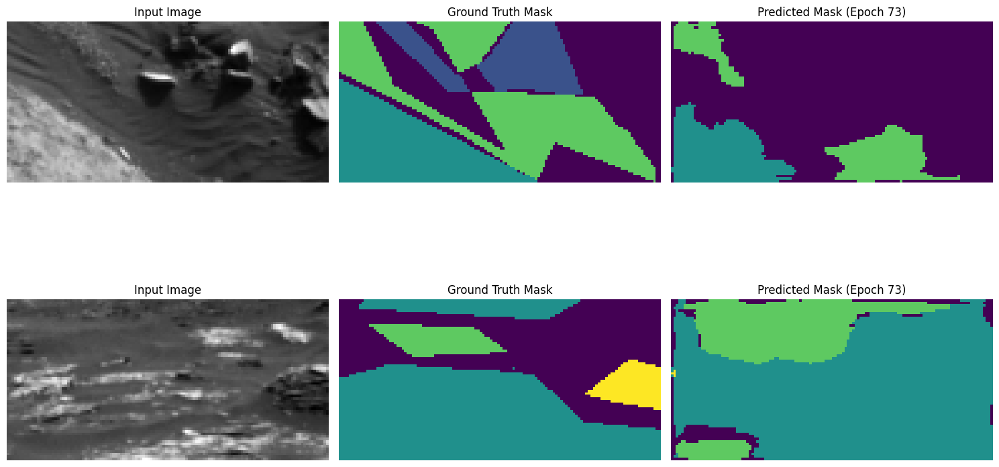

Epoch 74/50, Train Loss: 210.0900, Val Loss: 12.5038, Mean IoU: 0.4330
Class 0 IoU: 0.6251
Class 1 IoU: 0.4950
Class 2 IoU: 0.5861
Class 3 IoU: 0.0258


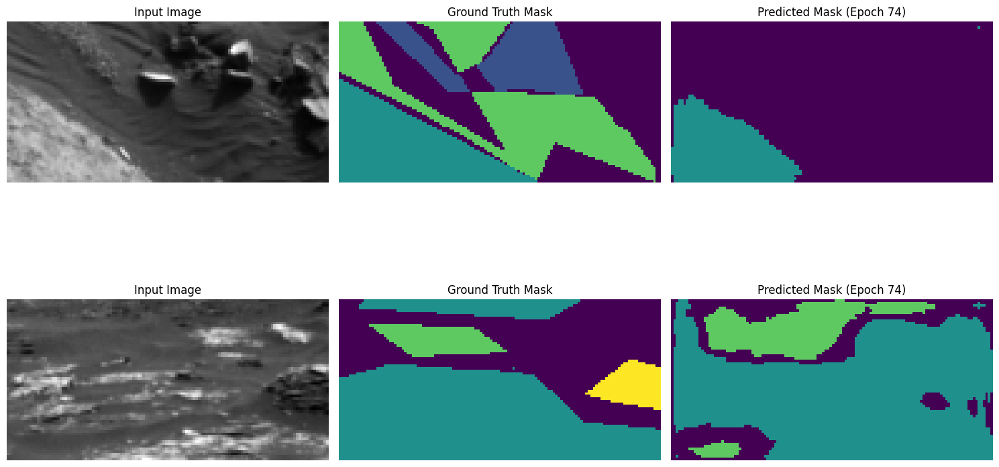

Epoch 75/50, Train Loss: 208.2344, Val Loss: 11.1633, Mean IoU: 0.4217
Class 0 IoU: 0.6114
Class 1 IoU: 0.4823
Class 2 IoU: 0.5711
Class 3 IoU: 0.0219


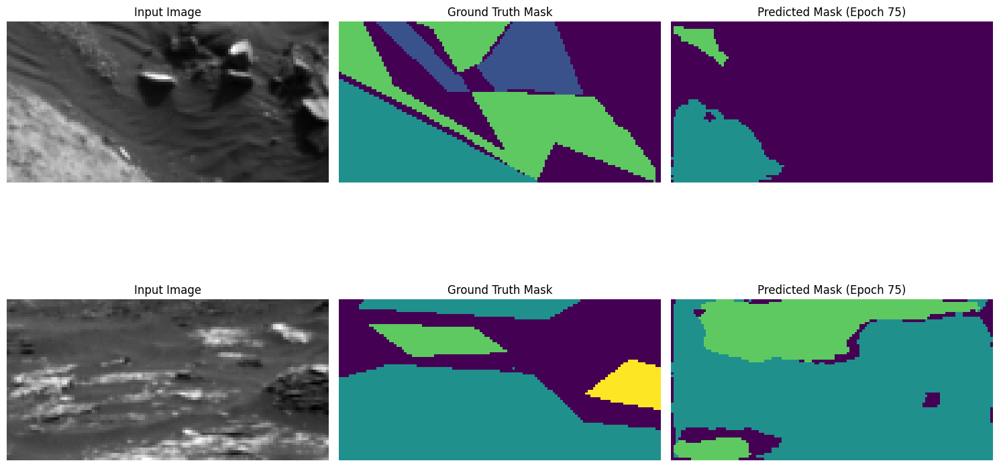

Epoch 76/50, Train Loss: 203.8981, Val Loss: 11.5534, Mean IoU: 0.4260
Class 0 IoU: 0.6323
Class 1 IoU: 0.4901
Class 2 IoU: 0.5651
Class 3 IoU: 0.0163


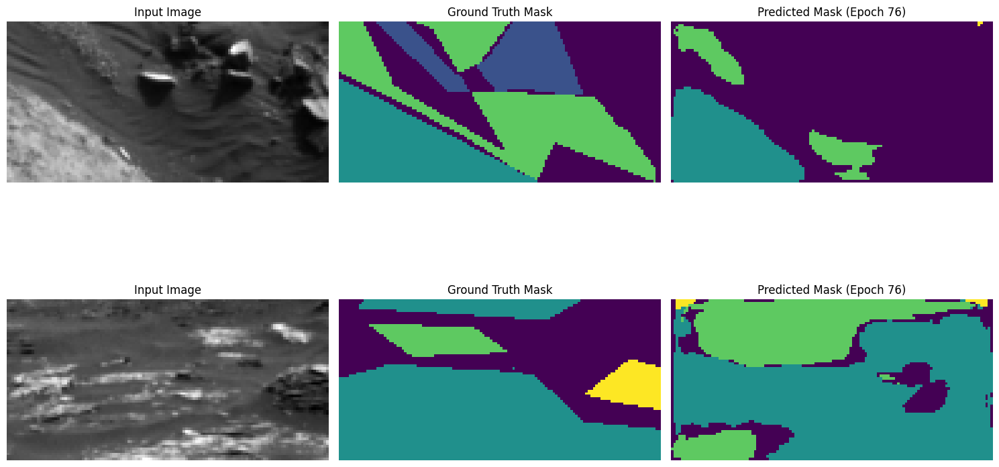

Epoch 77/50, Train Loss: 222.2280, Val Loss: 9.9776, Mean IoU: 0.4273
Class 0 IoU: 0.6207
Class 1 IoU: 0.4951
Class 2 IoU: 0.5616
Class 3 IoU: 0.0318


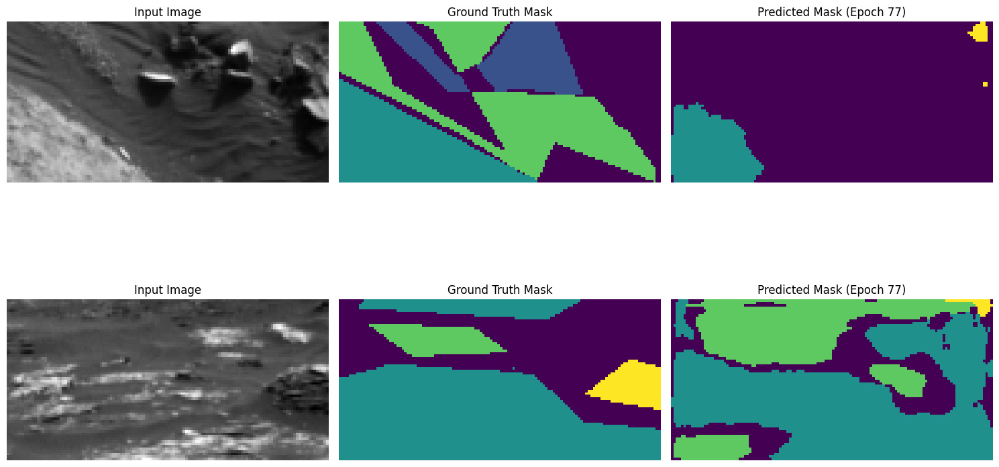

Epoch 78/50, Train Loss: 253.1182, Val Loss: 8.6917, Mean IoU: 0.4455
Class 0 IoU: 0.6447
Class 1 IoU: 0.5026
Class 2 IoU: 0.6102
Class 3 IoU: 0.0246


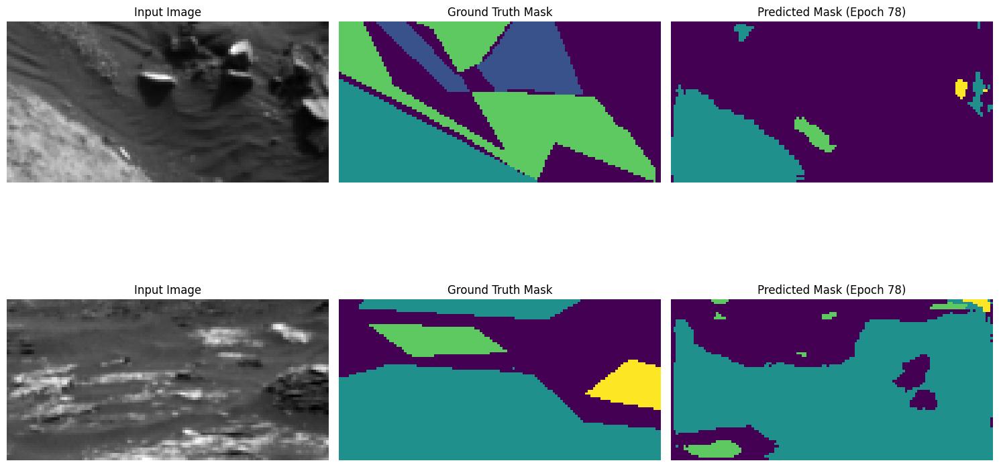

Epoch 79/50, Train Loss: 221.6532, Val Loss: 11.2656, Mean IoU: 0.4419
Class 0 IoU: 0.6427
Class 1 IoU: 0.5143
Class 2 IoU: 0.5873
Class 3 IoU: 0.0234


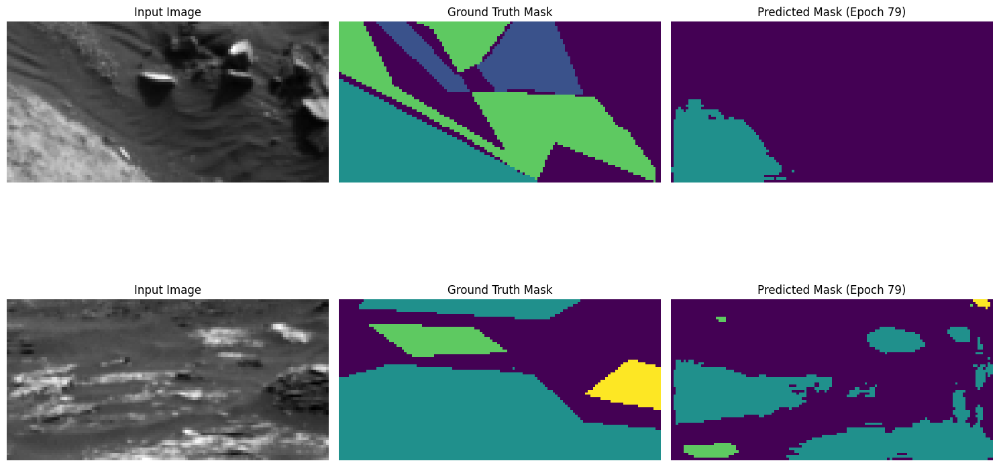

Epoch 80/50, Train Loss: 204.0154, Val Loss: 10.4790, Mean IoU: 0.4479
Class 0 IoU: 0.6589
Class 1 IoU: 0.5100
Class 2 IoU: 0.6061
Class 3 IoU: 0.0164


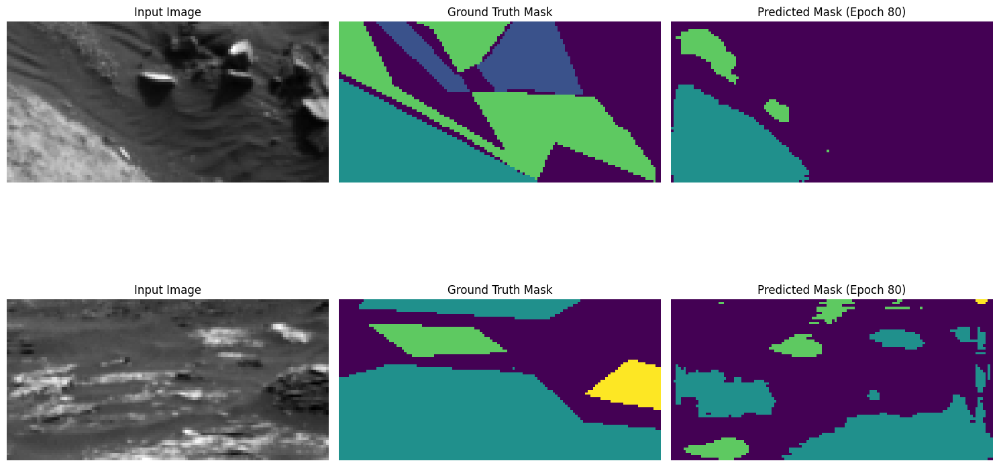

Model saved with new best Mean IoU: 0.4479
Epoch 81/50, Train Loss: 197.2827, Val Loss: 11.1364, Mean IoU: 0.4379
Class 0 IoU: 0.6399
Class 1 IoU: 0.5006
Class 2 IoU: 0.5974
Class 3 IoU: 0.0135


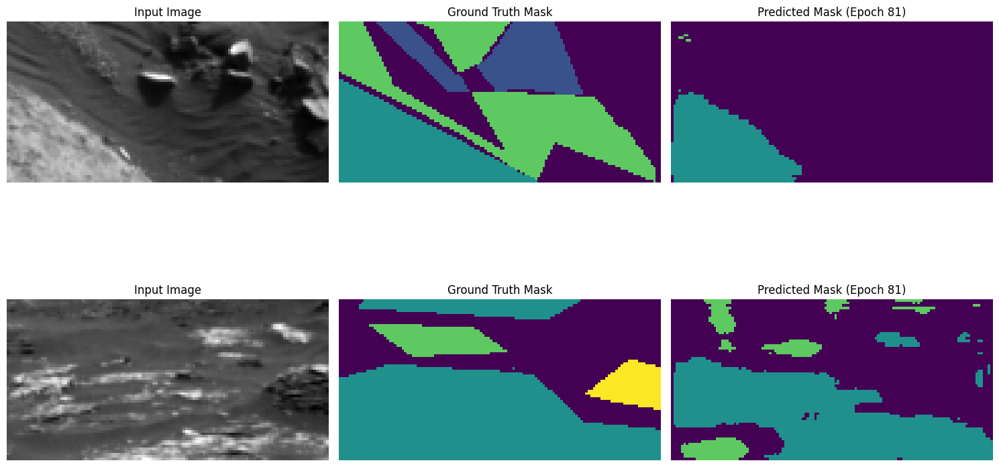

Epoch 82/50, Train Loss: 191.3460, Val Loss: 11.0966, Mean IoU: 0.4318
Class 0 IoU: 0.6192
Class 1 IoU: 0.4953
Class 2 IoU: 0.5868
Class 3 IoU: 0.0259


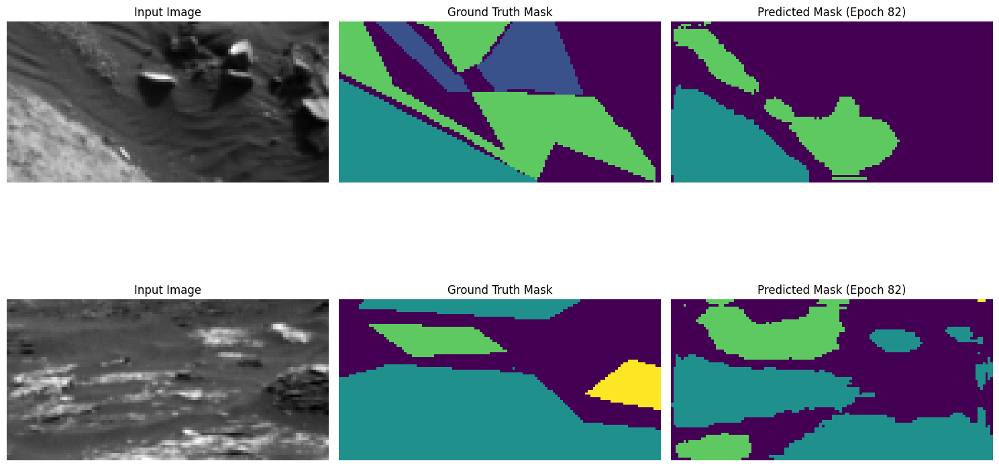

Epoch 83/50, Train Loss: 185.3776, Val Loss: 10.7269, Mean IoU: 0.4377
Class 0 IoU: 0.6355
Class 1 IoU: 0.4932
Class 2 IoU: 0.6039
Class 3 IoU: 0.0183


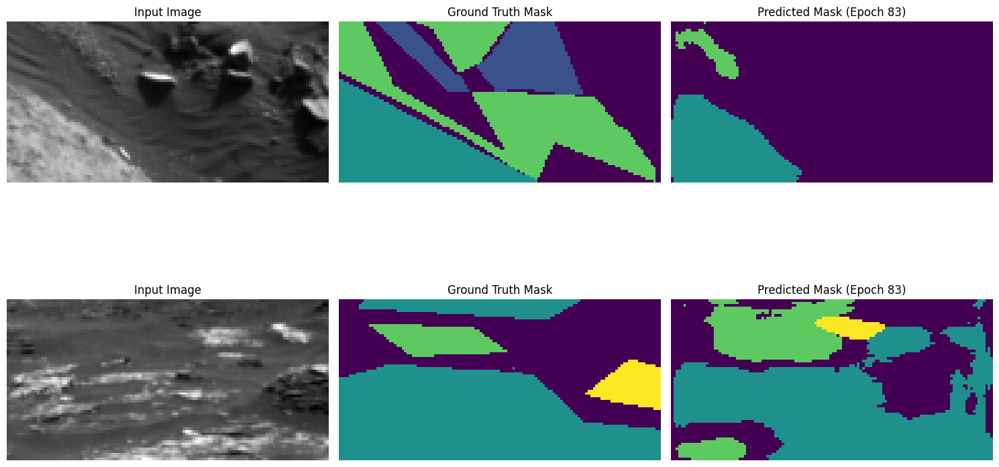

Epoch 84/50, Train Loss: 181.9449, Val Loss: 11.9133, Mean IoU: 0.4374
Class 0 IoU: 0.6241
Class 1 IoU: 0.5127
Class 2 IoU: 0.5915
Class 3 IoU: 0.0213


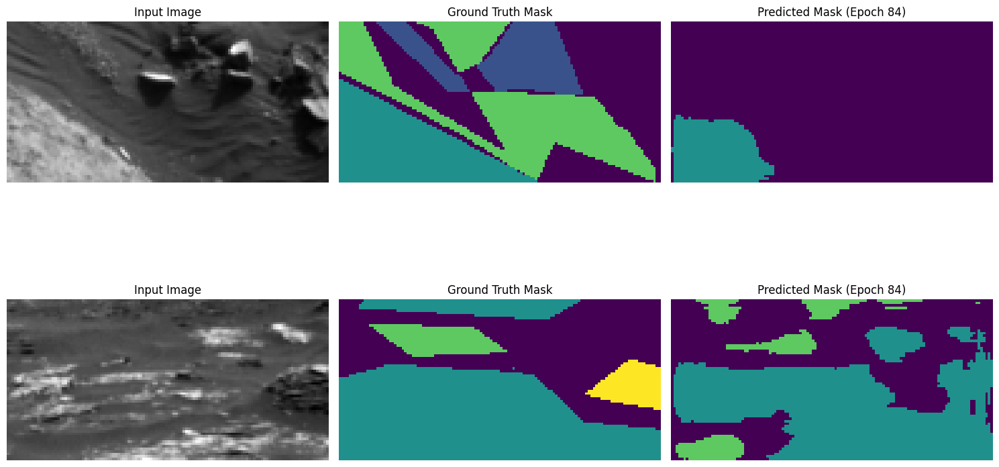

Epoch 85/50, Train Loss: 187.9364, Val Loss: 10.9670, Mean IoU: 0.4390
Class 0 IoU: 0.6190
Class 1 IoU: 0.5032
Class 2 IoU: 0.6061
Class 3 IoU: 0.0277


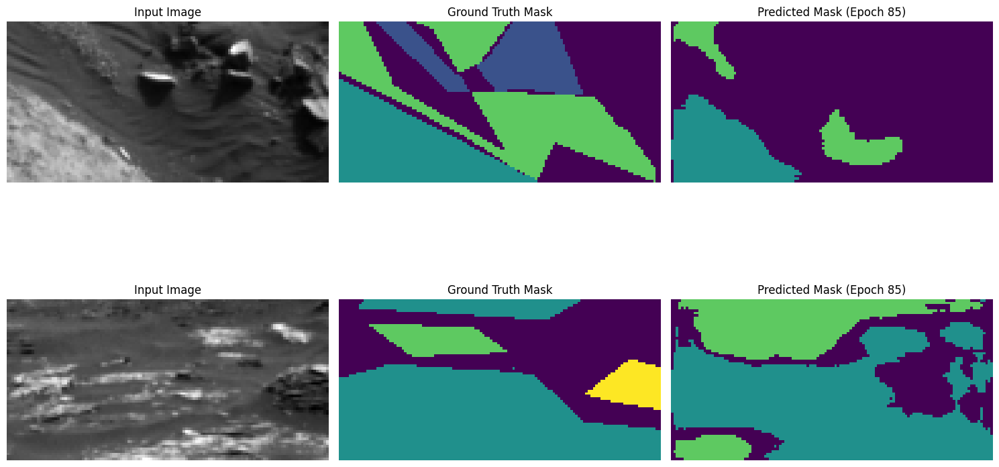

Epoch 86/50, Train Loss: 183.1258, Val Loss: 12.9296, Mean IoU: 0.4429
Class 0 IoU: 0.6557
Class 1 IoU: 0.5109
Class 2 IoU: 0.5919
Class 3 IoU: 0.0130


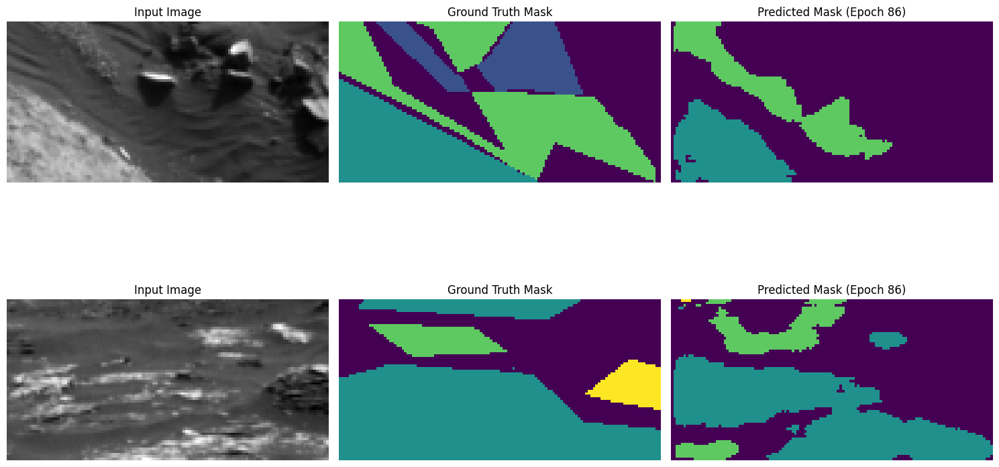

Epoch 87/50, Train Loss: 183.1814, Val Loss: 13.2105, Mean IoU: 0.4234
Class 0 IoU: 0.6093
Class 1 IoU: 0.4992
Class 2 IoU: 0.5769
Class 3 IoU: 0.0083


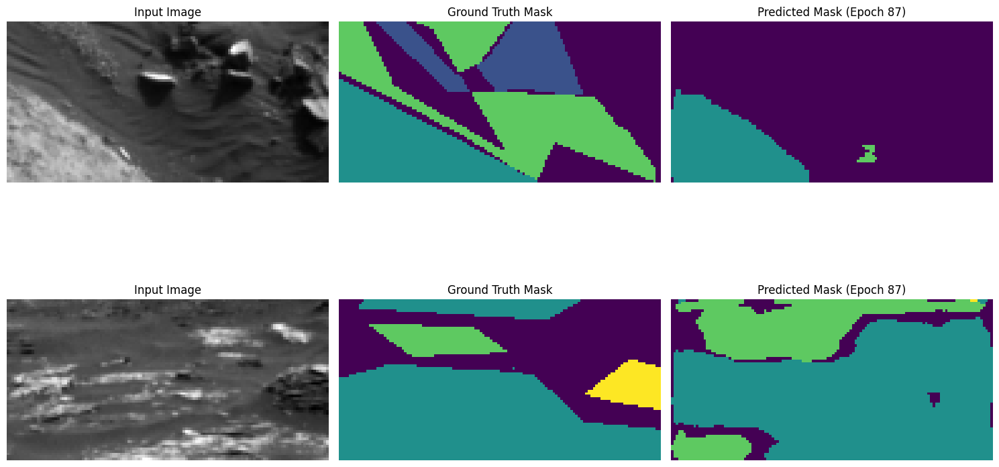

Epoch 88/50, Train Loss: 178.2397, Val Loss: 12.8942, Mean IoU: 0.4300
Class 0 IoU: 0.6186
Class 1 IoU: 0.5151
Class 2 IoU: 0.5806
Class 3 IoU: 0.0056


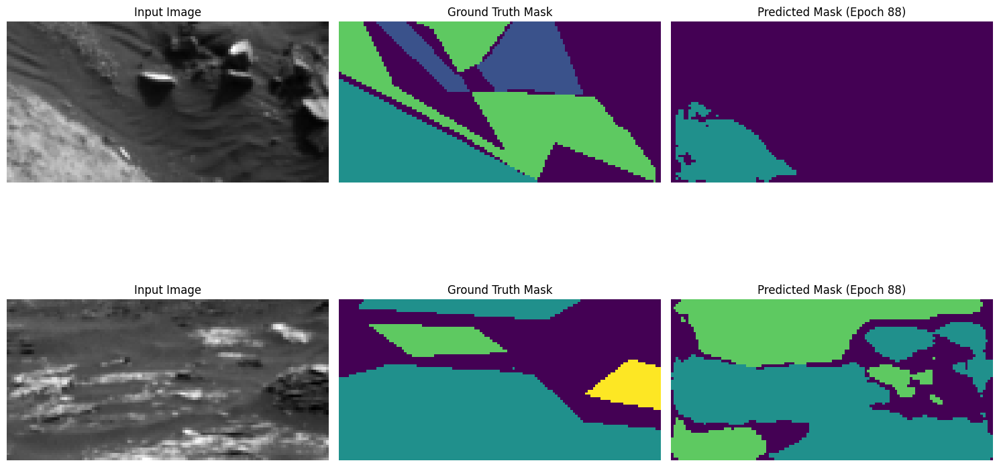

Epoch 89/50, Train Loss: 172.7292, Val Loss: 11.9628, Mean IoU: 0.4151
Class 0 IoU: 0.5889
Class 1 IoU: 0.4704
Class 2 IoU: 0.5811
Class 3 IoU: 0.0198


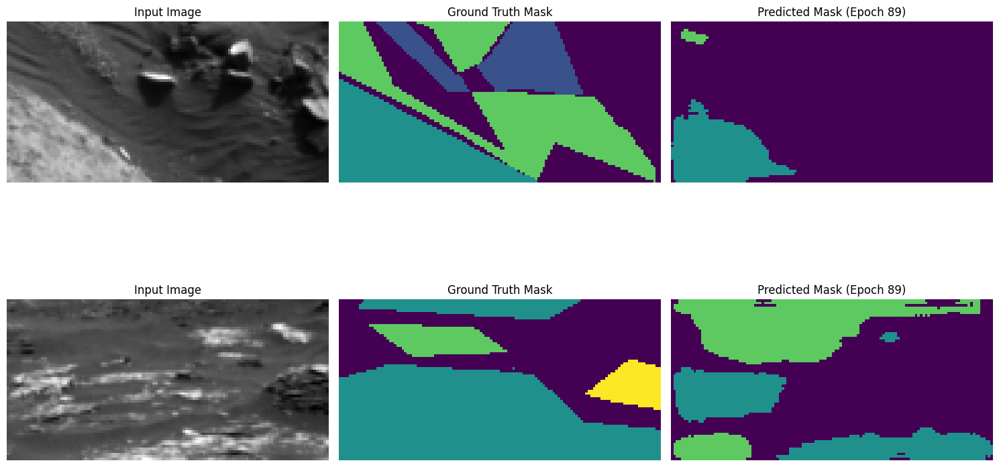

Epoch 90/50, Train Loss: 189.1454, Val Loss: 12.4937, Mean IoU: 0.4333
Class 0 IoU: 0.6433
Class 1 IoU: 0.5152
Class 2 IoU: 0.5674
Class 3 IoU: 0.0075


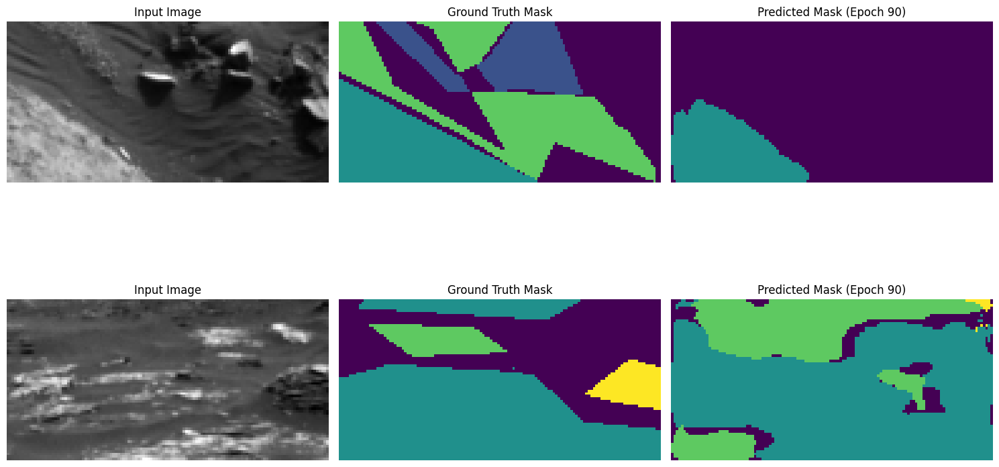

Epoch 91/50, Train Loss: 175.7399, Val Loss: 11.9498, Mean IoU: 0.4362
Class 0 IoU: 0.6349
Class 1 IoU: 0.5056
Class 2 IoU: 0.5911
Class 3 IoU: 0.0133


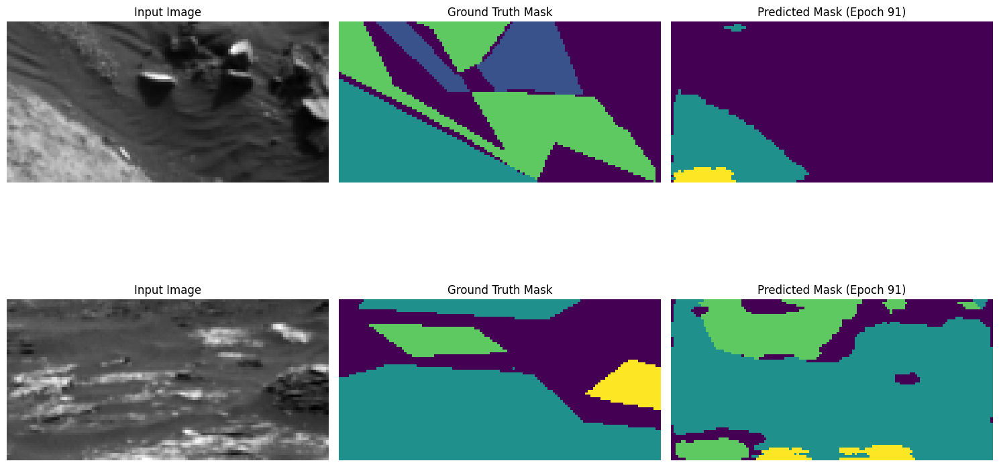

Epoch 92/50, Train Loss: 170.0694, Val Loss: 12.0739, Mean IoU: 0.4345
Class 0 IoU: 0.6401
Class 1 IoU: 0.4908
Class 2 IoU: 0.5894
Class 3 IoU: 0.0177


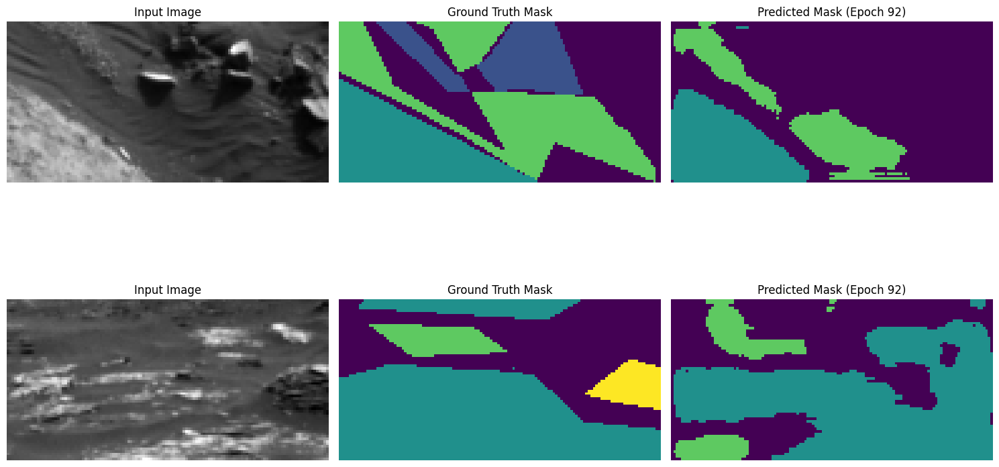

Epoch 93/50, Train Loss: 165.0124, Val Loss: 12.7049, Mean IoU: 0.4166
Class 0 IoU: 0.6041
Class 1 IoU: 0.4782
Class 2 IoU: 0.5734
Class 3 IoU: 0.0107


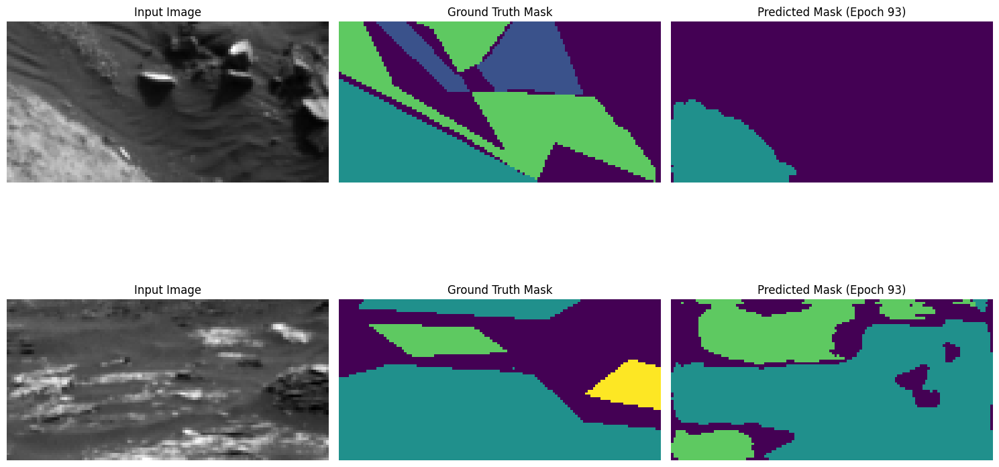

Epoch 94/50, Train Loss: 162.9336, Val Loss: 13.5587, Mean IoU: 0.4356
Class 0 IoU: 0.6266
Class 1 IoU: 0.4959
Class 2 IoU: 0.6153
Class 3 IoU: 0.0047


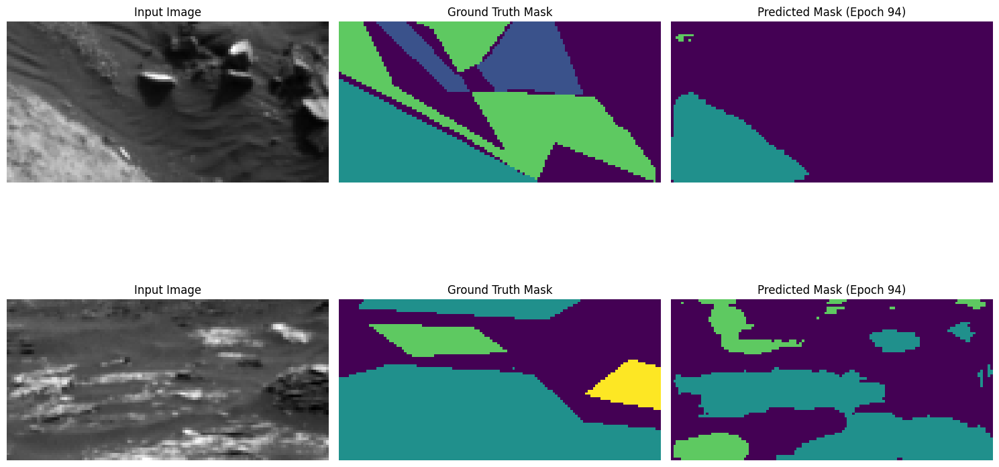

Epoch 95/50, Train Loss: 160.6572, Val Loss: 12.4272, Mean IoU: 0.4263
Class 0 IoU: 0.5948
Class 1 IoU: 0.4890
Class 2 IoU: 0.5935
Class 3 IoU: 0.0278


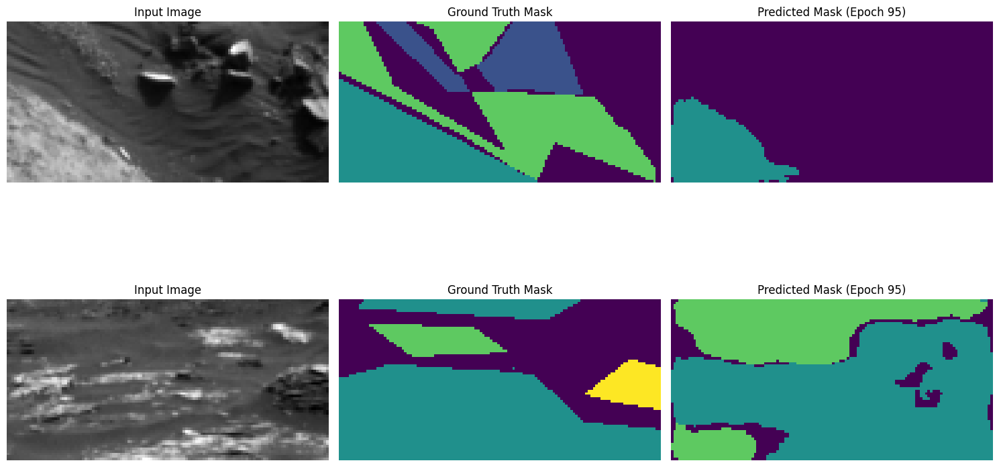

Epoch 96/50, Train Loss: 163.6975, Val Loss: 11.6697, Mean IoU: 0.4529
Class 0 IoU: 0.6462
Class 1 IoU: 0.5174
Class 2 IoU: 0.5982
Class 3 IoU: 0.0499


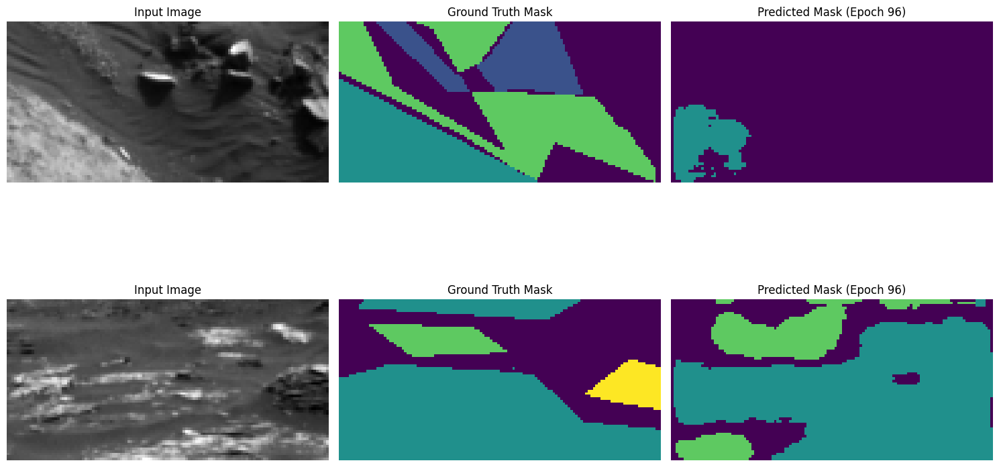

Model saved with new best Mean IoU: 0.4529
Epoch 97/50, Train Loss: 164.4330, Val Loss: 11.0472, Mean IoU: 0.4260
Class 0 IoU: 0.5973
Class 1 IoU: 0.4727
Class 2 IoU: 0.5634
Class 3 IoU: 0.0708


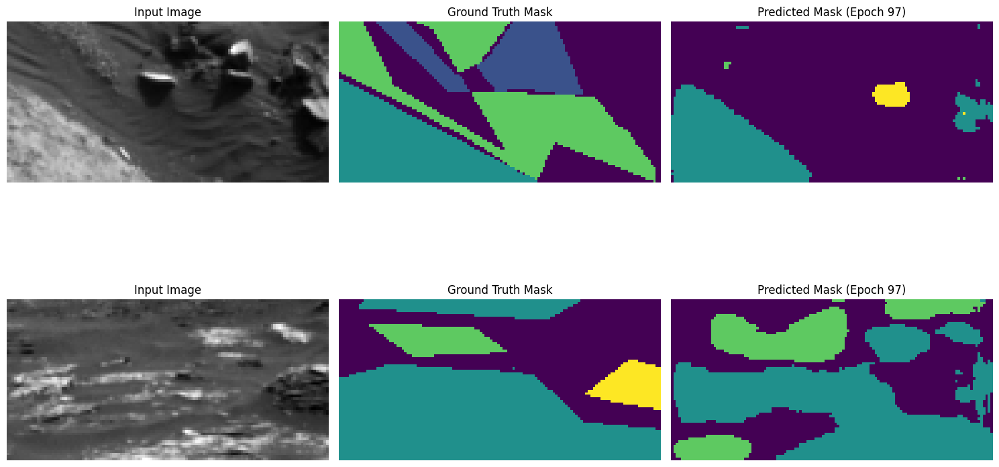

Epoch 98/50, Train Loss: 164.3431, Val Loss: 11.4304, Mean IoU: 0.4422
Class 0 IoU: 0.6320
Class 1 IoU: 0.5139
Class 2 IoU: 0.5980
Class 3 IoU: 0.0250


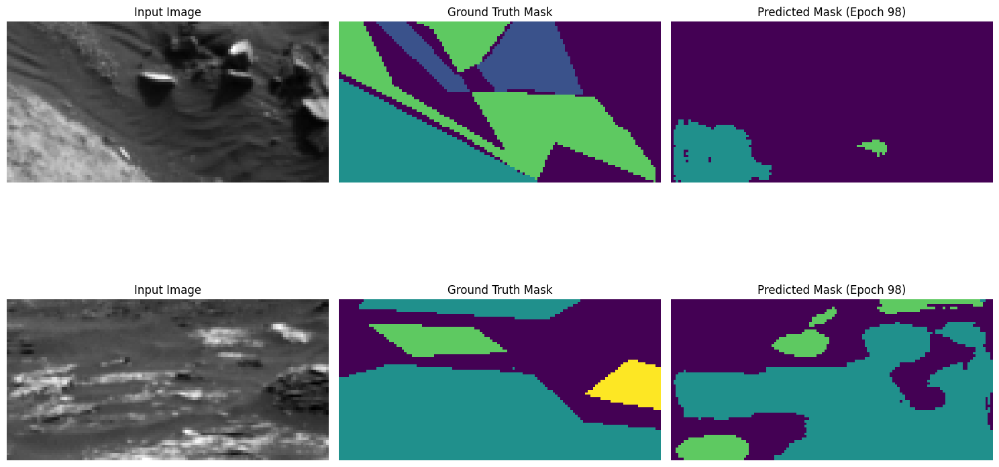

Epoch 99/50, Train Loss: 159.9114, Val Loss: 11.6754, Mean IoU: 0.4342
Class 0 IoU: 0.6055
Class 1 IoU: 0.5035
Class 2 IoU: 0.5843
Class 3 IoU: 0.0433


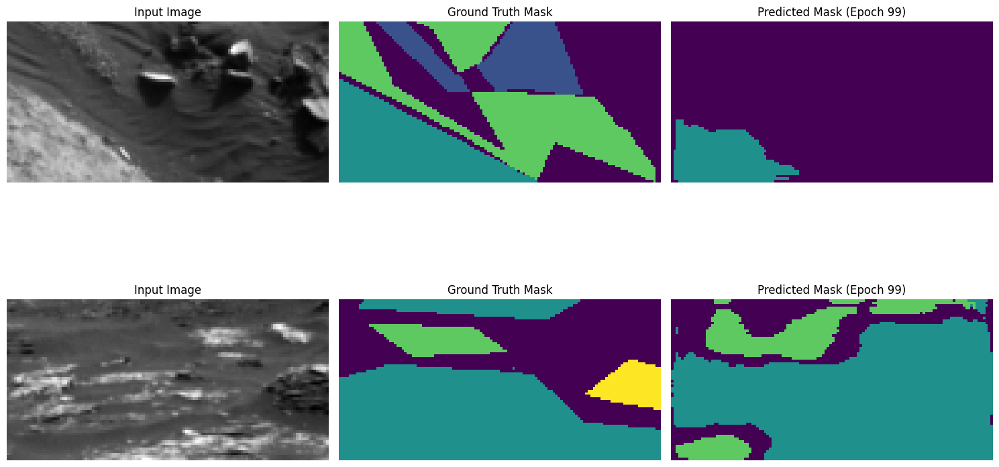

Epoch 100/50, Train Loss: 155.2269, Val Loss: 12.1680, Mean IoU: 0.4366
Class 0 IoU: 0.6287
Class 1 IoU: 0.4825
Class 2 IoU: 0.5930
Class 3 IoU: 0.0422


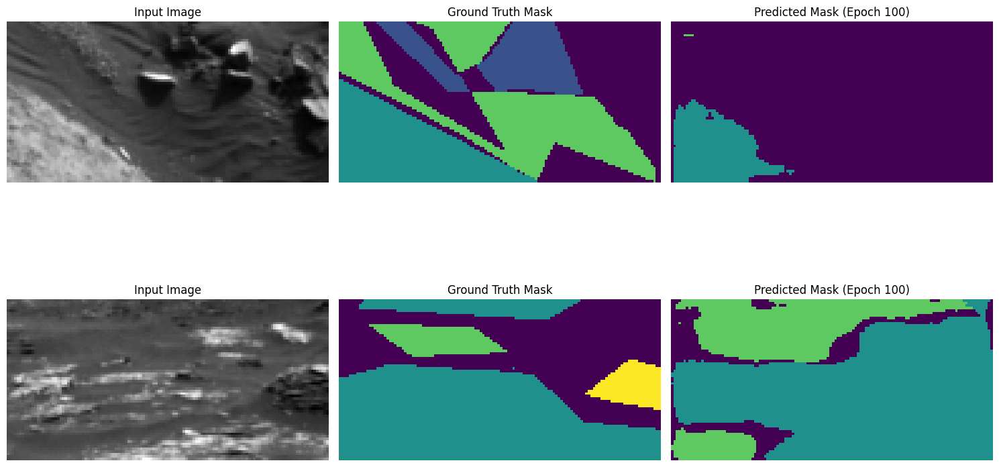

Epoch 101/50, Train Loss: 152.5769, Val Loss: 13.4096, Mean IoU: 0.4425
Class 0 IoU: 0.6308
Class 1 IoU: 0.4987
Class 2 IoU: 0.6332
Class 3 IoU: 0.0072


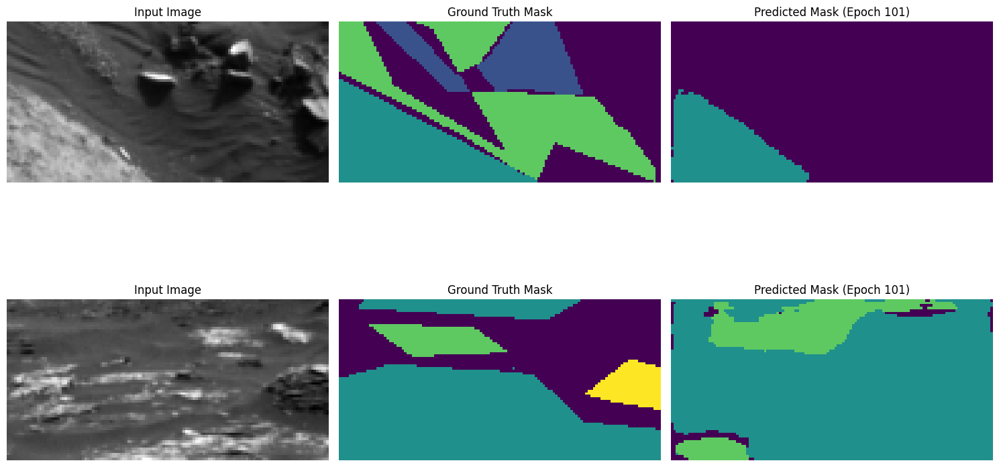

Epoch 102/50, Train Loss: 149.2322, Val Loss: 13.8475, Mean IoU: 0.4204
Class 0 IoU: 0.5763
Class 1 IoU: 0.5005
Class 2 IoU: 0.5904
Class 3 IoU: 0.0142


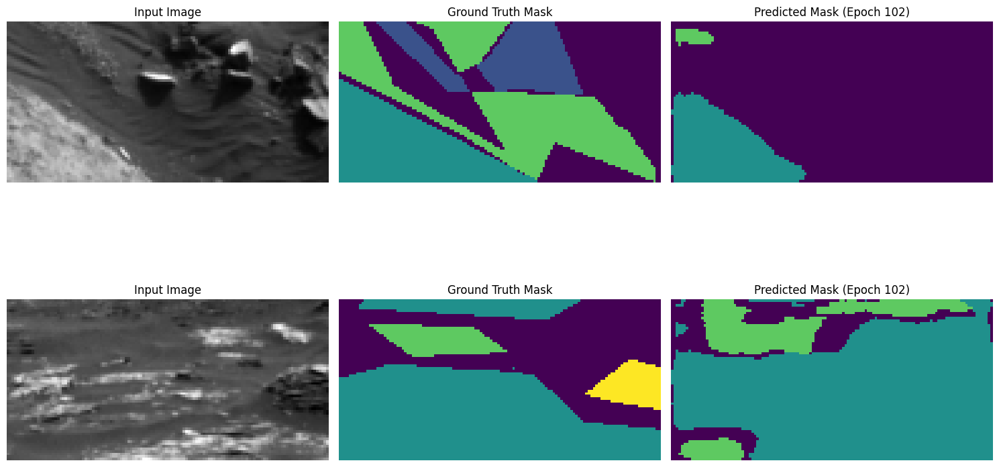

Epoch 103/50, Train Loss: 147.2717, Val Loss: 13.0042, Mean IoU: 0.4145
Class 0 IoU: 0.5528
Class 1 IoU: 0.4749
Class 2 IoU: 0.6030
Class 3 IoU: 0.0274


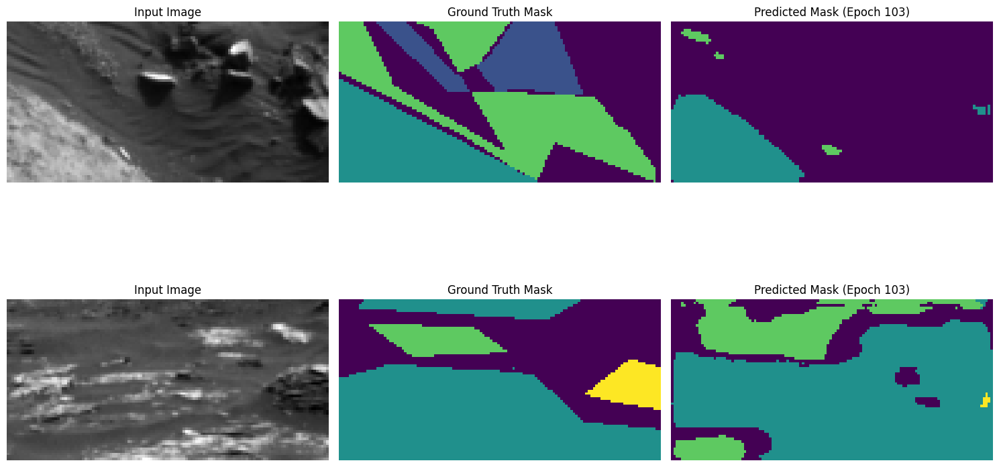

Epoch 104/50, Train Loss: 145.6618, Val Loss: 14.3178, Mean IoU: 0.4422
Class 0 IoU: 0.6422
Class 1 IoU: 0.5091
Class 2 IoU: 0.6110
Class 3 IoU: 0.0063


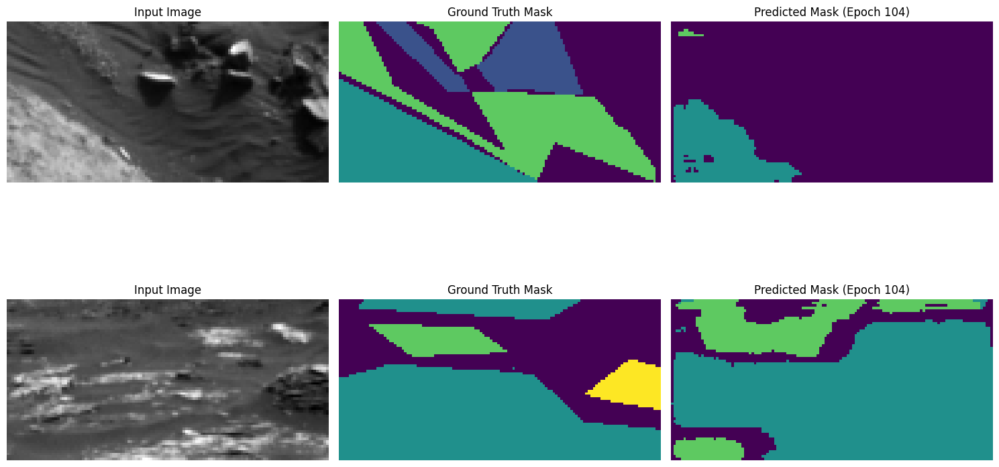

Epoch 105/50, Train Loss: 147.8847, Val Loss: 14.8943, Mean IoU: 0.4224
Class 0 IoU: 0.6002
Class 1 IoU: 0.4894
Class 2 IoU: 0.5995
Class 3 IoU: 0.0004


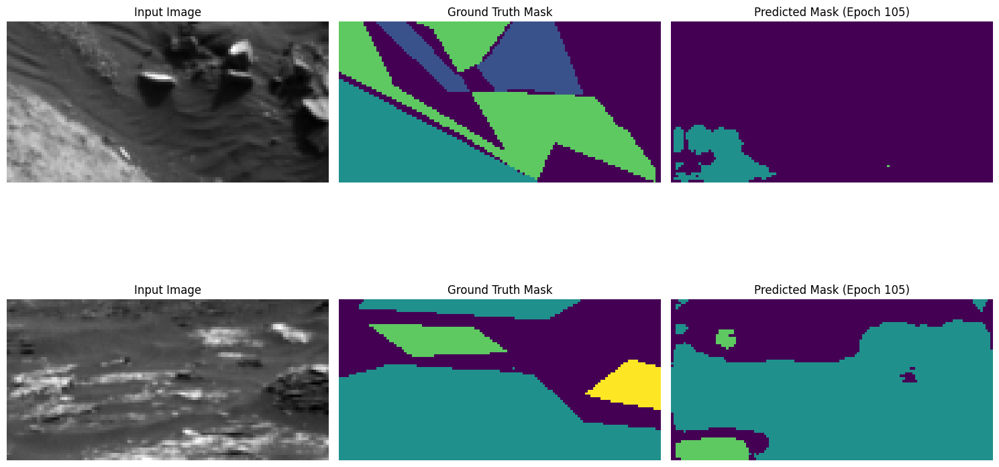

Epoch 106/50, Train Loss: 153.9918, Val Loss: 13.7903, Mean IoU: 0.4262
Class 0 IoU: 0.6066
Class 1 IoU: 0.4843
Class 2 IoU: 0.6087
Class 3 IoU: 0.0053


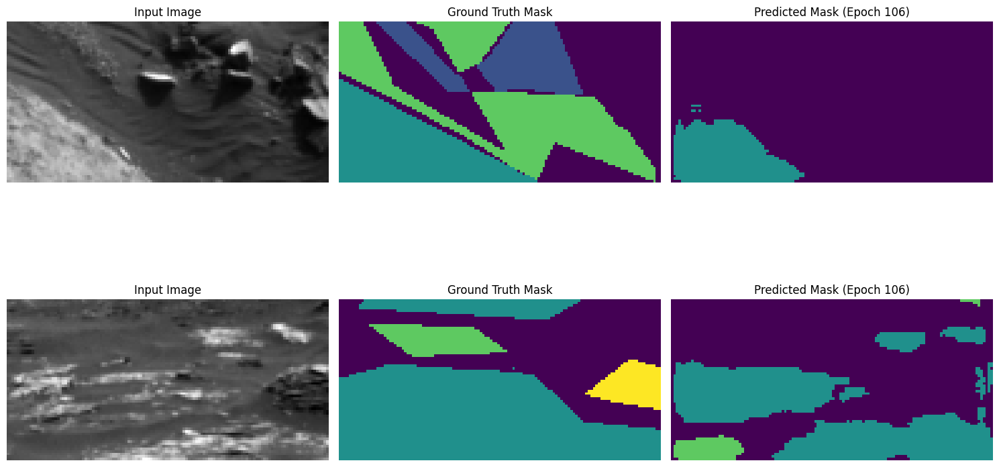

Epoch 107/50, Train Loss: 146.3385, Val Loss: 13.7871, Mean IoU: 0.4216
Class 0 IoU: 0.6102
Class 1 IoU: 0.4816
Class 2 IoU: 0.5863
Class 3 IoU: 0.0082


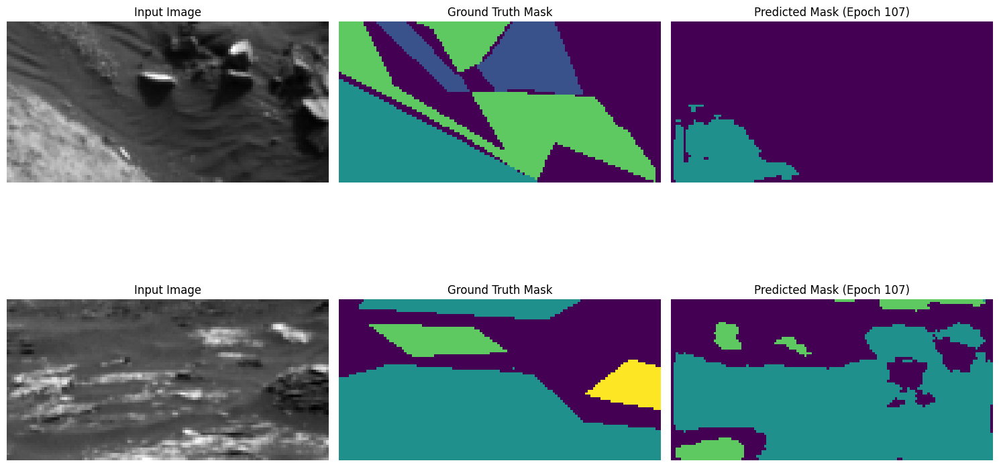

Epoch 108/50, Train Loss: 143.5750, Val Loss: 14.5675, Mean IoU: 0.4234
Class 0 IoU: 0.6210
Class 1 IoU: 0.5058
Class 2 IoU: 0.5521
Class 3 IoU: 0.0147


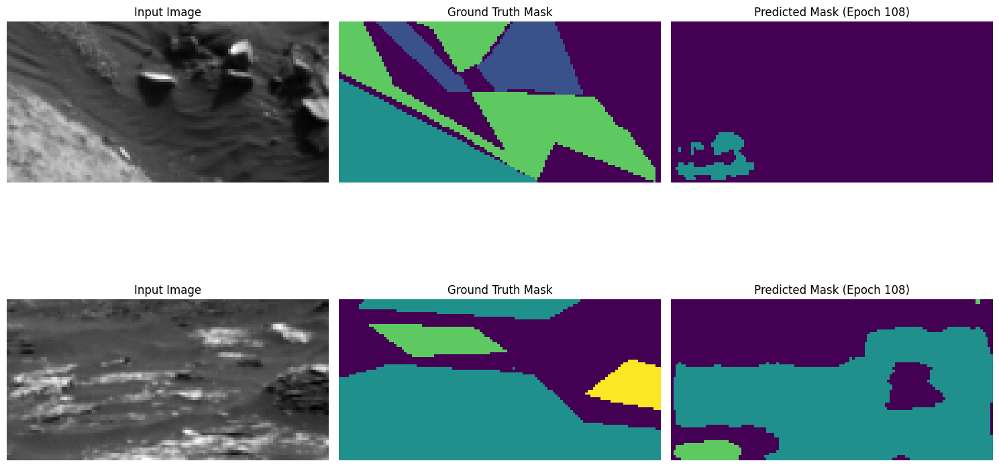

Epoch 109/50, Train Loss: 137.3798, Val Loss: 15.7030, Mean IoU: 0.4218
Class 0 IoU: 0.6250
Class 1 IoU: 0.4873
Class 2 IoU: 0.5724
Class 3 IoU: 0.0027


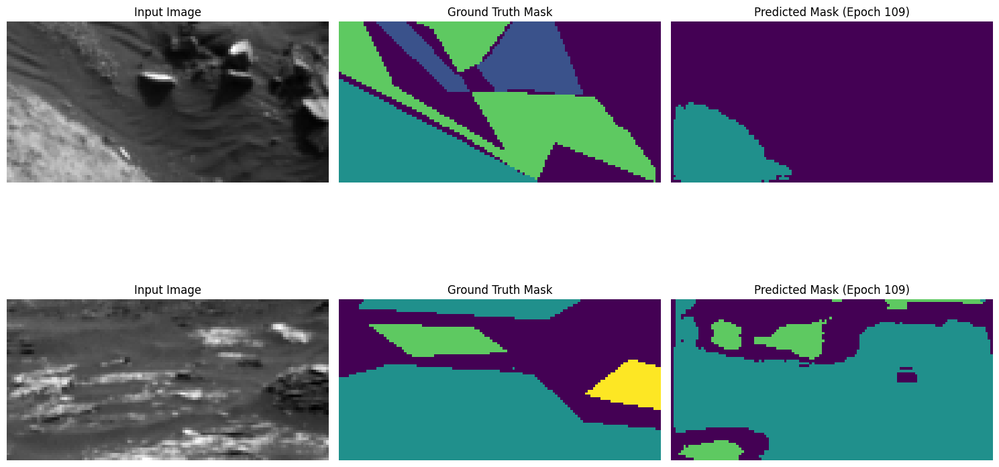

Epoch 110/50, Train Loss: 137.9836, Val Loss: 15.5266, Mean IoU: 0.4192
Class 0 IoU: 0.6150
Class 1 IoU: 0.4619
Class 2 IoU: 0.6000
Class 3 IoU: 0.0000


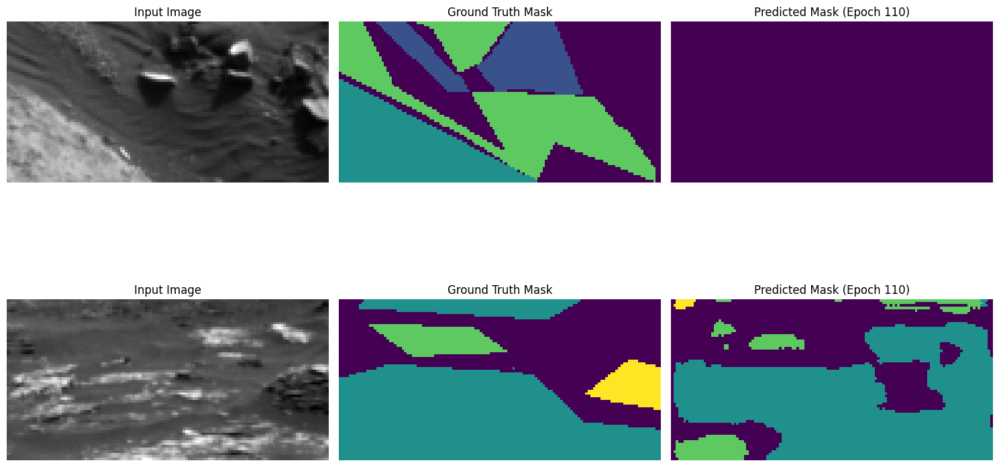

Epoch 111/50, Train Loss: 135.6523, Val Loss: 15.2560, Mean IoU: 0.4151
Class 0 IoU: 0.5900
Class 1 IoU: 0.4804
Class 2 IoU: 0.5832
Class 3 IoU: 0.0069


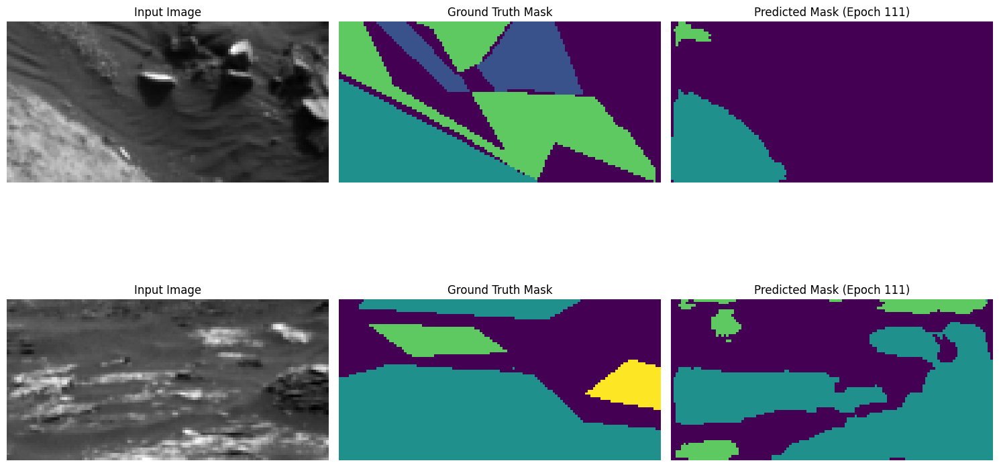

Epoch 112/50, Train Loss: 139.6609, Val Loss: 16.8556, Mean IoU: 0.4119
Class 0 IoU: 0.5835
Class 1 IoU: 0.4911
Class 2 IoU: 0.5732
Class 3 IoU: 0.0000


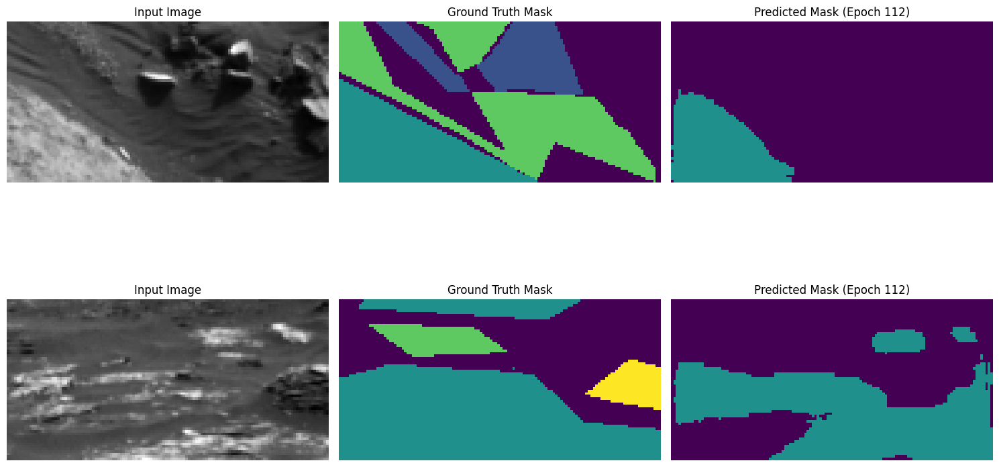

Epoch 113/50, Train Loss: 139.0834, Val Loss: 15.3973, Mean IoU: 0.4383
Class 0 IoU: 0.6253
Class 1 IoU: 0.5044
Class 2 IoU: 0.6187
Class 3 IoU: 0.0048


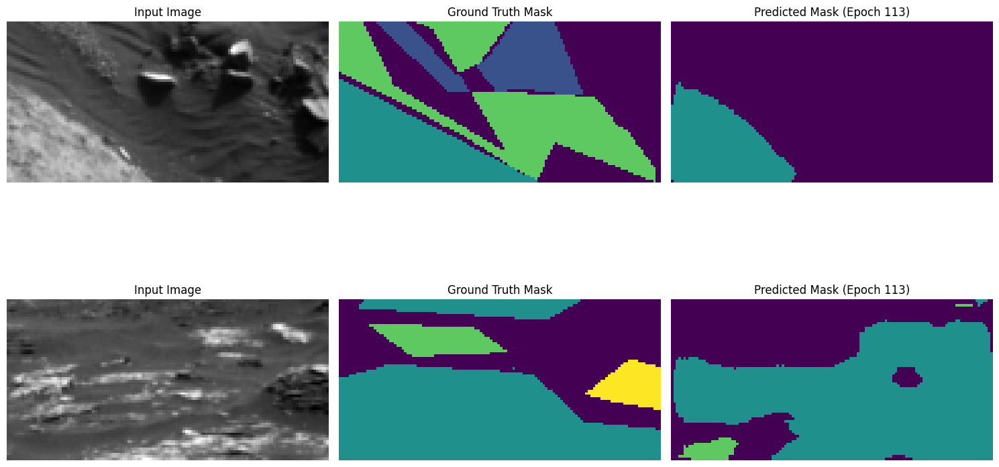

Epoch 114/50, Train Loss: 136.5142, Val Loss: 14.7632, Mean IoU: 0.4466
Class 0 IoU: 0.6577
Class 1 IoU: 0.5102
Class 2 IoU: 0.6159
Class 3 IoU: 0.0026


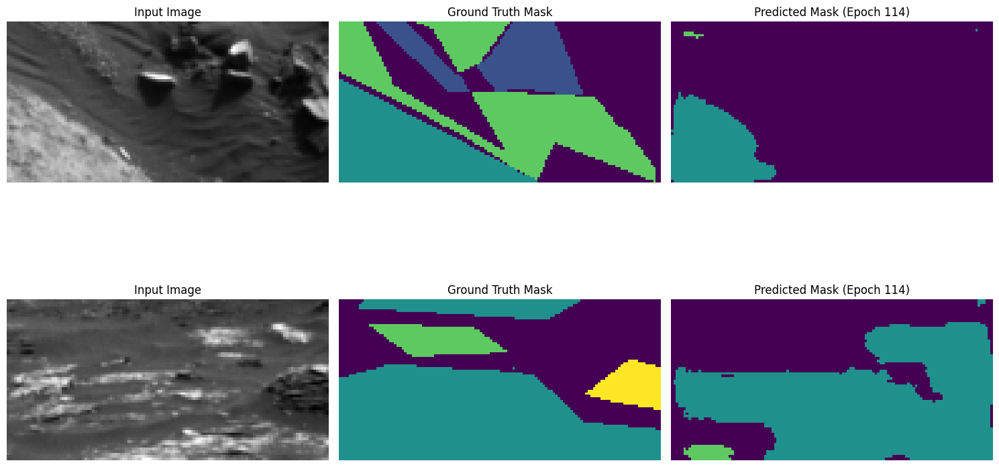

Epoch 115/50, Train Loss: 143.6424, Val Loss: 20.8142, Mean IoU: 0.3697
Class 0 IoU: 0.5013
Class 1 IoU: 0.4441
Class 2 IoU: 0.5327
Class 3 IoU: 0.0007


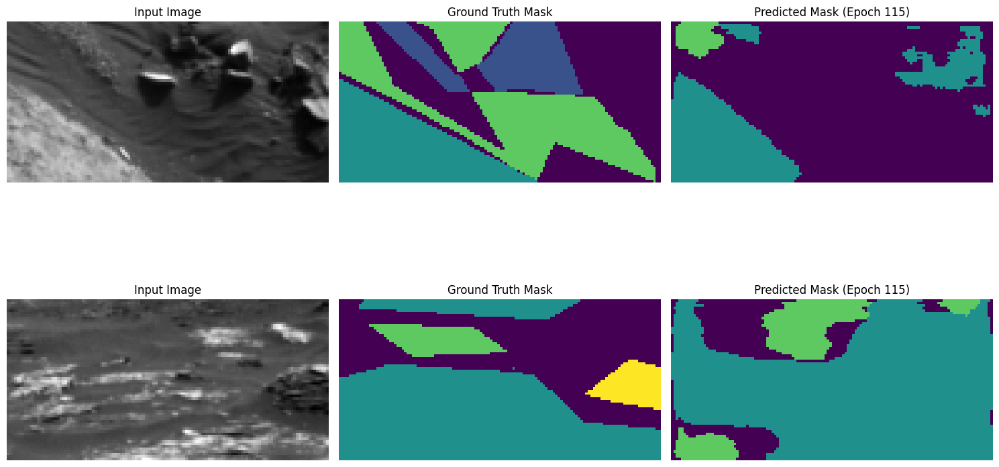

Epoch 116/50, Train Loss: 151.9691, Val Loss: 14.5942, Mean IoU: 0.4376
Class 0 IoU: 0.6257
Class 1 IoU: 0.5116
Class 2 IoU: 0.6041
Class 3 IoU: 0.0091


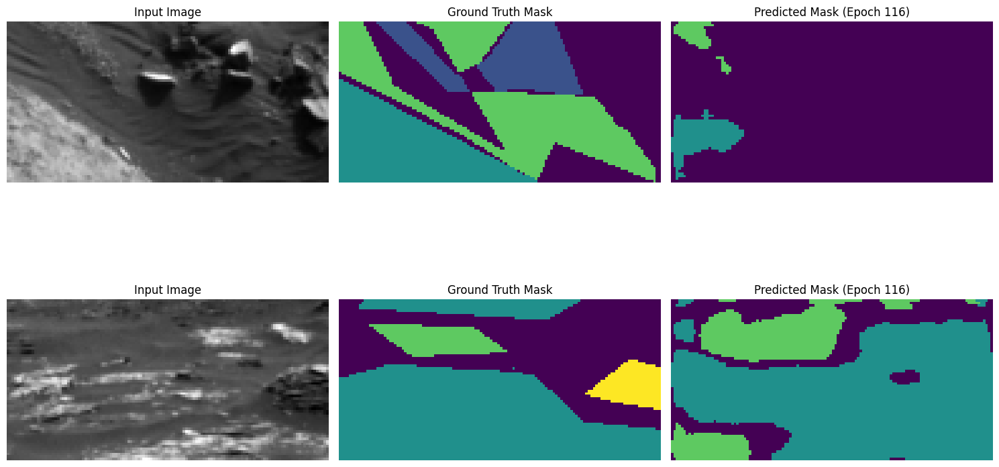

Epoch 117/50, Train Loss: 136.4336, Val Loss: 14.2547, Mean IoU: 0.4181
Class 0 IoU: 0.5915
Class 1 IoU: 0.4926
Class 2 IoU: 0.5789
Class 3 IoU: 0.0093


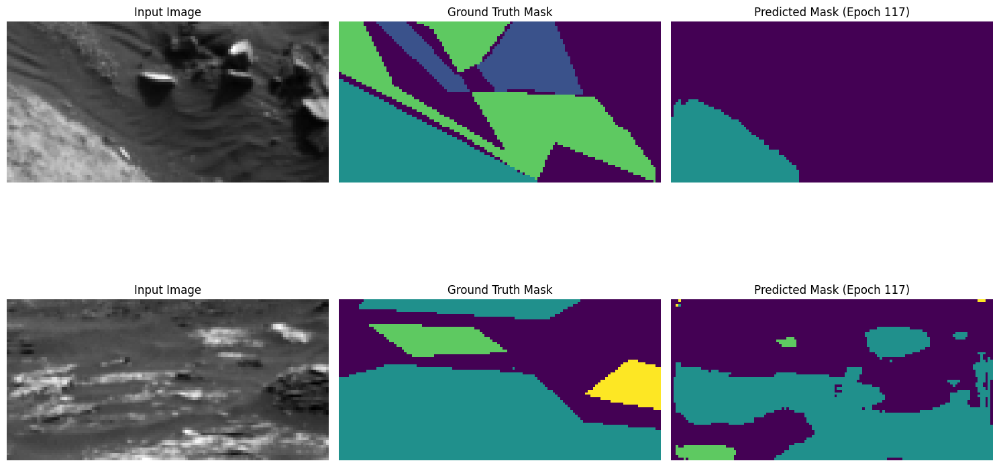

Epoch 118/50, Train Loss: 129.8742, Val Loss: 16.1496, Mean IoU: 0.4243
Class 0 IoU: 0.6217
Class 1 IoU: 0.4837
Class 2 IoU: 0.5868
Class 3 IoU: 0.0050


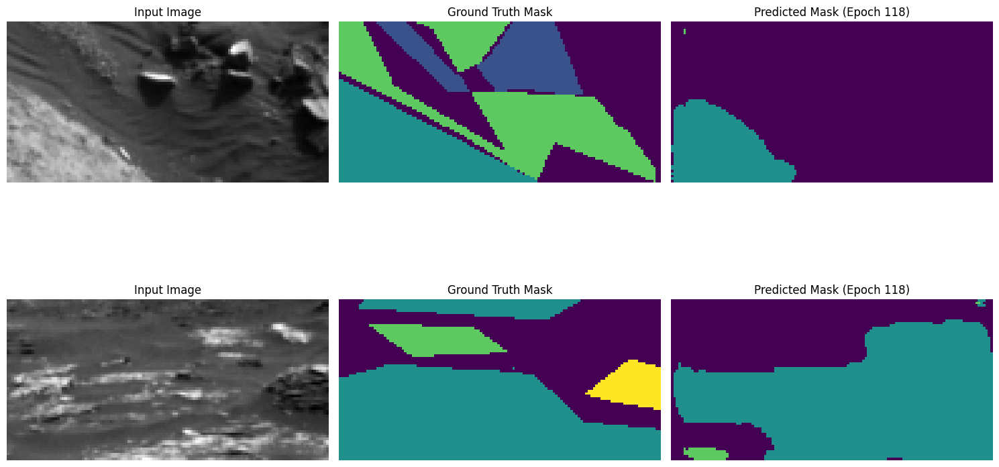

Epoch 119/50, Train Loss: 136.3759, Val Loss: 17.1645, Mean IoU: 0.4168
Class 0 IoU: 0.6312
Class 1 IoU: 0.4850
Class 2 IoU: 0.5512
Class 3 IoU: 0.0000


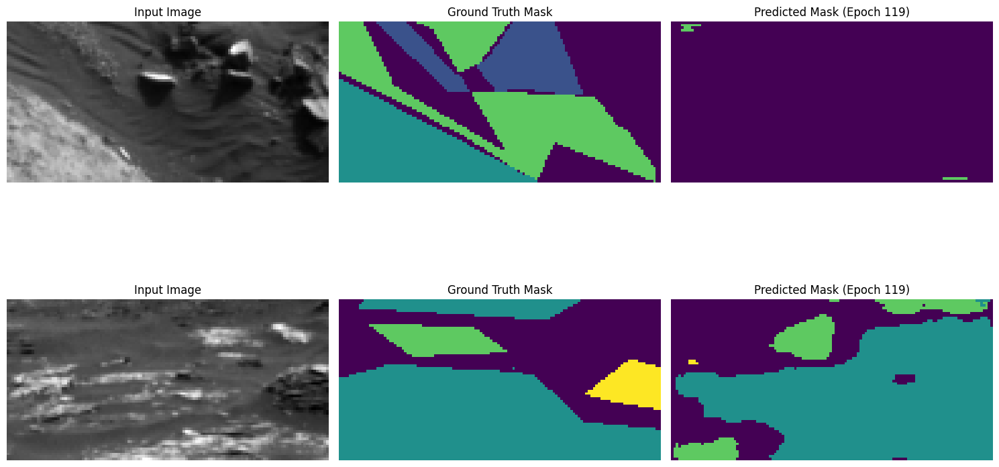

Epoch 120/50, Train Loss: 133.8809, Val Loss: 15.5879, Mean IoU: 0.4164
Class 0 IoU: 0.5998
Class 1 IoU: 0.4942
Class 2 IoU: 0.5677
Class 3 IoU: 0.0041


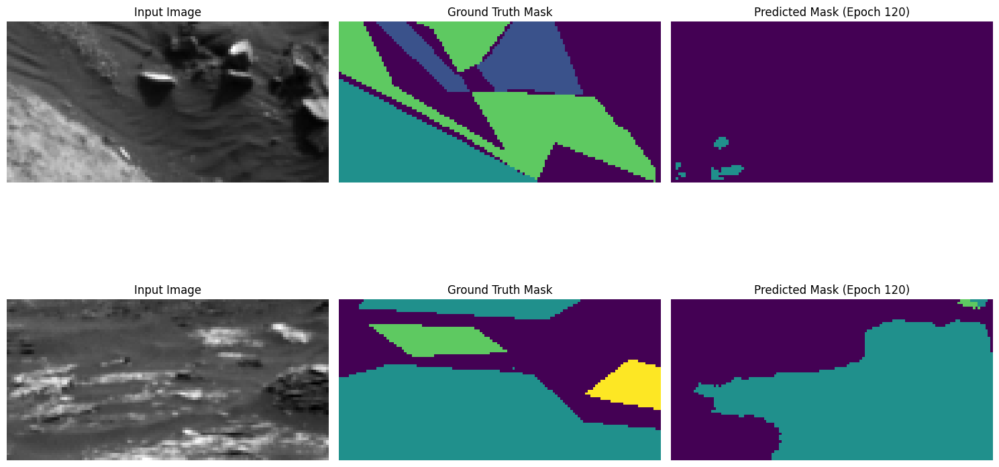

Epoch 121/50, Train Loss: 126.4581, Val Loss: 15.4548, Mean IoU: 0.4204
Class 0 IoU: 0.6240
Class 1 IoU: 0.4715
Class 2 IoU: 0.5810
Class 3 IoU: 0.0053


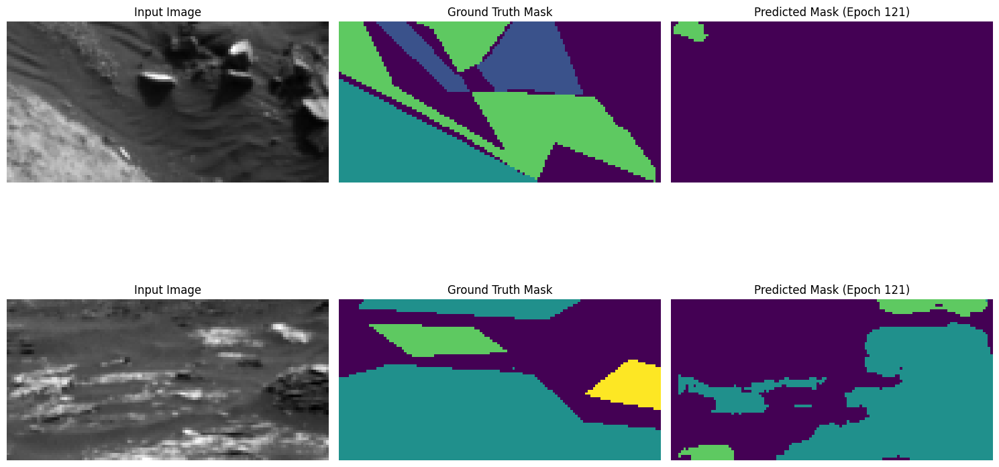

Epoch 122/50, Train Loss: 125.7635, Val Loss: 16.9432, Mean IoU: 0.4253
Class 0 IoU: 0.6158
Class 1 IoU: 0.4942
Class 2 IoU: 0.5878
Class 3 IoU: 0.0036


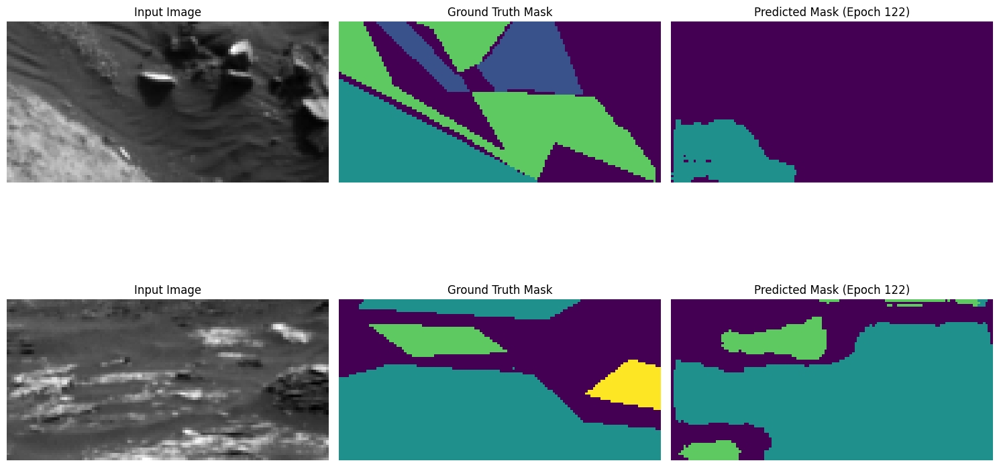

Epoch 123/50, Train Loss: 122.2626, Val Loss: 16.7135, Mean IoU: 0.4102
Class 0 IoU: 0.5858
Class 1 IoU: 0.4812
Class 2 IoU: 0.5725
Class 3 IoU: 0.0013


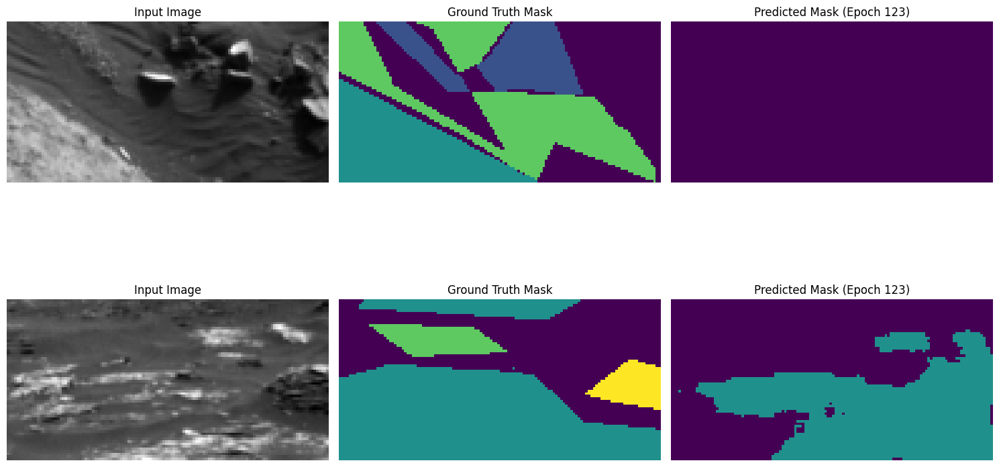

Epoch 124/50, Train Loss: 123.7089, Val Loss: 15.4800, Mean IoU: 0.4245
Class 0 IoU: 0.6076
Class 1 IoU: 0.5024
Class 2 IoU: 0.5878
Class 3 IoU: 0.0000


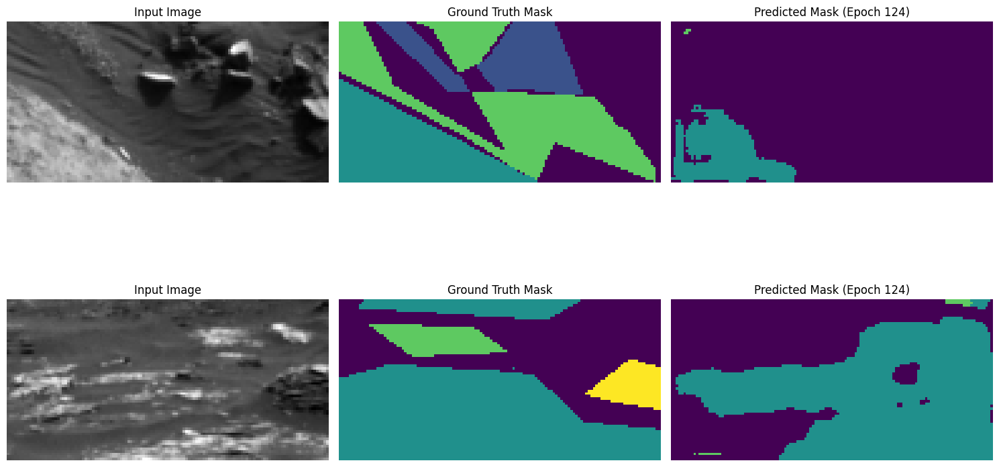

Epoch 125/50, Train Loss: 138.1787, Val Loss: 16.1570, Mean IoU: 0.4232
Class 0 IoU: 0.6147
Class 1 IoU: 0.4910
Class 2 IoU: 0.5859
Class 3 IoU: 0.0011


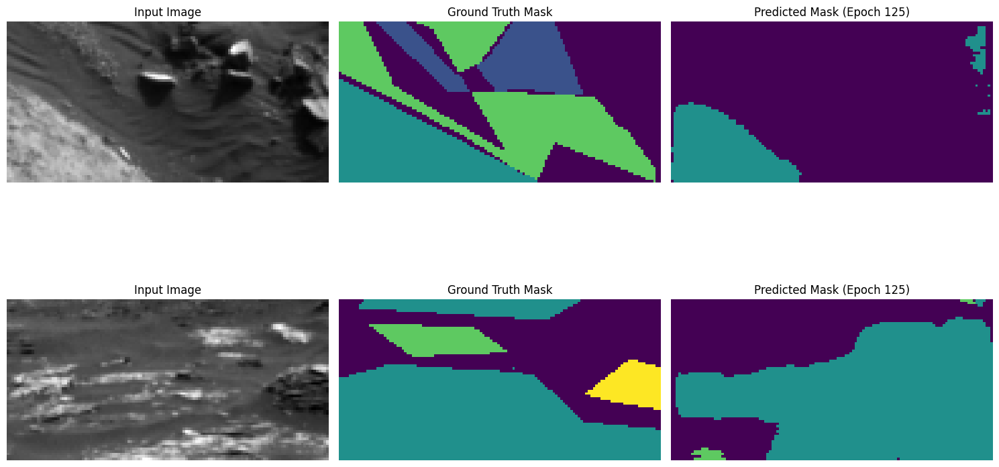

Epoch 126/50, Train Loss: 124.4196, Val Loss: 16.4022, Mean IoU: 0.4275
Class 0 IoU: 0.6269
Class 1 IoU: 0.4986
Class 2 IoU: 0.5821
Class 3 IoU: 0.0023


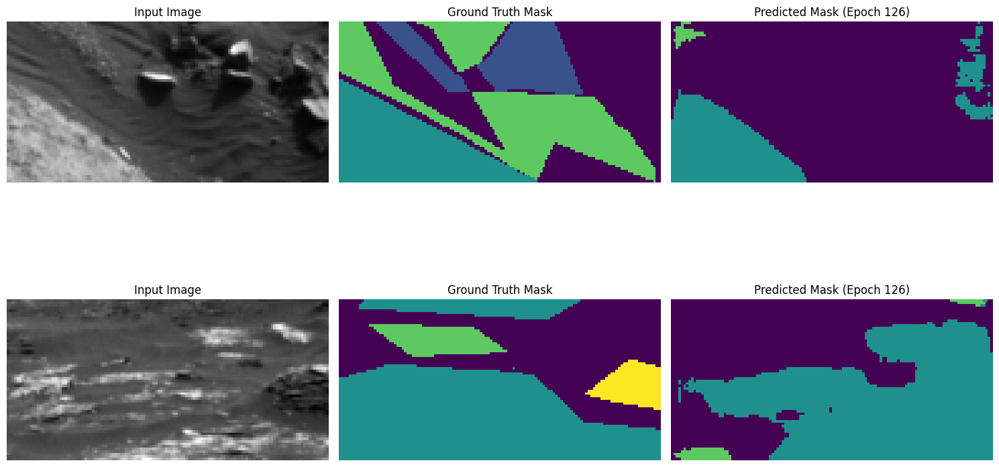

Epoch 127/50, Train Loss: 122.6375, Val Loss: 17.5768, Mean IoU: 0.4282
Class 0 IoU: 0.6275
Class 1 IoU: 0.5145
Class 2 IoU: 0.5682
Class 3 IoU: 0.0026


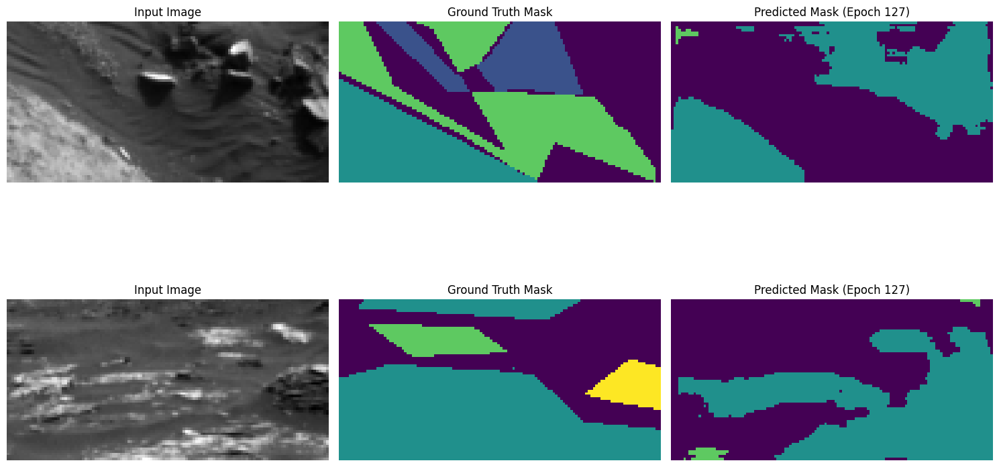

Epoch 128/50, Train Loss: 113.1990, Val Loss: 13.5896, Mean IoU: 0.4240
Class 0 IoU: 0.6001
Class 1 IoU: 0.4908
Class 2 IoU: 0.5806
Class 3 IoU: 0.0244


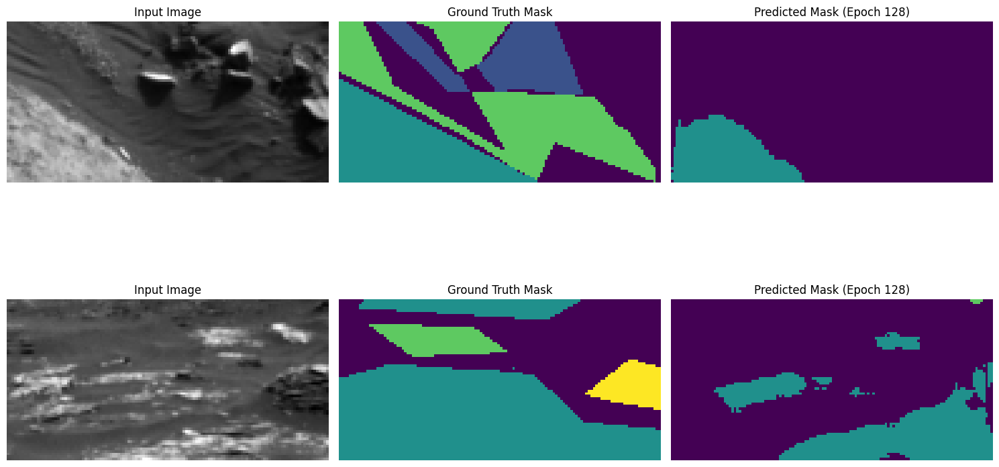

Epoch 129/50, Train Loss: 114.5562, Val Loss: 15.1596, Mean IoU: 0.4322
Class 0 IoU: 0.6113
Class 1 IoU: 0.5022
Class 2 IoU: 0.5913
Class 3 IoU: 0.0241


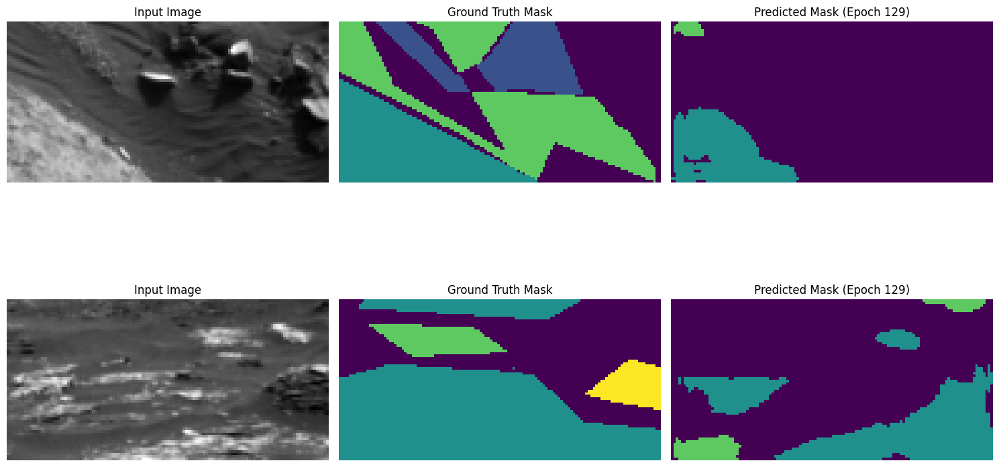

Epoch 130/50, Train Loss: 116.4136, Val Loss: 17.1013, Mean IoU: 0.4280
Class 0 IoU: 0.6273
Class 1 IoU: 0.5034
Class 2 IoU: 0.5801
Class 3 IoU: 0.0009


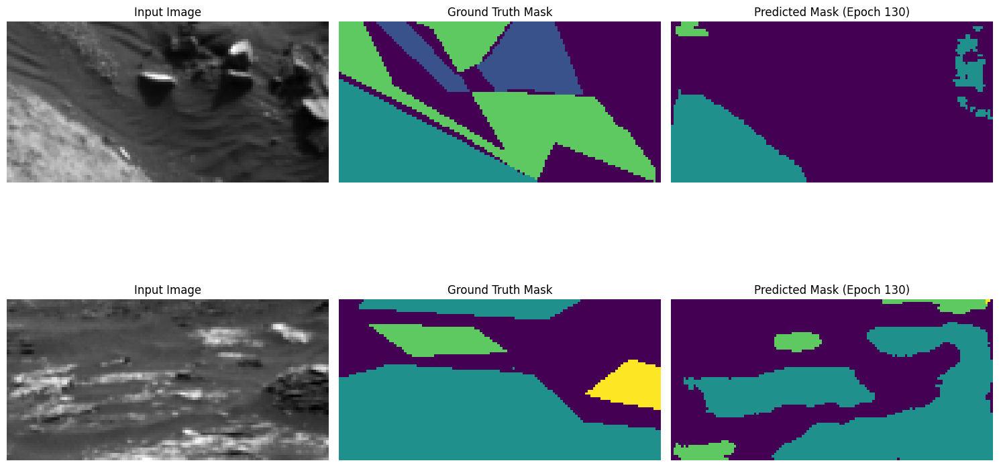

Epoch 131/50, Train Loss: 116.7155, Val Loss: 14.6382, Mean IoU: 0.4217
Class 0 IoU: 0.6181
Class 1 IoU: 0.5018
Class 2 IoU: 0.5562
Class 3 IoU: 0.0109


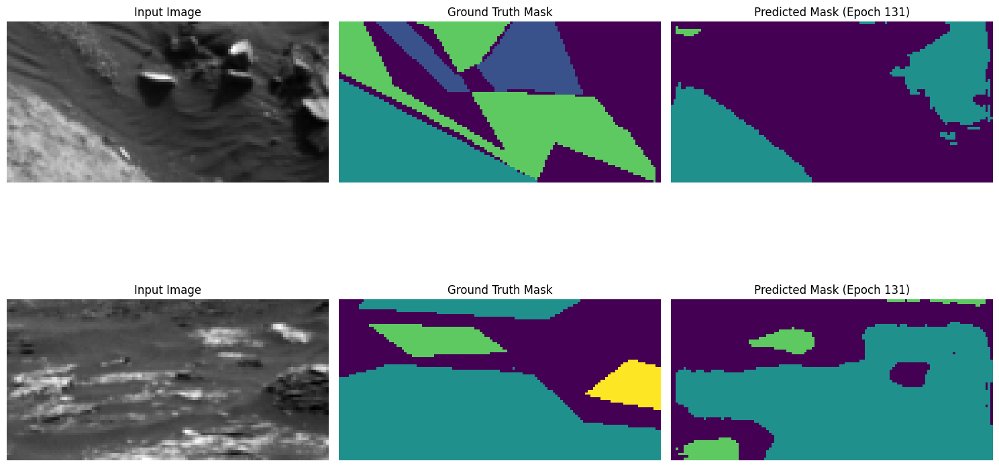

Epoch 132/50, Train Loss: 114.9794, Val Loss: 16.9163, Mean IoU: 0.4355
Class 0 IoU: 0.6357
Class 1 IoU: 0.5029
Class 2 IoU: 0.5895
Class 3 IoU: 0.0141


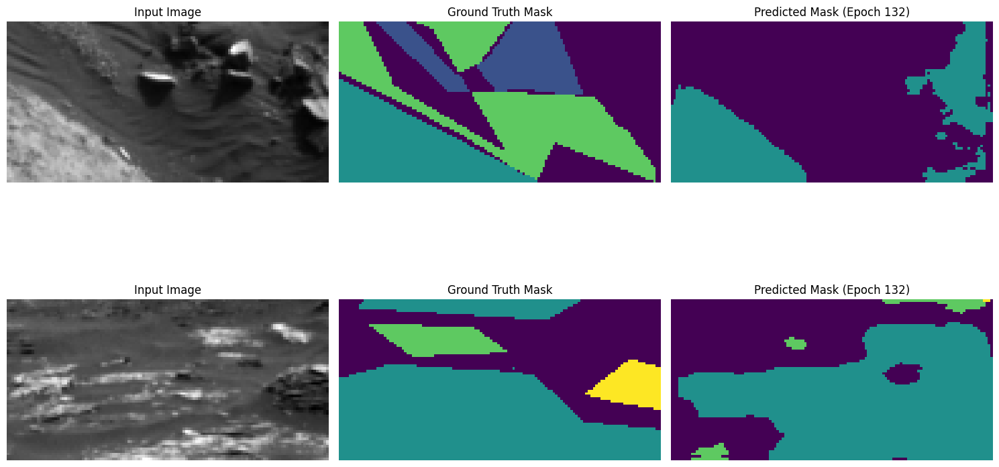

Epoch 133/50, Train Loss: 119.6124, Val Loss: 16.2217, Mean IoU: 0.4183
Class 0 IoU: 0.5843
Class 1 IoU: 0.4909
Class 2 IoU: 0.5827
Class 3 IoU: 0.0153


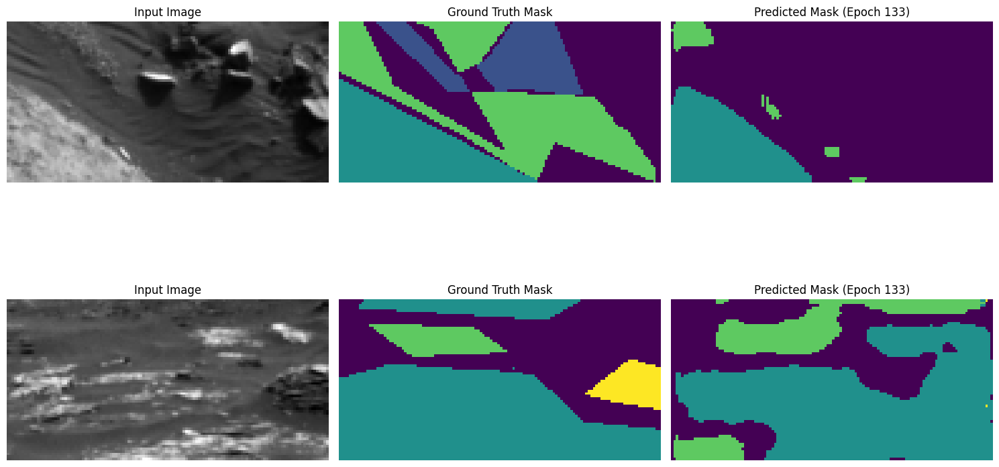

Epoch 134/50, Train Loss: 117.0580, Val Loss: 15.3962, Mean IoU: 0.4224
Class 0 IoU: 0.5914
Class 1 IoU: 0.5105
Class 2 IoU: 0.5716
Class 3 IoU: 0.0159


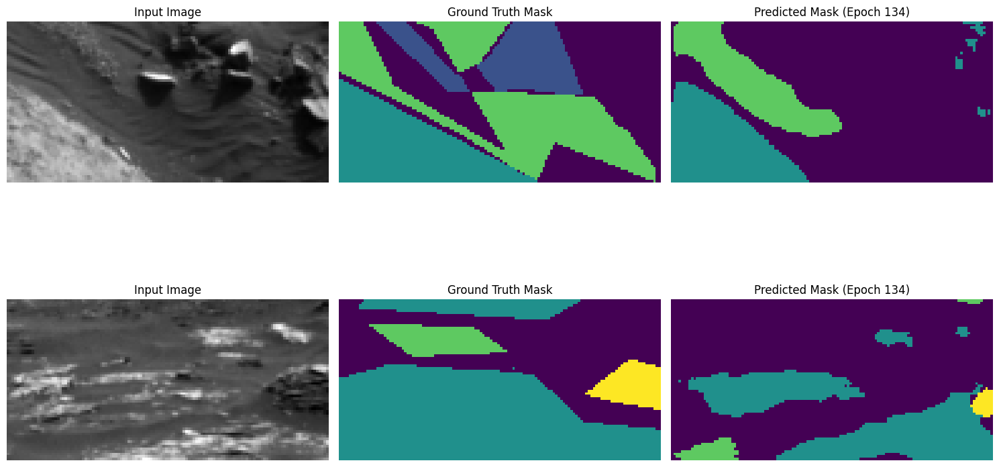

Epoch 135/50, Train Loss: 111.0906, Val Loss: 16.9543, Mean IoU: 0.4350
Class 0 IoU: 0.6428
Class 1 IoU: 0.5092
Class 2 IoU: 0.5759
Class 3 IoU: 0.0122


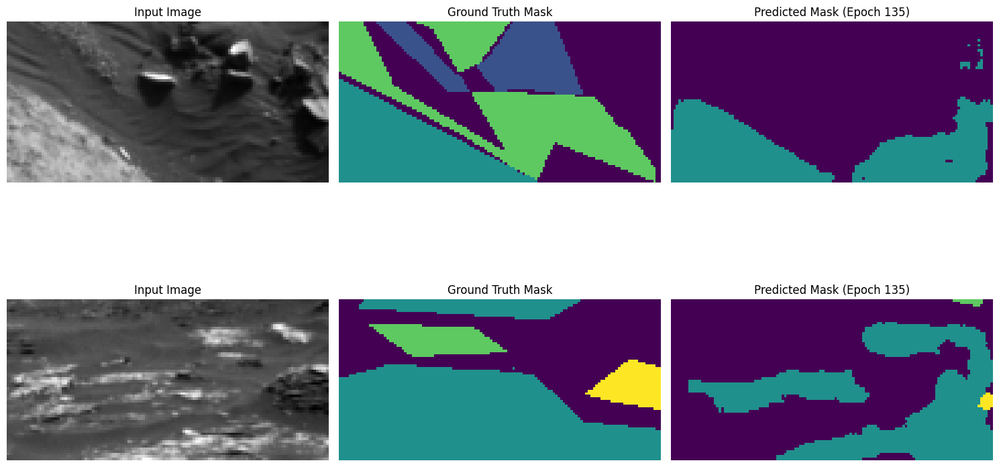

Epoch 136/50, Train Loss: 108.0323, Val Loss: 15.7691, Mean IoU: 0.4235
Class 0 IoU: 0.6314
Class 1 IoU: 0.5027
Class 2 IoU: 0.5472
Class 3 IoU: 0.0126


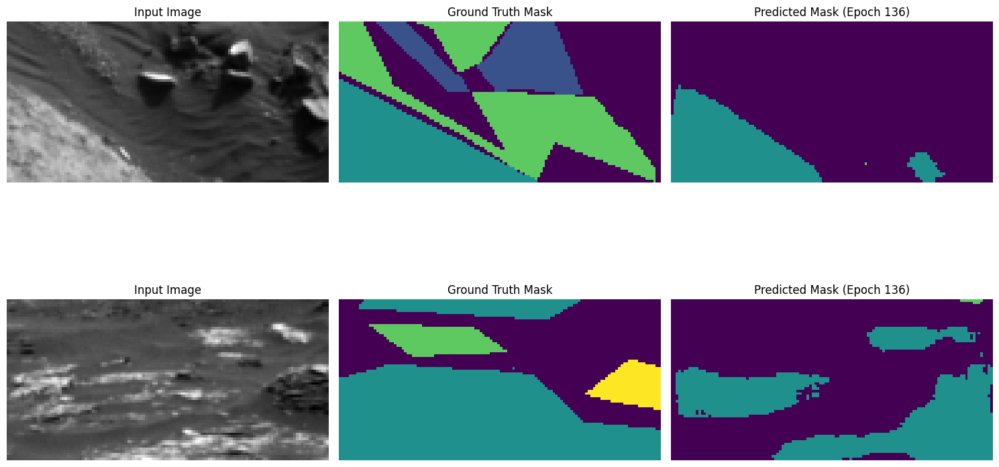

Epoch 137/50, Train Loss: 109.3661, Val Loss: 14.1343, Mean IoU: 0.4338
Class 0 IoU: 0.6169
Class 1 IoU: 0.5068
Class 2 IoU: 0.5807
Class 3 IoU: 0.0306


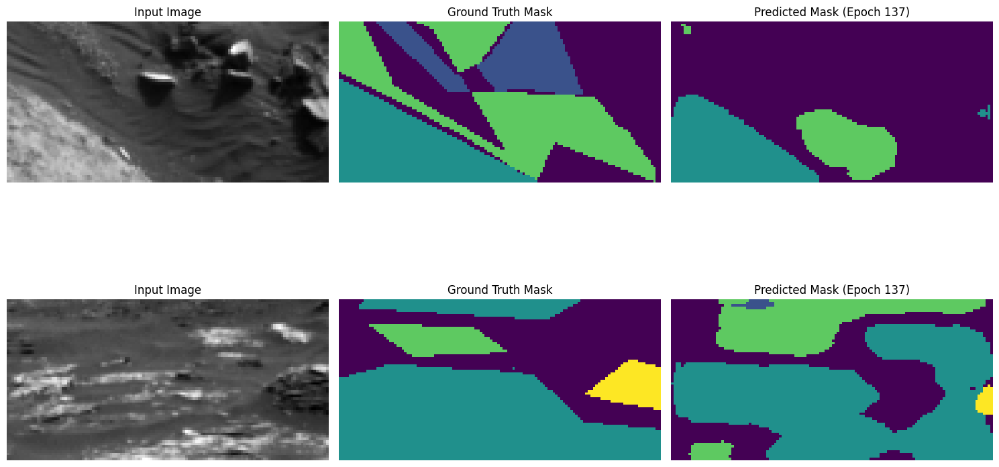

Epoch 138/50, Train Loss: 109.2556, Val Loss: 14.8827, Mean IoU: 0.4354
Class 0 IoU: 0.6071
Class 1 IoU: 0.4880
Class 2 IoU: 0.6041
Class 3 IoU: 0.0425


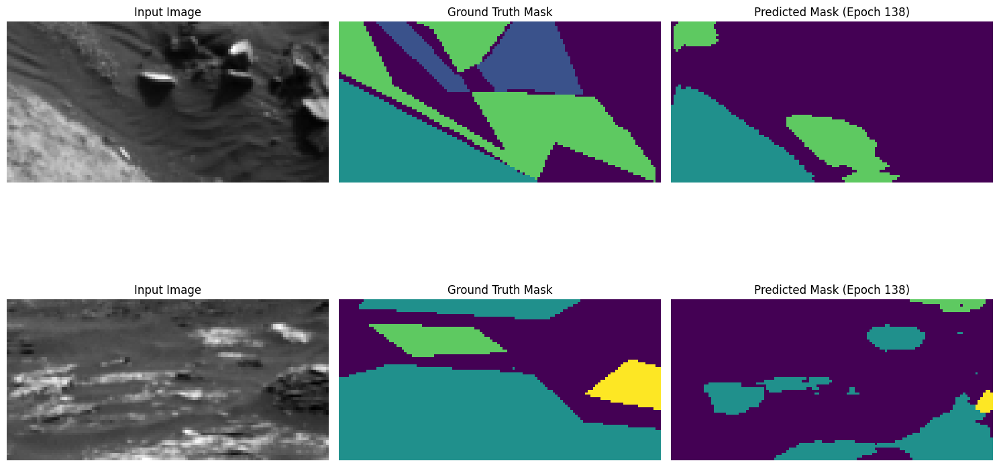

Epoch 139/50, Train Loss: 104.7119, Val Loss: 14.4951, Mean IoU: 0.4251
Class 0 IoU: 0.5847
Class 1 IoU: 0.4802
Class 2 IoU: 0.5892
Class 3 IoU: 0.0463


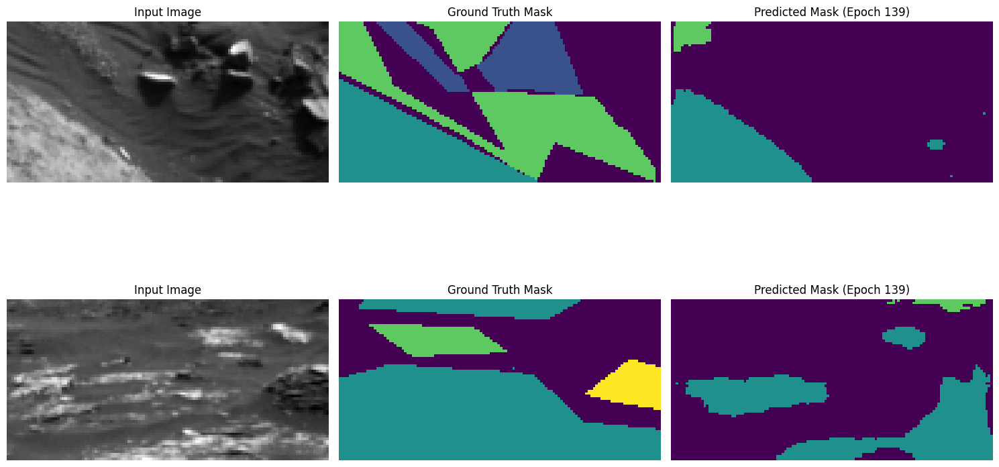

Epoch 140/50, Train Loss: 107.2259, Val Loss: 15.7995, Mean IoU: 0.4295
Class 0 IoU: 0.6185
Class 1 IoU: 0.4952
Class 2 IoU: 0.5881
Class 3 IoU: 0.0163


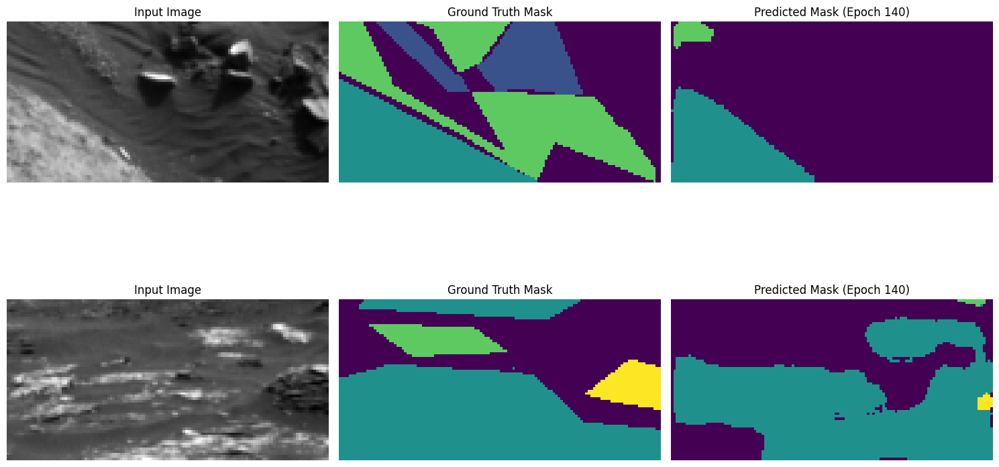

Epoch 141/50, Train Loss: 106.7894, Val Loss: 16.4495, Mean IoU: 0.4055
Class 0 IoU: 0.5676
Class 1 IoU: 0.4709
Class 2 IoU: 0.5734
Class 3 IoU: 0.0102


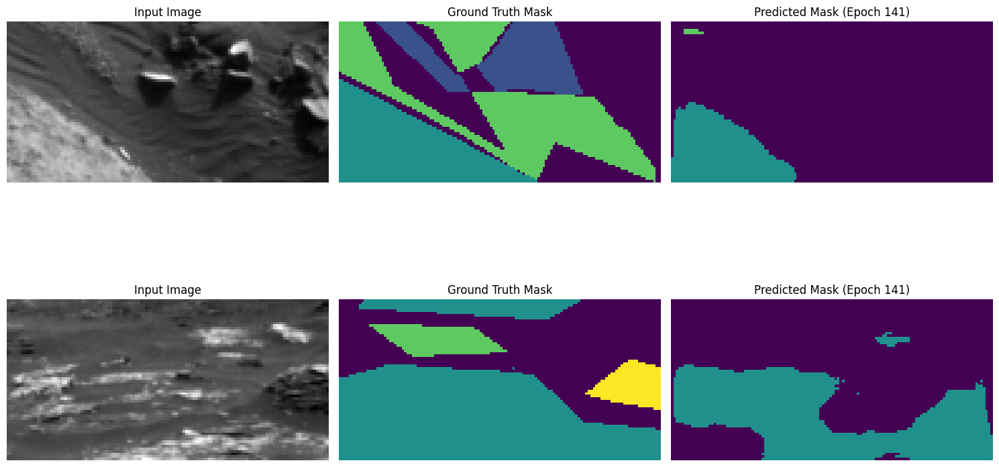

Epoch 142/50, Train Loss: 102.0963, Val Loss: 18.0084, Mean IoU: 0.4229
Class 0 IoU: 0.6049
Class 1 IoU: 0.4832
Class 2 IoU: 0.5958
Class 3 IoU: 0.0075


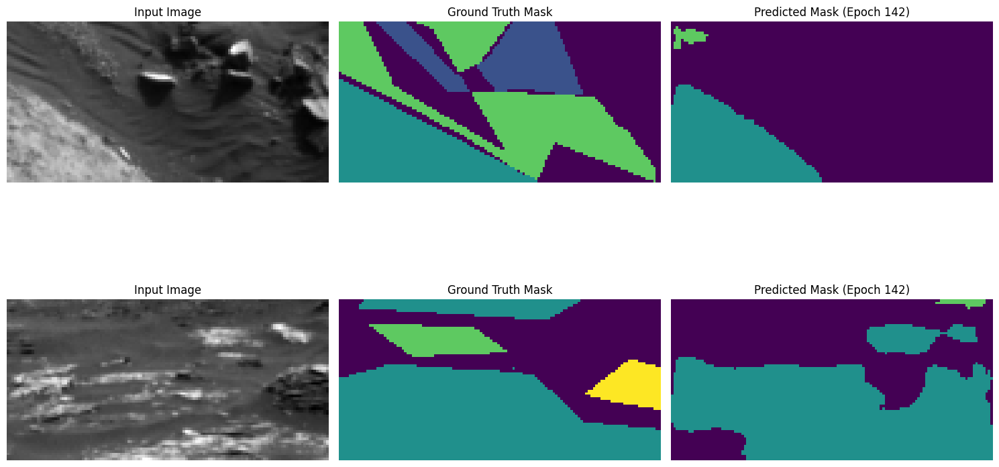

Epoch 143/50, Train Loss: 101.9257, Val Loss: 16.6080, Mean IoU: 0.4167
Class 0 IoU: 0.6080
Class 1 IoU: 0.4892
Class 2 IoU: 0.5618
Class 3 IoU: 0.0076


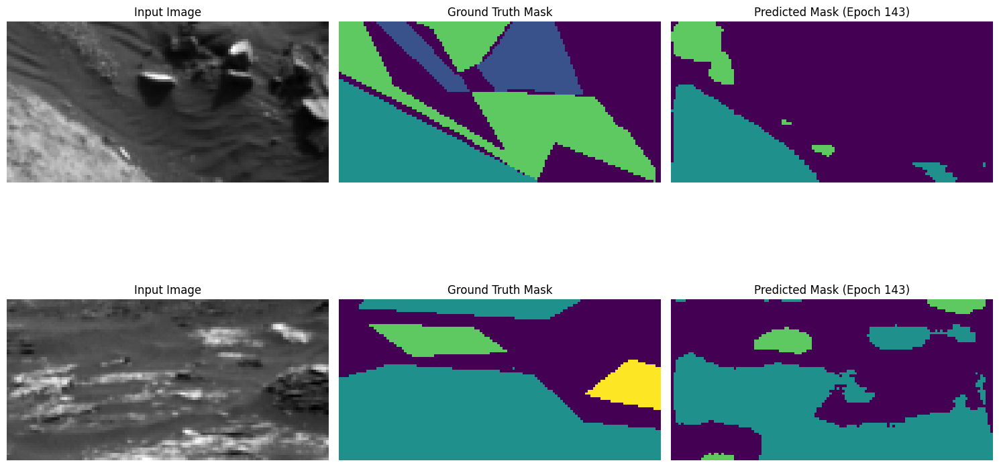

Epoch 144/50, Train Loss: 99.5355, Val Loss: 18.7228, Mean IoU: 0.4248
Class 0 IoU: 0.6156
Class 1 IoU: 0.4752
Class 2 IoU: 0.6031
Class 3 IoU: 0.0053


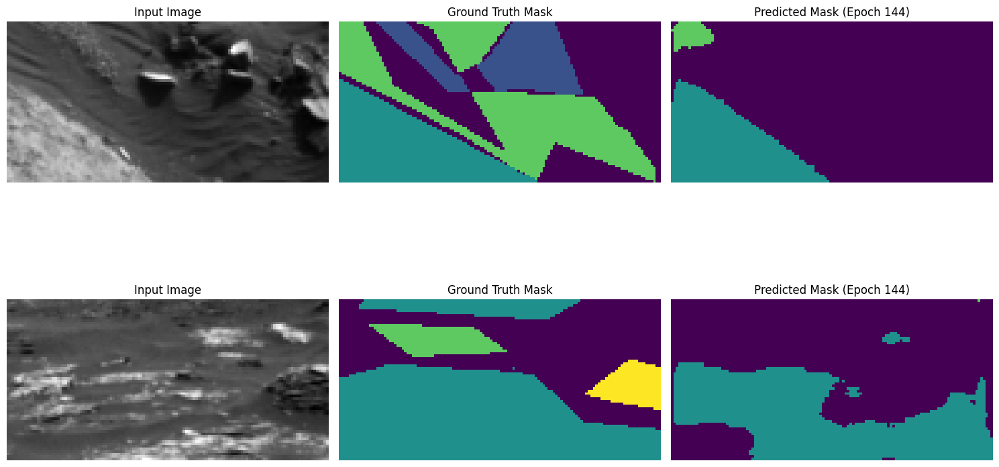

Epoch 145/50, Train Loss: 102.9050, Val Loss: 17.8614, Mean IoU: 0.4317
Class 0 IoU: 0.6252
Class 1 IoU: 0.4953
Class 2 IoU: 0.5912
Class 3 IoU: 0.0151


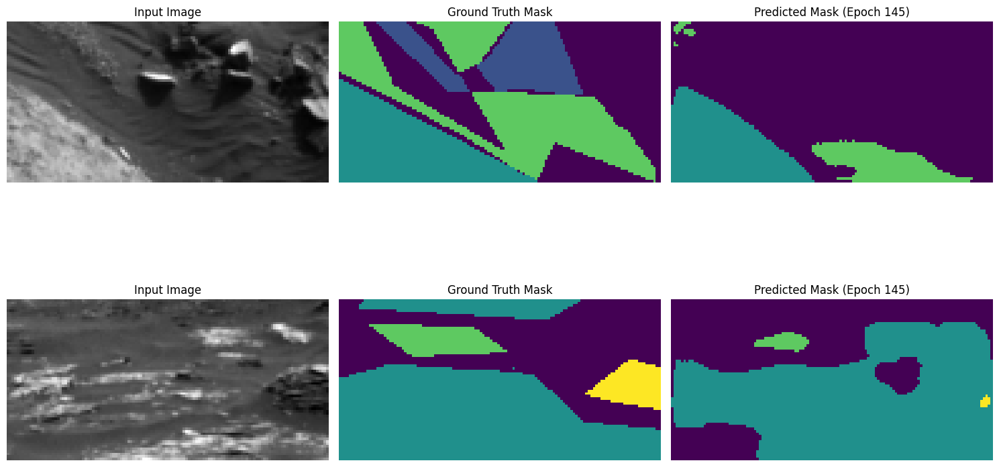

Epoch 146/50, Train Loss: 106.2048, Val Loss: 11.8767, Mean IoU: 0.4607
Class 0 IoU: 0.6272
Class 1 IoU: 0.5059
Class 2 IoU: 0.5963
Class 3 IoU: 0.1135


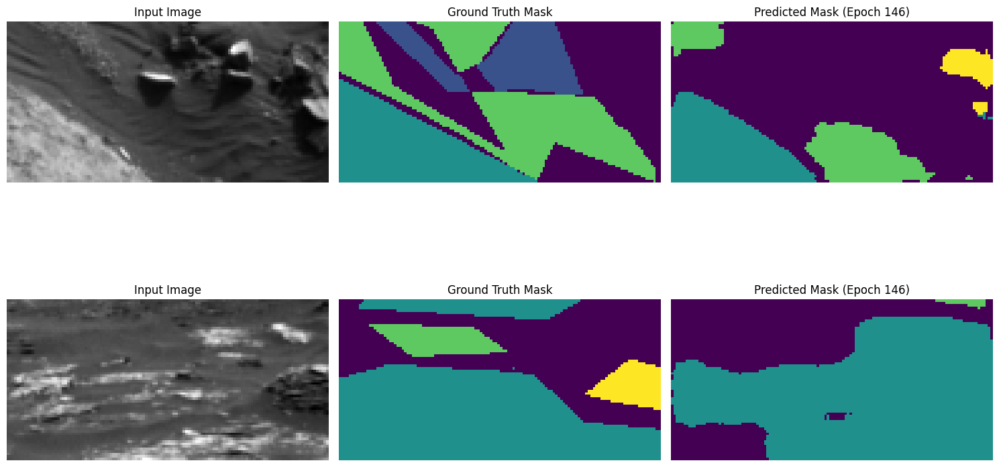

Model saved with new best Mean IoU: 0.4607
Epoch 147/50, Train Loss: 105.8416, Val Loss: 15.1457, Mean IoU: 0.4192
Class 0 IoU: 0.6218
Class 1 IoU: 0.4689
Class 2 IoU: 0.5746
Class 3 IoU: 0.0117


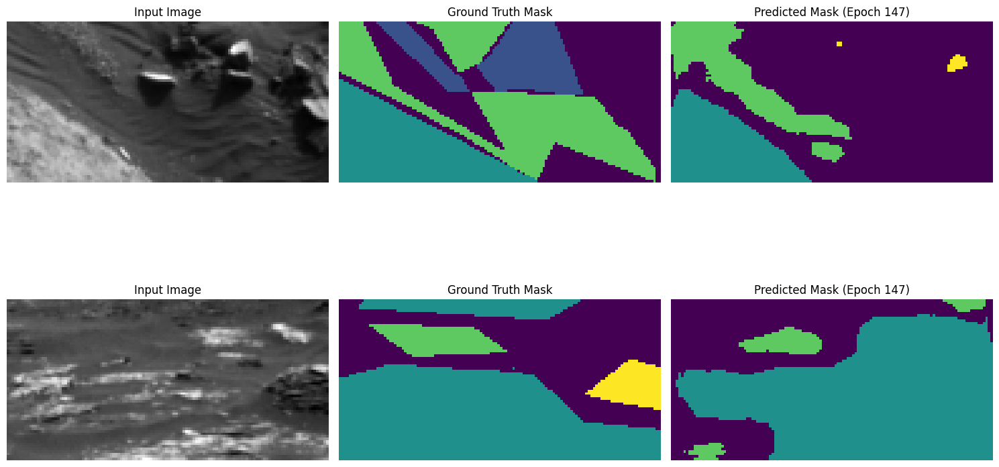

Epoch 148/50, Train Loss: 102.2109, Val Loss: 17.2929, Mean IoU: 0.4452
Class 0 IoU: 0.6458
Class 1 IoU: 0.4986
Class 2 IoU: 0.6043
Class 3 IoU: 0.0319


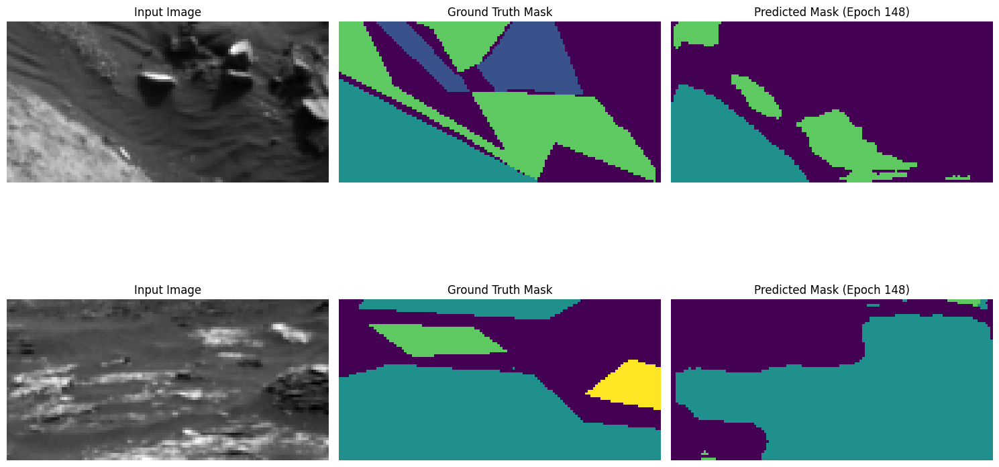

Epoch 149/50, Train Loss: 103.2956, Val Loss: 17.7737, Mean IoU: 0.4233
Class 0 IoU: 0.6204
Class 1 IoU: 0.4954
Class 2 IoU: 0.5692
Class 3 IoU: 0.0082


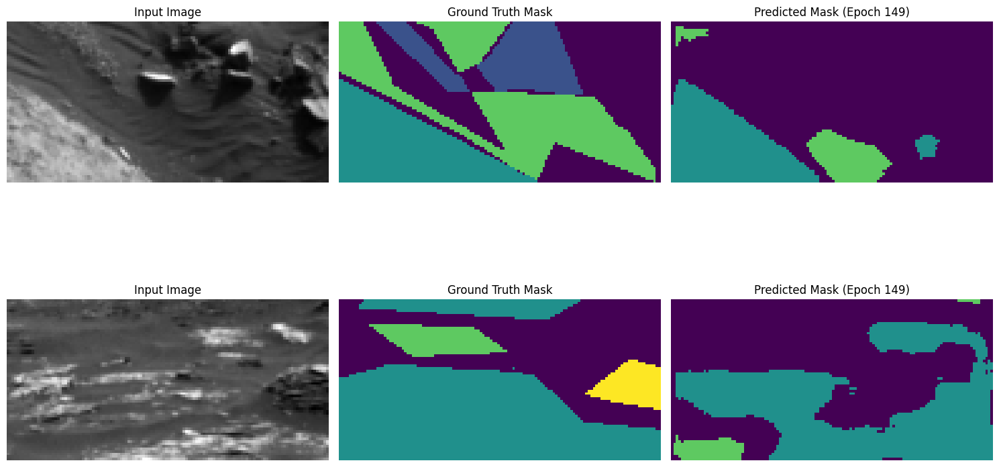

Epoch 150/50, Train Loss: 96.0886, Val Loss: 17.1809, Mean IoU: 0.4395
Class 0 IoU: 0.6251
Class 1 IoU: 0.4974
Class 2 IoU: 0.6278
Class 3 IoU: 0.0076


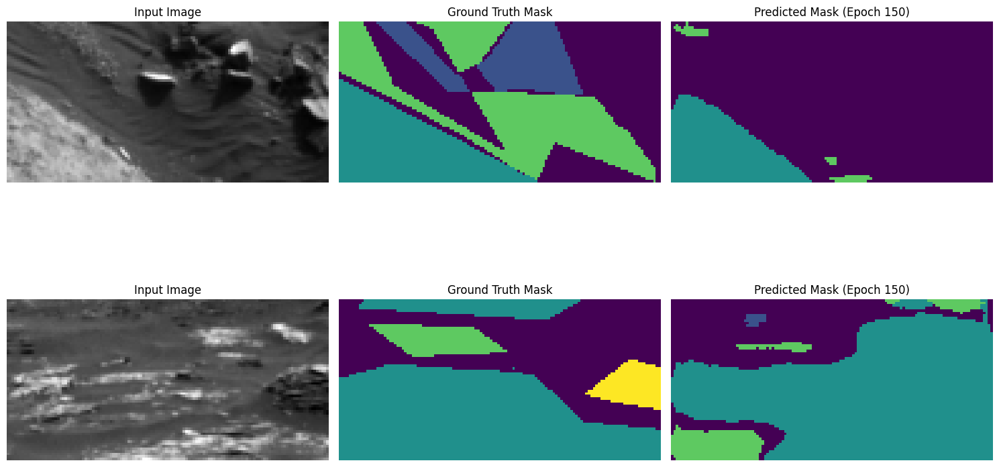

Epoch 151/50, Train Loss: 91.8931, Val Loss: 18.3797, Mean IoU: 0.4284
Class 0 IoU: 0.6026
Class 1 IoU: 0.4988
Class 2 IoU: 0.5963
Class 3 IoU: 0.0160


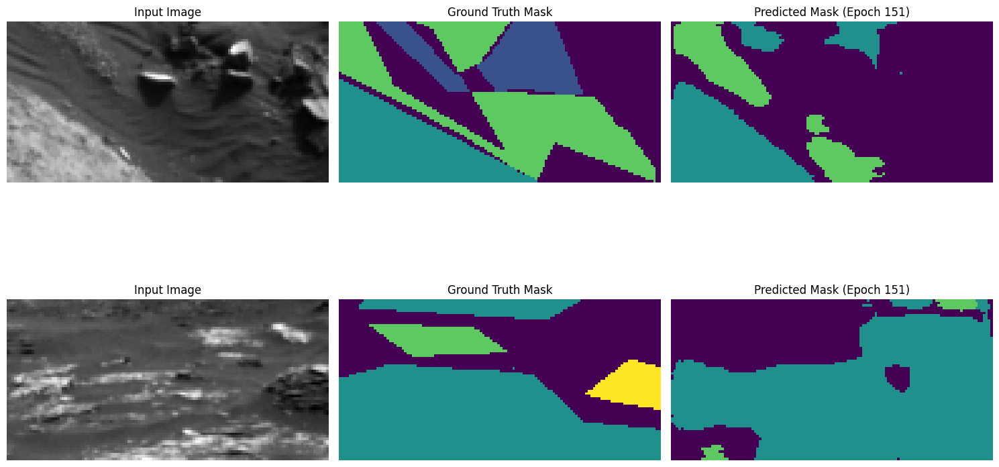

Epoch 152/50, Train Loss: 107.5463, Val Loss: 15.9308, Mean IoU: 0.4436
Class 0 IoU: 0.6309
Class 1 IoU: 0.5014
Class 2 IoU: 0.5853
Class 3 IoU: 0.0569


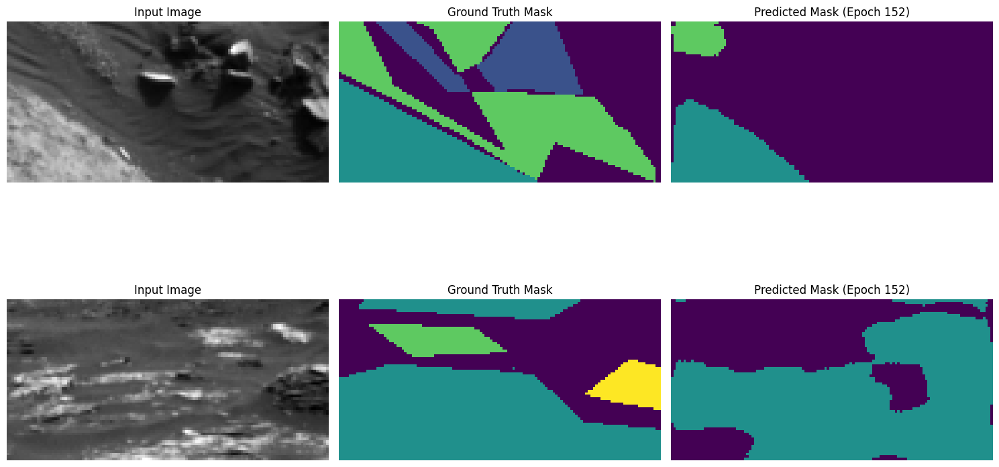

Epoch 153/50, Train Loss: 96.2128, Val Loss: 16.1893, Mean IoU: 0.4346
Class 0 IoU: 0.6252
Class 1 IoU: 0.5048
Class 2 IoU: 0.5782
Class 3 IoU: 0.0302


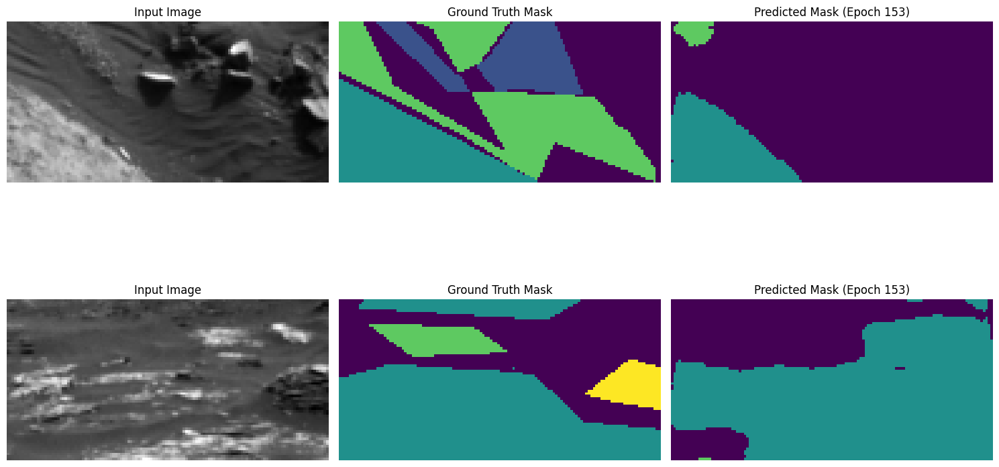

Epoch 154/50, Train Loss: 95.6152, Val Loss: 16.5035, Mean IoU: 0.4269
Class 0 IoU: 0.6271
Class 1 IoU: 0.4977
Class 2 IoU: 0.5679
Class 3 IoU: 0.0151


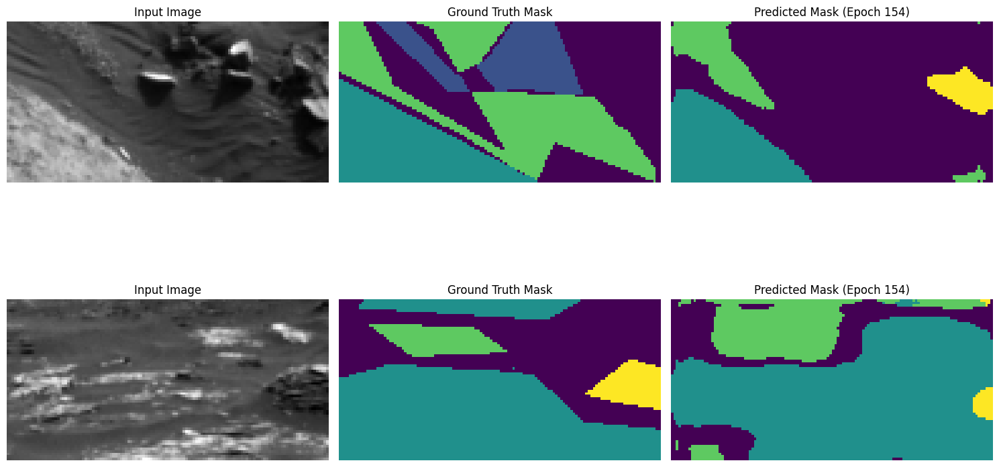

Epoch 155/50, Train Loss: 92.9145, Val Loss: 18.1028, Mean IoU: 0.4354
Class 0 IoU: 0.6365
Class 1 IoU: 0.4947
Class 2 IoU: 0.5967
Class 3 IoU: 0.0137


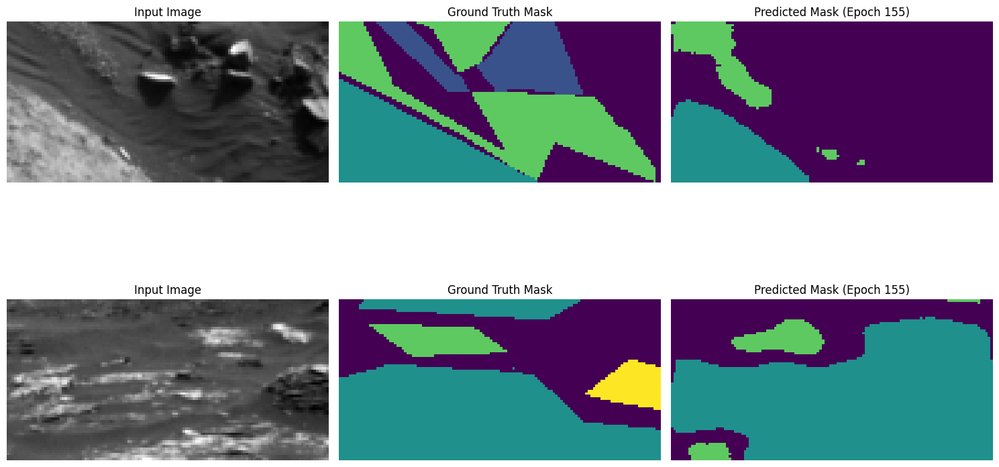

Epoch 156/50, Train Loss: 90.7707, Val Loss: 17.6608, Mean IoU: 0.4183
Class 0 IoU: 0.5749
Class 1 IoU: 0.4746
Class 2 IoU: 0.6044
Class 3 IoU: 0.0192


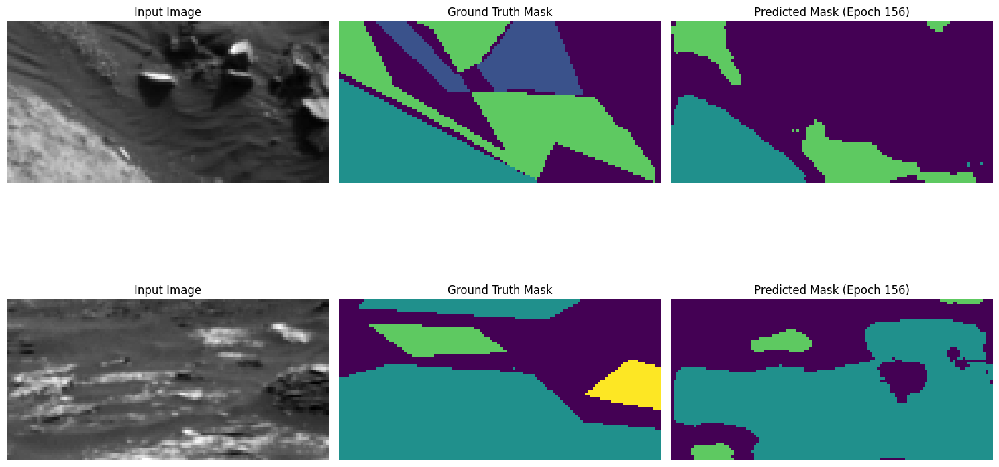

Epoch 157/50, Train Loss: 92.4698, Val Loss: 18.2807, Mean IoU: 0.4275
Class 0 IoU: 0.6162
Class 1 IoU: 0.4884
Class 2 IoU: 0.5868
Class 3 IoU: 0.0187


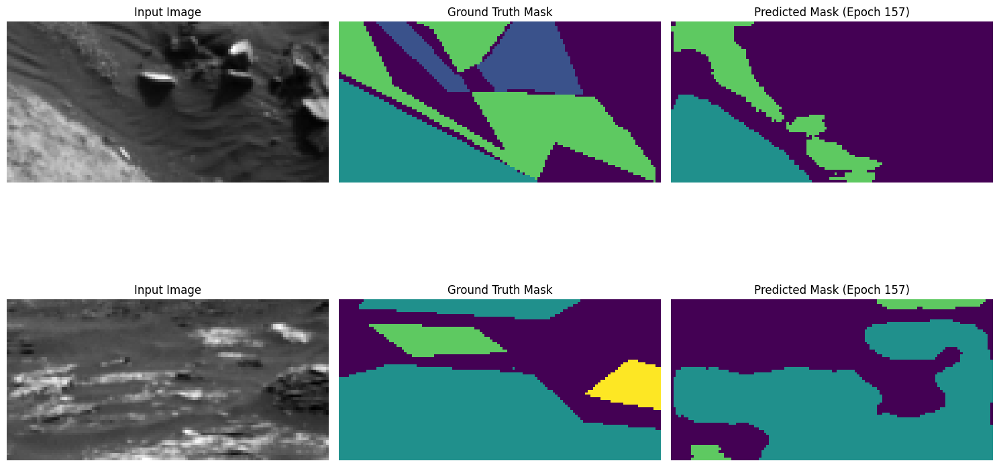

Epoch 158/50, Train Loss: 88.0494, Val Loss: 18.0124, Mean IoU: 0.4316
Class 0 IoU: 0.6303
Class 1 IoU: 0.4866
Class 2 IoU: 0.5979
Class 3 IoU: 0.0118


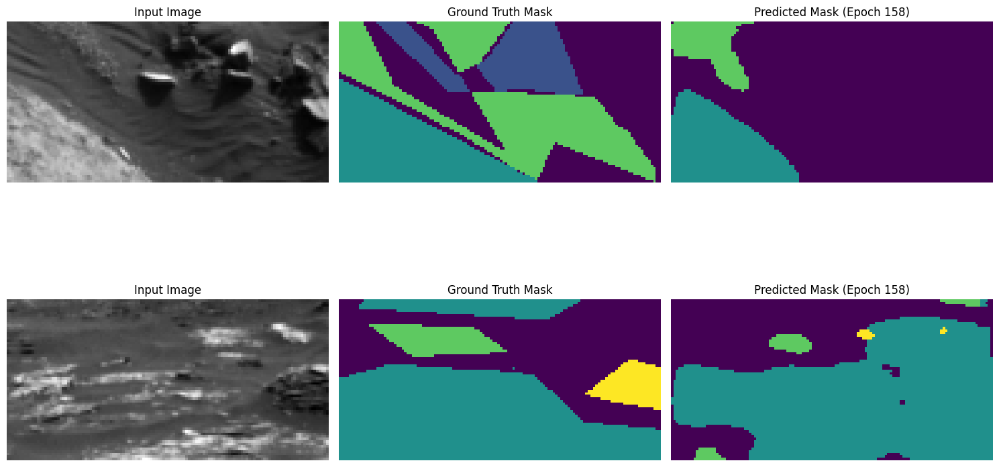

Epoch 159/50, Train Loss: 84.4775, Val Loss: 17.6934, Mean IoU: 0.4365
Class 0 IoU: 0.6292
Class 1 IoU: 0.5012
Class 2 IoU: 0.6006
Class 3 IoU: 0.0149


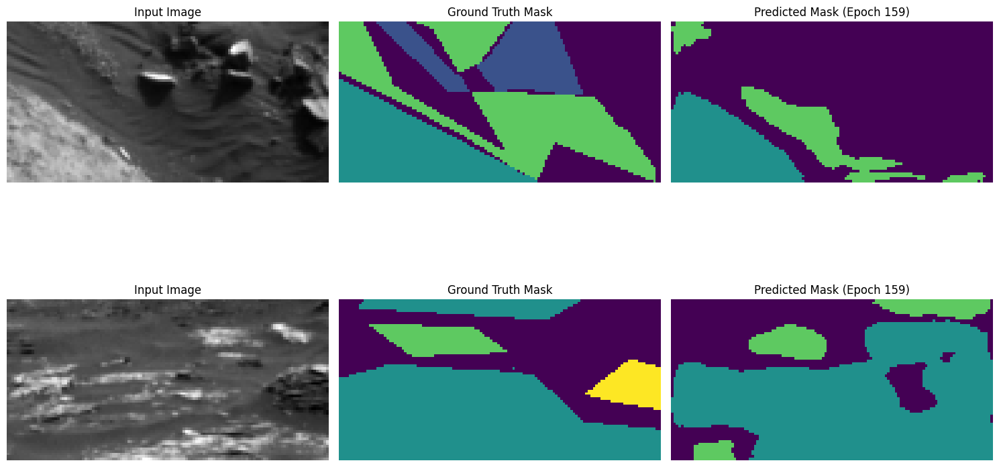

Epoch 160/50, Train Loss: 83.1970, Val Loss: 19.2301, Mean IoU: 0.4238
Class 0 IoU: 0.6138
Class 1 IoU: 0.4940
Class 2 IoU: 0.5705
Class 3 IoU: 0.0170


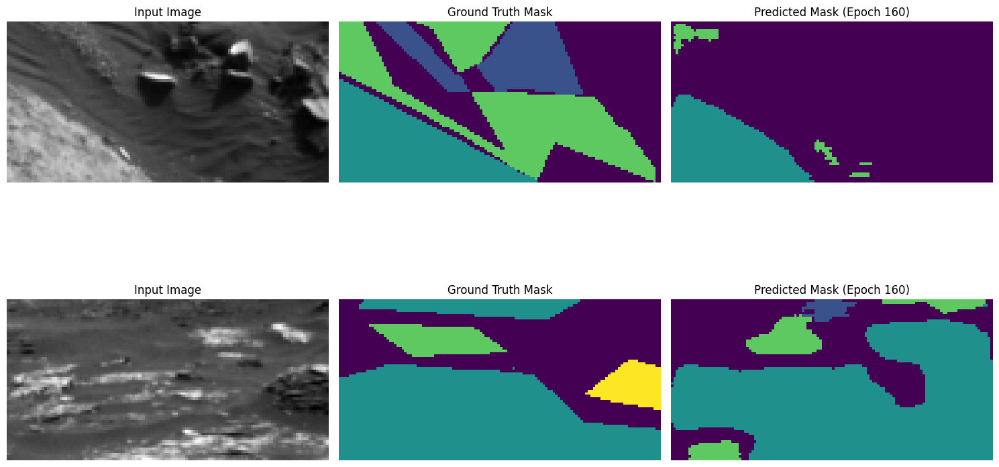

Epoch 161/50, Train Loss: 86.8497, Val Loss: 19.0957, Mean IoU: 0.4238
Class 0 IoU: 0.6195
Class 1 IoU: 0.4967
Class 2 IoU: 0.5740
Class 3 IoU: 0.0051


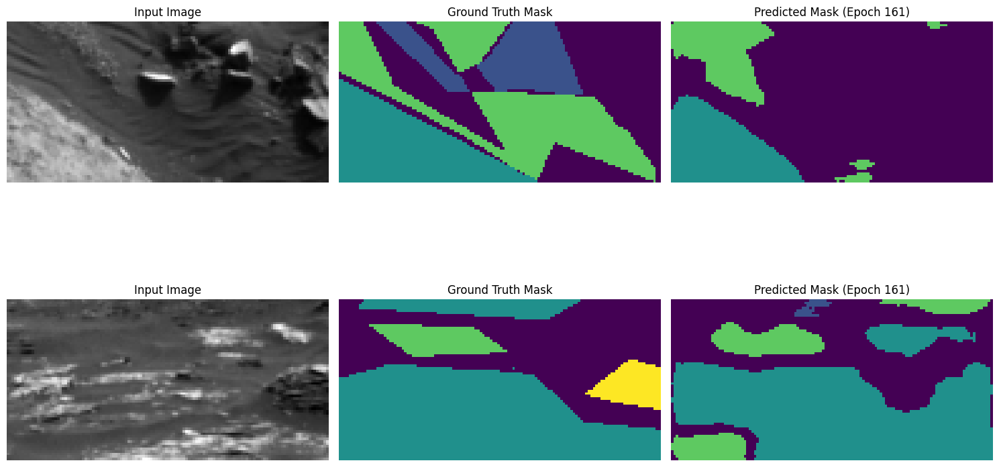

Epoch 162/50, Train Loss: 88.8587, Val Loss: 18.3802, Mean IoU: 0.4410
Class 0 IoU: 0.6374
Class 1 IoU: 0.5036
Class 2 IoU: 0.6001
Class 3 IoU: 0.0227


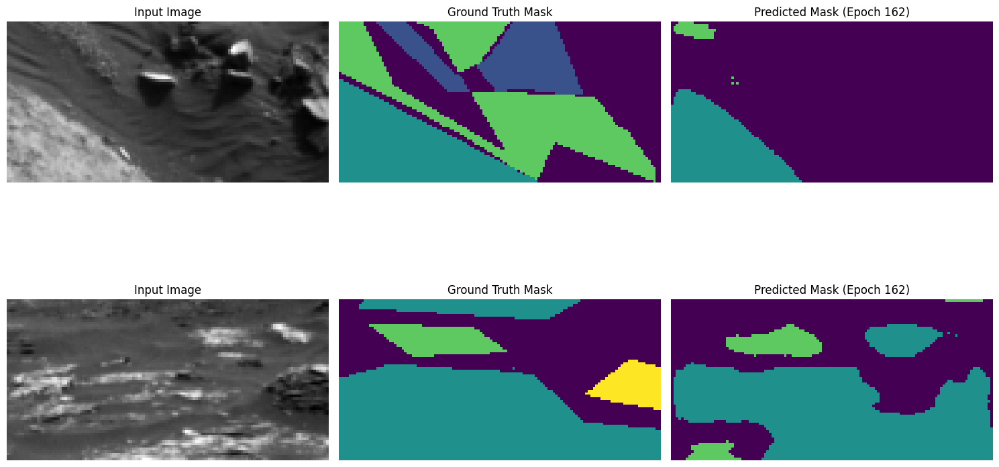

Epoch 163/50, Train Loss: 84.0971, Val Loss: 16.4093, Mean IoU: 0.4327
Class 0 IoU: 0.6326
Class 1 IoU: 0.4832
Class 2 IoU: 0.5885
Class 3 IoU: 0.0263


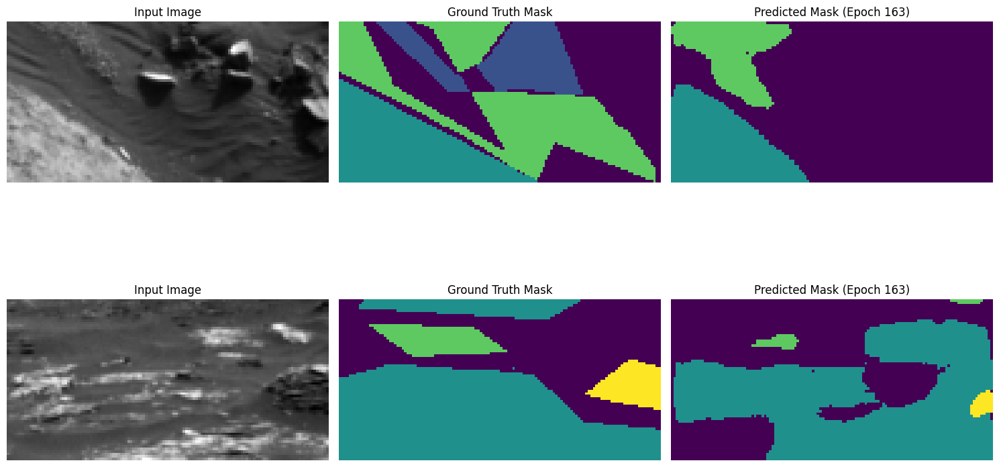

Epoch 164/50, Train Loss: 84.1722, Val Loss: 18.8592, Mean IoU: 0.4294
Class 0 IoU: 0.6256
Class 1 IoU: 0.4911
Class 2 IoU: 0.5812
Class 3 IoU: 0.0198


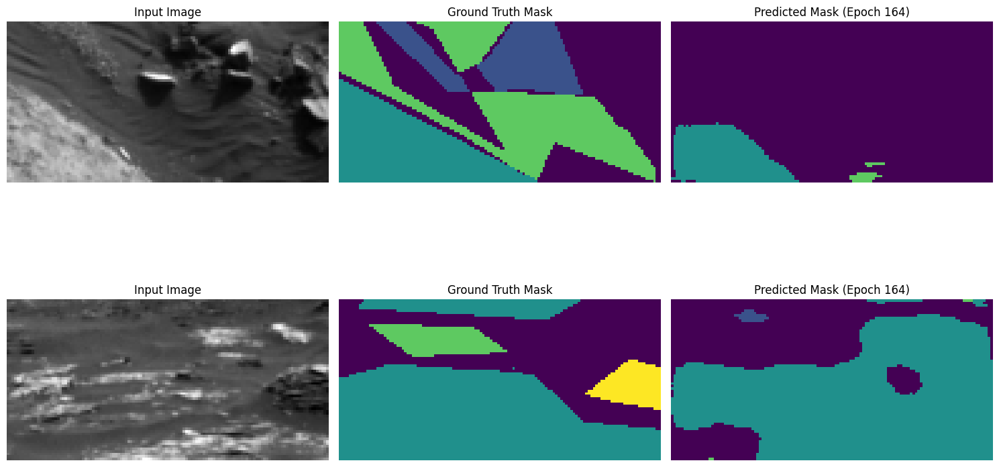

Epoch 165/50, Train Loss: 86.5011, Val Loss: 19.4520, Mean IoU: 0.4219
Class 0 IoU: 0.6290
Class 1 IoU: 0.4963
Class 2 IoU: 0.5582
Class 3 IoU: 0.0040


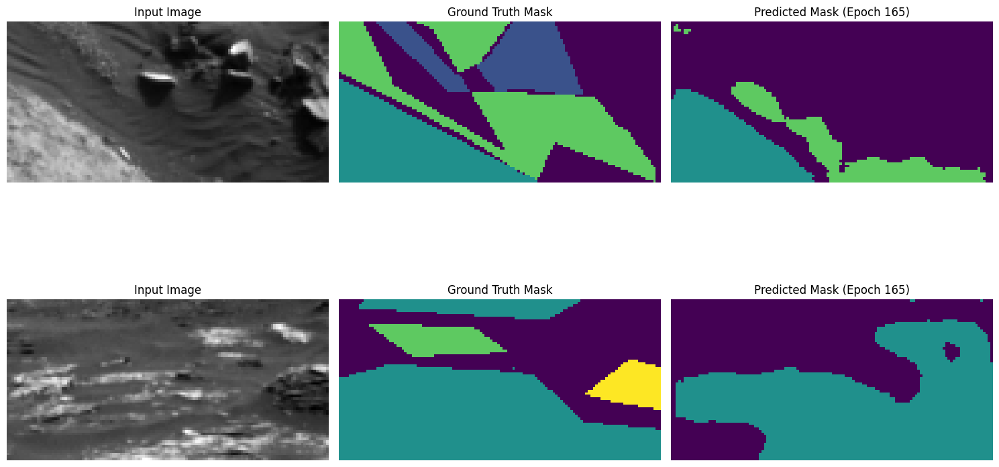

Epoch 166/50, Train Loss: 83.4698, Val Loss: 18.7868, Mean IoU: 0.4311
Class 0 IoU: 0.6379
Class 1 IoU: 0.4726
Class 2 IoU: 0.5953
Class 3 IoU: 0.0184


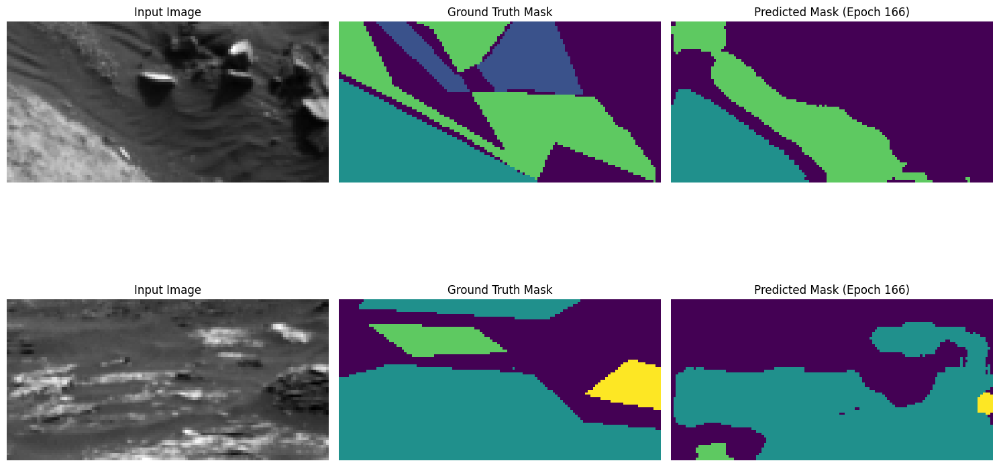

Epoch 167/50, Train Loss: 91.3198, Val Loss: 17.5795, Mean IoU: 0.4084
Class 0 IoU: 0.5923
Class 1 IoU: 0.4578
Class 2 IoU: 0.5549
Class 3 IoU: 0.0284


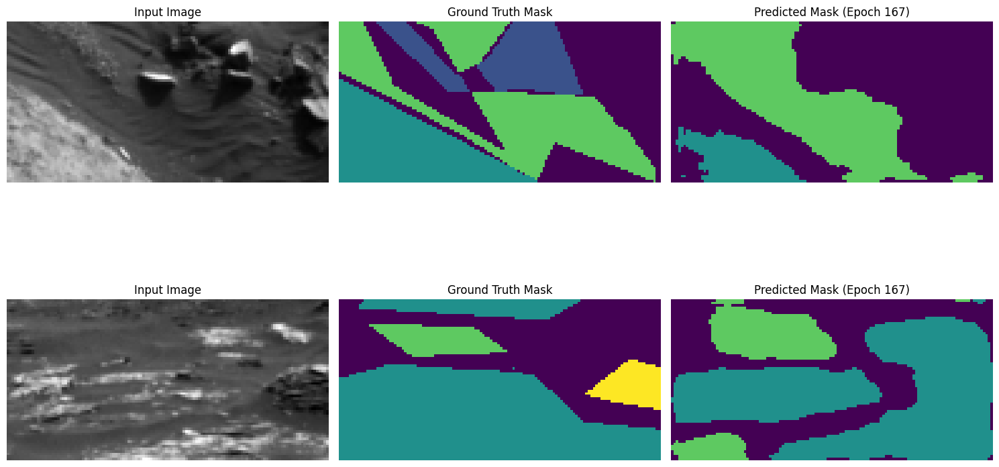

Epoch 168/50, Train Loss: 87.3413, Val Loss: 17.7718, Mean IoU: 0.4211
Class 0 IoU: 0.6015
Class 1 IoU: 0.4948
Class 2 IoU: 0.5767
Class 3 IoU: 0.0114


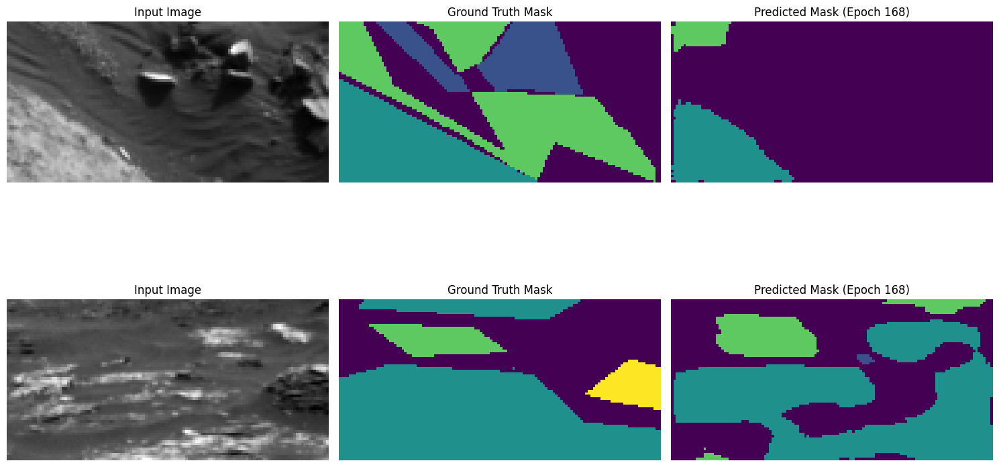

Epoch 169/50, Train Loss: 81.3506, Val Loss: 18.7926, Mean IoU: 0.4350
Class 0 IoU: 0.6262
Class 1 IoU: 0.5076
Class 2 IoU: 0.5995
Class 3 IoU: 0.0070


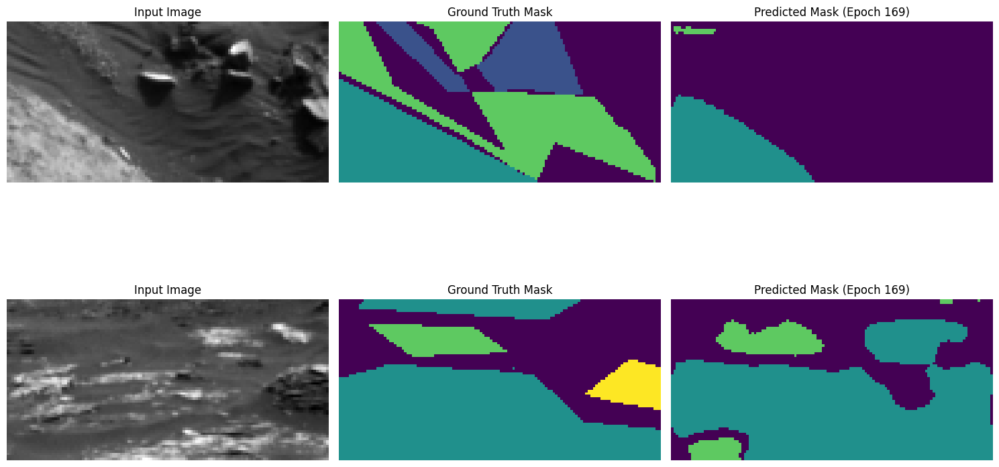

Epoch 170/50, Train Loss: 80.4042, Val Loss: 19.9509, Mean IoU: 0.4237
Class 0 IoU: 0.6146
Class 1 IoU: 0.4999
Class 2 IoU: 0.5739
Class 3 IoU: 0.0064


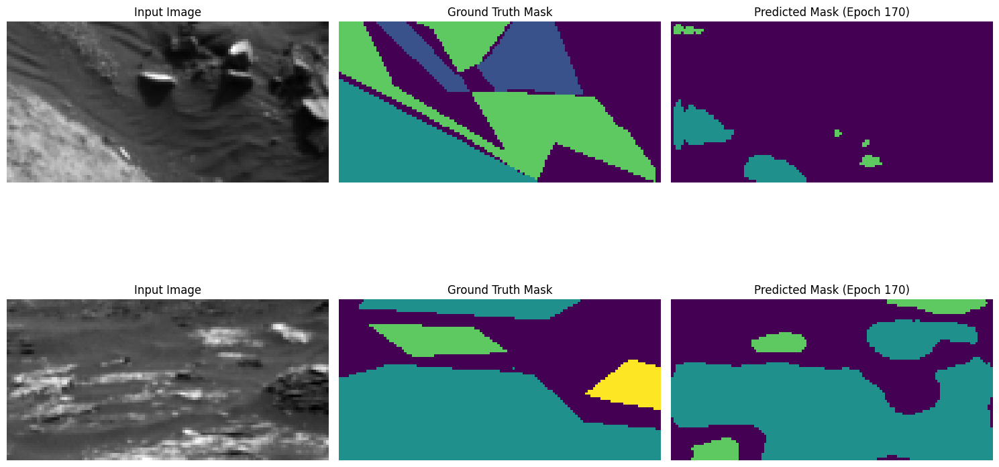

Epoch 171/50, Train Loss: 81.1924, Val Loss: 20.2533, Mean IoU: 0.4392
Class 0 IoU: 0.6536
Class 1 IoU: 0.5013
Class 2 IoU: 0.5795
Class 3 IoU: 0.0225


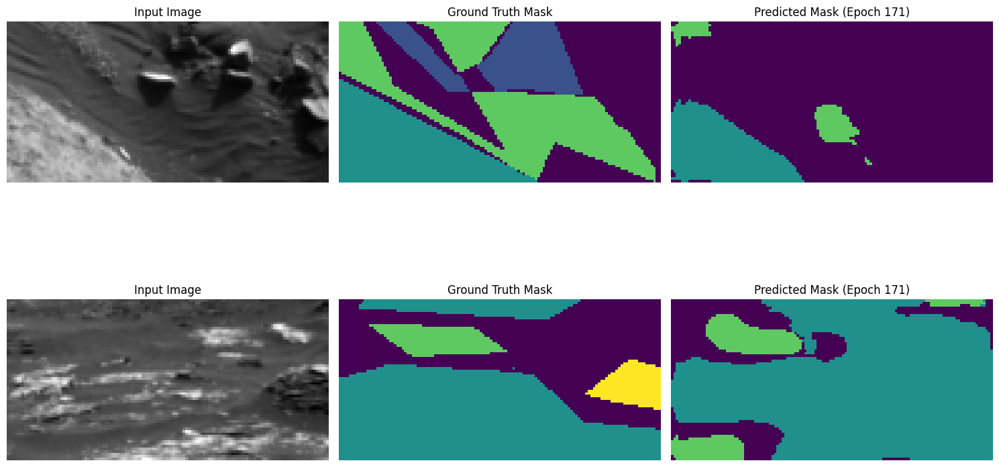

Epoch 172/50, Train Loss: 78.5614, Val Loss: 19.6078, Mean IoU: 0.4447
Class 0 IoU: 0.6519
Class 1 IoU: 0.5129
Class 2 IoU: 0.5978
Class 3 IoU: 0.0163


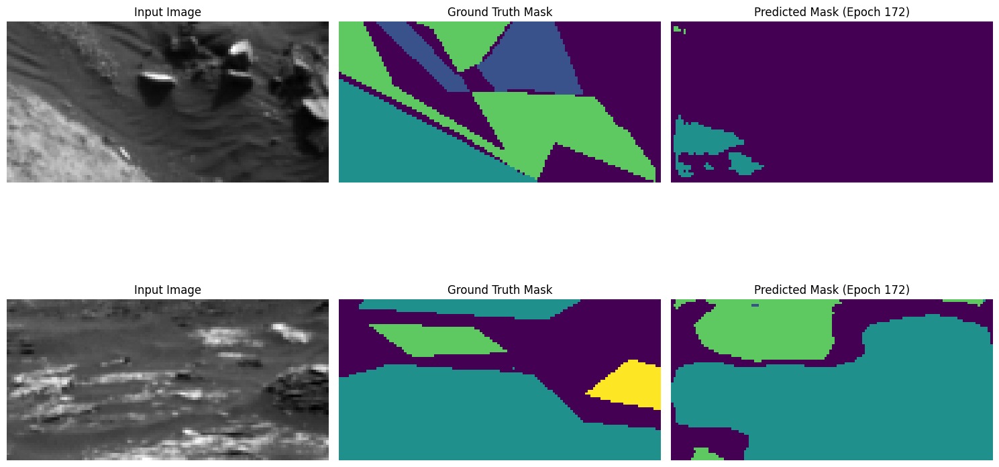

Epoch 173/50, Train Loss: 78.1198, Val Loss: 18.7750, Mean IoU: 0.4405
Class 0 IoU: 0.6431
Class 1 IoU: 0.5061
Class 2 IoU: 0.5957
Class 3 IoU: 0.0173


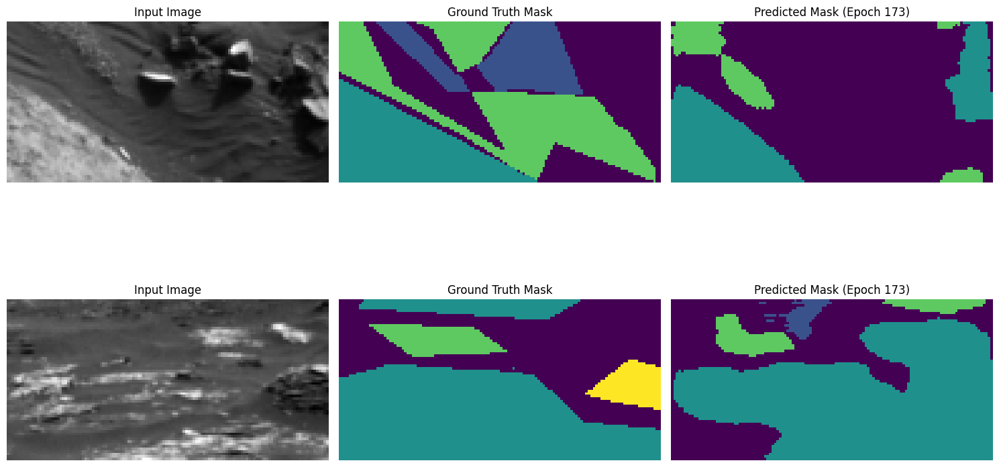

Epoch 174/50, Train Loss: 74.6498, Val Loss: 18.8867, Mean IoU: 0.4242
Class 0 IoU: 0.6317
Class 1 IoU: 0.4833
Class 2 IoU: 0.5640
Class 3 IoU: 0.0179


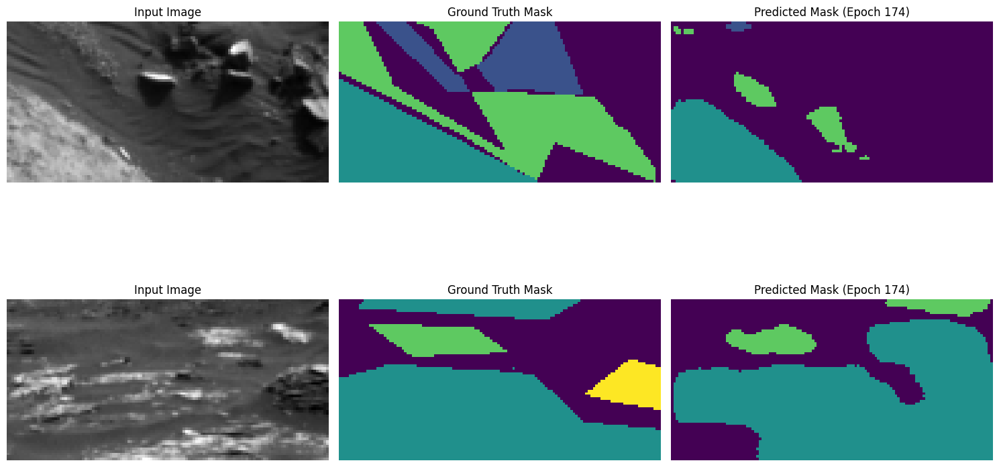

Epoch 175/50, Train Loss: 76.0484, Val Loss: 20.0853, Mean IoU: 0.4323
Class 0 IoU: 0.6252
Class 1 IoU: 0.5071
Class 2 IoU: 0.5746
Class 3 IoU: 0.0224


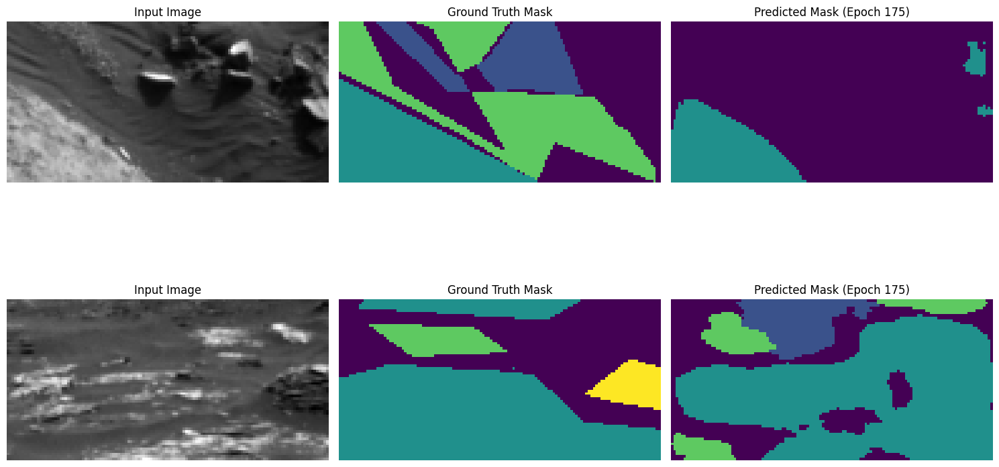

Epoch 176/50, Train Loss: 76.5956, Val Loss: 20.4266, Mean IoU: 0.4382
Class 0 IoU: 0.6460
Class 1 IoU: 0.5199
Class 2 IoU: 0.5780
Class 3 IoU: 0.0089


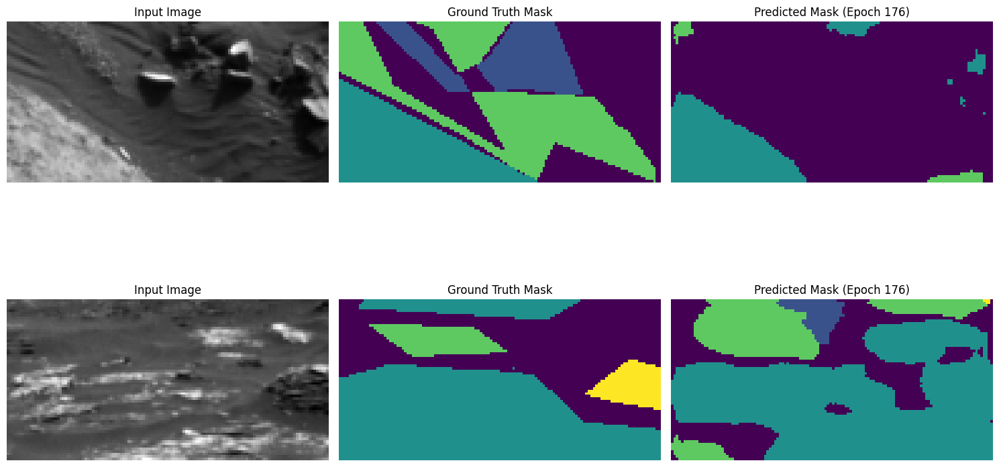

Epoch 177/50, Train Loss: 74.7777, Val Loss: 18.0674, Mean IoU: 0.4390
Class 0 IoU: 0.6444
Class 1 IoU: 0.4953
Class 2 IoU: 0.5937
Class 3 IoU: 0.0228


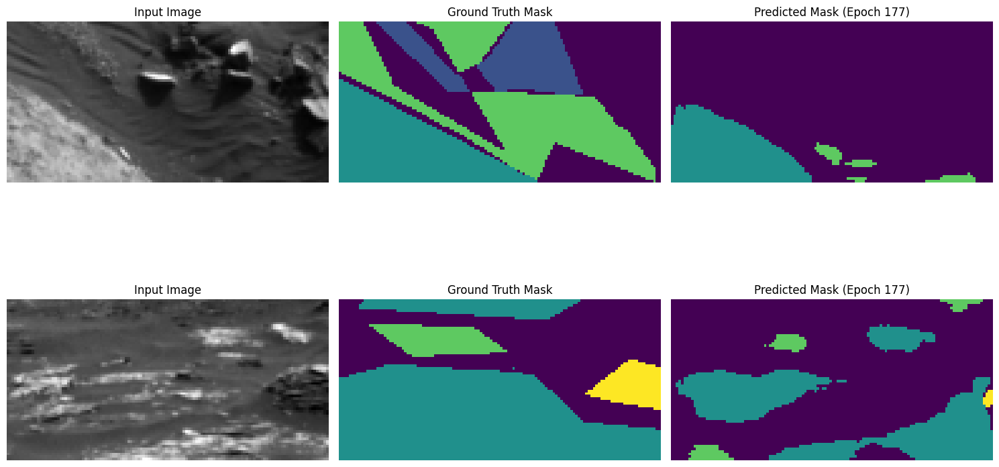

Epoch 178/50, Train Loss: 87.4859, Val Loss: 19.0382, Mean IoU: 0.4340
Class 0 IoU: 0.6293
Class 1 IoU: 0.4969
Class 2 IoU: 0.5869
Class 3 IoU: 0.0228


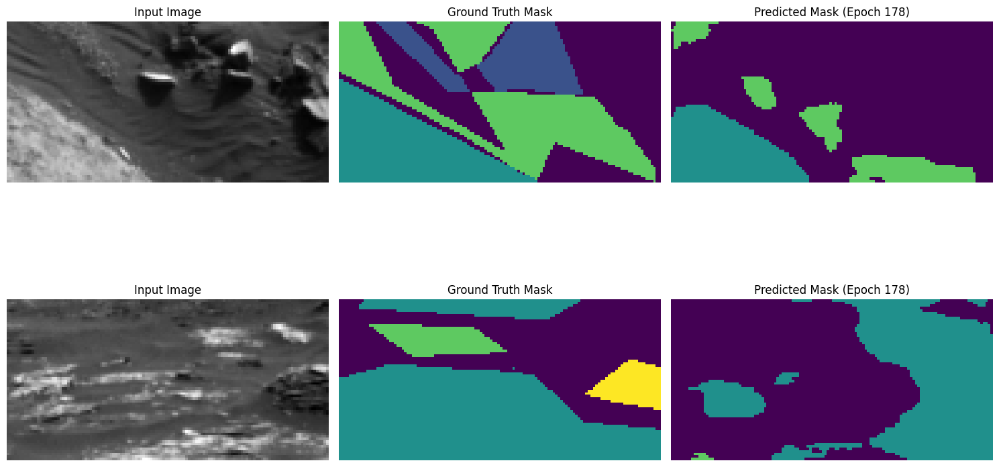

Epoch 179/50, Train Loss: 77.7493, Val Loss: 19.0156, Mean IoU: 0.4344
Class 0 IoU: 0.6367
Class 1 IoU: 0.4942
Class 2 IoU: 0.5879
Class 3 IoU: 0.0188


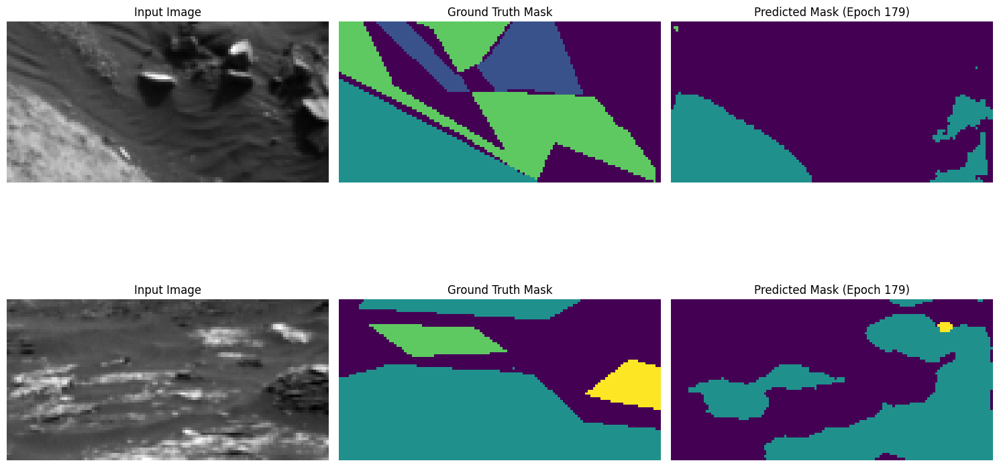

Epoch 180/50, Train Loss: 74.2050, Val Loss: 19.9182, Mean IoU: 0.4233
Class 0 IoU: 0.6285
Class 1 IoU: 0.4818
Class 2 IoU: 0.5599
Class 3 IoU: 0.0228


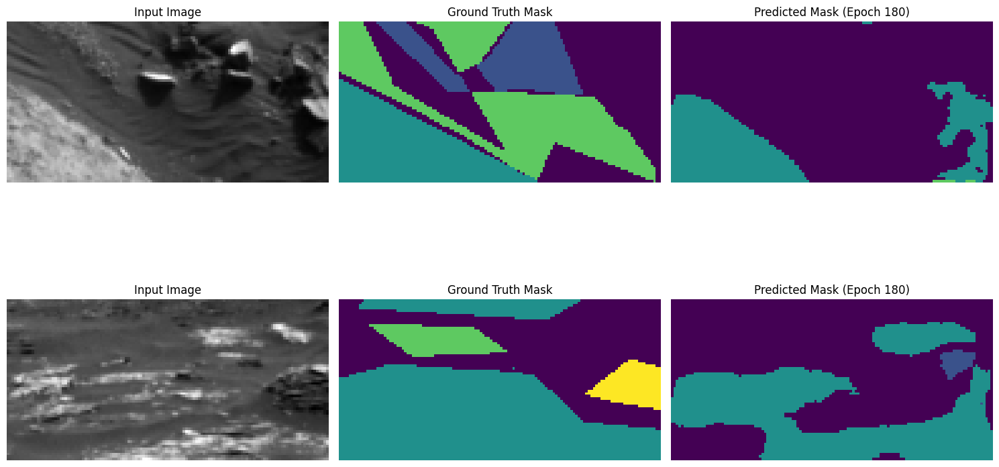

Epoch 181/50, Train Loss: 74.0271, Val Loss: 19.5764, Mean IoU: 0.4358
Class 0 IoU: 0.6439
Class 1 IoU: 0.4986
Class 2 IoU: 0.5763
Class 3 IoU: 0.0246


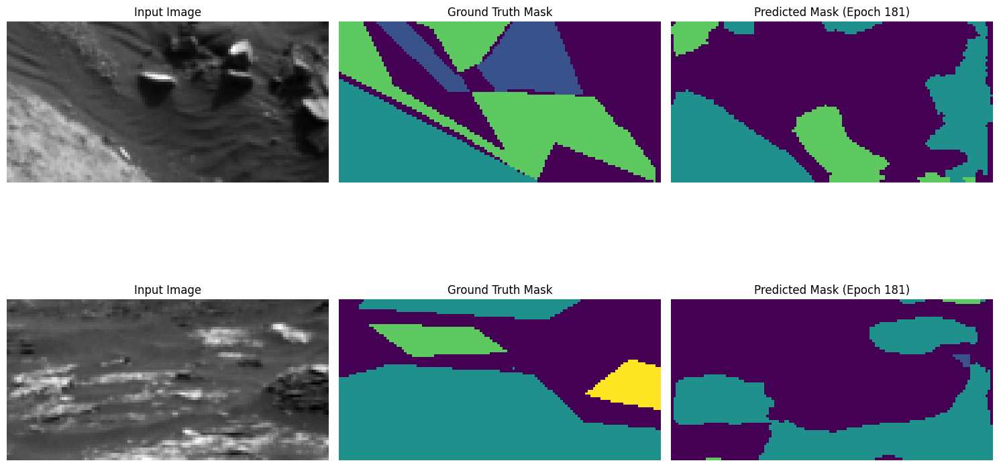

Epoch 182/50, Train Loss: 70.0007, Val Loss: 18.0432, Mean IoU: 0.4291
Class 0 IoU: 0.6327
Class 1 IoU: 0.4808
Class 2 IoU: 0.5844
Class 3 IoU: 0.0184


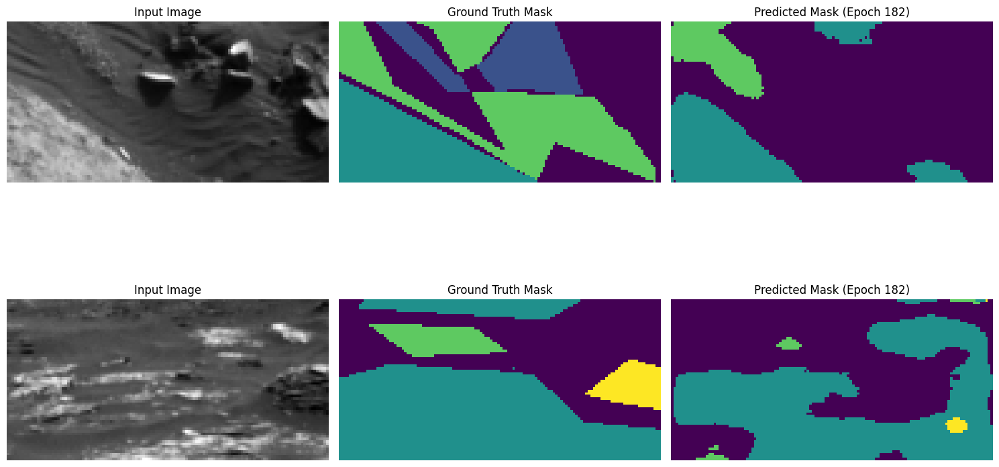

Epoch 183/50, Train Loss: 72.5788, Val Loss: 20.2499, Mean IoU: 0.4307
Class 0 IoU: 0.6095
Class 1 IoU: 0.4968
Class 2 IoU: 0.6011
Class 3 IoU: 0.0155


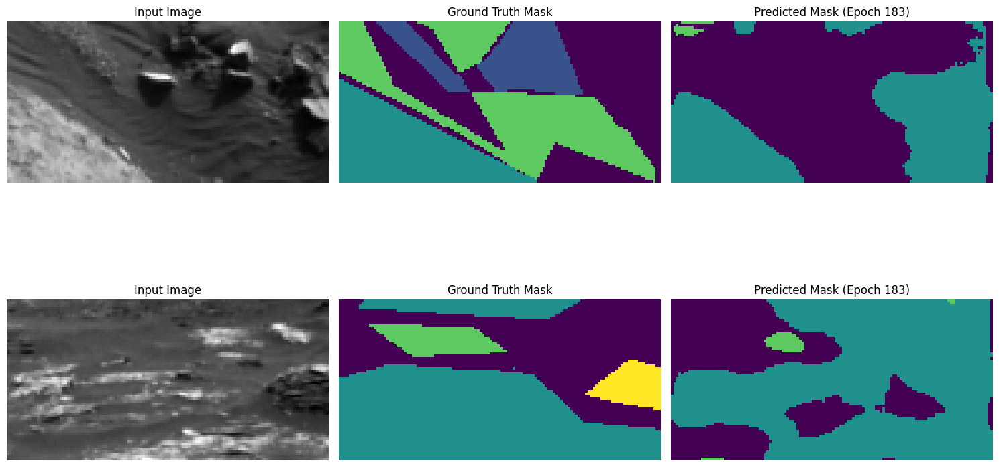

Epoch 184/50, Train Loss: 69.3935, Val Loss: 19.9125, Mean IoU: 0.4421
Class 0 IoU: 0.6545
Class 1 IoU: 0.5180
Class 2 IoU: 0.5825
Class 3 IoU: 0.0134


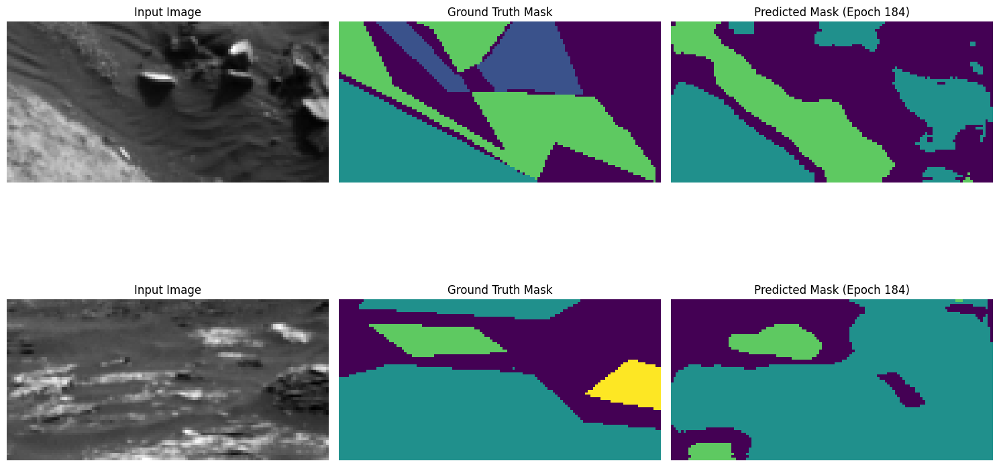

Epoch 185/50, Train Loss: 69.9673, Val Loss: 15.3304, Mean IoU: 0.4566
Class 0 IoU: 0.6456
Class 1 IoU: 0.5038
Class 2 IoU: 0.5900
Class 3 IoU: 0.0870


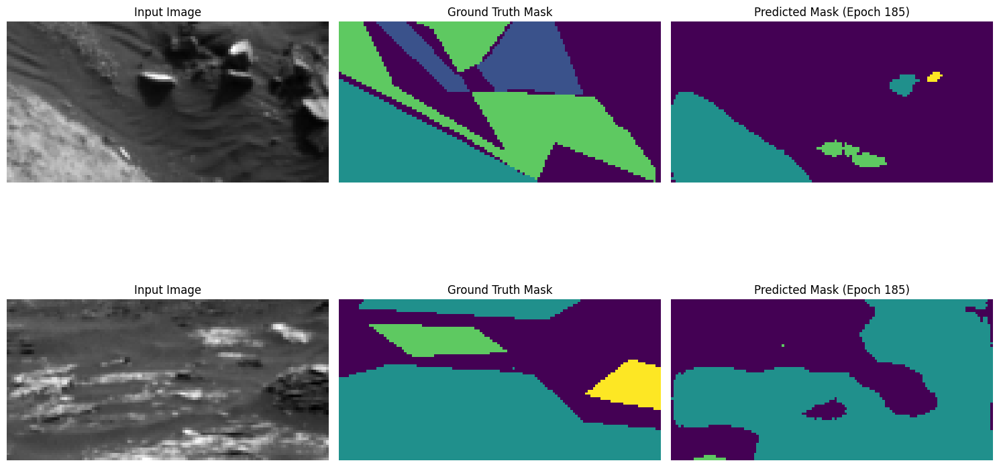

Epoch 186/50, Train Loss: 71.5257, Val Loss: 17.4497, Mean IoU: 0.4226
Class 0 IoU: 0.6030
Class 1 IoU: 0.4930
Class 2 IoU: 0.5623
Class 3 IoU: 0.0323


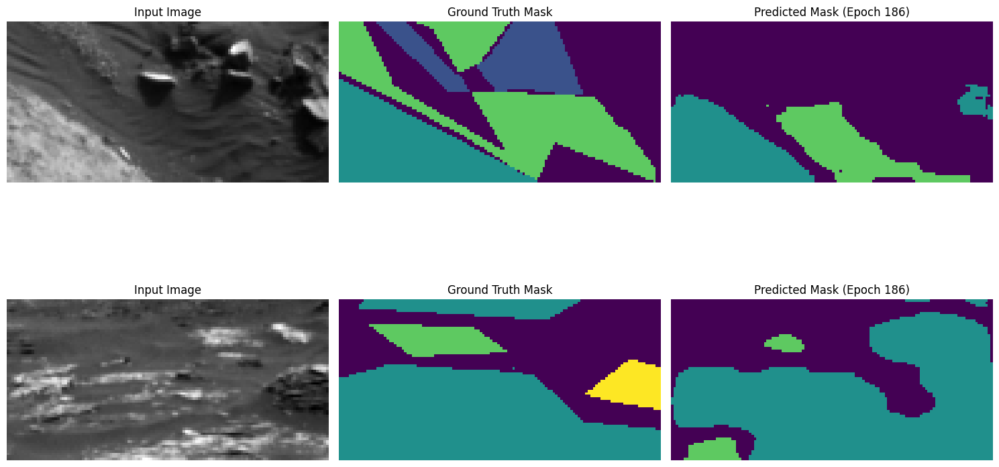

Epoch 187/50, Train Loss: 68.5804, Val Loss: 19.2638, Mean IoU: 0.4167
Class 0 IoU: 0.6120
Class 1 IoU: 0.4733
Class 2 IoU: 0.5593
Class 3 IoU: 0.0223


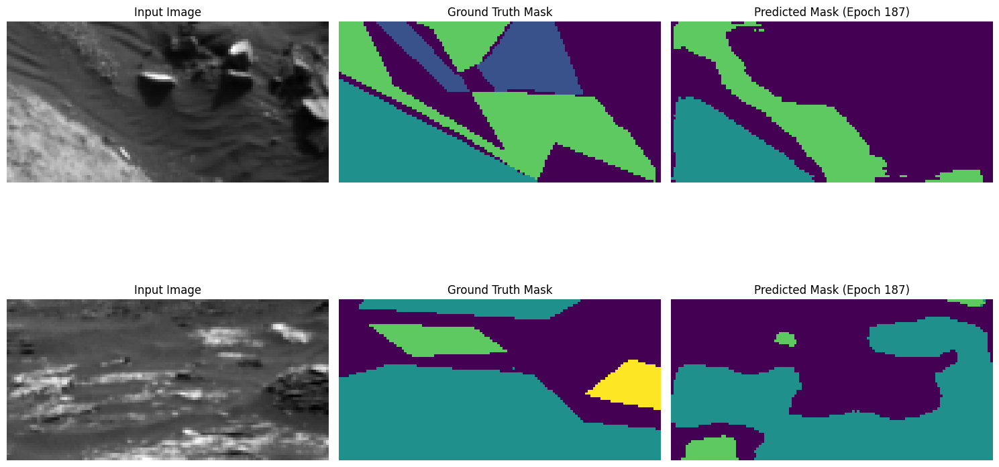

Epoch 188/50, Train Loss: 66.9438, Val Loss: 19.9993, Mean IoU: 0.4279
Class 0 IoU: 0.6296
Class 1 IoU: 0.4904
Class 2 IoU: 0.5682
Class 3 IoU: 0.0235


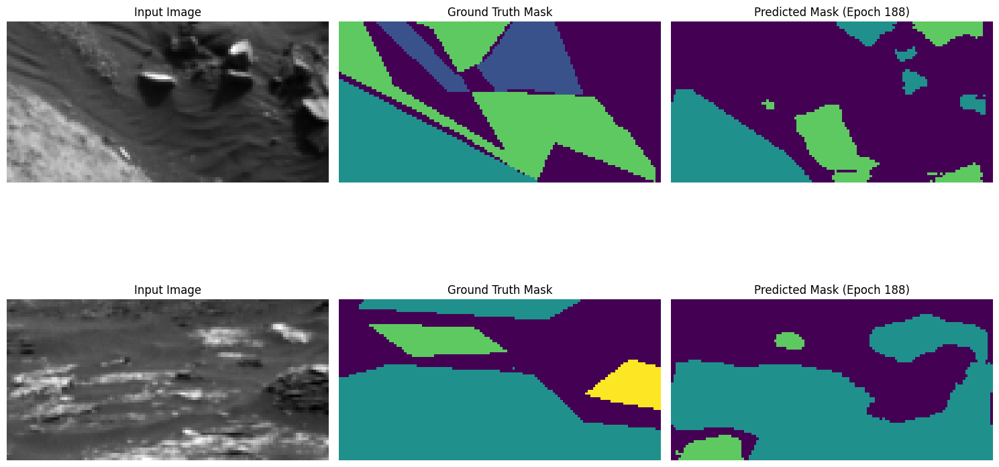

Epoch 189/50, Train Loss: 68.3358, Val Loss: 20.7792, Mean IoU: 0.4290
Class 0 IoU: 0.6268
Class 1 IoU: 0.5067
Class 2 IoU: 0.5770
Class 3 IoU: 0.0054


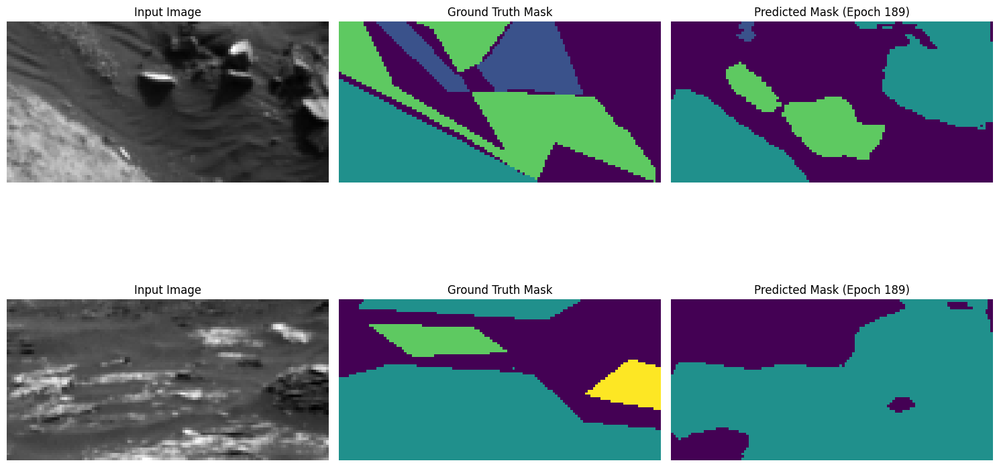

Epoch 190/50, Train Loss: 67.9393, Val Loss: 20.4359, Mean IoU: 0.4256
Class 0 IoU: 0.6354
Class 1 IoU: 0.4792
Class 2 IoU: 0.5682
Class 3 IoU: 0.0194


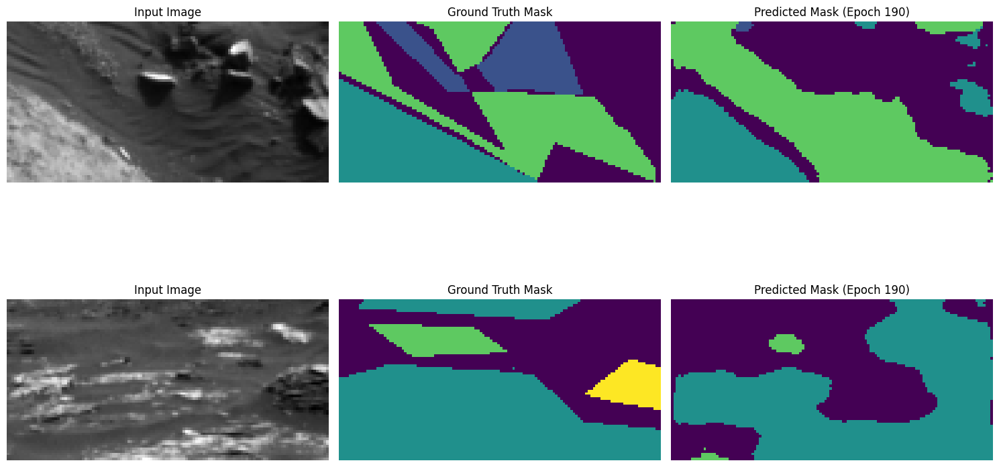

Epoch 191/50, Train Loss: 67.8602, Val Loss: 20.1939, Mean IoU: 0.4278
Class 0 IoU: 0.6348
Class 1 IoU: 0.4892
Class 2 IoU: 0.5628
Class 3 IoU: 0.0242


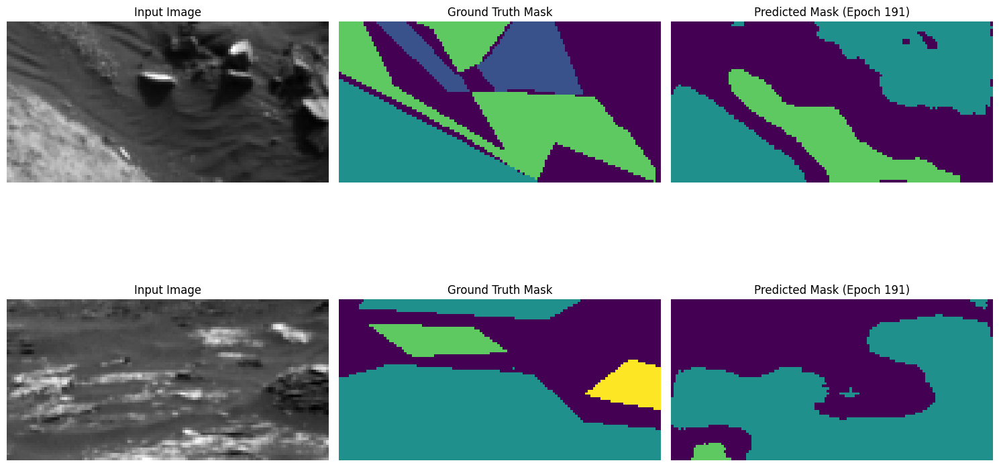

Epoch 192/50, Train Loss: 66.2642, Val Loss: 19.9596, Mean IoU: 0.4383
Class 0 IoU: 0.6490
Class 1 IoU: 0.4906
Class 2 IoU: 0.5945
Class 3 IoU: 0.0189


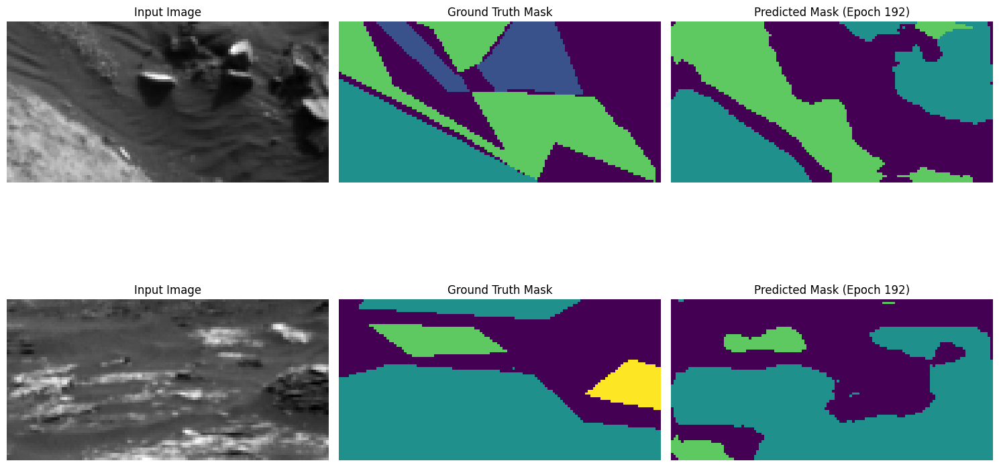

Epoch 193/50, Train Loss: 67.4385, Val Loss: 20.9359, Mean IoU: 0.4373
Class 0 IoU: 0.6560
Class 1 IoU: 0.4821
Class 2 IoU: 0.6051
Class 3 IoU: 0.0058


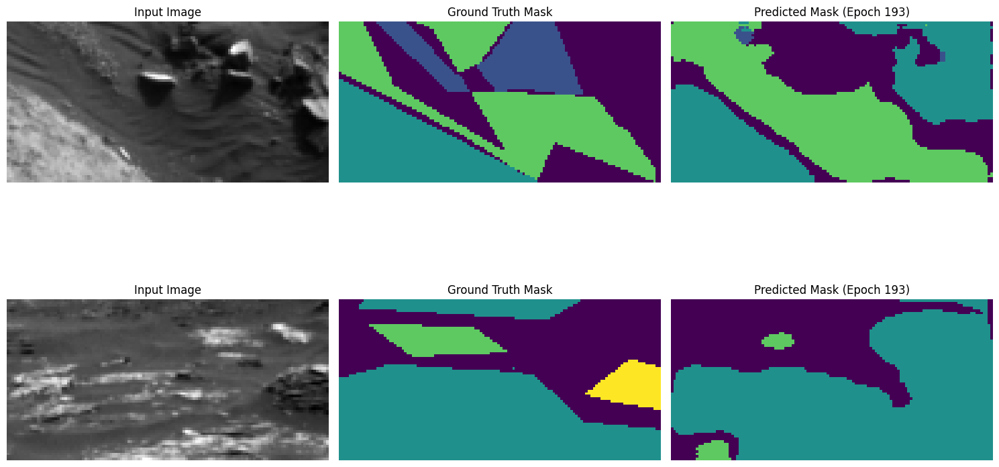

Epoch 194/50, Train Loss: 65.7977, Val Loss: 20.2316, Mean IoU: 0.4316
Class 0 IoU: 0.6385
Class 1 IoU: 0.4873
Class 2 IoU: 0.5835
Class 3 IoU: 0.0170


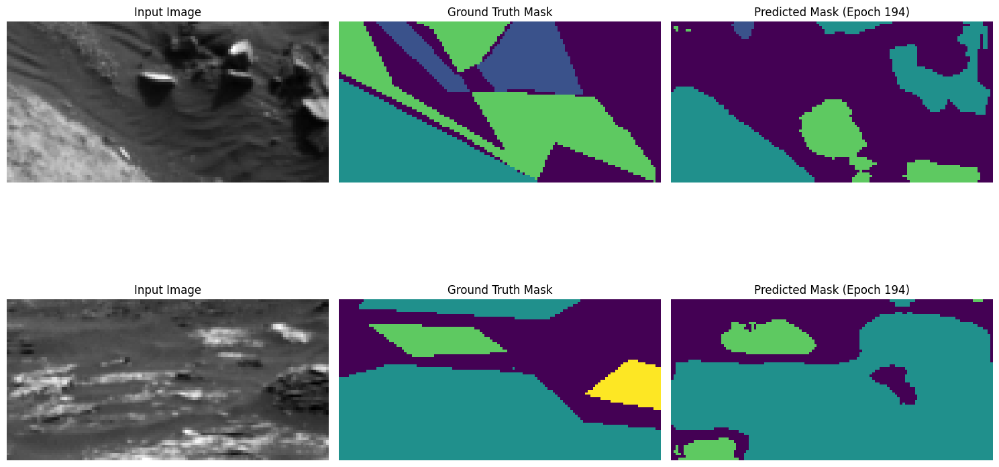

Epoch 195/50, Train Loss: 71.1071, Val Loss: 19.3642, Mean IoU: 0.4190
Class 0 IoU: 0.6078
Class 1 IoU: 0.4759
Class 2 IoU: 0.5729
Class 3 IoU: 0.0195


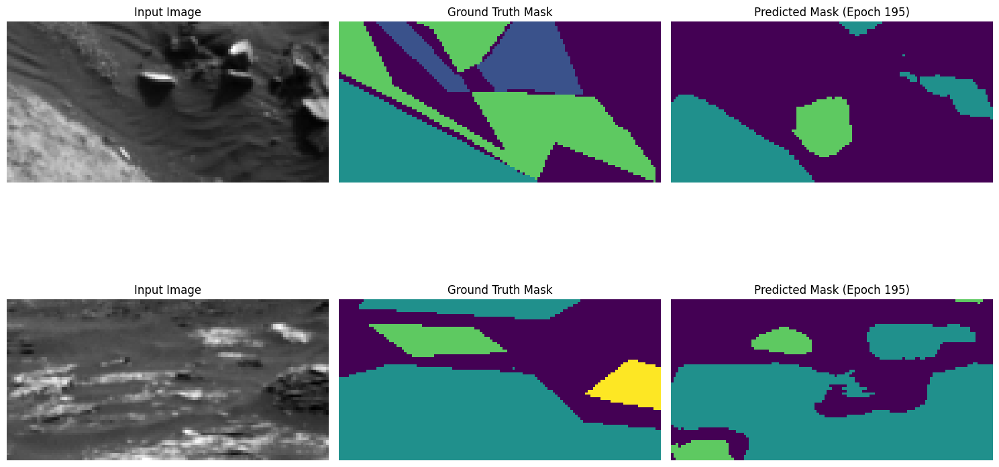

Epoch 196/50, Train Loss: 65.6918, Val Loss: 21.0955, Mean IoU: 0.4291
Class 0 IoU: 0.6367
Class 1 IoU: 0.4977
Class 2 IoU: 0.5643
Class 3 IoU: 0.0177


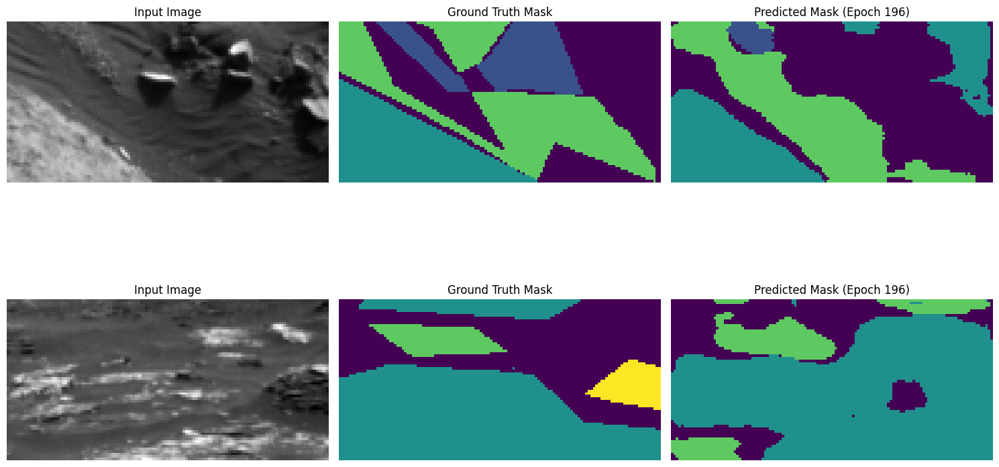

Epoch 197/50, Train Loss: 63.2304, Val Loss: 19.0887, Mean IoU: 0.4303
Class 0 IoU: 0.6237
Class 1 IoU: 0.4852
Class 2 IoU: 0.5625
Class 3 IoU: 0.0496


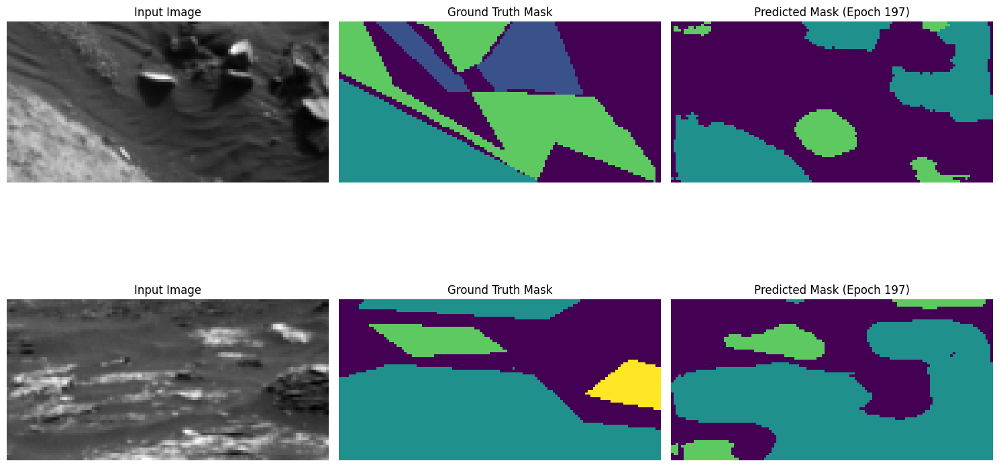

Epoch 198/50, Train Loss: 61.8772, Val Loss: 20.5948, Mean IoU: 0.4279
Class 0 IoU: 0.6428
Class 1 IoU: 0.4791
Class 2 IoU: 0.5711
Class 3 IoU: 0.0185


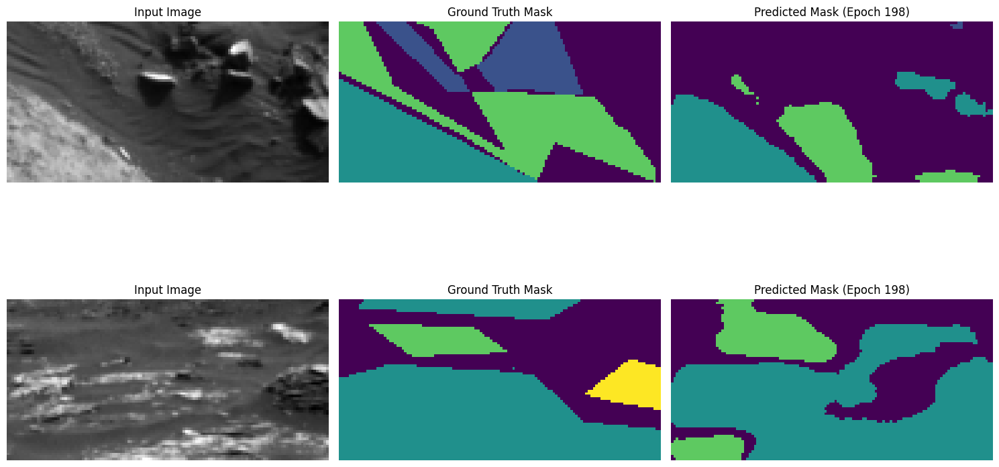

Epoch 199/50, Train Loss: 61.9572, Val Loss: 20.3146, Mean IoU: 0.4393
Class 0 IoU: 0.6433
Class 1 IoU: 0.4949
Class 2 IoU: 0.5769
Class 3 IoU: 0.0422


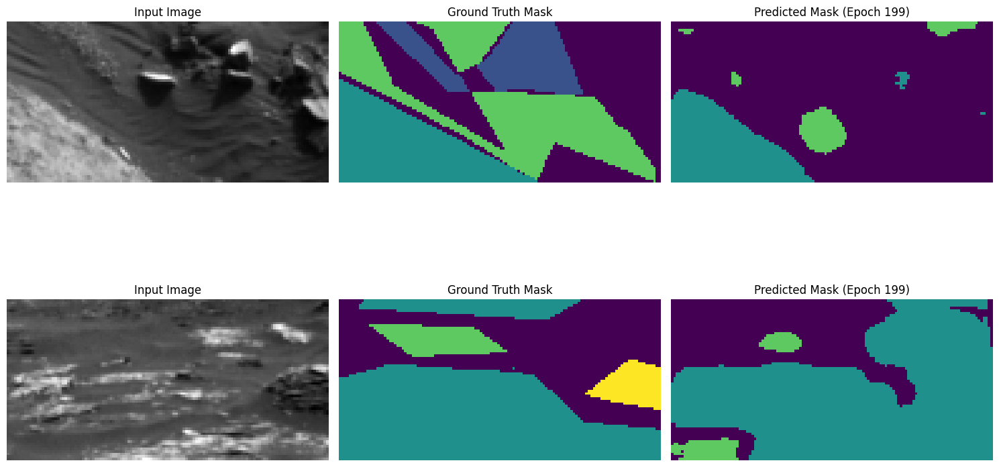

Epoch 200/50, Train Loss: 62.6645, Val Loss: 22.4609, Mean IoU: 0.4176
Class 0 IoU: 0.6132
Class 1 IoU: 0.4841
Class 2 IoU: 0.5733
Class 3 IoU: 0.0000


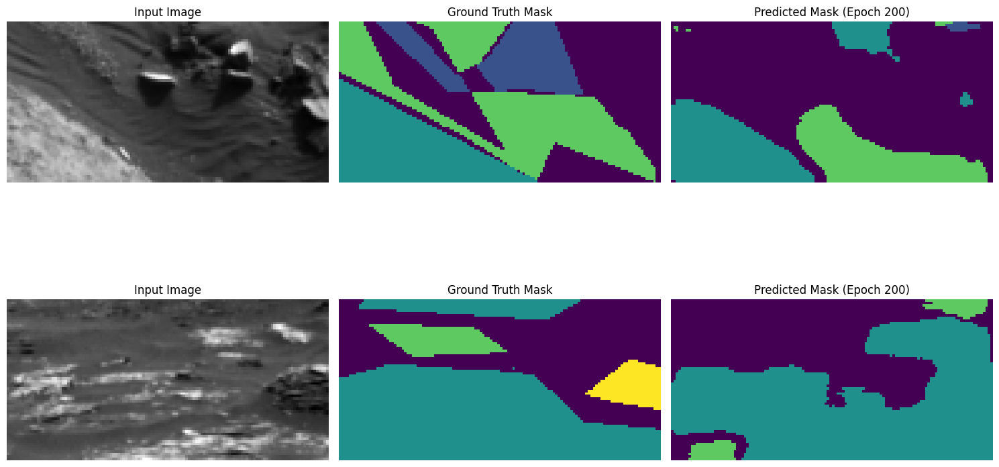

Epoch 201/50, Train Loss: 67.3214, Val Loss: 18.8386, Mean IoU: 0.4242
Class 0 IoU: 0.6243
Class 1 IoU: 0.4834
Class 2 IoU: 0.5614
Class 3 IoU: 0.0279


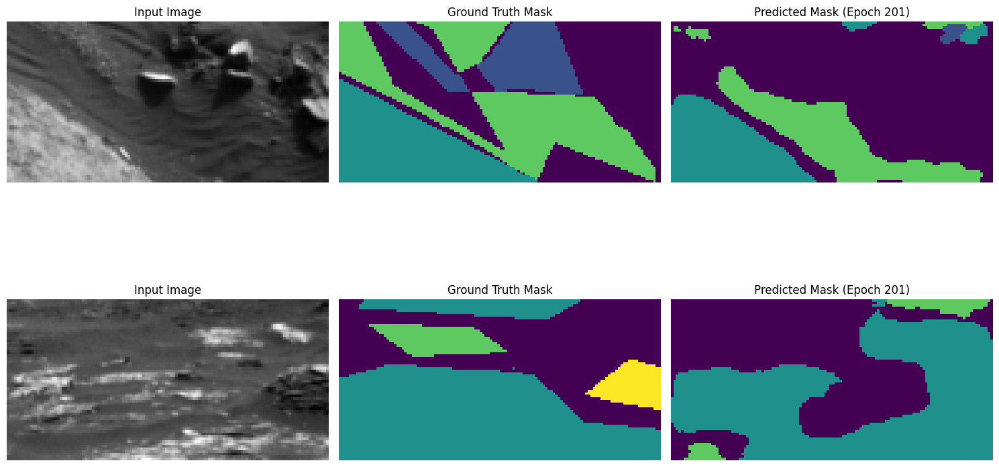

Epoch 202/50, Train Loss: 60.2108, Val Loss: 19.5437, Mean IoU: 0.4403
Class 0 IoU: 0.6461
Class 1 IoU: 0.4960
Class 2 IoU: 0.5945
Class 3 IoU: 0.0247


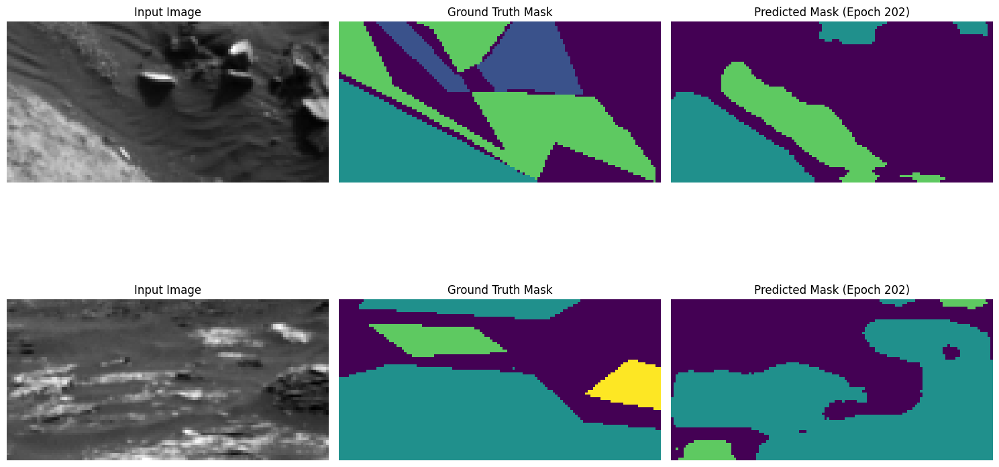

Epoch 203/50, Train Loss: 59.3692, Val Loss: 20.1062, Mean IoU: 0.4317
Class 0 IoU: 0.6349
Class 1 IoU: 0.4891
Class 2 IoU: 0.5913
Class 3 IoU: 0.0117


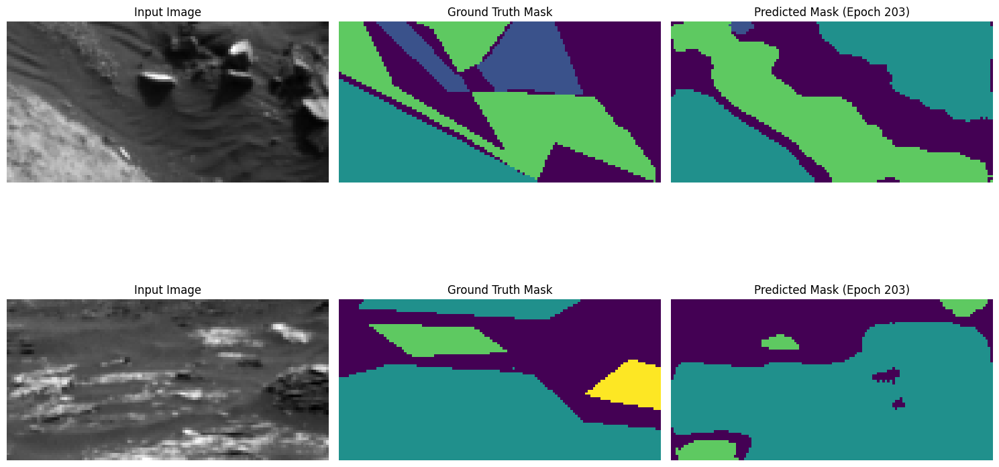

Epoch 204/50, Train Loss: 59.2864, Val Loss: 20.4718, Mean IoU: 0.4111
Class 0 IoU: 0.5552
Class 1 IoU: 0.4724
Class 2 IoU: 0.5909
Class 3 IoU: 0.0260


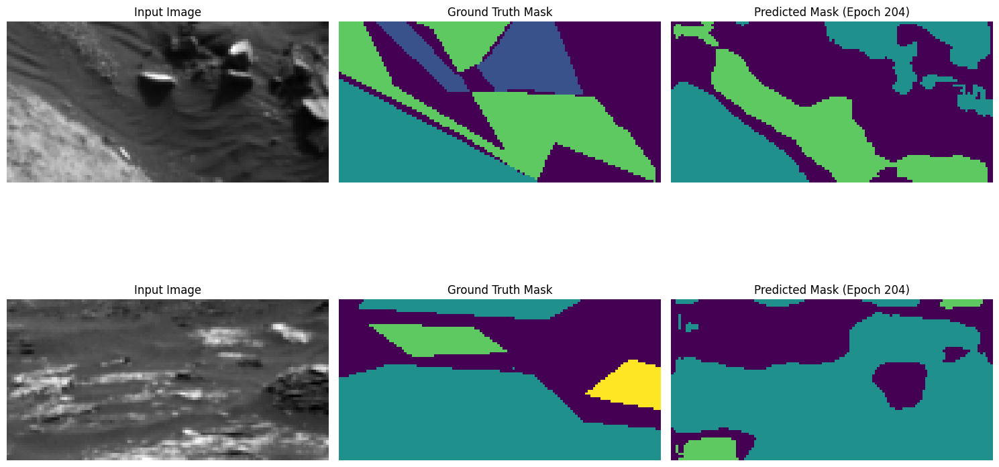

Epoch 205/50, Train Loss: 61.1822, Val Loss: 17.9912, Mean IoU: 0.4485
Class 0 IoU: 0.6519
Class 1 IoU: 0.4767
Class 2 IoU: 0.6065
Class 3 IoU: 0.0591


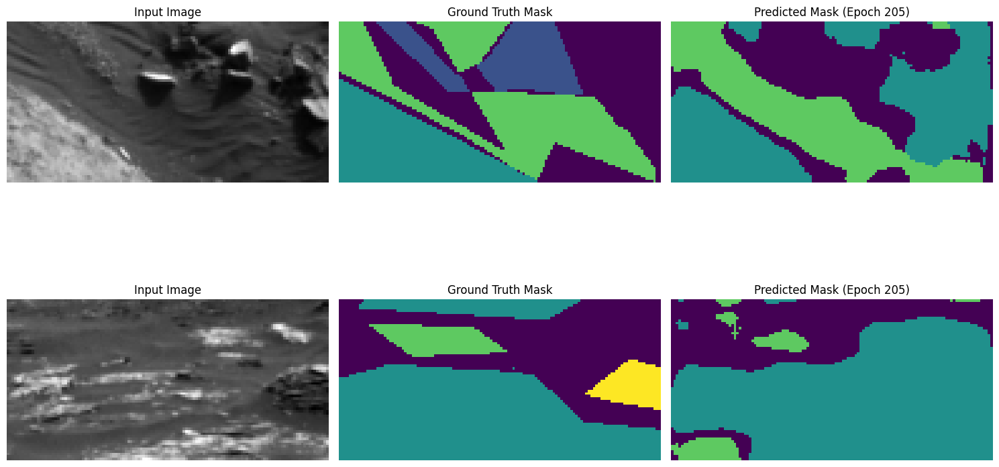

Epoch 206/50, Train Loss: 60.0178, Val Loss: 21.5356, Mean IoU: 0.4409
Class 0 IoU: 0.6484
Class 1 IoU: 0.5025
Class 2 IoU: 0.5896
Class 3 IoU: 0.0232


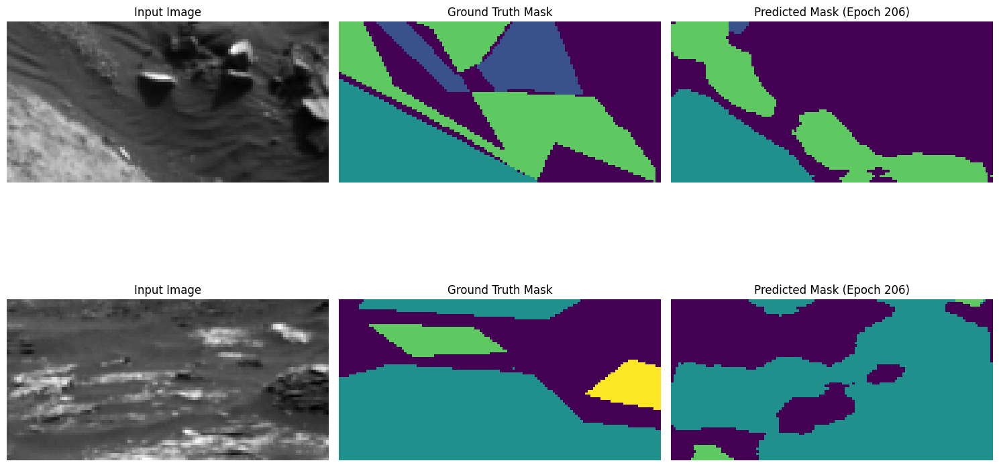

Epoch 207/50, Train Loss: 61.2658, Val Loss: 22.1265, Mean IoU: 0.4316
Class 0 IoU: 0.6394
Class 1 IoU: 0.4826
Class 2 IoU: 0.5937
Class 3 IoU: 0.0109


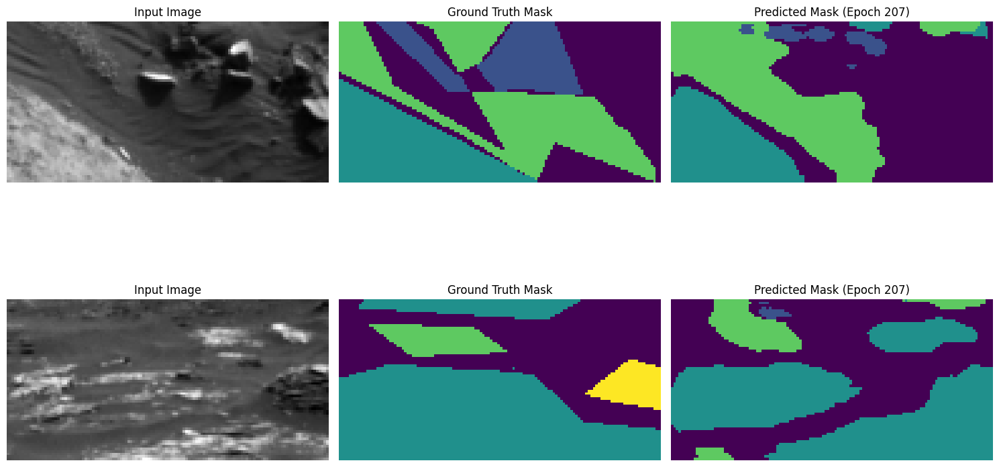

Epoch 208/50, Train Loss: 62.4530, Val Loss: 19.3922, Mean IoU: 0.4285
Class 0 IoU: 0.6195
Class 1 IoU: 0.4679
Class 2 IoU: 0.5920
Class 3 IoU: 0.0347


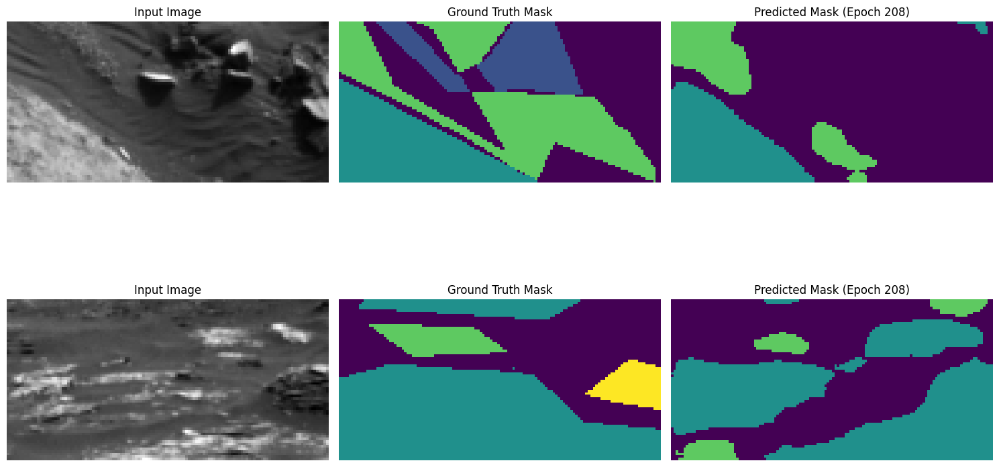

Epoch 209/50, Train Loss: 58.5765, Val Loss: 20.4310, Mean IoU: 0.4191
Class 0 IoU: 0.6309
Class 1 IoU: 0.4767
Class 2 IoU: 0.5636
Class 3 IoU: 0.0051


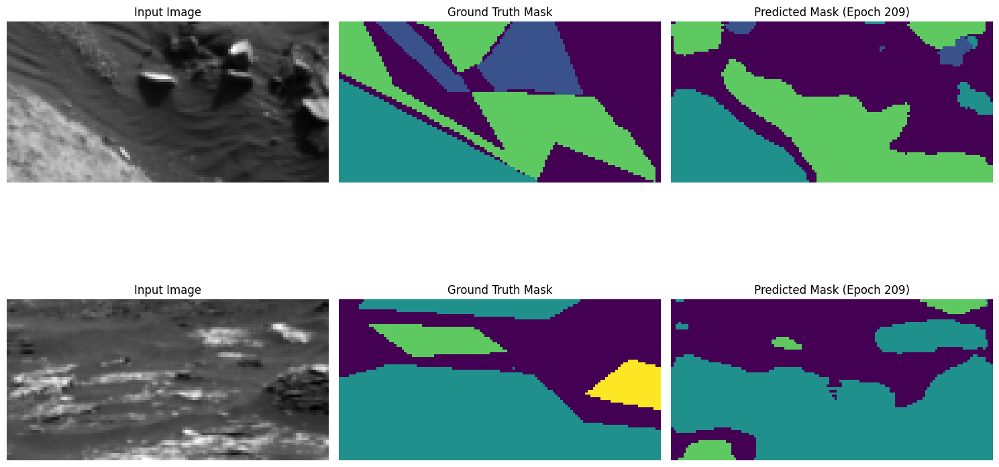

Epoch 210/50, Train Loss: 57.5456, Val Loss: 19.5218, Mean IoU: 0.4256
Class 0 IoU: 0.6242
Class 1 IoU: 0.4726
Class 2 IoU: 0.5767
Class 3 IoU: 0.0289


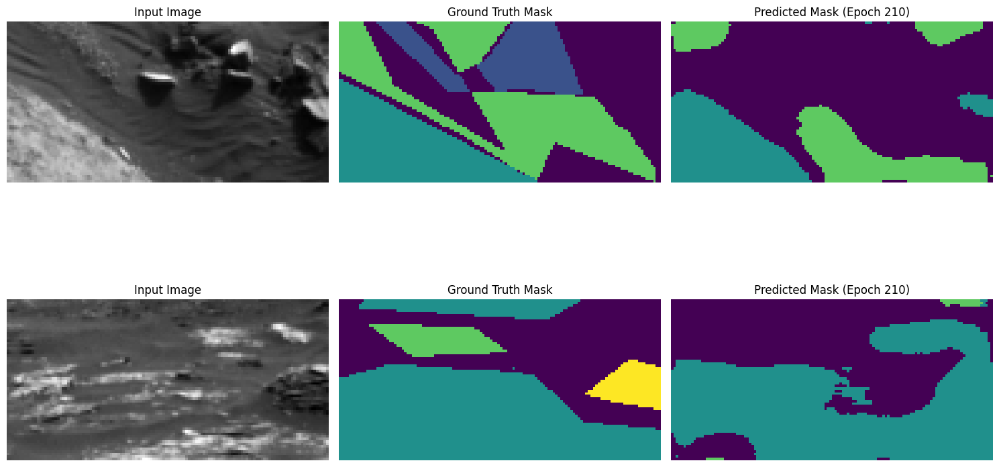

Epoch 211/50, Train Loss: 56.3735, Val Loss: 22.6255, Mean IoU: 0.4233
Class 0 IoU: 0.6299
Class 1 IoU: 0.4849
Class 2 IoU: 0.5694
Class 3 IoU: 0.0091


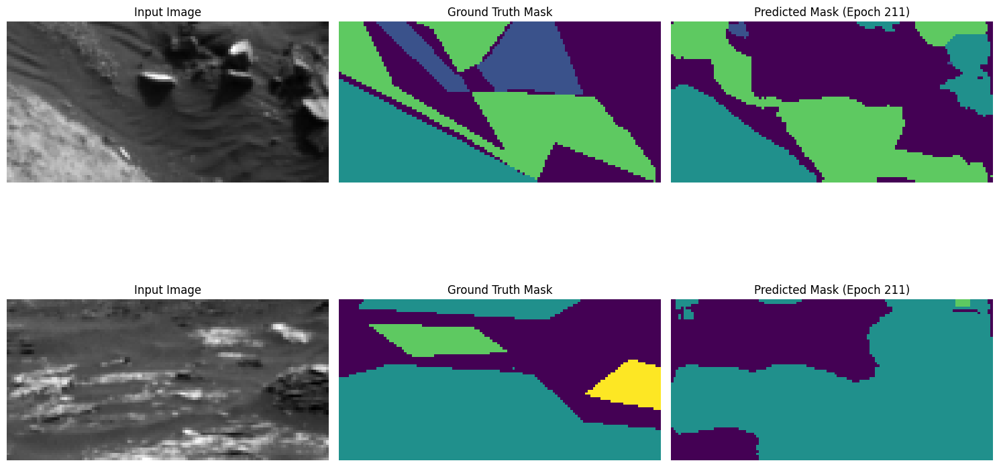

Epoch 212/50, Train Loss: 58.9230, Val Loss: 21.7979, Mean IoU: 0.4235
Class 0 IoU: 0.6047
Class 1 IoU: 0.4751
Class 2 IoU: 0.5911
Class 3 IoU: 0.0230


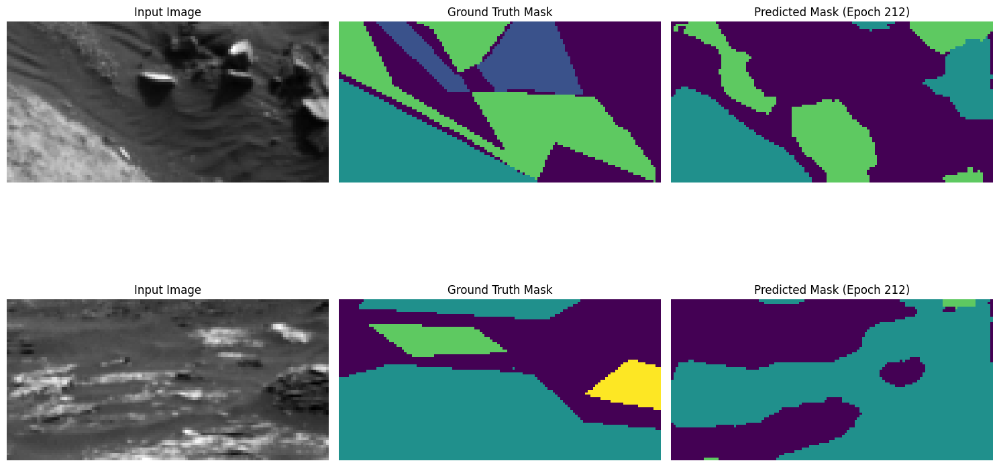

Epoch 213/50, Train Loss: 58.3979, Val Loss: 18.6336, Mean IoU: 0.4320
Class 0 IoU: 0.6223
Class 1 IoU: 0.4835
Class 2 IoU: 0.5816
Class 3 IoU: 0.0403


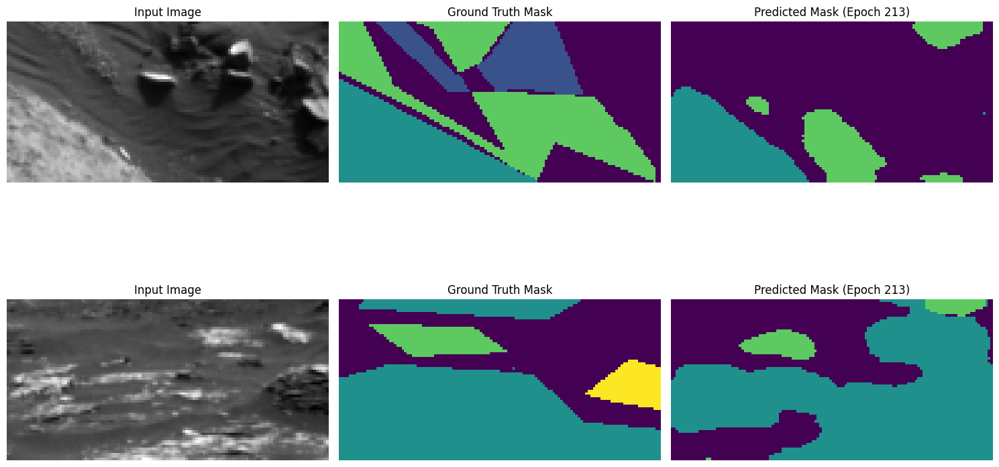

Epoch 214/50, Train Loss: 62.1921, Val Loss: 19.1744, Mean IoU: 0.4362
Class 0 IoU: 0.6421
Class 1 IoU: 0.4841
Class 2 IoU: 0.5801
Class 3 IoU: 0.0387


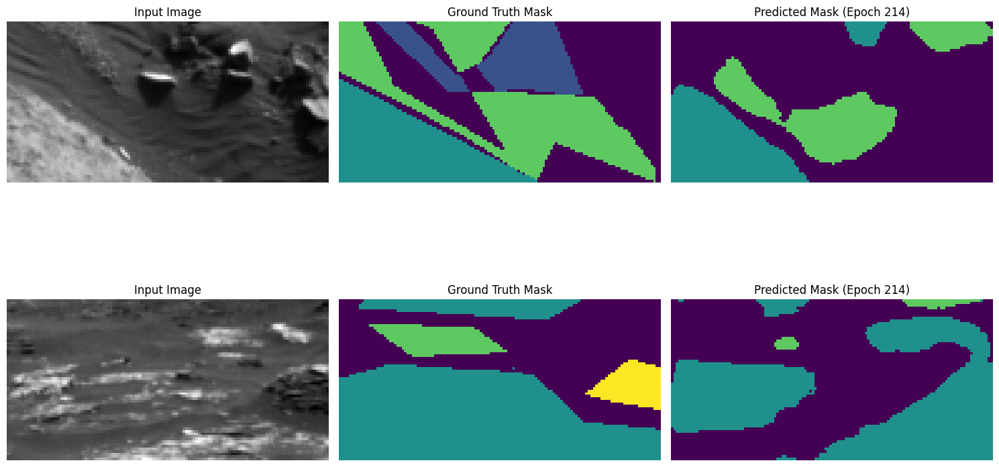

Epoch 215/50, Train Loss: 57.2705, Val Loss: 20.2514, Mean IoU: 0.4341
Class 0 IoU: 0.6394
Class 1 IoU: 0.4933
Class 2 IoU: 0.5822
Class 3 IoU: 0.0214


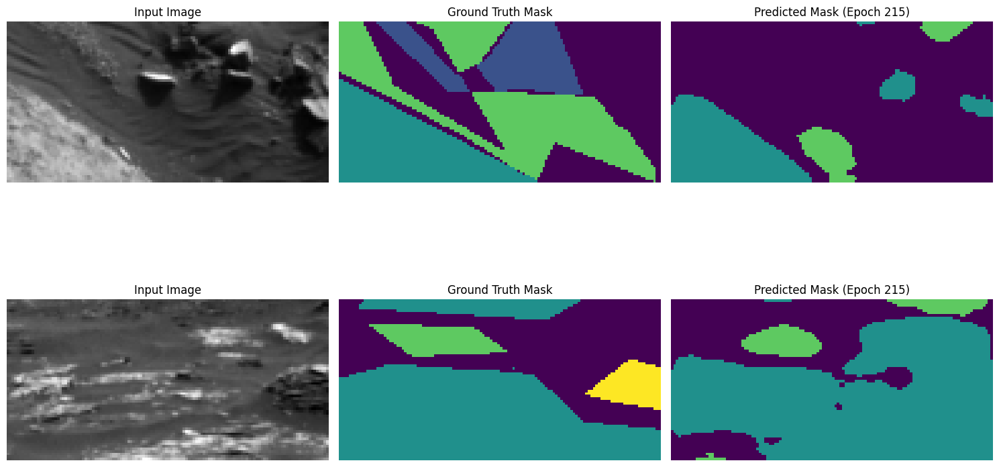

Epoch 216/50, Train Loss: 59.4139, Val Loss: 21.9043, Mean IoU: 0.4239
Class 0 IoU: 0.6263
Class 1 IoU: 0.4835
Class 2 IoU: 0.5807
Class 3 IoU: 0.0049


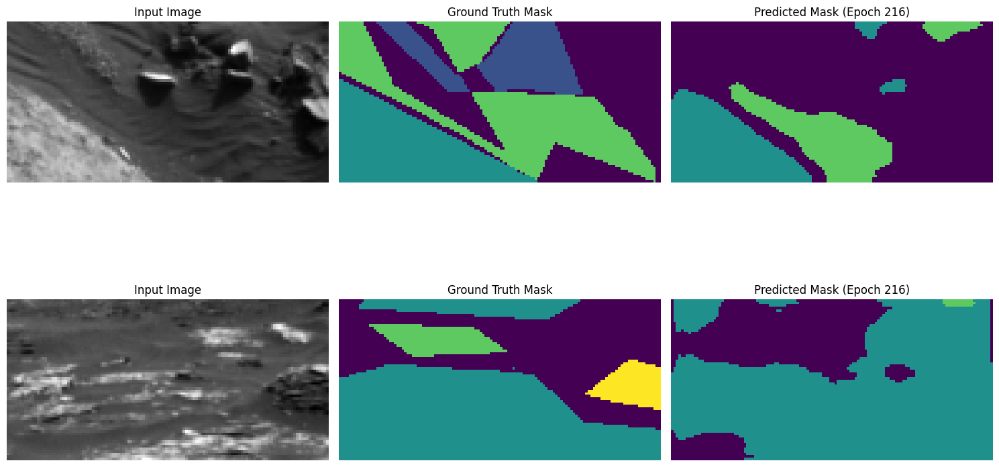

Epoch 217/50, Train Loss: 53.4378, Val Loss: 21.3982, Mean IoU: 0.4294
Class 0 IoU: 0.6368
Class 1 IoU: 0.4933
Class 2 IoU: 0.5719
Class 3 IoU: 0.0158


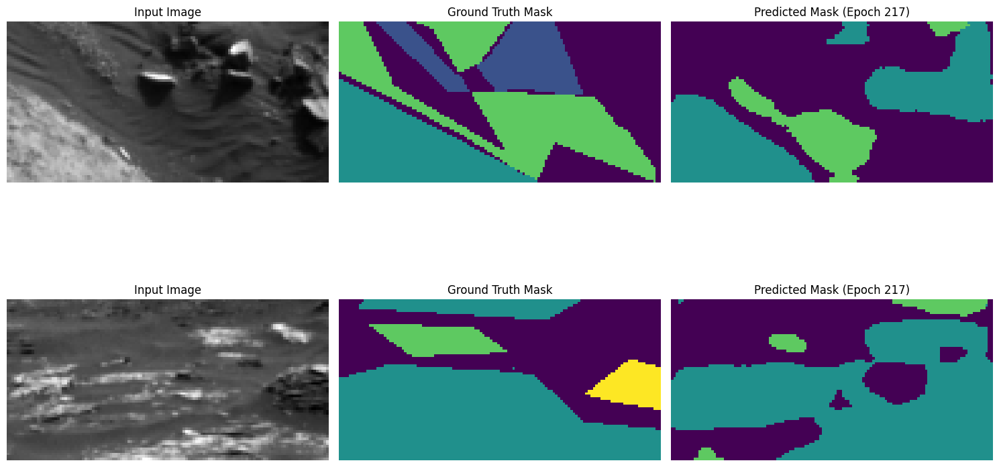

Epoch 218/50, Train Loss: 53.7654, Val Loss: 22.3346, Mean IoU: 0.4226
Class 0 IoU: 0.6347
Class 1 IoU: 0.4884
Class 2 IoU: 0.5636
Class 3 IoU: 0.0038


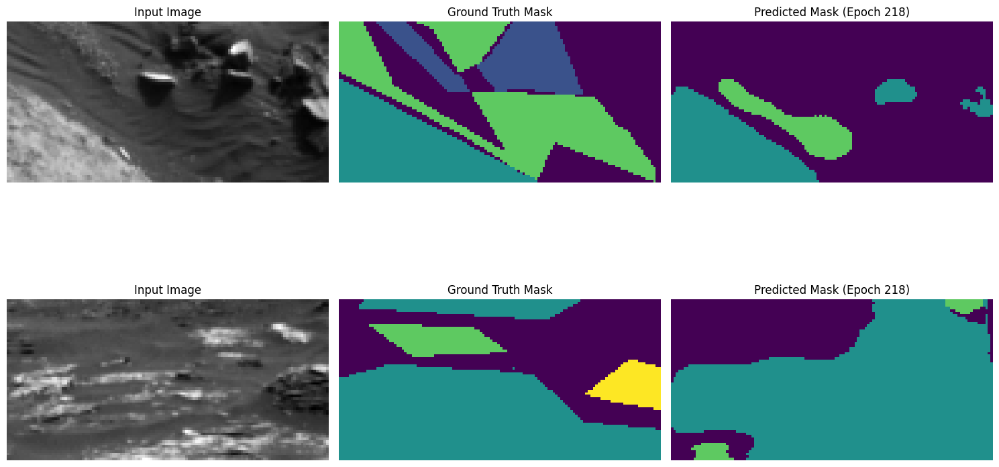

Epoch 219/50, Train Loss: 54.2104, Val Loss: 21.8348, Mean IoU: 0.4263
Class 0 IoU: 0.6408
Class 1 IoU: 0.4801
Class 2 IoU: 0.5743
Class 3 IoU: 0.0102


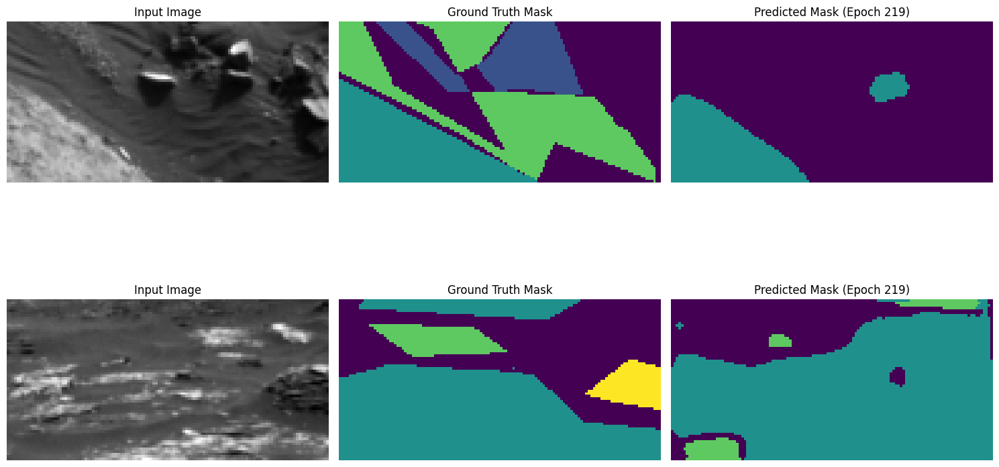

Epoch 220/50, Train Loss: 52.7113, Val Loss: 22.1497, Mean IoU: 0.4245
Class 0 IoU: 0.6269
Class 1 IoU: 0.4805
Class 2 IoU: 0.5731
Class 3 IoU: 0.0175


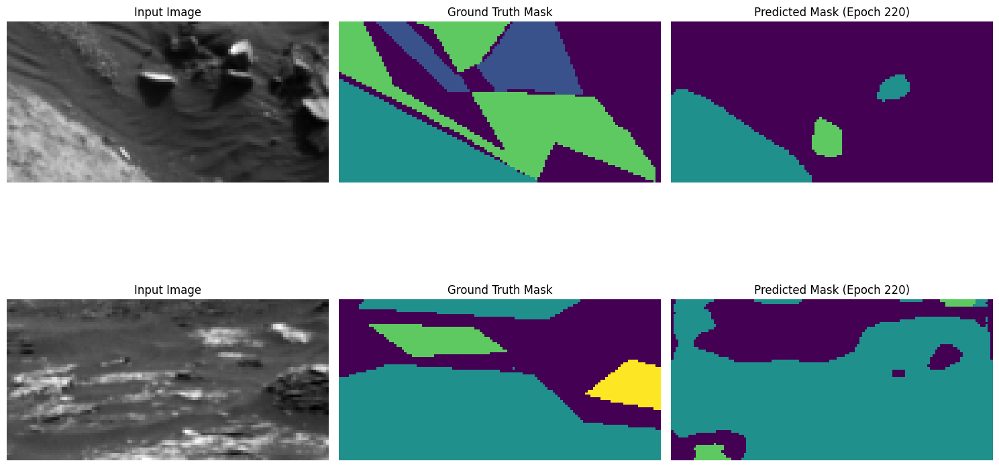

Epoch 221/50, Train Loss: 56.7756, Val Loss: 21.1600, Mean IoU: 0.4308
Class 0 IoU: 0.6364
Class 1 IoU: 0.4749
Class 2 IoU: 0.5945
Class 3 IoU: 0.0175


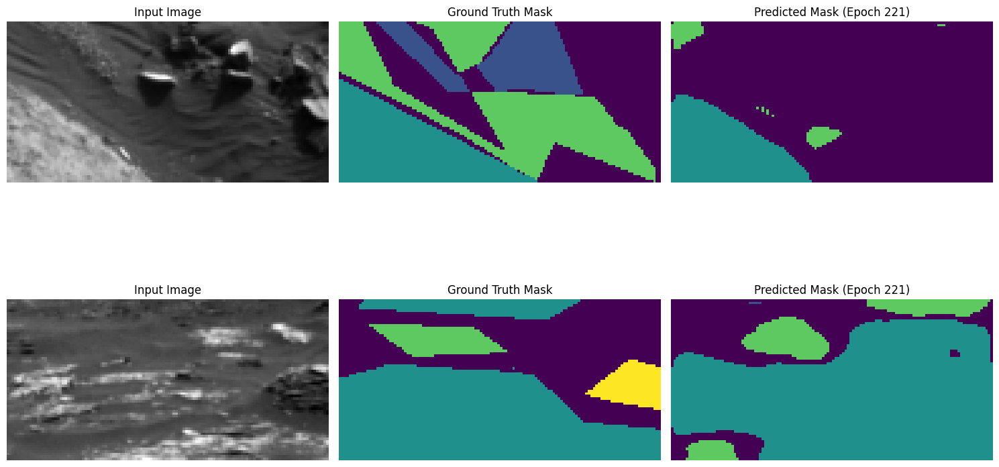

Epoch 222/50, Train Loss: 52.6885, Val Loss: 21.5228, Mean IoU: 0.4249
Class 0 IoU: 0.6367
Class 1 IoU: 0.4694
Class 2 IoU: 0.5783
Class 3 IoU: 0.0152


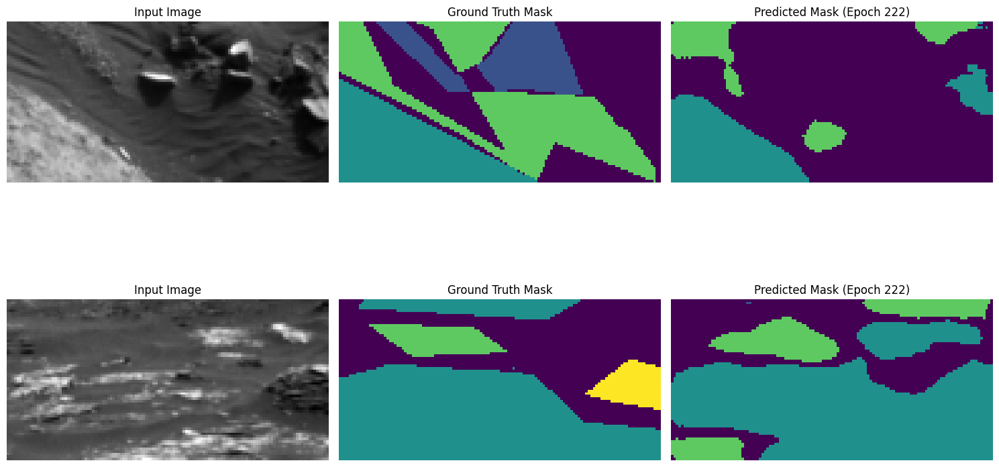

Epoch 223/50, Train Loss: 55.3677, Val Loss: 23.3964, Mean IoU: 0.4202
Class 0 IoU: 0.6327
Class 1 IoU: 0.4735
Class 2 IoU: 0.5591
Class 3 IoU: 0.0153


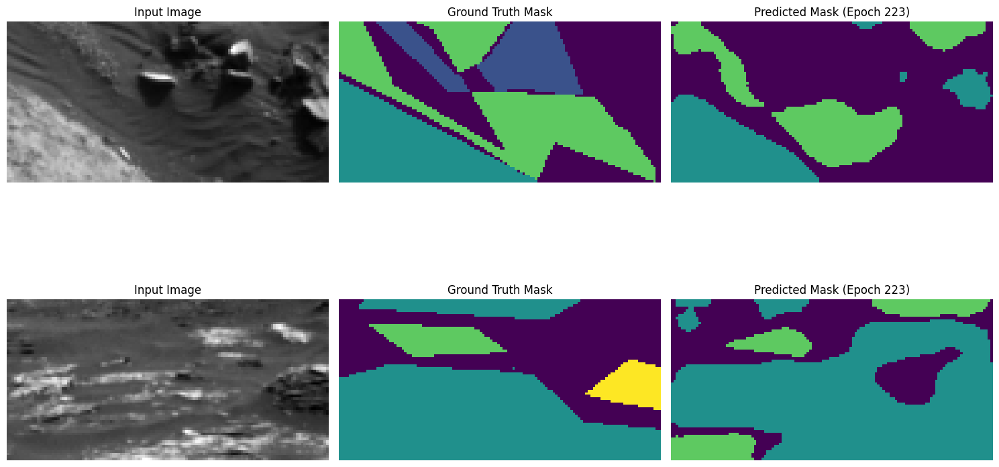

Epoch 224/50, Train Loss: 49.9117, Val Loss: 21.4735, Mean IoU: 0.4250
Class 0 IoU: 0.6230
Class 1 IoU: 0.4740
Class 2 IoU: 0.5834
Class 3 IoU: 0.0197


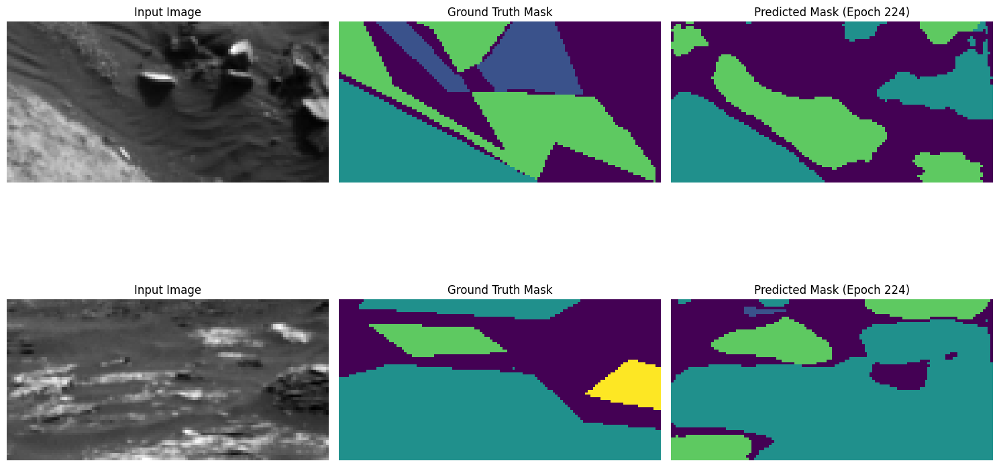

Epoch 225/50, Train Loss: 51.4333, Val Loss: 22.6585, Mean IoU: 0.4291
Class 0 IoU: 0.6362
Class 1 IoU: 0.4773
Class 2 IoU: 0.5782
Class 3 IoU: 0.0246


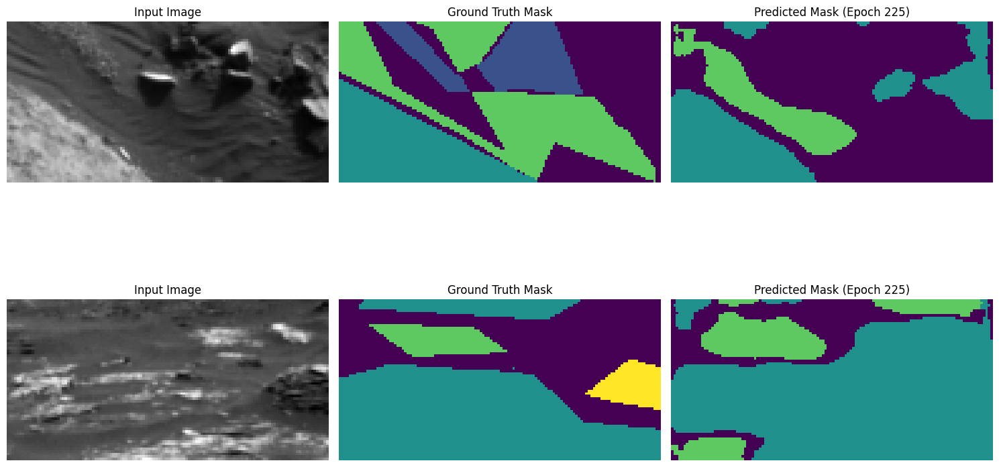

Epoch 226/50, Train Loss: 54.7736, Val Loss: 21.4690, Mean IoU: 0.4332
Class 0 IoU: 0.6456
Class 1 IoU: 0.4786
Class 2 IoU: 0.5900
Class 3 IoU: 0.0187


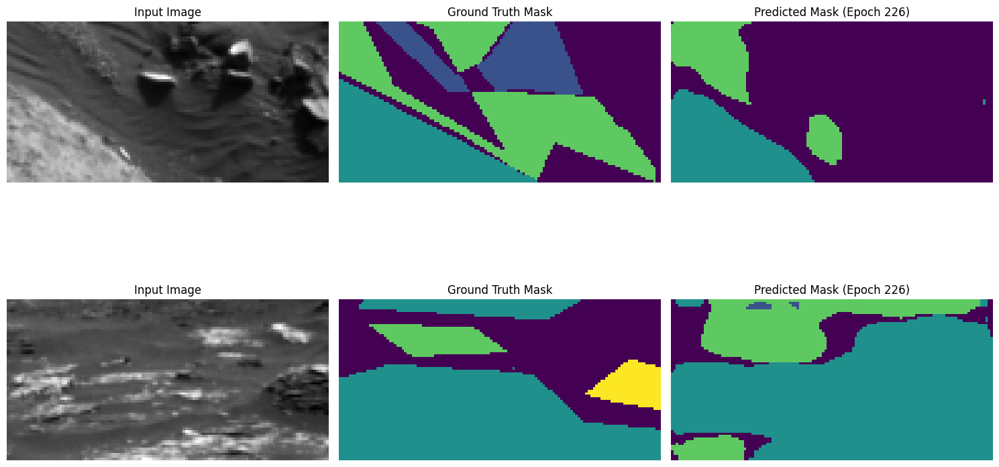

Epoch 227/50, Train Loss: 53.9580, Val Loss: 22.2550, Mean IoU: 0.4343
Class 0 IoU: 0.6447
Class 1 IoU: 0.4846
Class 2 IoU: 0.5988
Class 3 IoU: 0.0092


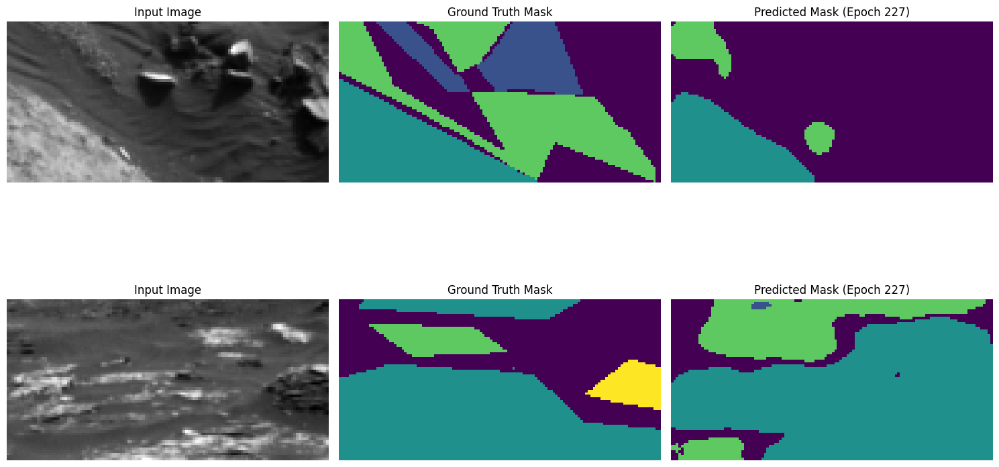

Epoch 228/50, Train Loss: 53.5995, Val Loss: 20.0586, Mean IoU: 0.4383
Class 0 IoU: 0.6572
Class 1 IoU: 0.4960
Class 2 IoU: 0.5795
Class 3 IoU: 0.0204


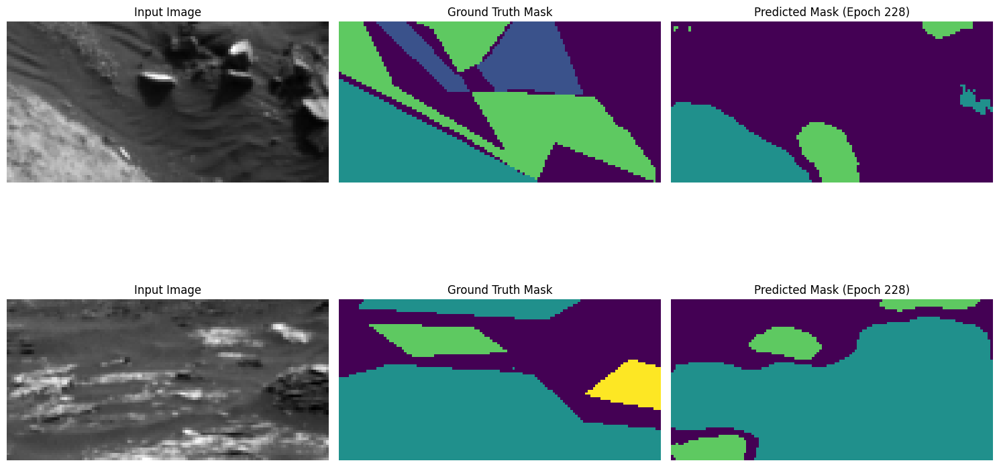

Epoch 229/50, Train Loss: 48.6850, Val Loss: 21.2973, Mean IoU: 0.4302
Class 0 IoU: 0.6440
Class 1 IoU: 0.4690
Class 2 IoU: 0.5841
Class 3 IoU: 0.0237


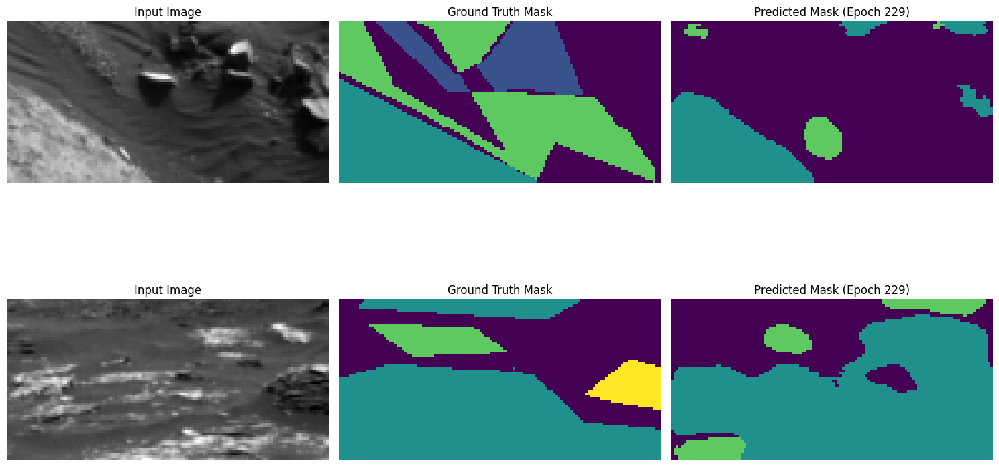

Epoch 230/50, Train Loss: 49.8147, Val Loss: 23.3437, Mean IoU: 0.4092
Class 0 IoU: 0.5952
Class 1 IoU: 0.4570
Class 2 IoU: 0.5746
Class 3 IoU: 0.0100


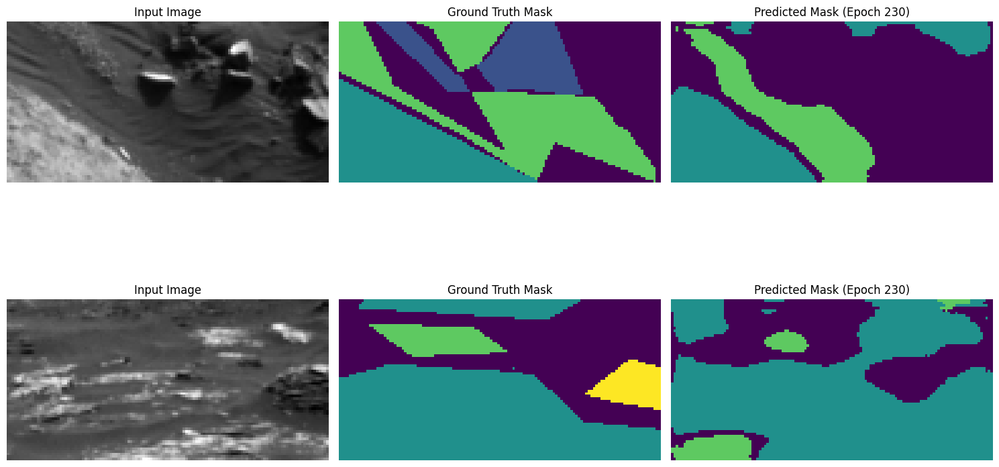

Epoch 231/50, Train Loss: 51.6279, Val Loss: 23.6257, Mean IoU: 0.4120
Class 0 IoU: 0.6325
Class 1 IoU: 0.4614
Class 2 IoU: 0.5389
Class 3 IoU: 0.0151


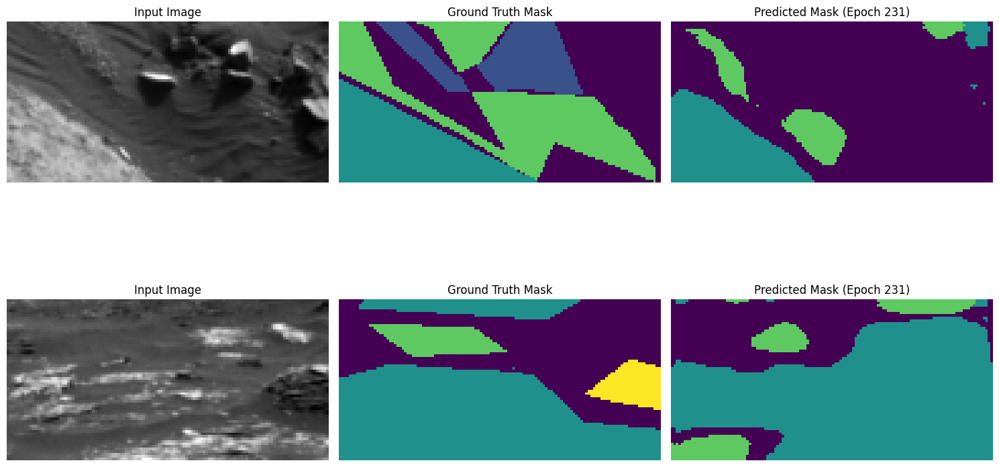

Epoch 232/50, Train Loss: 54.8556, Val Loss: 22.6630, Mean IoU: 0.4106
Class 0 IoU: 0.6054
Class 1 IoU: 0.4582
Class 2 IoU: 0.5572
Class 3 IoU: 0.0218


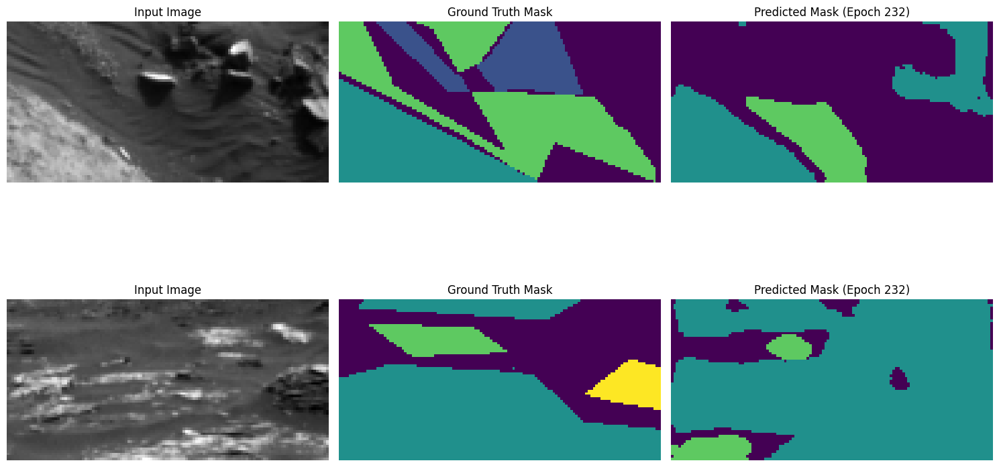

Epoch 233/50, Train Loss: 48.4705, Val Loss: 22.7498, Mean IoU: 0.4151
Class 0 IoU: 0.6013
Class 1 IoU: 0.4647
Class 2 IoU: 0.5824
Class 3 IoU: 0.0120


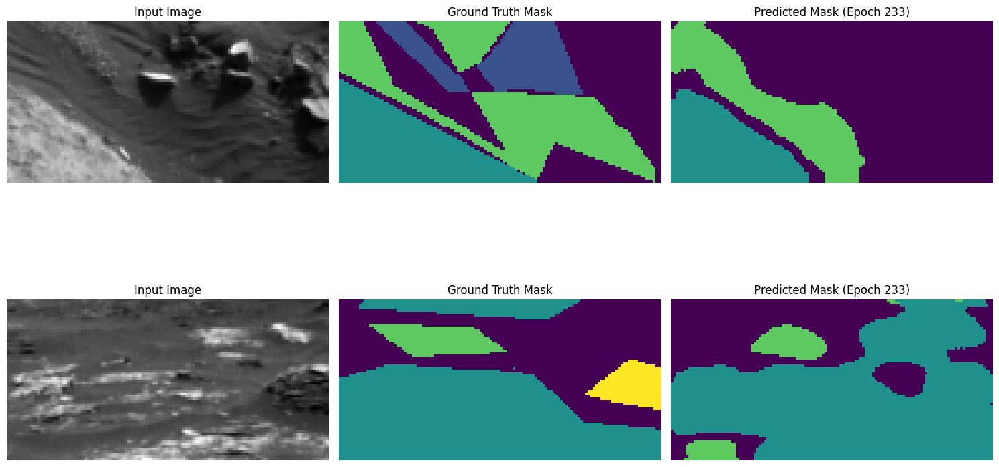

Epoch 234/50, Train Loss: 48.1216, Val Loss: 22.7774, Mean IoU: 0.4128
Class 0 IoU: 0.6173
Class 1 IoU: 0.4625
Class 2 IoU: 0.5638
Class 3 IoU: 0.0075


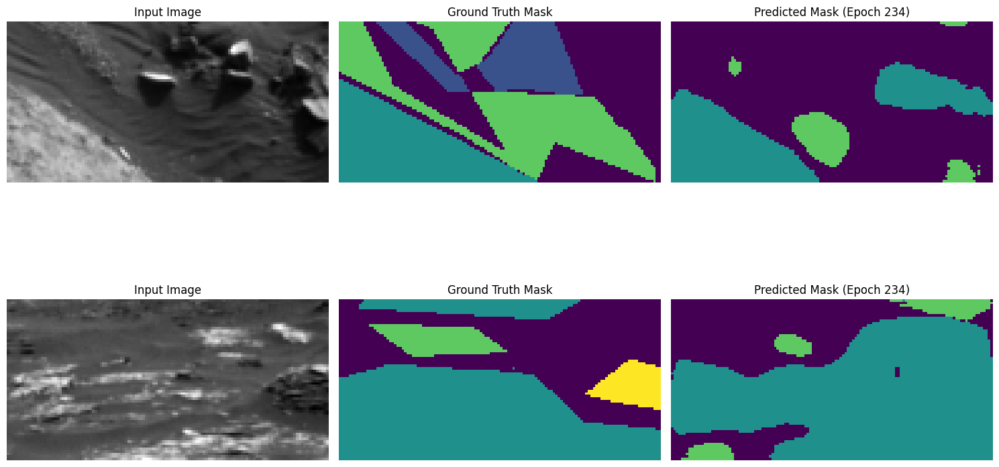

Epoch 235/50, Train Loss: 52.9273, Val Loss: 23.2954, Mean IoU: 0.4126
Class 0 IoU: 0.5965
Class 1 IoU: 0.4515
Class 2 IoU: 0.5824
Class 3 IoU: 0.0201


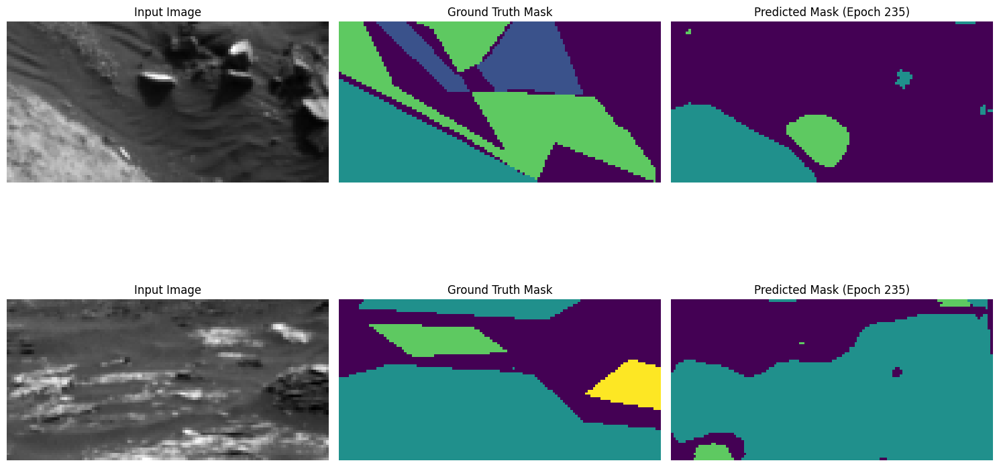

Epoch 236/50, Train Loss: 73.2517, Val Loss: 16.7697, Mean IoU: 0.4302
Class 0 IoU: 0.6349
Class 1 IoU: 0.4688
Class 2 IoU: 0.5744
Class 3 IoU: 0.0426


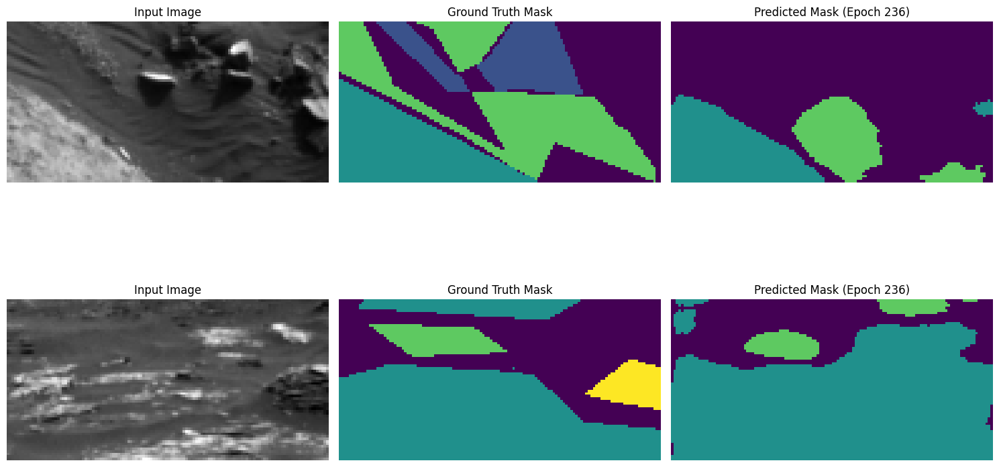

Epoch 237/50, Train Loss: 55.3790, Val Loss: 20.6704, Mean IoU: 0.4196
Class 0 IoU: 0.6291
Class 1 IoU: 0.4670
Class 2 IoU: 0.5703
Class 3 IoU: 0.0122


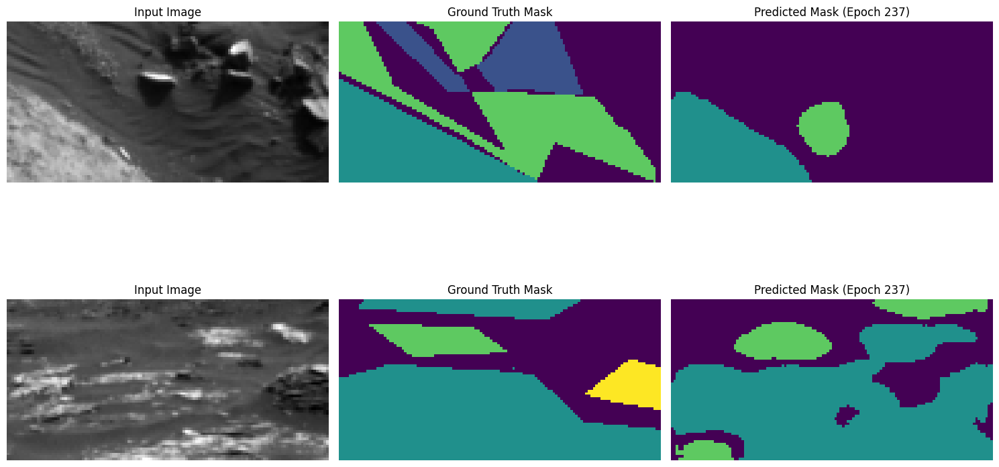

Epoch 238/50, Train Loss: 50.3814, Val Loss: 19.9754, Mean IoU: 0.4274
Class 0 IoU: 0.6282
Class 1 IoU: 0.4745
Class 2 IoU: 0.5870
Class 3 IoU: 0.0200


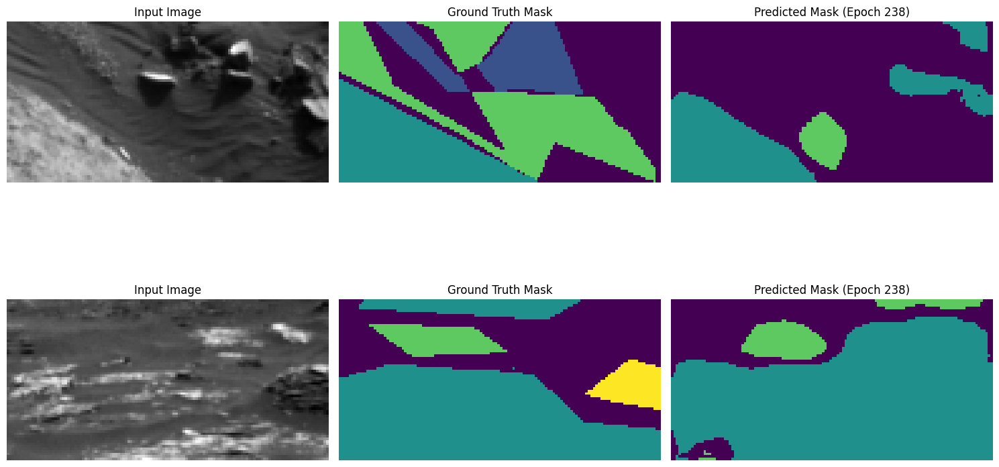

Epoch 239/50, Train Loss: 45.1574, Val Loss: 19.7396, Mean IoU: 0.4337
Class 0 IoU: 0.6442
Class 1 IoU: 0.4782
Class 2 IoU: 0.5816
Class 3 IoU: 0.0307


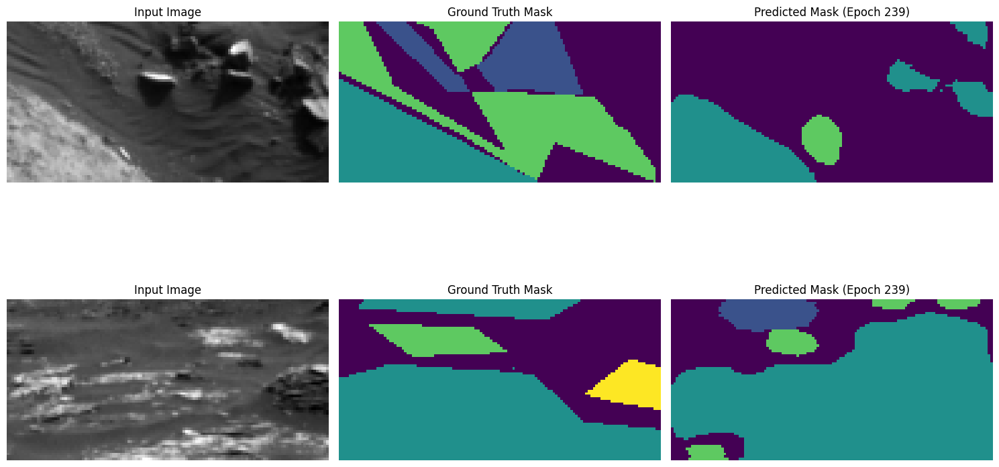

Epoch 240/50, Train Loss: 45.4593, Val Loss: 21.3320, Mean IoU: 0.4300
Class 0 IoU: 0.6350
Class 1 IoU: 0.4799
Class 2 IoU: 0.5854
Class 3 IoU: 0.0196


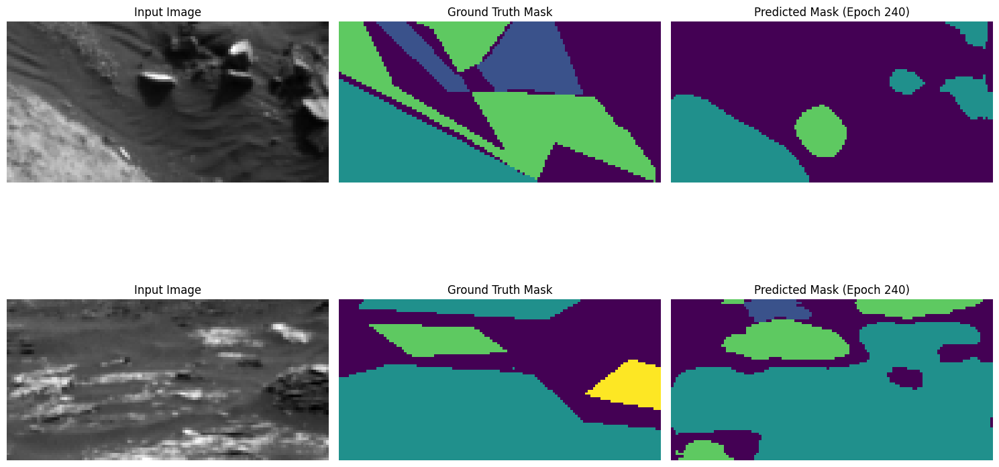

Epoch 241/50, Train Loss: 44.0494, Val Loss: 22.6741, Mean IoU: 0.4220
Class 0 IoU: 0.6261
Class 1 IoU: 0.4816
Class 2 IoU: 0.5624
Class 3 IoU: 0.0181


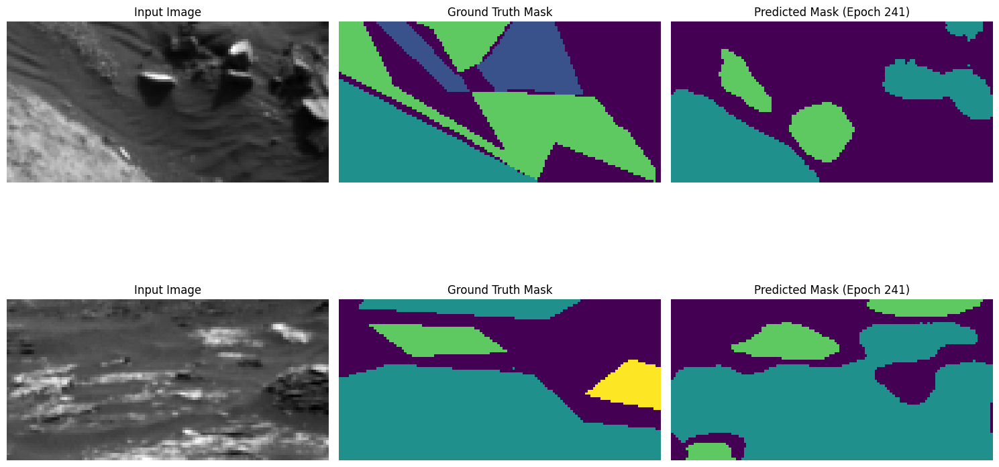

Epoch 242/50, Train Loss: 49.1729, Val Loss: 22.5075, Mean IoU: 0.4306
Class 0 IoU: 0.6344
Class 1 IoU: 0.4816
Class 2 IoU: 0.5860
Class 3 IoU: 0.0206


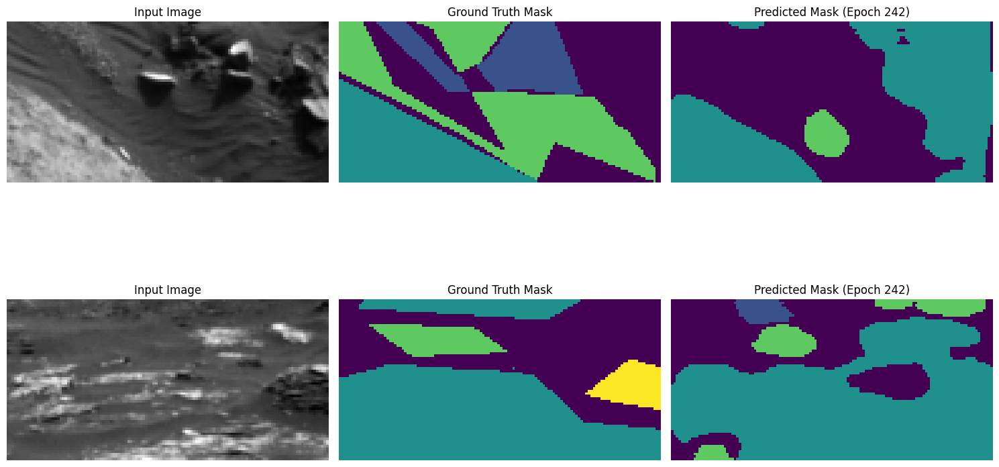

Epoch 243/50, Train Loss: 49.4591, Val Loss: 19.2933, Mean IoU: 0.4446
Class 0 IoU: 0.6470
Class 1 IoU: 0.4896
Class 2 IoU: 0.5671
Class 3 IoU: 0.0748


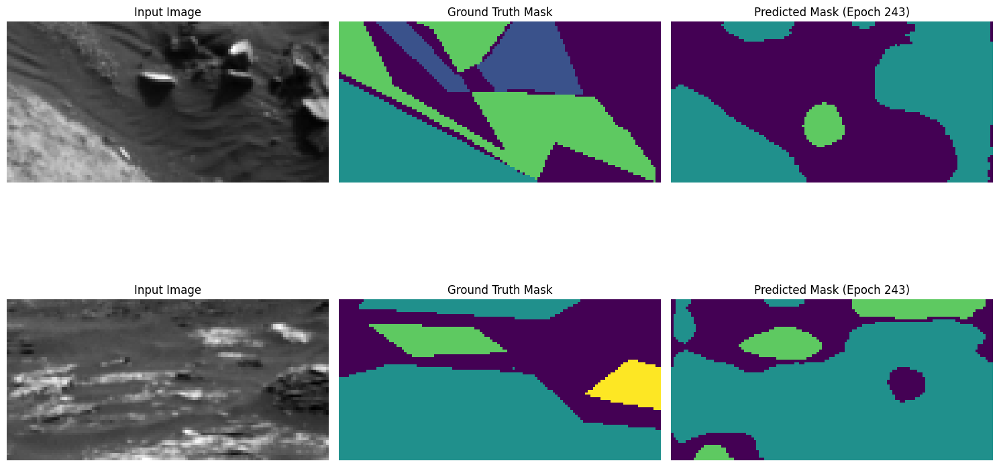

Epoch 244/50, Train Loss: 47.5982, Val Loss: 20.6148, Mean IoU: 0.4231
Class 0 IoU: 0.6178
Class 1 IoU: 0.4638
Class 2 IoU: 0.5703
Class 3 IoU: 0.0405


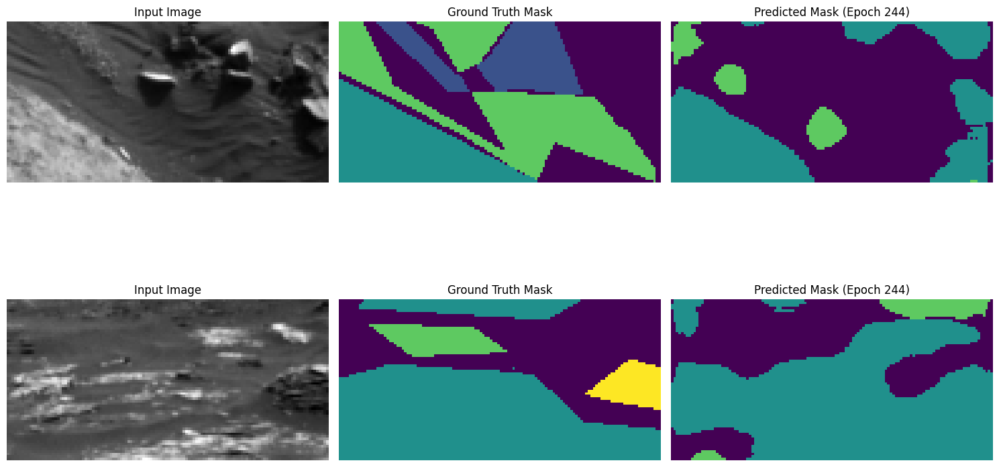

Epoch 245/50, Train Loss: 46.7697, Val Loss: 21.0632, Mean IoU: 0.4350
Class 0 IoU: 0.6472
Class 1 IoU: 0.4744
Class 2 IoU: 0.5840
Class 3 IoU: 0.0346


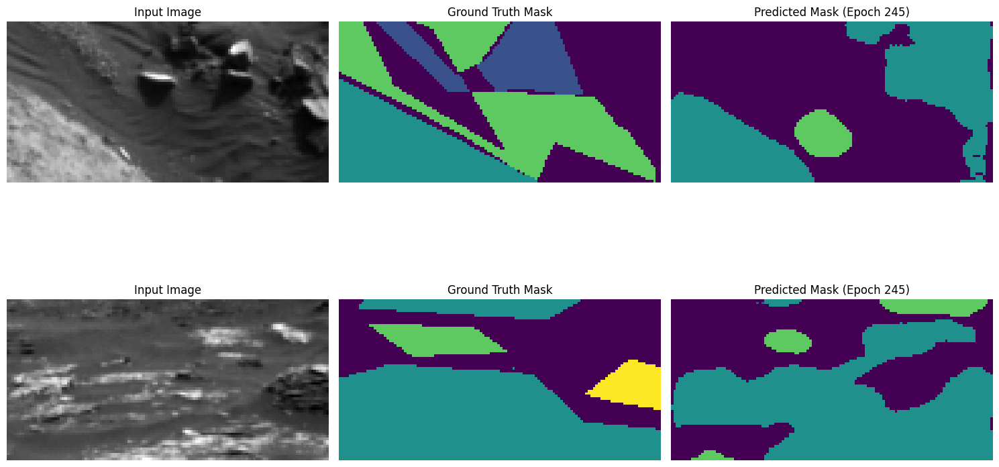

Epoch 246/50, Train Loss: 47.7065, Val Loss: 20.2943, Mean IoU: 0.4313
Class 0 IoU: 0.6297
Class 1 IoU: 0.4833
Class 2 IoU: 0.5694
Class 3 IoU: 0.0427


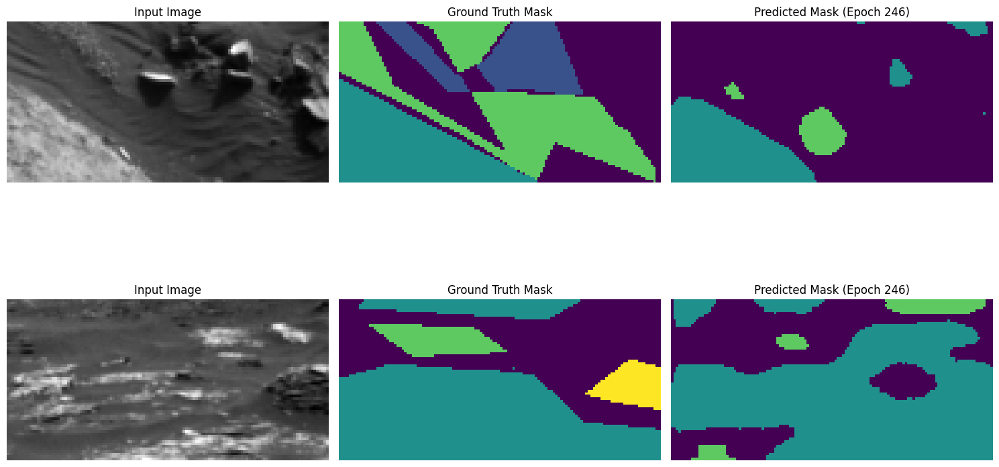

Epoch 247/50, Train Loss: 45.1587, Val Loss: 22.2728, Mean IoU: 0.4417
Class 0 IoU: 0.6574
Class 1 IoU: 0.5106
Class 2 IoU: 0.5772
Class 3 IoU: 0.0216


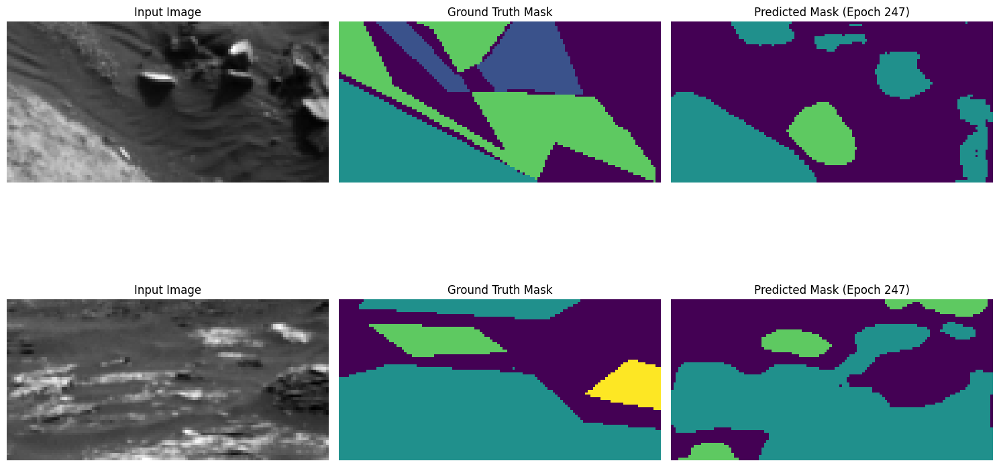

Epoch 248/50, Train Loss: 47.6452, Val Loss: 20.0481, Mean IoU: 0.4455
Class 0 IoU: 0.6455
Class 1 IoU: 0.5076
Class 2 IoU: 0.5701
Class 3 IoU: 0.0587


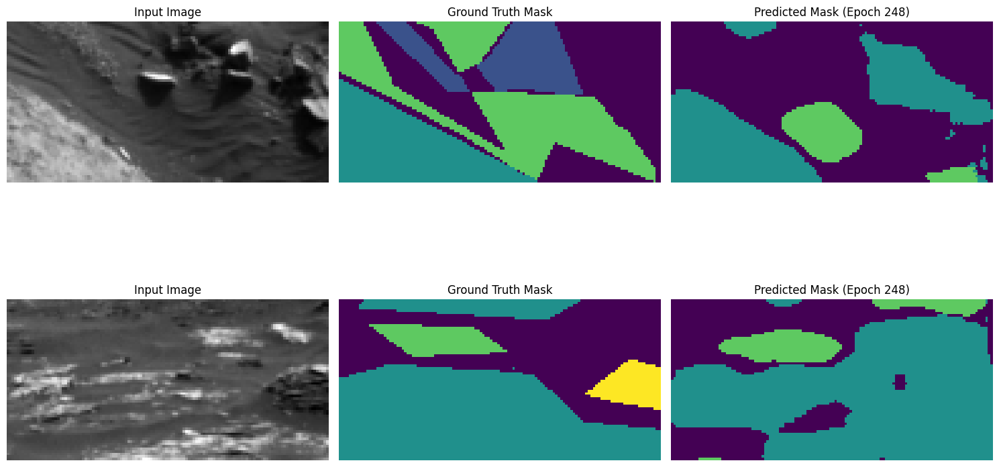

Epoch 249/50, Train Loss: 46.0386, Val Loss: 20.4884, Mean IoU: 0.4313
Class 0 IoU: 0.6297
Class 1 IoU: 0.4778
Class 2 IoU: 0.5549
Class 3 IoU: 0.0626


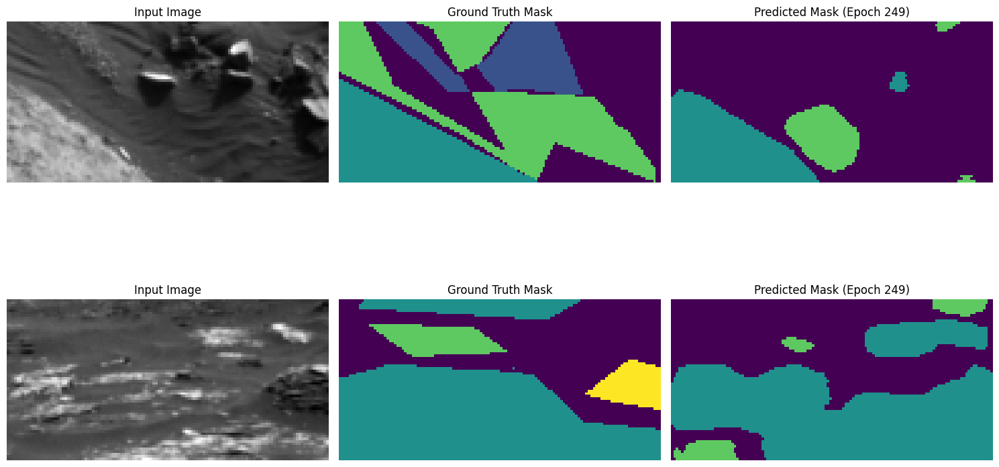

Epoch 250/50, Train Loss: 49.6113, Val Loss: 14.9936, Mean IoU: 0.4455
Class 0 IoU: 0.6364
Class 1 IoU: 0.4908
Class 2 IoU: 0.5710
Class 3 IoU: 0.0837


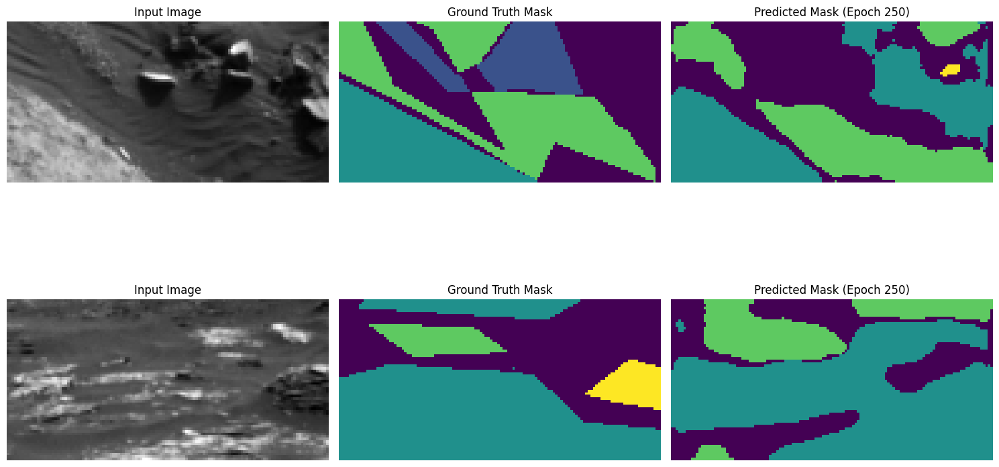

In [43]:
# Weighted Cross-Entropy Loss
class WeightedCrossEntropyLoss(nn.Module):
    def __init__(self, class_weights):
        super(WeightedCrossEntropyLoss, self).__init__()
        self.class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

    def forward(self, logits, targets):
        loss = F.cross_entropy(logits, targets, weight=self.class_weights)
        return loss

criterion = WeightedCrossEntropyLoss(class_weights)
#criterion = torch.nn.CrossEntropyLoss(weight=class_weights)

# Model initialization
def get_model():
    return smp.Unet(
        encoder_name=hyperparams["model"]["encoder_name"],
        encoder_weights=hyperparams["model"]["encoder_weights"],
        in_channels=hyperparams["model"]["input_channels"],
        classes=hyperparams["model"]["num_classes"],
    ).to(device)

model = get_model()
optimizer = torch.optim.Adam(model.parameters(), lr=hyperparams["training"]["learning_rate"])

# Function to calculate mean IoU
def calculate_mean_iou(y_true, y_pred, num_classes, ignore_class=0):
    ious = []
    for c in range(num_classes):
        if c == ignore_class:
            continue
        y_true_c = (y_true == c).astype(int)
        y_pred_c = (y_pred == c).astype(int)
        intersection = (y_true_c & y_pred_c).sum()
        union = (y_true_c | y_pred_c).sum()
        iou = intersection / union if union > 0 else 0.0
        ious.append(iou)
    return np.mean(ious), ious

# Visualize predictions with at least 4 unique classes
def visualize_predictions(images, masks, predictions, epoch):
    # Filter images with at least 4 unique classes in the ground truth masks
    selected_indices = [i for i in range(len(masks)) if len(np.unique(masks[i])) >= 4]

    # Check if at least 2 such images exist
    if len(selected_indices) < 2:
        print("Not enough images with at least 4 unique classes for visualization.")
        return

    # Select the first 2 indices that satisfy the condition
    selected_indices = selected_indices[:2]

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    for idx, i in enumerate(selected_indices):  # Visualize 2 images
        axes[idx, 0].imshow(images[i].squeeze(), cmap="gray")
        axes[idx, 0].set_title("Input Image")
        axes[idx, 1].imshow(masks[i], cmap="viridis", vmin=0, vmax=4)
        axes[idx, 1].set_title("Ground Truth Mask")
        axes[idx, 2].imshow(predictions[i], cmap="viridis", vmin=0, vmax=4)
        axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
        axes[idx, 0].axis("off")
        axes[idx, 1].axis("off")
        axes[idx, 2].axis("off")
    plt.tight_layout()
    plt.show()

# Initialize best_val_mean_iou to a very low value
# Training loop
def train_model(model, train_loader, val_loader, hyperparams):
    best_val_loss = float("inf")
    best_val_mean_iou=0.0
    for epoch in range(hyperparams["training"]["num_epochs"]+200):
        model.train()
        train_loss = 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        # Validation step
        model.eval()
        val_loss = 0.0
        all_predictions = []
        all_masks = []
        all_images = []
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()

                preds = torch.argmax(outputs, dim=1).cpu().numpy()
                all_predictions.extend(preds)
                all_masks.extend(masks.cpu().numpy())
                all_images.extend(images.cpu().numpy())

        # Calculate mean IoU
        mean_iou, per_class_ious = calculate_mean_iou(
            np.array(all_masks).flatten(),
            np.array(all_predictions).flatten(),
            num_classes=hyperparams["model"]["num_classes"],
            ignore_class=0,
        )

        print(f"Epoch {epoch+1}/{hyperparams['training']['num_epochs']}, "
              f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
              f"Mean IoU: {mean_iou:.4f}")

        # Per-class IoU
        for c, iou in enumerate(per_class_ious):
            print(f"Class {c} IoU: {iou:.4f}")

        # Visualization
        visualize_predictions(
            np.array(all_images),  # First 2 validation images
            np.array(all_masks),
            np.array(all_predictions),
            epoch,
        )

        # Save best model based on mean IoU
        if mean_iou > best_val_mean_iou:
            best_val_mean_iou = mean_iou
            torch.save(model.state_dict(), "best_model.pth")
            print(f"Model saved with new best Mean IoU: {best_val_mean_iou:.4f}")

# Train the model
train_model(model, train_loader, val_loader, hyperparams)


In [45]:
# Predict on test set
def predict(model, test_loader):
    model.eval()
    predictions = []
    with torch.no_grad():
        for images in test_loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            predictions.extend(preds)
    return np.array(predictions)

test_dataset = SegmentationDataset(X_test)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
predictions = predict(model, test_loader)

# Save predictions to CSV
def save_predictions_to_csv(predictions, filename="submission.csv"):
    n_samples = predictions.shape[0]
    preds_flat = predictions.reshape(n_samples, -1)
    submission = pd.DataFrame(preds_flat)
    submission["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in submission.columns if col != "id"]
    submission = submission[cols]
    submission.to_csv(filename, index=False)
    print(f"Predictions saved to {filename}")

save_predictions_to_csv(predictions)

Predictions saved to submission.csv
